<!-- codex-purpose-v2 -->
# 06 - V2 GradCAM++ Pseudo Labels

## Purpose
Improve pseudo-label generation by using GradCAM++ and more adaptive mask
extraction.

## Research Thinking
- Durian lesions often appear as multiple spots, edge burns, or fragmented
  necrotic regions.
- GradCAM++ is tested to recover multiple lesion candidates better than plain
  GradCAM.
- This is a clean XAI-side improvement before adding SAM or color rules.

## Inputs / Outputs
- Input: classifier checkpoint and raw training images.
- Output: `data/pseudo_labels_v2_train/`, `data/processed_v2_train/`, and
  V1-vs-V2 coverage comparisons.

## How To Read The Result
Judge V2 by pseudo-mask plausibility and coverage control, not only downstream
IoU against pseudo labels.


# 06 · Pseudo-Label Generation v2 — GradCAM++ Multi-Scale

## Bối cảnh & Động lực

Pseudo-label v1 (NB04) sinh mask bằng GradCAM cơ bản: một target layer duy nhất (`features.8`, 7×7), threshold cố định 0.5, kernel hình vuông. Khi phân tích kết quả training segmentation v1 (NB05), ba vấn đề nổi bật:

- **Mask quá thô**: 7×7 feature map cho heatmap độ phân giải thấp, upscale lên 224×224 tạo ra các blob mờ, biên không rõ — đặc biệt với lớp *Algal Leaf Spot* và *Phomopsis Leaf Spot* có nhiều đốm nhỏ rải rác.
- **Threshold cứng 0.5 không phù hợp**: Mỗi ảnh có distribution heatmap khác nhau. Ảnh có bệnh nhẹ bị under-segment; ảnh có background nổi bật bị over-segment.
- **Healthy Leaf bị nhiễu**: Không có tổn thương thực nhưng GradCAM vẫn kích hoạt, tạo mask nhiễu ~26% coverage.

## Mục tiêu v2

1. **Tăng độ sắc nét** của mask — biên rõ hơn, tách được từng đốm riêng lẻ.
2. **Kiểm soát coverage** theo từng lớp — tránh over-segmentation, đặc biệt các lớp có bệnh lan rộng.
3. **Loại bỏ noise** — giữ chỉ top-K vùng lớn nhất, không lưu mid-size blob rải rác.
4. **Hard-zero Healthy Leaf** — lớp không có lesion thực → mask all-zero, không để model học false positive.

## 6 Cải tiến kỹ thuật

| # | Kỹ thuật | V1 | V2 | Lý do |
|---|----------|----|----|-------|
| 1 | **Target layer** | `features.8` (7×7) | `features.6` + `features.8` | Spatial detail cao hơn — bắt đốm nhỏ mà 7×7 bỏ sót |
| 2 | **CAM method** | GradCAM | GradCAM++ (second-order gradient) | Không bị average-out khi có nhiều instance — phù hợp bệnh đốm rải rác |
| 3 | **Multi-scale fusion** | Single layer | 0.6 × fine + 0.4 × coarse | Fine layer cho biên sắc; coarse layer cho context semantic |
| 4 | **Threshold** | Fixed 0.5 | **Percentile top-K% per class** | Trực tiếp kiểm soát coverage target, không phụ thuộc hình dạng phân phối |
| 5 | **Post-processing** | Rect kernel 5×5 | Ellipse kernel 5×5 + **Top-3 CC ≥ 400px** | Ellipse phù hợp đốm tròn; top-3 CC loại mid-size noise blob |
| 6 | **Healthy Leaf** | Mask từ GradCAM (~26%) | **All-zero mask** | Không có lesion thực → không nên có mask |

**Coverage targets:** ALGAL=18%, ALLOCARIDARA=20%, LEAF\_BLIGHT=22%, PHOMOPSIS=18%, HEALTHY=0%

**Output:** Masks → `data/pseudo_labels_v2_train/` · Ảnh → `data/processed_v2_train/` · Figures → `visualizations/pseudo_labeling_v2/`

In [1]:
import os
import sys
import json
import random
from pathlib import Path
from collections import defaultdict

# Project root discovery: chạy ổn khi mở notebook từ project root hoặc thư mục notebooks/.
PROJECT_ROOT = Path.cwd().resolve()
if not (PROJECT_ROOT / 'utils').exists() and (PROJECT_ROOT.parent / 'utils').exists():
    PROJECT_ROOT = PROJECT_ROOT.parent.resolve()
proj_root = str(PROJECT_ROOT)

sys.path.insert(0, proj_root)
sys.path.insert(0, str(PROJECT_ROOT / 'utils'))

import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd
import cv2
from tqdm import tqdm
from PIL import Image
import torch
import torch.nn as nn
from torchvision import transforms

from utils.models import EfficientNetClassifier

# Reproducibility — quan trọng vì pseudo-label sẽ trở thành training target cho segmentation.
SEED = 42
random.seed(SEED)
np.random.seed(SEED)
torch.manual_seed(SEED)
if torch.cuda.is_available():
    torch.cuda.manual_seed_all(SEED)
    torch.backends.cudnn.deterministic = True
    torch.backends.cudnn.benchmark = False

# Plot style — nhất quán với notebook 01-04
plt.style.use('default')
sns.set_palette("husl")

# Class metadata — nhất quán với notebook 01-04
CLASS_NAMES  = ["ALGAL_LEAF_SPOT", "ALLOCARIDARA_ATTACK", "HEALTHY_LEAF", "LEAF_BLIGHT", "PHOMOPSIS_LEAF_SPOT"]
CLASS_LABELS = ["Algal Leaf Spot", "Allocaridara Attack", "Healthy Leaf", "Leaf Blight", "Phomopsis Leaf Spot"]
CLASS_COLORS = ["#E69F00", "#56B4E9", "#009E73", "#0072B2", "#D55E00"]
CLASS_TO_IDX = {name: i for i, name in enumerate(CLASS_NAMES)}
IDX_TO_LABEL = {i: label for i, label in enumerate(CLASS_LABELS)}
IDX_TO_CLASS = {i: name for i, name in enumerate(CLASS_NAMES)}

VIZ_DIR = PROJECT_ROOT / "visualizations" / "pseudo_labeling_v2"
VIZ_DIR.mkdir(parents=True, exist_ok=True)

device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
print(f"Device: {device}")
print(f"proj_root: {proj_root}")
print(f"seed: {SEED}")

Device: cuda
proj_root: E:\Master\thesis-clean
seed: 42


## Load Data + Model

Cùng 3,104 ảnh train với notebook 03-04. Class index gán theo thứ tự alphabet của CLASS_NAMES — nhất quán với `ImageFolder` trong notebook 02.

Load `best_model.pth` — cùng checkpoint với notebook 03-04 để đảm bảo pseudo-label v2 sinh ra từ cùng một model, có thể so sánh công bằng với v1.

In [2]:
train_dir = PROJECT_ROOT / 'notebooks' / 'data' / 'raw' / 'train'
print(f"Train dir: {train_dir}")

selected_samples = []
for cls_name in CLASS_NAMES:
    cls_dir = Path(train_dir) / cls_name
    cls_idx = CLASS_TO_IDX[cls_name]
    imgs = sorted(list(cls_dir.glob("*.jpg")) + list(cls_dir.glob("*.png")))
    for img_path in imgs:
        selected_samples.append((str(img_path), cls_idx, cls_name))
    print(f"  {cls_name}: {len(imgs)} ảnh")

print(f"\nTổng: {len(selected_samples)} ảnh")

Train dir: E:\Master\thesis-clean\notebooks\data\raw\train
  ALGAL_LEAF_SPOT: 513 ảnh
  ALLOCARIDARA_ATTACK: 639 ảnh
  HEALTHY_LEAF: 683 ảnh
  LEAF_BLIGHT: 655 ảnh
  PHOMOPSIS_LEAF_SPOT: 614 ảnh

Tổng: 3104 ảnh


In [3]:
model = EfficientNetClassifier(num_classes=len(CLASS_NAMES), backbone='efficientnet_b0', pretrained=False)

ckpt_path = PROJECT_ROOT / 'notebooks' / 'models' / 'classification' / 'checkpoints' / 'best_model.pth'
if not ckpt_path.exists():
    raise FileNotFoundError(f"Không tìm thấy {ckpt_path}. Chạy notebook 02 trước.")

checkpoint = torch.load(str(ckpt_path), map_location=device, weights_only=False)
model.load_state_dict(checkpoint['model_state_dict'])
model.to(device).eval()
val_acc = checkpoint.get('val_acc', None)
print(f"Loaded: {ckpt_path}")
print(f"Validation accuracy at save: {val_acc:.4f}" if val_acc is not None else "Validation accuracy at save: N/A")

Loaded: E:\Master\thesis-clean\notebooks\models\classification\checkpoints\best_model.pth
Validation accuracy at save: 0.9842


## GradCAM++ Multi-Scale Setup

Hai target layer thay vì một:
- **`features.6`**: spatial resolution cao hơn → bắt được các đốm nhỏ mà 7×7 không đủ chi tiết
- **`features.8` (7×7)**: semantic context, biết "đây là vùng bệnh" nhưng không biết chính xác pixel nào

Fusion theo weighted sum (0.6×fine + 0.4×coarse): ưu tiên fine map để mask sắc nét hơn, nhưng vẫn giữ context từ coarse layer.

GradCAM++ dùng second-order gradient approximation thay vì chỉ average gradient của GradCAM — tốt hơn khi có nhiều instance của cùng class trong một ảnh (nhiều đốm rời).

In [4]:
def get_last_conv_in_block(model, block_idx):
    """Lấy tên Conv2d cuối cùng trong features block chỉ định."""
    prefix = f'base.features.{block_idx}'
    candidates = []
    for name, module in model.named_modules():
        if name.startswith(prefix) and isinstance(module, nn.Conv2d):
            candidates.append(name)
    if not candidates:
        raise ValueError(f'Không tìm thấy Conv2d trong {prefix}')
    return candidates[-1]


def inspect_feature_shapes(model, input_size=(1, 3, 224, 224)):
    """In spatial size của các block EfficientNet để tránh chọn nhầm layer."""
    shapes = {}
    hooks = []
    modules = dict(model.named_modules())
    for block_idx in range(0, 9):
        name = f'base.features.{block_idx}'
        if name not in modules:
            continue
        def make_hook(key):
            def hook(module, inp, out):
                shapes[key] = tuple(out.shape)
            return hook
        hooks.append(modules[name].register_forward_hook(make_hook(name)))
    with torch.no_grad():
        _ = model(torch.zeros(input_size, device=device))
    for h in hooks:
        h.remove()
    return shapes


feature_shapes = inspect_feature_shapes(model)
print("EfficientNet-B0 feature block resolutions:")
for name, shape in feature_shapes.items():
    print(f"  {name:<16} -> {shape}")

# Quay lại cấu hình ban đầu sau layer sweep: features.6 + features.8.
# Sweep cho thấy features.5/features.4 bắt nền/texture mạnh hơn trên PHOMOPSIS.
layer_fine_name = get_last_conv_in_block(model, 6)
layer_coarse_name = get_last_conv_in_block(model, 8)

print('\nSelected GradCAM++ layers:')
print('Layer fine  (features.6):', layer_fine_name, '| shape:', feature_shapes.get('base.features.6'))
print('Layer coarse(features.8):', layer_coarse_name, '| shape:', feature_shapes.get('base.features.8'))

EfficientNet-B0 feature block resolutions:
  base.features.0  -> (1, 32, 112, 112)
  base.features.1  -> (1, 16, 112, 112)
  base.features.2  -> (1, 24, 56, 56)
  base.features.3  -> (1, 40, 28, 28)
  base.features.4  -> (1, 80, 14, 14)
  base.features.5  -> (1, 112, 14, 14)
  base.features.6  -> (1, 192, 7, 7)
  base.features.7  -> (1, 320, 7, 7)
  base.features.8  -> (1, 1280, 7, 7)

Selected GradCAM++ layers:
Layer fine  (features.6): base.features.6.3.block.3.0 | shape: (1, 192, 7, 7)
Layer coarse(features.8): base.features.8.0 | shape: (1, 1280, 7, 7)


In [5]:
class MultiScaleGradCAMpp:
    """
    GradCAM++ trên 2 layer (fine 14×14 + coarse 7×7), fuse bằng weighted sum.
    GradCAM++ weights dùng second-order gradient approximation (tốt hơn GradCAM
    cho bệnh có nhiều đốm nhỏ vì không bị average-out).
    """

    def __init__(self, model, layer_fine_name, layer_coarse_name, device, weight_fine=0.6):
        self.model = model.to(device)
        self.model.eval()
        self.device = device
        self.weight_fine   = weight_fine
        self.weight_coarse = 1.0 - weight_fine

        modules = dict(model.named_modules())
        self.layer_fine   = modules[layer_fine_name]
        self.layer_coarse = modules[layer_coarse_name]

        self.activations = {}
        self.gradients   = {}

        self.layer_fine.register_forward_hook(self._activation_hook('fine'))
        self.layer_fine.register_full_backward_hook(self._gradient_hook('fine'))
        self.layer_coarse.register_forward_hook(self._activation_hook('coarse'))
        self.layer_coarse.register_full_backward_hook(self._gradient_hook('coarse'))

    def _activation_hook(self, name):
        def hook(module, inp, out):
            self.activations[name] = out.detach().cpu()
        return hook

    def _gradient_hook(self, name):
        def hook(module, grad_in, grad_out):
            self.gradients[name] = grad_out[0].detach().cpu()
        return hook

    def _gradcampp_single(self, act_tensor, grad_tensor, out_size):
        """Tính GradCAM++ map từ activations + gradients của 1 layer."""
        act  = act_tensor[0].numpy()   # [C, H, W]
        grad = grad_tensor[0].numpy()  # [C, H, W]

        eps   = 1e-7
        grad2 = grad ** 2
        grad3 = grad ** 3
        # sum activations per channel  → [C, 1, 1]
        sum_act = np.sum(act, axis=(1, 2), keepdims=True)
        denom   = 2.0 * grad2 + sum_act * grad3 + eps
        alpha   = grad2 / denom                                     # [C, H, W]
        weights = np.sum(alpha * np.maximum(grad, 0), axis=(1, 2))  # [C]

        cam = np.sum(weights[:, None, None] * act, axis=0)  # [H, W]
        cam = np.maximum(cam, 0)

        cam = cv2.resize(cam, out_size)  # (W, H)
        if cam.max() > cam.min():
            cam = (cam - cam.min()) / (cam.max() - cam.min())
        return cam

    def generate(self, input_tensor, target_class):
        input_tensor = input_tensor.to(self.device)
        self.activations.clear()
        self.gradients.clear()

        self.model.zero_grad()
        output     = self.model(input_tensor)
        pred_class = output.argmax(dim=1).item()
        confidence = torch.softmax(output, dim=1)[0, target_class].item()

        output[0, target_class].backward()

        W, H = input_tensor.shape[3], input_tensor.shape[2]

        cam_fine   = self._gradcampp_single(self.activations['fine'],   self.gradients['fine'],   (W, H))
        cam_coarse = self._gradcampp_single(self.activations['coarse'], self.gradients['coarse'], (W, H))

        fused = self.weight_fine * cam_fine + self.weight_coarse * cam_coarse
        if fused.max() > fused.min():
            fused = (fused - fused.min()) / (fused.max() - fused.min())

        return fused, confidence, pred_class

In [6]:
gradcam_v2 = MultiScaleGradCAMpp(
    model=model,
    layer_fine_name=layer_fine_name,
    layer_coarse_name=layer_coarse_name,
    device=device,
    weight_fine=0.6,
)

infer_transform = transforms.Compose([
    transforms.Resize((224, 224)),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225]),
])

print('MultiScale GradCAM++ ready')
print(f'  fine layer  : {layer_fine_name} (features.6)')
print(f'  coarse layer: {layer_coarse_name} (features.8)')
print('  fusion      : 0.6 × fine + 0.4 × coarse')

MultiScale GradCAM++ ready
  fine layer  : base.features.6.3.block.3.0 (features.6)
  coarse layer: base.features.8.0 (features.8)
  fusion      : 0.6 × fine + 0.4 × coarse


## Improved Mask Pipeline

Pipeline 4 bước, mỗi bước giải quyết một vấn đề cụ thể của v1:

1. **Percentile threshold per-class**: Giữ top-K% pixel activation cao nhất, K được chọn theo từng lớp bệnh. Khác với Otsu — không phụ thuộc vào hình dạng phân phối heatmap, coverage được kiểm soát trực tiếp. HEALTHY_LEAF trả về all-zero không qua threshold.
2. **Ellipse morphological kernel**: Close (lấp lỗ hổng trong đốm) + Open (xóa noise nhỏ). Kernel ellipse phù hợp hơn rect cho hình dạng tròn/oval của đốm bệnh.
3. **Top-K connected component filter**: Chỉ giữ 3 vùng lớn nhất có diện tích ≥ 400px. Loại bỏ mid-size noise blob mà morphological open không xử lý được (50px cũ quá nhỏ, để lọt nhiều fragment).

**Coverage targets** được chọn dựa trên đặc điểm từng lớp bệnh:
- ALGAL=18%, PHOMOPSIS=18%: Bệnh đốm nhỏ rải rác — cần precision cao
- ALLOCARIDARA=20%: Bệnh tấn công vùng rộng hơn
- LEAF_BLIGHT=22%: Bệnh cháy lá lan trên diện tích lớn nhất
- HEALTHY=0%: Không có lesion → hard-zero

In [7]:
# Coverage prior per class. Profile reviewed_precision được hiệu chỉnh sau khi xem GT_OK:
# output trước đó over-mask mạnh (precision thấp, mask_coverage cao hơn gt_coverage nhiều lần).
KEEP_PCT_PROFILES = {
    "original_v2": {
        "ALGAL_LEAF_SPOT":      0.18,
        "ALLOCARIDARA_ATTACK":  0.20,
        "HEALTHY_LEAF":         0.00,
        "LEAF_BLIGHT":          0.22,
        "PHOMOPSIS_LEAF_SPOT":  0.18,
    },
    "reviewed_precision": {
        "ALGAL_LEAF_SPOT":      0.06,
        "ALLOCARIDARA_ATTACK":  0.12,
        "HEALTHY_LEAF":         0.00,
        "LEAF_BLIGHT":          0.10,
        "PHOMOPSIS_LEAF_SPOT":  0.05,
    },
}
ACTIVE_KEEP_PROFILE = "reviewed_precision"
BASE_KEEP_PCT = KEEP_PCT_PROFILES[ACTIVE_KEEP_PROFILE]


def normalize_heatmap(cam_map, eps=1e-7):
    """Chuẩn hóa heatmap về [0, 1] sau resize/fusion để threshold ổn định."""
    cam_map = cam_map.astype(np.float32)
    lo, hi = float(cam_map.min()), float(cam_map.max())
    if hi - lo < eps:
        return np.zeros_like(cam_map, dtype=np.float32)
    return (cam_map - lo) / (hi - lo + eps)


def percentile_threshold(cam_map, keep_pct, return_threshold=False):
    """Giữ top keep_pct fraction pixel có activation cao nhất."""
    if keep_pct <= 0:
        mask = np.zeros_like(cam_map, dtype=np.uint8)
        return (mask, 1.0) if return_threshold else mask
    threshold = float(np.percentile(cam_map, (1.0 - keep_pct) * 100))
    mask = (cam_map >= threshold).astype(np.uint8)
    return (mask, threshold) if return_threshold else mask


def fixed_threshold(cam_map, threshold=0.50):
    """Baseline đơn giản để so sánh: nhạy với phân phối CAM từng ảnh."""
    return (cam_map >= threshold).astype(np.uint8)


def otsu_threshold(cam_map):
    """Otsu trên heatmap đã normalize; phù hợp khi histogram có hai mode rõ."""
    cam_u8 = np.clip(cam_map * 255, 0, 255).astype(np.uint8)
    threshold_u8, mask = cv2.threshold(cam_u8, 0, 255, cv2.THRESH_BINARY + cv2.THRESH_OTSU)
    return (mask > 0).astype(np.uint8), float(threshold_u8 / 255.0)


def local_adaptive_threshold(cam_map, block_size=35, c=-3):
    """Adaptive threshold cục bộ; dùng để chẩn đoán ảnh nền/ánh sáng thay đổi mạnh."""
    block_size = block_size if block_size % 2 == 1 else block_size + 1
    cam_u8 = np.clip(cam_map * 255, 0, 255).astype(np.uint8)
    mask = cv2.adaptiveThreshold(cam_u8, 255, cv2.ADAPTIVE_THRESH_GAUSSIAN_C,
                                 cv2.THRESH_BINARY, block_size, c)
    return (mask > 0).astype(np.uint8)


def fill_holes(mask):
    """Fill lỗ an toàn. Padding 1 pixel tránh lỗi full-mask khi foreground chạm góc/biên ảnh."""
    mask_u8 = (mask > 0).astype(np.uint8)
    padded = cv2.copyMakeBorder(mask_u8, 1, 1, 1, 1, borderType=cv2.BORDER_CONSTANT, value=0)
    flood = padded.copy()
    flood_mask = np.zeros((flood.shape[0] + 2, flood.shape[1] + 2), np.uint8)
    cv2.floodFill(flood, flood_mask, (0, 0), 1)
    holes = (flood == 0).astype(np.uint8)
    filled = np.clip(padded + holes, 0, 1)
    return filled[1:-1, 1:-1].astype(np.uint8)


def filter_top_k_components(mask, min_area=400, top_k=3, return_stats=False):
    """Giữ top-k CC lớn nhất có diện tích >= min_area. Loại mid-size noise blob."""
    num_labels, labels, stats, _ = cv2.connectedComponentsWithStats(mask)
    areas = [
        (stats[i, cv2.CC_STAT_AREA], i)
        for i in range(1, num_labels)
        if stats[i, cv2.CC_STAT_AREA] >= min_area
    ]
    top_components = sorted(areas, reverse=True)[:top_k]
    filtered = np.zeros_like(mask, dtype=np.uint8)
    for _, i in top_components:
        filtered[labels == i] = 1
    diagnostics = {
        "num_components_before": int(max(num_labels - 1, 0)),
        "num_components_after": int(len(top_components)),
        "largest_component_area": int(max([a for a, _ in areas], default=0)),
    }
    return (filtered, diagnostics) if return_stats else filtered


def postprocess_mask(mask, min_cc_area=400, top_k=3, fill=True, smooth=True, return_stats=False):
    """Morphology + CC filtering + safe fill holes, gom lại để tái sử dụng khi sinh pseudo-label hàng loạt."""
    mask = (mask > 0).astype(np.uint8)
    kernel = cv2.getStructuringElement(cv2.MORPH_ELLIPSE, (5, 5))
    mask = cv2.morphologyEx(mask, cv2.MORPH_CLOSE, kernel)
    mask = cv2.morphologyEx(mask, cv2.MORPH_OPEN, kernel)
    mask, cc_stats = filter_top_k_components(mask, min_area=min_cc_area, top_k=top_k, return_stats=True)
    if fill and mask.any():
        filled = fill_holes(mask)
        # Guardrail: nếu fill làm diện tích tăng bất thường, giữ mask trước fill.
        if filled.mean() <= max(mask.mean() * 1.5, mask.mean() + 0.02):
            mask = filled
    if smooth and mask.any():
        mask = cv2.medianBlur((mask * 255).astype(np.uint8), 3)
        mask = (mask > 0).astype(np.uint8)
    mask, cc_stats_after = filter_top_k_components(mask, min_area=min_cc_area, top_k=top_k, return_stats=True)
    cc_stats.update({f"{k}_final": v for k, v in cc_stats_after.items()})
    return (mask, cc_stats) if return_stats else mask


def adaptive_keep_pct(cam_map, cls_name, min_scale=0.60, max_scale=1.80):
    """Adapt coverage per image instead of forcing one percentile for every leaf in a class."""
    base = BASE_KEEP_PCT.get(cls_name, 0.20)
    if base <= 0:
        return 0.0
    high_activation_area = float((cam_map >= 0.50).mean())
    reference_area = max(base, 1e-6)
    severity_scale = np.clip(high_activation_area / reference_area, min_scale, max_scale)
    return float(np.clip(base * severity_scale, 0.03, 0.45))


def create_pseudo_mask_v2(heatmap, cls_name, min_cc_area=400, top_k=3, return_keep_pct=False, return_diagnostics=False):
    """
    Pipeline: normalize heatmap → adaptive percentile threshold → morphology/fill/CC filter.
    HEALTHY_LEAF trả về all-zero không qua bất kỳ bước nào.
    """
    heatmap = normalize_heatmap(heatmap)
    keep_pct = adaptive_keep_pct(heatmap, cls_name)

    if keep_pct <= 0:
        empty = np.zeros(heatmap.shape, dtype=np.uint8)
        diagnostics = {"threshold_method": "healthy_zero", "threshold_value": None,
                       "effective_keep_pct": keep_pct, "num_components_before": 0,
                       "num_components_after": 0, "largest_component_area": 0}
        if return_diagnostics:
            return empty, diagnostics
        return (empty, keep_pct) if return_keep_pct else empty

    mask, threshold_value = percentile_threshold(heatmap, keep_pct=keep_pct, return_threshold=True)
    mask, cc_stats = postprocess_mask(mask, min_cc_area=min_cc_area, top_k=top_k, return_stats=True)
    area_cap = max(min(keep_pct * 2.0, 0.35), keep_pct + 0.05)
    if mask.mean() > area_cap:
        fallback = postprocess_mask(percentile_threshold(heatmap, keep_pct=keep_pct), min_cc_area=min_cc_area, top_k=top_k, fill=False)
        if fallback.mean() < mask.mean():
            mask = fallback
            cc_stats["area_cap_fallback_used"] = True
    diagnostics = {"threshold_method": "adaptive_percentile", "threshold_value": threshold_value,
                   "effective_keep_pct": keep_pct, "active_keep_profile": ACTIVE_KEEP_PROFILE,
                   "area_cap": float(area_cap), **cc_stats}

    if return_diagnostics:
        return mask.astype(np.uint8), diagnostics
    return (mask.astype(np.uint8), keep_pct) if return_keep_pct else mask.astype(np.uint8)


print("Helper functions ready")
print(f"Active keep profile: {ACTIVE_KEEP_PROFILE}")
print(f"Base coverage targets: { {k: f'{v:.0%}' for k, v in BASE_KEEP_PCT.items()} }")
print("Threshold methods available: fixed, percentile, Otsu, local adaptive")
print("Default v2 method: adaptive percentile + morphology/fill holes/top-k connected components")

Helper functions ready
Active keep profile: reviewed_precision
Base coverage targets: {'ALGAL_LEAF_SPOT': '6%', 'ALLOCARIDARA_ATTACK': '12%', 'HEALTHY_LEAF': '0%', 'LEAF_BLIGHT': '10%', 'PHOMOPSIS_LEAF_SPOT': '5%'}
Threshold methods available: fixed, percentile, Otsu, local adaptive
Default v2 method: adaptive percentile + morphology/fill holes/top-k connected components


### Layer audit sau khi xem output

**Quan sát chính:** Sweep trên PHOMOPSIS xác nhận cấu hình ban đầu `old_6_8` (`base.features.6.3.block.3.0` + `base.features.8.0`, `w_fine=0.6`) là lựa chọn semantic tốt nhất trong ba cấu hình. CAM peak nằm gần cụm đốm bệnh thật. Hai cấu hình nông hơn (`new_5_8`, `mid_4_8`) có confidence vẫn 1.000 nhưng heatmap bị hút mạnh sang nền/rìa ảnh và texture lá.

**Đánh giá chất lượng pseudo-label:** `old_6_8` không sai hướng attention, nhưng binary mask vẫn là blob quanh lesion: coverage 0.085, 2 connected components. `new_5_8` và `mid_4_8` cho coverage thấp hơn (0.067 và 0.060) nhưng đó không phải cải thiện thật vì vùng mask nằm sai vị trí nhiều hơn.

**Rủi ro:** Confidence của classifier không phân biệt được CAM tốt/xấu ở đây: cả ba cấu hình đều confidence ~0.999972. Vì vậy không thể chọn layer dựa vào confidence; phải chọn bằng visual localization và manual GT.

**Hàm ý cho segmentation:** Quay lại `features.6 + features.8` là hợp lý cho CAM attention, nhưng output này chỉ nên xem như weak pseudo-label/seed. Nó chưa đủ để đại diện lesion boundary, nhất là với PHOMOPSIS/ALGAL dạng đốm nhỏ.

**Cải thiện đề xuất:** Giữ `old_6_8` làm mặc định, giữ cell sweep như bằng chứng layer audit. Nếu muốn dùng thực tế cho segmentation, cần lọc sample rủi ro và/hoặc refine thêm bằng GT subset hoặc phương pháp seed-based khác; không nên tiếp tục đổi sang layer nông hơn chỉ vì muốn spatial resolution cao hơn.

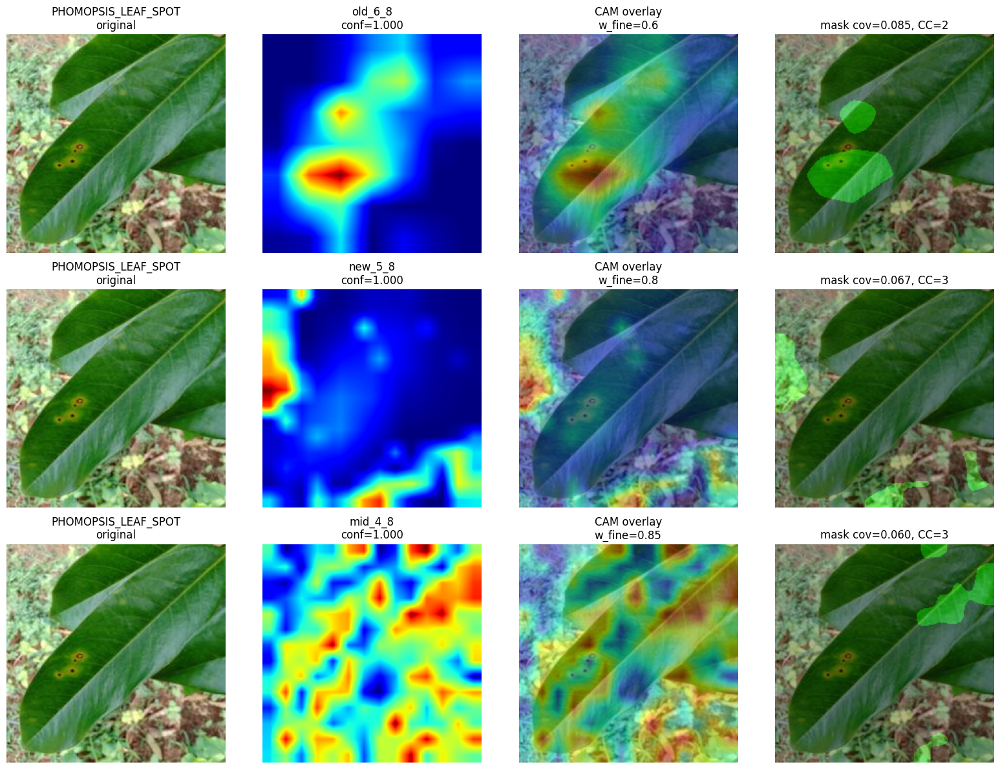

,pair,fine_layer,coarse_layer,weight_fine,confidence,pred_class,mask_coverage,threshold_method,threshold_value,effective_keep_pct,active_keep_profile,area_cap,num_components_before,num_components_after,largest_component_area,num_components_before_final,num_components_after_final,largest_component_area_final
0,old_6_8,base.features.6.3.block.3.0,base.features.8.0,0.60,0.999972,4,0.085140,adaptive_percentile,0.500774,0.090000,reviewed_precision,0.180000,3,2,3364,2,2,3363
1,new_5_8,base.features.5.2.block.3.0,base.features.8.0,0.80,0.999972,4,0.067403,adaptive_percentile,0.499983,0.070512,reviewed_precision,0.141024,4,3,1948,3,3,1948
2,mid_4_8,base.features.4.2.block.3.0,base.features.8.0,0.85,0.999972,4,0.059969,adaptive_percentile,0.730246,0.090000,reviewed_precision,0.180000,13,3,2189,3,3,2187


Saved → E:\Master\thesis-clean\visualizations\pseudo_labeling_v2\gradcam_layer_pair_sweep.png


In [8]:
def compare_gradcam_layer_pairs(sample, layer_pairs=None, keep_profile=None):
    """Visual sweep nhanh để chọn layer trước khi sinh toàn bộ pseudo-label."""
    if layer_pairs is None:
        layer_pairs = [
            ("old_6_8", get_last_conv_in_block(model, 6), get_last_conv_in_block(model, 8), 0.6),
            ("new_5_8", get_last_conv_in_block(model, 5), get_last_conv_in_block(model, 8), 0.8),
            ("mid_4_8", get_last_conv_in_block(model, 4), get_last_conv_in_block(model, 8), 0.85),
        ]
    if keep_profile is not None:
        global BASE_KEEP_PCT, ACTIVE_KEEP_PROFILE
        ACTIVE_KEEP_PROFILE = keep_profile
        BASE_KEEP_PCT = KEEP_PCT_PROFILES[ACTIVE_KEEP_PROFILE]

    img_path, cls_idx, cls_name = sample
    orig_img = Image.open(img_path).convert("RGB").resize((224, 224))
    orig_arr = np.array(orig_img)
    input_tensor = infer_transform(orig_img).unsqueeze(0)

    def overlay_mask_for_sweep(img, mask, color_ch=1):
        rgb = np.zeros_like(img)
        rgb[:, :, color_ch] = mask * 255
        return cv2.addWeighted(img, 0.7, rgb, 0.3, 0)

    fig, axes = plt.subplots(len(layer_pairs), 4, figsize=(16, 4 * len(layer_pairs)))
    if len(layer_pairs) == 1:
        axes = np.expand_dims(axes, 0)

    rows = []
    for r, (name, fine_layer, coarse_layer, w_fine) in enumerate(layer_pairs):
        cam_runner = MultiScaleGradCAMpp(model, fine_layer, coarse_layer, device=device, weight_fine=w_fine)
        heatmap, confidence, pred_class = cam_runner.generate(input_tensor, cls_idx)
        heatmap = normalize_heatmap(heatmap)
        mask, diag = create_pseudo_mask_v2(heatmap, cls_name, min_cc_area=250, top_k=5, return_diagnostics=True)
        heatmap_rgb = cv2.cvtColor(cv2.applyColorMap((heatmap * 255).astype(np.uint8), cv2.COLORMAP_JET), cv2.COLOR_BGR2RGB)
        cam_overlay = cv2.addWeighted(orig_arr, 0.6, heatmap_rgb, 0.4, 0)
        mask_overlay = overlay_mask_for_sweep(orig_arr, mask, color_ch=1)

        axes[r, 0].imshow(orig_arr); axes[r, 0].set_title(f"{cls_name}\noriginal"); axes[r, 0].axis("off")
        axes[r, 1].imshow(heatmap, cmap="jet", vmin=0, vmax=1); axes[r, 1].set_title(f"{name}\nconf={confidence:.3f}"); axes[r, 1].axis("off")
        axes[r, 2].imshow(cam_overlay); axes[r, 2].set_title(f"CAM overlay\nw_fine={w_fine}"); axes[r, 2].axis("off")
        axes[r, 3].imshow(mask_overlay); axes[r, 3].set_title(f"mask cov={mask.mean():.3f}, CC={diag.get('num_components_after_final', diag.get('num_components_after'))}"); axes[r, 3].axis("off")
        rows.append({"pair": name, "fine_layer": fine_layer, "coarse_layer": coarse_layer, "weight_fine": w_fine,
                     "confidence": confidence, "pred_class": pred_class, "mask_coverage": float(mask.mean()), **diag})

    plt.tight_layout()
    plt.savefig(VIZ_DIR / "gradcam_layer_pair_sweep.png", dpi=150, bbox_inches="tight")
    plt.show()
    display(pd.DataFrame(rows))
    print(f"Saved → {VIZ_DIR / 'gradcam_layer_pair_sweep.png'}")


# Ưu tiên sample có lesion nhỏ để kiểm tra localization; PHOMOPSIS/ALGAL thường lộ lỗi layer rõ nhất.
layer_sweep_sample = next((s for s in selected_samples if s[2] == "PHOMOPSIS_LEAF_SPOT"), selected_samples[0])
compare_gradcam_layer_pairs(layer_sweep_sample)

## Generate Pseudo-Label v2

Chạy toàn bộ 3,104 ảnh train qua GradCAM++ multi-scale + pipeline mới. Hai điểm cần lưu ý:

- **HEALTHY_LEAF** trả về all-zero mask ngay trong `create_pseudo_mask_v2` — không tốn computation cho threshold/CC.
- **`MAX_VIZ_PER_CLASS=10`**: chỉ giữ data để visualize, không load hết 3K ảnh vào RAM.

In [9]:
pseudo_dir_v2    = PROJECT_ROOT / 'notebooks' / 'data' / 'pseudo_labels_v2_train'
processed_dir_v2 = PROJECT_ROOT / 'notebooks' / 'data' / 'processed_v2_train'
pseudo_dir_v2.mkdir(parents=True, exist_ok=True)
processed_dir_v2.mkdir(parents=True, exist_ok=True)

stats_v2            = []
results_by_class_v2 = defaultdict(list)
MAX_VIZ_PER_CLASS   = 10

for img_path, cls_idx, cls_name in tqdm(selected_samples, desc="GradCAM++ v2"):
    try:
        orig_img = Image.open(img_path).convert("RGB").resize((224, 224))
        orig_arr = np.array(orig_img)

        input_tensor = infer_transform(orig_img).unsqueeze(0)

        heatmap, confidence, pred_class = gradcam_v2.generate(input_tensor, cls_idx)
        heatmap = normalize_heatmap(heatmap)

        # Adaptive percentile + hậu xử lý; HEALTHY_LEAF → all-zero
        mask, diag = create_pseudo_mask_v2(heatmap, cls_name, min_cc_area=400, top_k=3, return_diagnostics=True)

        fname     = Path(img_path).name
        base_name = f"{cls_name}_{fname}"

        cv2.imwrite(str(pseudo_dir_v2 / f"{base_name}_pseudo.png"),
                    (mask * 255).astype(np.uint8))
        orig_img.save(str(processed_dir_v2 / base_name))

        stats_v2.append({
            "image_id": Path(fname).stem,
            "filename": base_name,
            "original_path": str(img_path),
            "processed_image_path": str(processed_dir_v2 / base_name),
            "mask_path": str(pseudo_dir_v2 / f"{base_name}_pseudo.png"),
            "class_name": cls_name,
            "class_idx": int(cls_idx),
            "target_class": int(cls_idx),
            "target_class_name": cls_name,
            "pred_class": int(pred_class),
            "pred_class_name": IDX_TO_CLASS.get(int(pred_class), str(pred_class)),
            "pred_matches_target": bool(pred_class == cls_idx),
            "confidence": float(confidence),
            "mask_coverage": float(mask.mean()),
            "mask_area_ratio": float(mask.mean()),
            **diag,
        })

        if len(results_by_class_v2[cls_name]) < MAX_VIZ_PER_CLASS:
            heatmap_colored = cv2.applyColorMap((heatmap * 255).astype(np.uint8), cv2.COLORMAP_JET)
            heatmap_rgb     = cv2.cvtColor(heatmap_colored, cv2.COLOR_BGR2RGB)
            gradcam_overlay = cv2.addWeighted(orig_arr, 0.6, heatmap_rgb, 0.4, 0)
            mask_rgb        = np.zeros_like(orig_arr)
            mask_rgb[:, :, 1] = mask * 255
            pseudo_overlay  = cv2.addWeighted(orig_arr, 0.7, mask_rgb, 0.3, 0)
            results_by_class_v2[cls_name].append({
                "orig_arr":        orig_arr,
                "heatmap":         heatmap,
                "gradcam_overlay": gradcam_overlay,
                "mask":            mask,
                "pseudo_overlay":  pseudo_overlay,
                "confidence":      float(confidence),
                "pred_class":      pred_class,
                "true_class":      int(cls_idx),
                "filename":        base_name,
                **diag,
            })

    except Exception as e:
        print(f"  Lỗi {img_path}: {e}")

metadata_v2 = pd.DataFrame(stats_v2)
metadata_v2.to_csv(pseudo_dir_v2 / "pseudo_label_metadata_v2.csv", index=False)
with open(pseudo_dir_v2 / "pseudo_label_stats_v2.json", "w", encoding="utf-8") as f:
    json.dump(stats_v2, f, indent=2, ensure_ascii=False)

print(f"\nGenerated v2 pseudo-labels: {len(stats_v2)}")
print(f"Masks → {pseudo_dir_v2}")
print(f"Images → {processed_dir_v2}")
print(f"Metadata → {pseudo_dir_v2 / 'pseudo_label_metadata_v2.csv'}")

GradCAM++ v2:   0%|          | 0/3104 [00:00<?, ?it/s]

GradCAM++ v2:   0%|          | 1/3104 [00:00<06:57,  7.44it/s]

GradCAM++ v2:   0%|          | 2/3104 [00:00<06:43,  7.69it/s]

GradCAM++ v2:   0%|          | 3/3104 [00:00<06:14,  8.27it/s]

GradCAM++ v2:   0%|          | 4/3104 [00:00<05:58,  8.64it/s]

GradCAM++ v2:   0%|          | 5/3104 [00:00<05:59,  8.63it/s]

GradCAM++ v2:   0%|          | 6/3104 [00:00<05:58,  8.65it/s]

GradCAM++ v2:   0%|          | 7/3104 [00:00<05:54,  8.74it/s]

GradCAM++ v2:   0%|          | 8/3104 [00:00<05:45,  8.96it/s]

GradCAM++ v2:   0%|          | 10/3104 [00:01<05:33,  9.27it/s]

GradCAM++ v2:   0%|          | 11/3104 [00:01<05:29,  9.39it/s]

GradCAM++ v2:   0%|          | 12/3104 [00:01<05:40,  9.08it/s]

GradCAM++ v2:   0%|          | 13/3104 [00:01<05:46,  8.93it/s]

GradCAM++ v2:   0%|          | 14/3104 [00:01<05:50,  8.81it/s]

GradCAM++ v2:   0%|          | 15/3104 [00:01<05:39,  9.09it/s]

GradCAM++ v2:   1%|          | 16/3104 [00:01<05:39,  9.09it/s]

GradCAM++ v2:   1%|          | 18/3104 [00:01<05:17,  9.71it/s]

GradCAM++ v2:   1%|          | 19/3104 [00:02<06:07,  8.39it/s]

GradCAM++ v2:   1%|          | 20/3104 [00:02<06:00,  8.56it/s]

GradCAM++ v2:   1%|          | 21/3104 [00:02<06:05,  8.42it/s]

GradCAM++ v2:   1%|          | 22/3104 [00:02<06:17,  8.17it/s]

GradCAM++ v2:   1%|          | 23/3104 [00:02<06:39,  7.72it/s]

GradCAM++ v2:   1%|          | 24/3104 [00:02<06:44,  7.62it/s]

GradCAM++ v2:   1%|          | 25/3104 [00:02<06:47,  7.55it/s]

GradCAM++ v2:   1%|          | 26/3104 [00:03<06:51,  7.48it/s]

GradCAM++ v2:   1%|          | 27/3104 [00:03<06:49,  7.52it/s]

GradCAM++ v2:   1%|          | 28/3104 [00:03<06:47,  7.55it/s]

GradCAM++ v2:   1%|          | 29/3104 [00:03<06:49,  7.52it/s]

GradCAM++ v2:   1%|          | 30/3104 [00:03<06:49,  7.50it/s]

GradCAM++ v2:   1%|          | 31/3104 [00:03<06:45,  7.57it/s]

GradCAM++ v2:   1%|          | 32/3104 [00:03<06:47,  7.54it/s]

GradCAM++ v2:   1%|          | 33/3104 [00:04<07:02,  7.26it/s]

GradCAM++ v2:   1%|          | 34/3104 [00:04<07:08,  7.17it/s]

GradCAM++ v2:   1%|          | 35/3104 [00:04<07:07,  7.17it/s]

GradCAM++ v2:   1%|          | 36/3104 [00:04<07:03,  7.24it/s]

GradCAM++ v2:   1%|          | 37/3104 [00:04<06:57,  7.34it/s]

GradCAM++ v2:   1%|          | 38/3104 [00:04<06:58,  7.32it/s]

GradCAM++ v2:   1%|▏         | 39/3104 [00:04<07:03,  7.24it/s]

GradCAM++ v2:   1%|▏         | 40/3104 [00:05<07:09,  7.13it/s]

GradCAM++ v2:   1%|▏         | 41/3104 [00:05<07:11,  7.10it/s]

GradCAM++ v2:   1%|▏         | 42/3104 [00:05<07:01,  7.26it/s]

GradCAM++ v2:   1%|▏         | 43/3104 [00:05<07:08,  7.14it/s]

GradCAM++ v2:   1%|▏         | 44/3104 [00:05<07:08,  7.14it/s]

GradCAM++ v2:   1%|▏         | 45/3104 [00:05<07:04,  7.20it/s]

GradCAM++ v2:   1%|▏         | 46/3104 [00:05<07:02,  7.23it/s]

GradCAM++ v2:   2%|▏         | 47/3104 [00:05<06:54,  7.38it/s]

GradCAM++ v2:   2%|▏         | 48/3104 [00:06<06:52,  7.42it/s]

GradCAM++ v2:   2%|▏         | 49/3104 [00:06<06:55,  7.35it/s]

GradCAM++ v2:   2%|▏         | 50/3104 [00:06<06:52,  7.40it/s]

GradCAM++ v2:   2%|▏         | 51/3104 [00:06<06:47,  7.49it/s]

GradCAM++ v2:   2%|▏         | 52/3104 [00:06<06:43,  7.57it/s]

GradCAM++ v2:   2%|▏         | 53/3104 [00:06<06:48,  7.47it/s]

GradCAM++ v2:   2%|▏         | 54/3104 [00:06<07:05,  7.17it/s]

GradCAM++ v2:   2%|▏         | 55/3104 [00:07<06:54,  7.35it/s]

GradCAM++ v2:   2%|▏         | 56/3104 [00:07<06:51,  7.40it/s]

GradCAM++ v2:   2%|▏         | 57/3104 [00:07<06:51,  7.41it/s]

GradCAM++ v2:   2%|▏         | 58/3104 [00:07<06:55,  7.33it/s]

GradCAM++ v2:   2%|▏         | 59/3104 [00:07<07:46,  6.52it/s]

GradCAM++ v2:   2%|▏         | 60/3104 [00:07<07:32,  6.73it/s]

GradCAM++ v2:   2%|▏         | 61/3104 [00:07<07:15,  6.99it/s]

GradCAM++ v2:   2%|▏         | 62/3104 [00:08<07:19,  6.91it/s]

GradCAM++ v2:   2%|▏         | 63/3104 [00:08<07:15,  6.99it/s]

GradCAM++ v2:   2%|▏         | 64/3104 [00:08<07:19,  6.92it/s]

GradCAM++ v2:   2%|▏         | 65/3104 [00:08<07:06,  7.13it/s]

GradCAM++ v2:   2%|▏         | 66/3104 [00:08<07:04,  7.15it/s]

GradCAM++ v2:   2%|▏         | 67/3104 [00:08<06:53,  7.35it/s]

GradCAM++ v2:   2%|▏         | 68/3104 [00:08<06:51,  7.38it/s]

GradCAM++ v2:   2%|▏         | 69/3104 [00:09<06:53,  7.35it/s]

GradCAM++ v2:   2%|▏         | 70/3104 [00:09<06:48,  7.43it/s]

GradCAM++ v2:   2%|▏         | 71/3104 [00:09<06:42,  7.53it/s]

GradCAM++ v2:   2%|▏         | 72/3104 [00:09<07:03,  7.15it/s]

GradCAM++ v2:   2%|▏         | 73/3104 [00:09<07:08,  7.07it/s]

GradCAM++ v2:   2%|▏         | 74/3104 [00:09<07:05,  7.13it/s]

GradCAM++ v2:   2%|▏         | 75/3104 [00:09<07:01,  7.18it/s]

GradCAM++ v2:   2%|▏         | 76/3104 [00:09<06:51,  7.36it/s]

GradCAM++ v2:   2%|▏         | 77/3104 [00:10<06:49,  7.40it/s]

GradCAM++ v2:   3%|▎         | 78/3104 [00:10<06:47,  7.42it/s]

GradCAM++ v2:   3%|▎         | 79/3104 [00:10<06:55,  7.28it/s]

GradCAM++ v2:   3%|▎         | 80/3104 [00:10<06:57,  7.23it/s]

GradCAM++ v2:   3%|▎         | 81/3104 [00:10<06:53,  7.31it/s]

GradCAM++ v2:   3%|▎         | 82/3104 [00:10<07:04,  7.11it/s]

GradCAM++ v2:   3%|▎         | 83/3104 [00:10<07:03,  7.13it/s]

GradCAM++ v2:   3%|▎         | 84/3104 [00:11<06:54,  7.29it/s]

GradCAM++ v2:   3%|▎         | 85/3104 [00:11<06:51,  7.34it/s]

GradCAM++ v2:   3%|▎         | 86/3104 [00:11<06:52,  7.32it/s]

GradCAM++ v2:   3%|▎         | 87/3104 [00:11<06:56,  7.24it/s]

GradCAM++ v2:   3%|▎         | 88/3104 [00:11<07:45,  6.48it/s]

GradCAM++ v2:   3%|▎         | 89/3104 [00:11<07:27,  6.74it/s]

GradCAM++ v2:   3%|▎         | 90/3104 [00:11<07:43,  6.50it/s]

GradCAM++ v2:   3%|▎         | 91/3104 [00:12<07:33,  6.64it/s]

GradCAM++ v2:   3%|▎         | 92/3104 [00:12<07:33,  6.64it/s]

GradCAM++ v2:   3%|▎         | 93/3104 [00:12<07:21,  6.82it/s]

GradCAM++ v2:   3%|▎         | 94/3104 [00:12<07:14,  6.93it/s]

GradCAM++ v2:   3%|▎         | 95/3104 [00:12<07:10,  6.98it/s]

GradCAM++ v2:   3%|▎         | 96/3104 [00:12<06:57,  7.21it/s]

GradCAM++ v2:   3%|▎         | 97/3104 [00:12<06:51,  7.30it/s]

GradCAM++ v2:   3%|▎         | 98/3104 [00:13<06:54,  7.25it/s]

GradCAM++ v2:   3%|▎         | 99/3104 [00:13<06:50,  7.32it/s]

GradCAM++ v2:   3%|▎         | 100/3104 [00:13<06:58,  7.18it/s]

GradCAM++ v2:   3%|▎         | 101/3104 [00:13<07:03,  7.09it/s]

GradCAM++ v2:   3%|▎         | 102/3104 [00:13<07:10,  6.98it/s]

GradCAM++ v2:   3%|▎         | 103/3104 [00:13<07:02,  7.11it/s]

GradCAM++ v2:   3%|▎         | 104/3104 [00:13<06:55,  7.22it/s]

GradCAM++ v2:   3%|▎         | 105/3104 [00:14<07:31,  6.64it/s]

GradCAM++ v2:   3%|▎         | 106/3104 [00:14<07:18,  6.84it/s]

GradCAM++ v2:   3%|▎         | 107/3104 [00:14<07:09,  6.98it/s]

GradCAM++ v2:   3%|▎         | 108/3104 [00:14<07:05,  7.04it/s]

GradCAM++ v2:   4%|▎         | 109/3104 [00:14<06:52,  7.26it/s]

GradCAM++ v2:   4%|▎         | 110/3104 [00:14<07:06,  7.02it/s]

GradCAM++ v2:   4%|▎         | 111/3104 [00:14<07:09,  6.97it/s]

GradCAM++ v2:   4%|▎         | 112/3104 [00:15<06:59,  7.14it/s]

GradCAM++ v2:   4%|▎         | 113/3104 [00:15<06:50,  7.28it/s]

GradCAM++ v2:   4%|▎         | 114/3104 [00:15<06:42,  7.42it/s]

GradCAM++ v2:   4%|▎         | 115/3104 [00:15<06:47,  7.33it/s]

GradCAM++ v2:   4%|▎         | 116/3104 [00:15<06:42,  7.42it/s]

GradCAM++ v2:   4%|▍         | 117/3104 [00:15<06:43,  7.40it/s]

GradCAM++ v2:   4%|▍         | 118/3104 [00:15<06:41,  7.44it/s]

GradCAM++ v2:   4%|▍         | 119/3104 [00:16<06:44,  7.38it/s]

GradCAM++ v2:   4%|▍         | 120/3104 [00:16<07:03,  7.04it/s]

GradCAM++ v2:   4%|▍         | 121/3104 [00:16<07:16,  6.84it/s]

GradCAM++ v2:   4%|▍         | 122/3104 [00:16<07:05,  7.00it/s]

GradCAM++ v2:   4%|▍         | 123/3104 [00:16<07:05,  7.01it/s]

GradCAM++ v2:   4%|▍         | 124/3104 [00:16<07:02,  7.05it/s]

GradCAM++ v2:   4%|▍         | 125/3104 [00:16<07:00,  7.08it/s]

GradCAM++ v2:   4%|▍         | 126/3104 [00:17<07:03,  7.04it/s]

GradCAM++ v2:   4%|▍         | 127/3104 [00:17<07:00,  7.08it/s]

GradCAM++ v2:   4%|▍         | 128/3104 [00:17<07:03,  7.02it/s]

GradCAM++ v2:   4%|▍         | 129/3104 [00:17<06:58,  7.11it/s]

GradCAM++ v2:   4%|▍         | 130/3104 [00:17<07:12,  6.88it/s]

GradCAM++ v2:   4%|▍         | 131/3104 [00:17<07:07,  6.95it/s]

GradCAM++ v2:   4%|▍         | 132/3104 [00:17<06:59,  7.09it/s]

GradCAM++ v2:   4%|▍         | 133/3104 [00:18<06:47,  7.28it/s]

GradCAM++ v2:   4%|▍         | 134/3104 [00:18<06:46,  7.31it/s]

GradCAM++ v2:   4%|▍         | 135/3104 [00:18<06:43,  7.36it/s]

GradCAM++ v2:   4%|▍         | 136/3104 [00:18<06:41,  7.39it/s]

GradCAM++ v2:   4%|▍         | 137/3104 [00:18<06:42,  7.36it/s]

GradCAM++ v2:   4%|▍         | 138/3104 [00:18<06:37,  7.46it/s]

GradCAM++ v2:   4%|▍         | 139/3104 [00:18<06:50,  7.23it/s]

GradCAM++ v2:   5%|▍         | 140/3104 [00:18<06:53,  7.17it/s]

GradCAM++ v2:   5%|▍         | 141/3104 [00:19<06:46,  7.29it/s]

GradCAM++ v2:   5%|▍         | 142/3104 [00:19<06:43,  7.34it/s]

GradCAM++ v2:   5%|▍         | 143/3104 [00:19<06:39,  7.42it/s]

GradCAM++ v2:   5%|▍         | 144/3104 [00:19<06:37,  7.44it/s]

GradCAM++ v2:   5%|▍         | 145/3104 [00:19<06:38,  7.42it/s]

GradCAM++ v2:   5%|▍         | 146/3104 [00:19<06:42,  7.35it/s]

GradCAM++ v2:   5%|▍         | 147/3104 [00:19<07:29,  6.58it/s]

GradCAM++ v2:   5%|▍         | 148/3104 [00:20<07:19,  6.73it/s]

GradCAM++ v2:   5%|▍         | 149/3104 [00:20<07:14,  6.79it/s]

GradCAM++ v2:   5%|▍         | 150/3104 [00:20<07:20,  6.70it/s]

GradCAM++ v2:   5%|▍         | 151/3104 [00:20<07:02,  6.98it/s]

GradCAM++ v2:   5%|▍         | 152/3104 [00:20<06:57,  7.07it/s]

GradCAM++ v2:   5%|▍         | 153/3104 [00:20<06:56,  7.08it/s]

GradCAM++ v2:   5%|▍         | 154/3104 [00:20<06:57,  7.07it/s]

GradCAM++ v2:   5%|▍         | 155/3104 [00:21<06:54,  7.12it/s]

GradCAM++ v2:   5%|▌         | 156/3104 [00:21<06:50,  7.18it/s]

GradCAM++ v2:   5%|▌         | 157/3104 [00:21<06:41,  7.35it/s]

GradCAM++ v2:   5%|▌         | 158/3104 [00:21<06:53,  7.12it/s]

GradCAM++ v2:   5%|▌         | 159/3104 [00:21<07:01,  6.99it/s]

GradCAM++ v2:   5%|▌         | 160/3104 [00:21<06:58,  7.04it/s]

GradCAM++ v2:   5%|▌         | 161/3104 [00:21<06:50,  7.16it/s]

GradCAM++ v2:   5%|▌         | 162/3104 [00:22<06:50,  7.17it/s]

GradCAM++ v2:   5%|▌         | 163/3104 [00:22<06:40,  7.34it/s]

GradCAM++ v2:   5%|▌         | 164/3104 [00:22<06:38,  7.38it/s]

GradCAM++ v2:   5%|▌         | 165/3104 [00:22<06:44,  7.26it/s]

GradCAM++ v2:   5%|▌         | 166/3104 [00:22<06:41,  7.33it/s]

GradCAM++ v2:   5%|▌         | 167/3104 [00:22<06:41,  7.31it/s]

GradCAM++ v2:   5%|▌         | 168/3104 [00:22<06:47,  7.20it/s]

GradCAM++ v2:   5%|▌         | 169/3104 [00:23<06:44,  7.26it/s]

GradCAM++ v2:   5%|▌         | 170/3104 [00:23<06:35,  7.42it/s]

GradCAM++ v2:   6%|▌         | 171/3104 [00:23<06:34,  7.44it/s]

GradCAM++ v2:   6%|▌         | 172/3104 [00:23<06:29,  7.53it/s]

GradCAM++ v2:   6%|▌         | 173/3104 [00:23<06:33,  7.45it/s]

GradCAM++ v2:   6%|▌         | 174/3104 [00:23<06:36,  7.38it/s]

GradCAM++ v2:   6%|▌         | 175/3104 [00:23<06:31,  7.48it/s]

GradCAM++ v2:   6%|▌         | 176/3104 [00:23<06:33,  7.43it/s]

GradCAM++ v2:   6%|▌         | 177/3104 [00:24<06:42,  7.28it/s]

GradCAM++ v2:   6%|▌         | 178/3104 [00:24<06:40,  7.30it/s]

GradCAM++ v2:   6%|▌         | 179/3104 [00:24<06:50,  7.13it/s]

GradCAM++ v2:   6%|▌         | 180/3104 [00:24<06:42,  7.27it/s]

GradCAM++ v2:   6%|▌         | 181/3104 [00:24<06:32,  7.44it/s]

GradCAM++ v2:   6%|▌         | 182/3104 [00:24<06:42,  7.25it/s]

GradCAM++ v2:   6%|▌         | 183/3104 [00:24<06:43,  7.24it/s]

GradCAM++ v2:   6%|▌         | 184/3104 [00:25<06:39,  7.31it/s]

GradCAM++ v2:   6%|▌         | 185/3104 [00:25<06:43,  7.24it/s]

GradCAM++ v2:   6%|▌         | 186/3104 [00:25<06:40,  7.29it/s]

GradCAM++ v2:   6%|▌         | 187/3104 [00:25<07:18,  6.66it/s]

GradCAM++ v2:   6%|▌         | 188/3104 [00:25<07:10,  6.78it/s]

GradCAM++ v2:   6%|▌         | 189/3104 [00:25<07:07,  6.81it/s]

GradCAM++ v2:   6%|▌         | 190/3104 [00:25<06:57,  6.98it/s]

GradCAM++ v2:   6%|▌         | 191/3104 [00:26<06:51,  7.09it/s]

GradCAM++ v2:   6%|▌         | 192/3104 [00:26<06:49,  7.12it/s]

GradCAM++ v2:   6%|▌         | 193/3104 [00:26<06:53,  7.04it/s]

GradCAM++ v2:   6%|▋         | 194/3104 [00:26<06:47,  7.14it/s]

GradCAM++ v2:   6%|▋         | 195/3104 [00:26<06:37,  7.32it/s]

GradCAM++ v2:   6%|▋         | 196/3104 [00:26<06:38,  7.30it/s]

GradCAM++ v2:   6%|▋         | 197/3104 [00:26<06:46,  7.14it/s]

GradCAM++ v2:   6%|▋         | 198/3104 [00:27<06:49,  7.10it/s]

GradCAM++ v2:   6%|▋         | 199/3104 [00:27<06:43,  7.19it/s]

GradCAM++ v2:   6%|▋         | 200/3104 [00:27<06:38,  7.28it/s]

GradCAM++ v2:   6%|▋         | 201/3104 [00:27<06:37,  7.30it/s]

GradCAM++ v2:   7%|▋         | 202/3104 [00:27<06:39,  7.26it/s]

GradCAM++ v2:   7%|▋         | 203/3104 [00:27<06:48,  7.10it/s]

GradCAM++ v2:   7%|▋         | 204/3104 [00:27<06:29,  7.45it/s]

GradCAM++ v2:   7%|▋         | 205/3104 [00:28<06:33,  7.36it/s]

GradCAM++ v2:   7%|▋         | 206/3104 [00:28<06:37,  7.28it/s]

GradCAM++ v2:   7%|▋         | 207/3104 [00:28<06:55,  6.96it/s]

GradCAM++ v2:   7%|▋         | 208/3104 [00:28<06:55,  6.97it/s]

GradCAM++ v2:   7%|▋         | 209/3104 [00:28<06:55,  6.97it/s]

GradCAM++ v2:   7%|▋         | 210/3104 [00:28<06:53,  7.00it/s]

GradCAM++ v2:   7%|▋         | 211/3104 [00:28<06:50,  7.05it/s]

GradCAM++ v2:   7%|▋         | 212/3104 [00:29<06:50,  7.04it/s]

GradCAM++ v2:   7%|▋         | 213/3104 [00:29<06:47,  7.10it/s]

GradCAM++ v2:   7%|▋         | 214/3104 [00:29<06:46,  7.11it/s]

GradCAM++ v2:   7%|▋         | 215/3104 [00:29<06:46,  7.11it/s]

GradCAM++ v2:   7%|▋         | 216/3104 [00:29<06:42,  7.18it/s]

GradCAM++ v2:   7%|▋         | 217/3104 [00:29<06:49,  7.05it/s]

GradCAM++ v2:   7%|▋         | 218/3104 [00:29<06:48,  7.07it/s]

GradCAM++ v2:   7%|▋         | 219/3104 [00:29<06:37,  7.26it/s]

GradCAM++ v2:   7%|▋         | 220/3104 [00:30<06:33,  7.32it/s]

GradCAM++ v2:   7%|▋         | 221/3104 [00:30<07:38,  6.29it/s]

GradCAM++ v2:   7%|▋         | 222/3104 [00:30<07:17,  6.58it/s]

GradCAM++ v2:   7%|▋         | 223/3104 [00:30<07:04,  6.78it/s]

GradCAM++ v2:   7%|▋         | 224/3104 [00:30<06:51,  7.00it/s]

GradCAM++ v2:   7%|▋         | 225/3104 [00:30<06:45,  7.10it/s]

GradCAM++ v2:   7%|▋         | 226/3104 [00:31<06:57,  6.90it/s]

GradCAM++ v2:   7%|▋         | 227/3104 [00:31<06:56,  6.91it/s]

GradCAM++ v2:   7%|▋         | 228/3104 [00:31<06:51,  6.99it/s]

GradCAM++ v2:   7%|▋         | 229/3104 [00:31<06:46,  7.08it/s]

GradCAM++ v2:   7%|▋         | 230/3104 [00:31<06:40,  7.18it/s]

GradCAM++ v2:   7%|▋         | 231/3104 [00:31<06:43,  7.12it/s]

GradCAM++ v2:   7%|▋         | 232/3104 [00:31<06:38,  7.21it/s]

GradCAM++ v2:   8%|▊         | 233/3104 [00:32<06:38,  7.20it/s]

GradCAM++ v2:   8%|▊         | 234/3104 [00:32<06:38,  7.21it/s]

GradCAM++ v2:   8%|▊         | 235/3104 [00:32<06:47,  7.03it/s]

GradCAM++ v2:   8%|▊         | 236/3104 [00:32<07:03,  6.77it/s]

GradCAM++ v2:   8%|▊         | 237/3104 [00:32<07:05,  6.73it/s]

GradCAM++ v2:   8%|▊         | 238/3104 [00:32<07:01,  6.80it/s]

GradCAM++ v2:   8%|▊         | 239/3104 [00:32<06:52,  6.94it/s]

GradCAM++ v2:   8%|▊         | 240/3104 [00:33<06:57,  6.86it/s]

GradCAM++ v2:   8%|▊         | 241/3104 [00:33<06:51,  6.96it/s]

GradCAM++ v2:   8%|▊         | 242/3104 [00:33<06:40,  7.15it/s]

GradCAM++ v2:   8%|▊         | 243/3104 [00:33<06:40,  7.14it/s]

GradCAM++ v2:   8%|▊         | 244/3104 [00:33<06:41,  7.13it/s]

GradCAM++ v2:   8%|▊         | 245/3104 [00:33<06:58,  6.83it/s]

GradCAM++ v2:   8%|▊         | 246/3104 [00:33<06:55,  6.87it/s]

GradCAM++ v2:   8%|▊         | 247/3104 [00:34<06:55,  6.87it/s]

GradCAM++ v2:   8%|▊         | 248/3104 [00:34<06:45,  7.05it/s]

GradCAM++ v2:   8%|▊         | 249/3104 [00:34<06:37,  7.18it/s]

GradCAM++ v2:   8%|▊         | 250/3104 [00:34<06:30,  7.32it/s]

GradCAM++ v2:   8%|▊         | 251/3104 [00:34<06:36,  7.20it/s]

GradCAM++ v2:   8%|▊         | 252/3104 [00:34<06:29,  7.32it/s]

GradCAM++ v2:   8%|▊         | 253/3104 [00:34<06:28,  7.34it/s]

GradCAM++ v2:   8%|▊         | 254/3104 [00:34<06:31,  7.29it/s]

GradCAM++ v2:   8%|▊         | 255/3104 [00:35<06:41,  7.09it/s]

GradCAM++ v2:   8%|▊         | 256/3104 [00:35<06:45,  7.02it/s]

GradCAM++ v2:   8%|▊         | 257/3104 [00:35<06:44,  7.03it/s]

GradCAM++ v2:   8%|▊         | 258/3104 [00:35<07:38,  6.21it/s]

GradCAM++ v2:   8%|▊         | 259/3104 [00:35<07:11,  6.60it/s]

GradCAM++ v2:   8%|▊         | 260/3104 [00:35<06:56,  6.84it/s]

GradCAM++ v2:   8%|▊         | 261/3104 [00:36<06:46,  6.99it/s]

GradCAM++ v2:   8%|▊         | 262/3104 [00:36<06:37,  7.15it/s]

GradCAM++ v2:   8%|▊         | 263/3104 [00:36<06:39,  7.12it/s]

GradCAM++ v2:   9%|▊         | 264/3104 [00:36<06:53,  6.87it/s]

GradCAM++ v2:   9%|▊         | 265/3104 [00:36<07:00,  6.75it/s]

GradCAM++ v2:   9%|▊         | 266/3104 [00:36<06:55,  6.82it/s]

GradCAM++ v2:   9%|▊         | 267/3104 [00:36<06:48,  6.94it/s]

GradCAM++ v2:   9%|▊         | 268/3104 [00:37<06:43,  7.04it/s]

GradCAM++ v2:   9%|▊         | 269/3104 [00:37<06:39,  7.09it/s]

GradCAM++ v2:   9%|▊         | 270/3104 [00:37<06:40,  7.08it/s]

GradCAM++ v2:   9%|▊         | 271/3104 [00:37<06:39,  7.08it/s]

GradCAM++ v2:   9%|▉         | 272/3104 [00:37<06:36,  7.15it/s]

GradCAM++ v2:   9%|▉         | 273/3104 [00:37<06:39,  7.09it/s]

GradCAM++ v2:   9%|▉         | 274/3104 [00:37<06:49,  6.91it/s]

GradCAM++ v2:   9%|▉         | 275/3104 [00:38<06:52,  6.86it/s]

GradCAM++ v2:   9%|▉         | 276/3104 [00:38<06:46,  6.95it/s]

GradCAM++ v2:   9%|▉         | 277/3104 [00:38<06:46,  6.95it/s]

GradCAM++ v2:   9%|▉         | 278/3104 [00:38<06:31,  7.21it/s]

GradCAM++ v2:   9%|▉         | 279/3104 [00:38<06:36,  7.13it/s]

GradCAM++ v2:   9%|▉         | 280/3104 [00:38<06:32,  7.19it/s]

GradCAM++ v2:   9%|▉         | 281/3104 [00:38<06:30,  7.22it/s]

GradCAM++ v2:   9%|▉         | 282/3104 [00:39<06:32,  7.18it/s]

GradCAM++ v2:   9%|▉         | 283/3104 [00:39<06:42,  7.00it/s]

GradCAM++ v2:   9%|▉         | 284/3104 [00:39<06:56,  6.77it/s]

GradCAM++ v2:   9%|▉         | 285/3104 [00:39<06:41,  7.02it/s]

GradCAM++ v2:   9%|▉         | 286/3104 [00:39<06:43,  6.98it/s]

GradCAM++ v2:   9%|▉         | 287/3104 [00:39<06:38,  7.08it/s]

GradCAM++ v2:   9%|▉         | 288/3104 [00:39<06:31,  7.20it/s]

GradCAM++ v2:   9%|▉         | 289/3104 [00:39<06:26,  7.28it/s]

GradCAM++ v2:   9%|▉         | 290/3104 [00:40<06:19,  7.41it/s]

GradCAM++ v2:   9%|▉         | 291/3104 [00:40<06:31,  7.18it/s]

GradCAM++ v2:   9%|▉         | 292/3104 [00:40<06:28,  7.23it/s]

GradCAM++ v2:   9%|▉         | 293/3104 [00:40<06:43,  6.97it/s]

GradCAM++ v2:   9%|▉         | 294/3104 [00:40<06:47,  6.90it/s]

GradCAM++ v2:  10%|▉         | 295/3104 [00:40<06:35,  7.10it/s]

GradCAM++ v2:  10%|▉         | 296/3104 [00:40<06:26,  7.27it/s]

GradCAM++ v2:  10%|▉         | 297/3104 [00:41<06:32,  7.15it/s]

GradCAM++ v2:  10%|▉         | 298/3104 [00:41<07:13,  6.47it/s]

GradCAM++ v2:  10%|▉         | 299/3104 [00:41<06:58,  6.70it/s]

GradCAM++ v2:  10%|▉         | 300/3104 [00:41<06:44,  6.93it/s]

GradCAM++ v2:  10%|▉         | 301/3104 [00:41<06:33,  7.13it/s]

GradCAM++ v2:  10%|▉         | 302/3104 [00:41<06:35,  7.08it/s]

GradCAM++ v2:  10%|▉         | 303/3104 [00:42<06:47,  6.87it/s]

GradCAM++ v2:  10%|▉         | 304/3104 [00:42<06:40,  6.99it/s]

GradCAM++ v2:  10%|▉         | 305/3104 [00:42<06:33,  7.11it/s]

GradCAM++ v2:  10%|▉         | 306/3104 [00:42<06:25,  7.25it/s]

GradCAM++ v2:  10%|▉         | 307/3104 [00:42<06:22,  7.31it/s]

GradCAM++ v2:  10%|▉         | 308/3104 [00:42<06:13,  7.48it/s]

GradCAM++ v2:  10%|▉         | 309/3104 [00:42<06:29,  7.18it/s]

GradCAM++ v2:  10%|▉         | 310/3104 [00:42<06:22,  7.30it/s]

GradCAM++ v2:  10%|█         | 311/3104 [00:43<06:18,  7.38it/s]

GradCAM++ v2:  10%|█         | 312/3104 [00:43<06:37,  7.02it/s]

GradCAM++ v2:  10%|█         | 313/3104 [00:43<06:42,  6.93it/s]

GradCAM++ v2:  10%|█         | 314/3104 [00:43<06:30,  7.15it/s]

GradCAM++ v2:  10%|█         | 315/3104 [00:43<06:24,  7.25it/s]

GradCAM++ v2:  10%|█         | 316/3104 [00:43<06:20,  7.32it/s]

GradCAM++ v2:  10%|█         | 317/3104 [00:43<06:19,  7.35it/s]

GradCAM++ v2:  10%|█         | 318/3104 [00:44<06:37,  7.02it/s]

GradCAM++ v2:  10%|█         | 319/3104 [00:44<06:37,  7.01it/s]

GradCAM++ v2:  10%|█         | 320/3104 [00:44<08:15,  5.62it/s]

GradCAM++ v2:  10%|█         | 321/3104 [00:44<08:01,  5.78it/s]

GradCAM++ v2:  10%|█         | 322/3104 [00:44<07:37,  6.09it/s]

GradCAM++ v2:  10%|█         | 323/3104 [00:44<07:15,  6.38it/s]

GradCAM++ v2:  10%|█         | 324/3104 [00:45<06:57,  6.67it/s]

GradCAM++ v2:  10%|█         | 325/3104 [00:45<06:52,  6.74it/s]

GradCAM++ v2:  11%|█         | 326/3104 [00:45<06:35,  7.02it/s]

GradCAM++ v2:  11%|█         | 327/3104 [00:45<06:25,  7.21it/s]

GradCAM++ v2:  11%|█         | 328/3104 [00:45<06:26,  7.17it/s]

GradCAM++ v2:  11%|█         | 329/3104 [00:45<06:22,  7.26it/s]

GradCAM++ v2:  11%|█         | 330/3104 [00:45<06:25,  7.20it/s]

GradCAM++ v2:  11%|█         | 331/3104 [00:46<06:41,  6.91it/s]

GradCAM++ v2:  11%|█         | 332/3104 [00:46<06:32,  7.06it/s]

GradCAM++ v2:  11%|█         | 333/3104 [00:46<06:26,  7.18it/s]

GradCAM++ v2:  11%|█         | 334/3104 [00:46<06:35,  7.01it/s]

GradCAM++ v2:  11%|█         | 335/3104 [00:46<06:30,  7.09it/s]

GradCAM++ v2:  11%|█         | 336/3104 [00:46<06:27,  7.14it/s]

GradCAM++ v2:  11%|█         | 337/3104 [00:46<06:27,  7.15it/s]

GradCAM++ v2:  11%|█         | 338/3104 [00:47<06:23,  7.20it/s]

GradCAM++ v2:  11%|█         | 339/3104 [00:47<06:28,  7.12it/s]

GradCAM++ v2:  11%|█         | 340/3104 [00:47<06:49,  6.76it/s]

GradCAM++ v2:  11%|█         | 341/3104 [00:47<06:51,  6.72it/s]

GradCAM++ v2:  11%|█         | 342/3104 [00:47<06:36,  6.97it/s]

GradCAM++ v2:  11%|█         | 343/3104 [00:47<06:31,  7.05it/s]

GradCAM++ v2:  11%|█         | 344/3104 [00:47<06:23,  7.20it/s]

GradCAM++ v2:  11%|█         | 345/3104 [00:48<06:46,  6.79it/s]

GradCAM++ v2:  11%|█         | 346/3104 [00:48<06:59,  6.58it/s]

GradCAM++ v2:  11%|█         | 347/3104 [00:48<06:55,  6.64it/s]

GradCAM++ v2:  11%|█         | 348/3104 [00:48<06:52,  6.67it/s]

GradCAM++ v2:  11%|█         | 349/3104 [00:48<07:22,  6.23it/s]

GradCAM++ v2:  11%|█▏        | 350/3104 [00:48<07:25,  6.18it/s]

GradCAM++ v2:  11%|█▏        | 351/3104 [00:49<07:21,  6.24it/s]

GradCAM++ v2:  11%|█▏        | 352/3104 [00:49<07:20,  6.25it/s]

GradCAM++ v2:  11%|█▏        | 353/3104 [00:49<07:16,  6.30it/s]

GradCAM++ v2:  11%|█▏        | 354/3104 [00:49<07:09,  6.40it/s]

GradCAM++ v2:  11%|█▏        | 355/3104 [00:49<08:13,  5.57it/s]

GradCAM++ v2:  11%|█▏        | 356/3104 [00:49<07:45,  5.91it/s]

GradCAM++ v2:  12%|█▏        | 357/3104 [00:49<07:12,  6.34it/s]

GradCAM++ v2:  12%|█▏        | 358/3104 [00:50<07:23,  6.19it/s]

GradCAM++ v2:  12%|█▏        | 359/3104 [00:50<07:14,  6.32it/s]

GradCAM++ v2:  12%|█▏        | 360/3104 [00:50<06:51,  6.67it/s]

GradCAM++ v2:  12%|█▏        | 361/3104 [00:50<06:36,  6.92it/s]

GradCAM++ v2:  12%|█▏        | 362/3104 [00:50<06:37,  6.89it/s]

GradCAM++ v2:  12%|█▏        | 363/3104 [00:50<06:47,  6.73it/s]

GradCAM++ v2:  12%|█▏        | 364/3104 [00:51<06:52,  6.64it/s]

GradCAM++ v2:  12%|█▏        | 365/3104 [00:51<06:56,  6.58it/s]

GradCAM++ v2:  12%|█▏        | 366/3104 [00:51<06:39,  6.85it/s]

GradCAM++ v2:  12%|█▏        | 367/3104 [00:51<06:41,  6.82it/s]

GradCAM++ v2:  12%|█▏        | 368/3104 [00:51<06:48,  6.69it/s]

GradCAM++ v2:  12%|█▏        | 369/3104 [00:51<06:42,  6.80it/s]

GradCAM++ v2:  12%|█▏        | 370/3104 [00:51<06:32,  6.97it/s]

GradCAM++ v2:  12%|█▏        | 371/3104 [00:52<06:23,  7.12it/s]

GradCAM++ v2:  12%|█▏        | 372/3104 [00:52<06:25,  7.09it/s]

GradCAM++ v2:  12%|█▏        | 373/3104 [00:52<06:15,  7.27it/s]

GradCAM++ v2:  12%|█▏        | 374/3104 [00:52<06:22,  7.15it/s]

GradCAM++ v2:  12%|█▏        | 375/3104 [00:52<06:24,  7.09it/s]

GradCAM++ v2:  12%|█▏        | 376/3104 [00:52<06:24,  7.10it/s]

GradCAM++ v2:  12%|█▏        | 377/3104 [00:52<06:32,  6.95it/s]

GradCAM++ v2:  12%|█▏        | 378/3104 [00:53<06:43,  6.75it/s]

GradCAM++ v2:  12%|█▏        | 379/3104 [00:53<06:27,  7.03it/s]

GradCAM++ v2:  12%|█▏        | 380/3104 [00:53<07:21,  6.17it/s]

GradCAM++ v2:  12%|█▏        | 381/3104 [00:53<07:03,  6.42it/s]

GradCAM++ v2:  12%|█▏        | 382/3104 [00:53<06:49,  6.65it/s]

GradCAM++ v2:  12%|█▏        | 383/3104 [00:53<06:32,  6.93it/s]

GradCAM++ v2:  12%|█▏        | 384/3104 [00:53<06:32,  6.94it/s]

GradCAM++ v2:  12%|█▏        | 385/3104 [00:54<06:28,  7.00it/s]

GradCAM++ v2:  12%|█▏        | 386/3104 [00:54<06:43,  6.73it/s]

GradCAM++ v2:  12%|█▏        | 387/3104 [00:54<06:44,  6.71it/s]

GradCAM++ v2:  12%|█▎        | 388/3104 [00:54<06:32,  6.91it/s]

GradCAM++ v2:  13%|█▎        | 389/3104 [00:54<06:32,  6.93it/s]

GradCAM++ v2:  13%|█▎        | 390/3104 [00:54<07:18,  6.18it/s]

GradCAM++ v2:  13%|█▎        | 391/3104 [00:54<06:59,  6.46it/s]

GradCAM++ v2:  13%|█▎        | 392/3104 [00:55<06:53,  6.55it/s]

GradCAM++ v2:  13%|█▎        | 393/3104 [00:55<06:43,  6.72it/s]

GradCAM++ v2:  13%|█▎        | 394/3104 [00:55<06:41,  6.76it/s]

GradCAM++ v2:  13%|█▎        | 395/3104 [00:55<06:46,  6.67it/s]

GradCAM++ v2:  13%|█▎        | 396/3104 [00:55<06:46,  6.66it/s]

GradCAM++ v2:  13%|█▎        | 397/3104 [00:55<06:38,  6.80it/s]

GradCAM++ v2:  13%|█▎        | 398/3104 [00:56<06:30,  6.92it/s]

GradCAM++ v2:  13%|█▎        | 399/3104 [00:56<06:29,  6.94it/s]

GradCAM++ v2:  13%|█▎        | 400/3104 [00:56<06:24,  7.03it/s]

GradCAM++ v2:  13%|█▎        | 401/3104 [00:56<06:15,  7.20it/s]

GradCAM++ v2:  13%|█▎        | 402/3104 [00:56<06:11,  7.26it/s]

GradCAM++ v2:  13%|█▎        | 403/3104 [00:56<06:10,  7.29it/s]

GradCAM++ v2:  13%|█▎        | 404/3104 [00:56<06:17,  7.15it/s]

GradCAM++ v2:  13%|█▎        | 405/3104 [00:56<06:22,  7.06it/s]

GradCAM++ v2:  13%|█▎        | 406/3104 [00:57<06:28,  6.95it/s]

GradCAM++ v2:  13%|█▎        | 407/3104 [00:57<06:19,  7.10it/s]

GradCAM++ v2:  13%|█▎        | 408/3104 [00:57<06:18,  7.12it/s]

GradCAM++ v2:  13%|█▎        | 409/3104 [00:57<06:22,  7.04it/s]

GradCAM++ v2:  13%|█▎        | 410/3104 [00:57<06:14,  7.20it/s]

GradCAM++ v2:  13%|█▎        | 411/3104 [00:57<06:13,  7.21it/s]

GradCAM++ v2:  13%|█▎        | 412/3104 [00:57<06:07,  7.32it/s]

GradCAM++ v2:  13%|█▎        | 413/3104 [00:58<06:15,  7.16it/s]

GradCAM++ v2:  13%|█▎        | 414/3104 [00:58<06:19,  7.09it/s]

GradCAM++ v2:  13%|█▎        | 415/3104 [00:58<06:23,  7.01it/s]

GradCAM++ v2:  13%|█▎        | 416/3104 [00:58<06:27,  6.94it/s]

GradCAM++ v2:  13%|█▎        | 417/3104 [00:58<06:21,  7.04it/s]

GradCAM++ v2:  13%|█▎        | 418/3104 [00:58<06:17,  7.12it/s]

GradCAM++ v2:  13%|█▎        | 419/3104 [00:58<06:16,  7.13it/s]

GradCAM++ v2:  14%|█▎        | 420/3104 [00:59<06:15,  7.15it/s]

GradCAM++ v2:  14%|█▎        | 421/3104 [00:59<06:14,  7.16it/s]

GradCAM++ v2:  14%|█▎        | 422/3104 [00:59<06:16,  7.12it/s]

GradCAM++ v2:  14%|█▎        | 423/3104 [00:59<06:09,  7.25it/s]

GradCAM++ v2:  14%|█▎        | 424/3104 [00:59<06:20,  7.04it/s]

GradCAM++ v2:  14%|█▎        | 425/3104 [00:59<06:26,  6.93it/s]

GradCAM++ v2:  14%|█▎        | 426/3104 [00:59<06:18,  7.07it/s]

GradCAM++ v2:  14%|█▍        | 427/3104 [01:00<06:18,  7.08it/s]

GradCAM++ v2:  14%|█▍        | 428/3104 [01:00<06:25,  6.94it/s]

GradCAM++ v2:  14%|█▍        | 429/3104 [01:00<06:18,  7.08it/s]

GradCAM++ v2:  14%|█▍        | 430/3104 [01:00<06:17,  7.09it/s]

GradCAM++ v2:  14%|█▍        | 431/3104 [01:00<07:12,  6.18it/s]

GradCAM++ v2:  14%|█▍        | 432/3104 [01:00<06:48,  6.53it/s]

GradCAM++ v2:  14%|█▍        | 433/3104 [01:01<06:59,  6.37it/s]

GradCAM++ v2:  14%|█▍        | 434/3104 [01:01<06:55,  6.43it/s]

GradCAM++ v2:  14%|█▍        | 435/3104 [01:01<06:47,  6.54it/s]

GradCAM++ v2:  14%|█▍        | 436/3104 [01:01<06:34,  6.77it/s]

GradCAM++ v2:  14%|█▍        | 437/3104 [01:01<06:31,  6.80it/s]

GradCAM++ v2:  14%|█▍        | 438/3104 [01:01<06:25,  6.92it/s]

GradCAM++ v2:  14%|█▍        | 439/3104 [01:01<06:17,  7.06it/s]

GradCAM++ v2:  14%|█▍        | 440/3104 [01:02<06:16,  7.08it/s]

GradCAM++ v2:  14%|█▍        | 441/3104 [01:02<06:08,  7.23it/s]

GradCAM++ v2:  14%|█▍        | 442/3104 [01:02<06:18,  7.03it/s]

GradCAM++ v2:  14%|█▍        | 443/3104 [01:02<06:17,  7.04it/s]

GradCAM++ v2:  14%|█▍        | 444/3104 [01:02<06:21,  6.97it/s]

GradCAM++ v2:  14%|█▍        | 445/3104 [01:02<06:19,  7.00it/s]

GradCAM++ v2:  14%|█▍        | 446/3104 [01:02<06:11,  7.15it/s]

GradCAM++ v2:  14%|█▍        | 447/3104 [01:03<06:12,  7.13it/s]

GradCAM++ v2:  14%|█▍        | 448/3104 [01:03<06:07,  7.23it/s]

GradCAM++ v2:  14%|█▍        | 449/3104 [01:03<06:02,  7.32it/s]

GradCAM++ v2:  14%|█▍        | 450/3104 [01:03<06:02,  7.31it/s]

GradCAM++ v2:  15%|█▍        | 451/3104 [01:03<06:11,  7.14it/s]

GradCAM++ v2:  15%|█▍        | 452/3104 [01:03<06:30,  6.78it/s]

GradCAM++ v2:  15%|█▍        | 453/3104 [01:03<06:49,  6.48it/s]

GradCAM++ v2:  15%|█▍        | 454/3104 [01:04<06:56,  6.37it/s]

GradCAM++ v2:  15%|█▍        | 455/3104 [01:04<06:42,  6.58it/s]

GradCAM++ v2:  15%|█▍        | 456/3104 [01:04<06:30,  6.77it/s]

GradCAM++ v2:  15%|█▍        | 457/3104 [01:04<06:18,  6.99it/s]

GradCAM++ v2:  15%|█▍        | 458/3104 [01:04<06:14,  7.07it/s]

GradCAM++ v2:  15%|█▍        | 459/3104 [01:04<06:12,  7.11it/s]

GradCAM++ v2:  15%|█▍        | 460/3104 [01:04<06:09,  7.15it/s]

GradCAM++ v2:  15%|█▍        | 461/3104 [01:05<06:24,  6.88it/s]

GradCAM++ v2:  15%|█▍        | 462/3104 [01:05<07:12,  6.11it/s]

GradCAM++ v2:  15%|█▍        | 463/3104 [01:05<07:01,  6.26it/s]

GradCAM++ v2:  15%|█▍        | 464/3104 [01:05<06:46,  6.49it/s]

GradCAM++ v2:  15%|█▍        | 465/3104 [01:05<06:36,  6.66it/s]

GradCAM++ v2:  15%|█▌        | 466/3104 [01:05<06:22,  6.90it/s]

GradCAM++ v2:  15%|█▌        | 467/3104 [01:05<06:11,  7.09it/s]

GradCAM++ v2:  15%|█▌        | 468/3104 [01:06<06:10,  7.12it/s]

GradCAM++ v2:  15%|█▌        | 469/3104 [01:06<06:12,  7.08it/s]

GradCAM++ v2:  15%|█▌        | 470/3104 [01:06<06:07,  7.16it/s]

GradCAM++ v2:  15%|█▌        | 471/3104 [01:06<06:06,  7.18it/s]

GradCAM++ v2:  15%|█▌        | 472/3104 [01:06<06:15,  7.01it/s]

GradCAM++ v2:  15%|█▌        | 473/3104 [01:06<06:49,  6.43it/s]

GradCAM++ v2:  15%|█▌        | 474/3104 [01:06<06:44,  6.50it/s]

GradCAM++ v2:  15%|█▌        | 475/3104 [01:07<06:34,  6.66it/s]

GradCAM++ v2:  15%|█▌        | 476/3104 [01:07<06:26,  6.80it/s]

GradCAM++ v2:  15%|█▌        | 477/3104 [01:07<06:25,  6.82it/s]

GradCAM++ v2:  15%|█▌        | 478/3104 [01:07<06:14,  7.01it/s]

GradCAM++ v2:  15%|█▌        | 479/3104 [01:07<06:12,  7.05it/s]

GradCAM++ v2:  15%|█▌        | 480/3104 [01:07<06:08,  7.13it/s]

GradCAM++ v2:  15%|█▌        | 481/3104 [01:07<06:08,  7.11it/s]

GradCAM++ v2:  16%|█▌        | 482/3104 [01:08<06:13,  7.02it/s]

GradCAM++ v2:  16%|█▌        | 483/3104 [01:08<06:17,  6.94it/s]

GradCAM++ v2:  16%|█▌        | 484/3104 [01:08<06:14,  7.00it/s]

GradCAM++ v2:  16%|█▌        | 485/3104 [01:08<06:10,  7.06it/s]

GradCAM++ v2:  16%|█▌        | 486/3104 [01:08<06:05,  7.17it/s]

GradCAM++ v2:  16%|█▌        | 487/3104 [01:08<06:00,  7.26it/s]

GradCAM++ v2:  16%|█▌        | 488/3104 [01:08<06:07,  7.11it/s]

GradCAM++ v2:  16%|█▌        | 489/3104 [01:09<05:57,  7.32it/s]

GradCAM++ v2:  16%|█▌        | 490/3104 [01:09<06:11,  7.04it/s]

GradCAM++ v2:  16%|█▌        | 491/3104 [01:09<06:16,  6.94it/s]

GradCAM++ v2:  16%|█▌        | 492/3104 [01:09<06:17,  6.92it/s]

GradCAM++ v2:  16%|█▌        | 493/3104 [01:09<06:16,  6.93it/s]

GradCAM++ v2:  16%|█▌        | 494/3104 [01:09<06:07,  7.11it/s]

GradCAM++ v2:  16%|█▌        | 495/3104 [01:09<06:10,  7.05it/s]

GradCAM++ v2:  16%|█▌        | 496/3104 [01:10<06:07,  7.10it/s]

GradCAM++ v2:  16%|█▌        | 497/3104 [01:10<06:01,  7.20it/s]

GradCAM++ v2:  16%|█▌        | 498/3104 [01:10<06:10,  7.03it/s]

GradCAM++ v2:  16%|█▌        | 499/3104 [01:10<06:12,  6.99it/s]

GradCAM++ v2:  16%|█▌        | 500/3104 [01:10<06:56,  6.25it/s]

GradCAM++ v2:  16%|█▌        | 501/3104 [01:10<06:43,  6.45it/s]

GradCAM++ v2:  16%|█▌        | 502/3104 [01:11<06:34,  6.60it/s]

GradCAM++ v2:  16%|█▌        | 503/3104 [01:11<06:21,  6.82it/s]

GradCAM++ v2:  16%|█▌        | 504/3104 [01:11<06:13,  6.97it/s]

GradCAM++ v2:  16%|█▋        | 505/3104 [01:11<06:16,  6.91it/s]

GradCAM++ v2:  16%|█▋        | 506/3104 [01:11<06:08,  7.05it/s]

GradCAM++ v2:  16%|█▋        | 507/3104 [01:11<06:06,  7.09it/s]

GradCAM++ v2:  16%|█▋        | 508/3104 [01:11<06:00,  7.21it/s]

GradCAM++ v2:  16%|█▋        | 509/3104 [01:11<05:56,  7.29it/s]

GradCAM++ v2:  16%|█▋        | 510/3104 [01:12<06:18,  6.85it/s]

GradCAM++ v2:  16%|█▋        | 511/3104 [01:12<06:30,  6.63it/s]

GradCAM++ v2:  16%|█▋        | 512/3104 [01:12<06:29,  6.65it/s]

GradCAM++ v2:  17%|█▋        | 513/3104 [01:12<06:21,  6.80it/s]

GradCAM++ v2:  17%|█▋        | 514/3104 [01:12<06:12,  6.94it/s]

GradCAM++ v2:  17%|█▋        | 515/3104 [01:12<06:17,  6.85it/s]

GradCAM++ v2:  17%|█▋        | 516/3104 [01:13<06:09,  7.01it/s]

GradCAM++ v2:  17%|█▋        | 517/3104 [01:13<06:04,  7.09it/s]

GradCAM++ v2:  17%|█▋        | 518/3104 [01:13<06:11,  6.96it/s]

GradCAM++ v2:  17%|█▋        | 519/3104 [01:13<06:15,  6.88it/s]

GradCAM++ v2:  17%|█▋        | 520/3104 [01:13<06:22,  6.76it/s]

GradCAM++ v2:  17%|█▋        | 521/3104 [01:13<06:21,  6.78it/s]

GradCAM++ v2:  17%|█▋        | 522/3104 [01:13<06:05,  7.07it/s]

GradCAM++ v2:  17%|█▋        | 523/3104 [01:14<06:04,  7.07it/s]

GradCAM++ v2:  17%|█▋        | 524/3104 [01:14<05:59,  7.18it/s]

GradCAM++ v2:  17%|█▋        | 525/3104 [01:14<05:52,  7.32it/s]

GradCAM++ v2:  17%|█▋        | 526/3104 [01:14<05:55,  7.26it/s]

GradCAM++ v2:  17%|█▋        | 527/3104 [01:14<05:47,  7.41it/s]

GradCAM++ v2:  17%|█▋        | 528/3104 [01:14<05:47,  7.41it/s]

GradCAM++ v2:  17%|█▋        | 529/3104 [01:14<05:57,  7.20it/s]

GradCAM++ v2:  17%|█▋        | 530/3104 [01:14<06:13,  6.90it/s]

GradCAM++ v2:  17%|█▋        | 531/3104 [01:15<06:24,  6.68it/s]

GradCAM++ v2:  17%|█▋        | 532/3104 [01:15<06:19,  6.77it/s]

GradCAM++ v2:  17%|█▋        | 533/3104 [01:15<06:15,  6.85it/s]

GradCAM++ v2:  17%|█▋        | 534/3104 [01:15<06:11,  6.91it/s]

GradCAM++ v2:  17%|█▋        | 535/3104 [01:15<06:14,  6.86it/s]

GradCAM++ v2:  17%|█▋        | 536/3104 [01:15<07:51,  5.45it/s]

GradCAM++ v2:  17%|█▋        | 537/3104 [01:16<08:23,  5.10it/s]

GradCAM++ v2:  17%|█▋        | 538/3104 [01:16<08:03,  5.30it/s]

GradCAM++ v2:  17%|█▋        | 539/3104 [01:16<07:43,  5.53it/s]

GradCAM++ v2:  17%|█▋        | 540/3104 [01:16<07:21,  5.81it/s]

GradCAM++ v2:  17%|█▋        | 541/3104 [01:16<06:59,  6.11it/s]

GradCAM++ v2:  17%|█▋        | 542/3104 [01:17<07:30,  5.68it/s]

GradCAM++ v2:  17%|█▋        | 543/3104 [01:17<08:07,  5.25it/s]

GradCAM++ v2:  18%|█▊        | 544/3104 [01:17<07:34,  5.63it/s]

GradCAM++ v2:  18%|█▊        | 545/3104 [01:17<07:04,  6.03it/s]

GradCAM++ v2:  18%|█▊        | 546/3104 [01:17<06:49,  6.25it/s]

GradCAM++ v2:  18%|█▊        | 547/3104 [01:17<06:43,  6.33it/s]

GradCAM++ v2:  18%|█▊        | 548/3104 [01:18<06:31,  6.52it/s]

GradCAM++ v2:  18%|█▊        | 549/3104 [01:18<06:23,  6.67it/s]

GradCAM++ v2:  18%|█▊        | 550/3104 [01:18<06:07,  6.95it/s]

GradCAM++ v2:  18%|█▊        | 551/3104 [01:18<06:07,  6.95it/s]

GradCAM++ v2:  18%|█▊        | 552/3104 [01:18<06:01,  7.05it/s]

GradCAM++ v2:  18%|█▊        | 553/3104 [01:18<05:56,  7.15it/s]

GradCAM++ v2:  18%|█▊        | 554/3104 [01:18<05:52,  7.23it/s]

GradCAM++ v2:  18%|█▊        | 555/3104 [01:18<05:57,  7.13it/s]

GradCAM++ v2:  18%|█▊        | 556/3104 [01:19<06:08,  6.91it/s]

GradCAM++ v2:  18%|█▊        | 557/3104 [01:19<06:13,  6.81it/s]

GradCAM++ v2:  18%|█▊        | 558/3104 [01:19<06:13,  6.82it/s]

GradCAM++ v2:  18%|█▊        | 559/3104 [01:19<06:02,  7.01it/s]

GradCAM++ v2:  18%|█▊        | 560/3104 [01:19<06:08,  6.91it/s]

GradCAM++ v2:  18%|█▊        | 561/3104 [01:19<06:05,  6.96it/s]

GradCAM++ v2:  18%|█▊        | 562/3104 [01:19<06:05,  6.96it/s]

GradCAM++ v2:  18%|█▊        | 563/3104 [01:20<06:02,  7.01it/s]

GradCAM++ v2:  18%|█▊        | 564/3104 [01:20<06:07,  6.92it/s]

GradCAM++ v2:  18%|█▊        | 565/3104 [01:20<06:14,  6.78it/s]

GradCAM++ v2:  18%|█▊        | 566/3104 [01:20<06:19,  6.68it/s]

GradCAM++ v2:  18%|█▊        | 567/3104 [01:20<06:09,  6.87it/s]

GradCAM++ v2:  18%|█▊        | 568/3104 [01:20<06:01,  7.02it/s]

GradCAM++ v2:  18%|█▊        | 569/3104 [01:21<06:02,  6.98it/s]

GradCAM++ v2:  18%|█▊        | 570/3104 [01:21<05:58,  7.07it/s]

GradCAM++ v2:  18%|█▊        | 571/3104 [01:21<05:56,  7.11it/s]

GradCAM++ v2:  18%|█▊        | 572/3104 [01:21<06:00,  7.02it/s]

GradCAM++ v2:  18%|█▊        | 573/3104 [01:21<05:53,  7.15it/s]

GradCAM++ v2:  18%|█▊        | 574/3104 [01:21<05:49,  7.25it/s]

GradCAM++ v2:  19%|█▊        | 575/3104 [01:21<06:05,  6.92it/s]

GradCAM++ v2:  19%|█▊        | 576/3104 [01:21<05:57,  7.07it/s]

GradCAM++ v2:  19%|█▊        | 577/3104 [01:22<06:00,  7.01it/s]

GradCAM++ v2:  19%|█▊        | 578/3104 [01:22<06:00,  7.01it/s]

GradCAM++ v2:  19%|█▊        | 579/3104 [01:22<05:53,  7.14it/s]

GradCAM++ v2:  19%|█▊        | 580/3104 [01:22<05:57,  7.06it/s]

GradCAM++ v2:  19%|█▊        | 581/3104 [01:22<06:05,  6.90it/s]

GradCAM++ v2:  19%|█▉        | 582/3104 [01:22<06:10,  6.81it/s]

GradCAM++ v2:  19%|█▉        | 583/3104 [01:23<06:11,  6.79it/s]

GradCAM++ v2:  19%|█▉        | 584/3104 [01:23<06:32,  6.43it/s]

GradCAM++ v2:  19%|█▉        | 585/3104 [01:23<06:54,  6.08it/s]

GradCAM++ v2:  19%|█▉        | 586/3104 [01:23<06:56,  6.05it/s]

GradCAM++ v2:  19%|█▉        | 587/3104 [01:23<06:59,  6.00it/s]

GradCAM++ v2:  19%|█▉        | 588/3104 [01:23<06:40,  6.27it/s]

GradCAM++ v2:  19%|█▉        | 589/3104 [01:23<06:33,  6.39it/s]

GradCAM++ v2:  19%|█▉        | 590/3104 [01:24<06:39,  6.30it/s]

GradCAM++ v2:  19%|█▉        | 591/3104 [01:24<06:52,  6.09it/s]

GradCAM++ v2:  19%|█▉        | 592/3104 [01:24<06:55,  6.04it/s]

GradCAM++ v2:  19%|█▉        | 593/3104 [01:24<06:50,  6.12it/s]

GradCAM++ v2:  19%|█▉        | 594/3104 [01:24<06:38,  6.30it/s]

GradCAM++ v2:  19%|█▉        | 595/3104 [01:24<06:23,  6.54it/s]

GradCAM++ v2:  19%|█▉        | 596/3104 [01:25<06:45,  6.18it/s]

GradCAM++ v2:  19%|█▉        | 597/3104 [01:25<07:50,  5.33it/s]

GradCAM++ v2:  19%|█▉        | 598/3104 [01:25<07:13,  5.78it/s]

GradCAM++ v2:  19%|█▉        | 599/3104 [01:25<07:01,  5.95it/s]

GradCAM++ v2:  19%|█▉        | 600/3104 [01:25<06:45,  6.17it/s]

GradCAM++ v2:  19%|█▉        | 601/3104 [01:25<06:42,  6.22it/s]

GradCAM++ v2:  19%|█▉        | 602/3104 [01:26<06:45,  6.17it/s]

GradCAM++ v2:  19%|█▉        | 603/3104 [01:26<06:47,  6.14it/s]

GradCAM++ v2:  19%|█▉        | 604/3104 [01:26<06:30,  6.40it/s]

GradCAM++ v2:  19%|█▉        | 605/3104 [01:26<06:18,  6.61it/s]

GradCAM++ v2:  20%|█▉        | 606/3104 [01:26<06:10,  6.75it/s]

GradCAM++ v2:  20%|█▉        | 607/3104 [01:26<06:14,  6.66it/s]

GradCAM++ v2:  20%|█▉        | 608/3104 [01:27<06:05,  6.82it/s]

GradCAM++ v2:  20%|█▉        | 609/3104 [01:27<06:10,  6.74it/s]

GradCAM++ v2:  20%|█▉        | 610/3104 [01:27<06:18,  6.58it/s]

GradCAM++ v2:  20%|█▉        | 611/3104 [01:27<06:22,  6.51it/s]

GradCAM++ v2:  20%|█▉        | 612/3104 [01:27<06:33,  6.33it/s]

GradCAM++ v2:  20%|█▉        | 613/3104 [01:27<06:23,  6.49it/s]

GradCAM++ v2:  20%|█▉        | 614/3104 [01:27<06:15,  6.63it/s]

GradCAM++ v2:  20%|█▉        | 615/3104 [01:28<06:12,  6.69it/s]

GradCAM++ v2:  20%|█▉        | 616/3104 [01:28<06:10,  6.72it/s]

GradCAM++ v2:  20%|█▉        | 617/3104 [01:28<06:04,  6.83it/s]

GradCAM++ v2:  20%|█▉        | 618/3104 [01:28<05:55,  6.99it/s]

GradCAM++ v2:  20%|█▉        | 619/3104 [01:28<05:54,  7.01it/s]

GradCAM++ v2:  20%|█▉        | 620/3104 [01:28<06:01,  6.88it/s]

GradCAM++ v2:  20%|██        | 621/3104 [01:28<06:00,  6.89it/s]

GradCAM++ v2:  20%|██        | 622/3104 [01:29<06:03,  6.83it/s]

GradCAM++ v2:  20%|██        | 623/3104 [01:29<06:03,  6.83it/s]

GradCAM++ v2:  20%|██        | 624/3104 [01:29<05:54,  6.99it/s]

GradCAM++ v2:  20%|██        | 625/3104 [01:29<05:51,  7.06it/s]

GradCAM++ v2:  20%|██        | 626/3104 [01:29<05:55,  6.96it/s]

GradCAM++ v2:  20%|██        | 627/3104 [01:29<05:49,  7.08it/s]

GradCAM++ v2:  20%|██        | 628/3104 [01:29<05:49,  7.08it/s]

GradCAM++ v2:  20%|██        | 629/3104 [01:30<05:42,  7.23it/s]

GradCAM++ v2:  20%|██        | 630/3104 [01:30<06:03,  6.81it/s]

GradCAM++ v2:  20%|██        | 631/3104 [01:30<06:46,  6.09it/s]

GradCAM++ v2:  20%|██        | 632/3104 [01:30<06:55,  5.95it/s]

GradCAM++ v2:  20%|██        | 633/3104 [01:30<06:33,  6.28it/s]

GradCAM++ v2:  20%|██        | 634/3104 [01:30<06:23,  6.45it/s]

GradCAM++ v2:  20%|██        | 635/3104 [01:31<06:07,  6.72it/s]

GradCAM++ v2:  20%|██        | 636/3104 [01:31<06:07,  6.71it/s]

GradCAM++ v2:  21%|██        | 637/3104 [01:31<06:10,  6.66it/s]

GradCAM++ v2:  21%|██        | 638/3104 [01:31<06:00,  6.84it/s]

GradCAM++ v2:  21%|██        | 639/3104 [01:31<06:11,  6.63it/s]

GradCAM++ v2:  21%|██        | 640/3104 [01:31<06:12,  6.62it/s]

GradCAM++ v2:  21%|██        | 641/3104 [01:31<06:07,  6.69it/s]

GradCAM++ v2:  21%|██        | 642/3104 [01:32<06:01,  6.80it/s]

GradCAM++ v2:  21%|██        | 643/3104 [01:32<05:59,  6.85it/s]

GradCAM++ v2:  21%|██        | 644/3104 [01:32<05:51,  7.01it/s]

GradCAM++ v2:  21%|██        | 645/3104 [01:32<05:54,  6.94it/s]

GradCAM++ v2:  21%|██        | 646/3104 [01:32<05:49,  7.03it/s]

GradCAM++ v2:  21%|██        | 647/3104 [01:32<05:43,  7.16it/s]

GradCAM++ v2:  21%|██        | 648/3104 [01:32<05:46,  7.08it/s]

GradCAM++ v2:  21%|██        | 649/3104 [01:33<05:57,  6.86it/s]

GradCAM++ v2:  21%|██        | 650/3104 [01:33<06:08,  6.65it/s]

GradCAM++ v2:  21%|██        | 651/3104 [01:33<05:50,  7.00it/s]

GradCAM++ v2:  21%|██        | 652/3104 [01:33<05:48,  7.03it/s]

GradCAM++ v2:  21%|██        | 653/3104 [01:33<05:51,  6.97it/s]

GradCAM++ v2:  21%|██        | 654/3104 [01:33<05:44,  7.11it/s]

GradCAM++ v2:  21%|██        | 655/3104 [01:33<05:44,  7.11it/s]

GradCAM++ v2:  21%|██        | 656/3104 [01:34<05:41,  7.18it/s]

GradCAM++ v2:  21%|██        | 657/3104 [01:34<05:41,  7.16it/s]

GradCAM++ v2:  21%|██        | 658/3104 [01:34<05:47,  7.03it/s]

GradCAM++ v2:  21%|██        | 659/3104 [01:34<05:51,  6.95it/s]

GradCAM++ v2:  21%|██▏       | 660/3104 [01:34<05:57,  6.83it/s]

GradCAM++ v2:  21%|██▏       | 661/3104 [01:34<05:54,  6.88it/s]

GradCAM++ v2:  21%|██▏       | 662/3104 [01:34<05:48,  7.00it/s]

GradCAM++ v2:  21%|██▏       | 663/3104 [01:35<05:50,  6.97it/s]

GradCAM++ v2:  21%|██▏       | 664/3104 [01:35<05:43,  7.11it/s]

GradCAM++ v2:  21%|██▏       | 665/3104 [01:35<05:37,  7.24it/s]

GradCAM++ v2:  21%|██▏       | 666/3104 [01:35<05:40,  7.16it/s]

GradCAM++ v2:  21%|██▏       | 667/3104 [01:35<05:40,  7.16it/s]

GradCAM++ v2:  22%|██▏       | 668/3104 [01:35<05:54,  6.86it/s]

GradCAM++ v2:  22%|██▏       | 669/3104 [01:35<05:57,  6.82it/s]

GradCAM++ v2:  22%|██▏       | 670/3104 [01:36<06:48,  5.96it/s]

GradCAM++ v2:  22%|██▏       | 671/3104 [01:36<06:23,  6.35it/s]

GradCAM++ v2:  22%|██▏       | 672/3104 [01:36<06:15,  6.47it/s]

GradCAM++ v2:  22%|██▏       | 673/3104 [01:36<06:07,  6.62it/s]

GradCAM++ v2:  22%|██▏       | 674/3104 [01:36<05:55,  6.83it/s]

GradCAM++ v2:  22%|██▏       | 675/3104 [01:36<05:47,  6.99it/s]

GradCAM++ v2:  22%|██▏       | 676/3104 [01:37<05:46,  7.00it/s]

GradCAM++ v2:  22%|██▏       | 677/3104 [01:37<05:53,  6.86it/s]

GradCAM++ v2:  22%|██▏       | 678/3104 [01:37<05:57,  6.78it/s]

GradCAM++ v2:  22%|██▏       | 679/3104 [01:37<05:54,  6.83it/s]

GradCAM++ v2:  22%|██▏       | 680/3104 [01:37<05:49,  6.93it/s]

GradCAM++ v2:  22%|██▏       | 681/3104 [01:37<05:36,  7.19it/s]

GradCAM++ v2:  22%|██▏       | 682/3104 [01:37<05:41,  7.09it/s]

GradCAM++ v2:  22%|██▏       | 683/3104 [01:37<05:28,  7.37it/s]

GradCAM++ v2:  22%|██▏       | 684/3104 [01:38<05:32,  7.29it/s]

GradCAM++ v2:  22%|██▏       | 685/3104 [01:38<05:35,  7.20it/s]

GradCAM++ v2:  22%|██▏       | 686/3104 [01:38<05:38,  7.14it/s]

GradCAM++ v2:  22%|██▏       | 687/3104 [01:38<05:48,  6.93it/s]

GradCAM++ v2:  22%|██▏       | 688/3104 [01:38<05:52,  6.85it/s]

GradCAM++ v2:  22%|██▏       | 689/3104 [01:38<05:54,  6.80it/s]

GradCAM++ v2:  22%|██▏       | 690/3104 [01:38<05:44,  7.02it/s]

GradCAM++ v2:  22%|██▏       | 691/3104 [01:39<05:41,  7.06it/s]

GradCAM++ v2:  22%|██▏       | 692/3104 [01:39<05:31,  7.27it/s]

GradCAM++ v2:  22%|██▏       | 693/3104 [01:39<05:36,  7.16it/s]

GradCAM++ v2:  22%|██▏       | 694/3104 [01:39<05:41,  7.05it/s]

GradCAM++ v2:  22%|██▏       | 695/3104 [01:39<05:43,  7.02it/s]

GradCAM++ v2:  22%|██▏       | 696/3104 [01:39<05:34,  7.21it/s]

GradCAM++ v2:  22%|██▏       | 697/3104 [01:39<05:47,  6.93it/s]

GradCAM++ v2:  22%|██▏       | 698/3104 [01:40<05:52,  6.83it/s]

GradCAM++ v2:  23%|██▎       | 699/3104 [01:40<05:38,  7.11it/s]

GradCAM++ v2:  23%|██▎       | 700/3104 [01:40<05:44,  6.99it/s]

GradCAM++ v2:  23%|██▎       | 701/3104 [01:40<05:45,  6.95it/s]

GradCAM++ v2:  23%|██▎       | 702/3104 [01:40<05:41,  7.03it/s]

GradCAM++ v2:  23%|██▎       | 703/3104 [01:40<05:36,  7.13it/s]

GradCAM++ v2:  23%|██▎       | 704/3104 [01:40<05:41,  7.02it/s]

GradCAM++ v2:  23%|██▎       | 705/3104 [01:41<05:37,  7.12it/s]

GradCAM++ v2:  23%|██▎       | 706/3104 [01:41<05:40,  7.04it/s]

GradCAM++ v2:  23%|██▎       | 707/3104 [01:41<05:52,  6.80it/s]

GradCAM++ v2:  23%|██▎       | 708/3104 [01:41<05:57,  6.70it/s]

GradCAM++ v2:  23%|██▎       | 709/3104 [01:41<06:41,  5.97it/s]

GradCAM++ v2:  23%|██▎       | 710/3104 [01:41<06:16,  6.37it/s]

GradCAM++ v2:  23%|██▎       | 711/3104 [01:42<06:07,  6.51it/s]

GradCAM++ v2:  23%|██▎       | 712/3104 [01:42<06:03,  6.58it/s]

GradCAM++ v2:  23%|██▎       | 713/3104 [01:42<05:50,  6.83it/s]

GradCAM++ v2:  23%|██▎       | 714/3104 [01:42<05:41,  7.00it/s]

GradCAM++ v2:  23%|██▎       | 715/3104 [01:42<05:46,  6.89it/s]

GradCAM++ v2:  23%|██▎       | 716/3104 [01:42<05:53,  6.75it/s]

GradCAM++ v2:  23%|██▎       | 717/3104 [01:42<05:49,  6.83it/s]

GradCAM++ v2:  23%|██▎       | 718/3104 [01:43<05:37,  7.07it/s]

GradCAM++ v2:  23%|██▎       | 719/3104 [01:43<05:37,  7.07it/s]

GradCAM++ v2:  23%|██▎       | 720/3104 [01:43<05:32,  7.16it/s]

GradCAM++ v2:  23%|██▎       | 721/3104 [01:43<05:30,  7.21it/s]

GradCAM++ v2:  23%|██▎       | 722/3104 [01:43<05:25,  7.31it/s]

GradCAM++ v2:  23%|██▎       | 723/3104 [01:43<05:25,  7.32it/s]

GradCAM++ v2:  23%|██▎       | 724/3104 [01:43<05:22,  7.39it/s]

GradCAM++ v2:  23%|██▎       | 725/3104 [01:44<05:33,  7.14it/s]

GradCAM++ v2:  23%|██▎       | 726/3104 [01:44<05:47,  6.84it/s]

GradCAM++ v2:  23%|██▎       | 727/3104 [01:44<05:46,  6.85it/s]

GradCAM++ v2:  23%|██▎       | 728/3104 [01:44<05:43,  6.91it/s]

GradCAM++ v2:  23%|██▎       | 729/3104 [01:44<05:41,  6.95it/s]

GradCAM++ v2:  24%|██▎       | 730/3104 [01:44<05:41,  6.94it/s]

GradCAM++ v2:  24%|██▎       | 731/3104 [01:44<05:31,  7.15it/s]

GradCAM++ v2:  24%|██▎       | 732/3104 [01:45<05:38,  7.00it/s]

GradCAM++ v2:  24%|██▎       | 733/3104 [01:45<05:34,  7.09it/s]

GradCAM++ v2:  24%|██▎       | 734/3104 [01:45<05:38,  6.99it/s]

GradCAM++ v2:  24%|██▎       | 735/3104 [01:45<05:43,  6.90it/s]

GradCAM++ v2:  24%|██▎       | 736/3104 [01:45<05:41,  6.94it/s]

GradCAM++ v2:  24%|██▎       | 737/3104 [01:45<05:39,  6.97it/s]

GradCAM++ v2:  24%|██▍       | 738/3104 [01:45<05:36,  7.02it/s]

GradCAM++ v2:  24%|██▍       | 739/3104 [01:46<05:33,  7.10it/s]

GradCAM++ v2:  24%|██▍       | 740/3104 [01:46<05:25,  7.26it/s]

GradCAM++ v2:  24%|██▍       | 741/3104 [01:46<05:29,  7.18it/s]

GradCAM++ v2:  24%|██▍       | 742/3104 [01:46<05:25,  7.26it/s]

GradCAM++ v2:  24%|██▍       | 743/3104 [01:46<05:28,  7.18it/s]

GradCAM++ v2:  24%|██▍       | 744/3104 [01:46<05:30,  7.15it/s]

GradCAM++ v2:  24%|██▍       | 745/3104 [01:46<05:48,  6.77it/s]

GradCAM++ v2:  24%|██▍       | 746/3104 [01:47<05:49,  6.74it/s]

GradCAM++ v2:  24%|██▍       | 747/3104 [01:47<05:30,  7.13it/s]

GradCAM++ v2:  24%|██▍       | 748/3104 [01:47<05:31,  7.10it/s]

GradCAM++ v2:  24%|██▍       | 749/3104 [01:47<05:38,  6.95it/s]

GradCAM++ v2:  24%|██▍       | 750/3104 [01:47<06:33,  5.99it/s]

GradCAM++ v2:  24%|██▍       | 751/3104 [01:47<06:14,  6.29it/s]

GradCAM++ v2:  24%|██▍       | 752/3104 [01:47<05:56,  6.60it/s]

GradCAM++ v2:  24%|██▍       | 753/3104 [01:48<05:46,  6.79it/s]

GradCAM++ v2:  24%|██▍       | 754/3104 [01:48<05:51,  6.68it/s]

GradCAM++ v2:  24%|██▍       | 755/3104 [01:48<05:51,  6.68it/s]

GradCAM++ v2:  24%|██▍       | 756/3104 [01:48<05:46,  6.77it/s]

GradCAM++ v2:  24%|██▍       | 757/3104 [01:48<05:36,  6.98it/s]

GradCAM++ v2:  24%|██▍       | 758/3104 [01:48<05:39,  6.92it/s]

GradCAM++ v2:  24%|██▍       | 759/3104 [01:48<05:32,  7.04it/s]

GradCAM++ v2:  24%|██▍       | 760/3104 [01:49<05:35,  6.99it/s]

GradCAM++ v2:  25%|██▍       | 761/3104 [01:49<05:49,  6.71it/s]

GradCAM++ v2:  25%|██▍       | 762/3104 [01:49<05:48,  6.72it/s]

GradCAM++ v2:  25%|██▍       | 763/3104 [01:49<06:08,  6.35it/s]

GradCAM++ v2:  25%|██▍       | 764/3104 [01:49<06:15,  6.24it/s]

GradCAM++ v2:  25%|██▍       | 765/3104 [01:49<06:15,  6.23it/s]

GradCAM++ v2:  25%|██▍       | 766/3104 [01:50<07:26,  5.24it/s]

GradCAM++ v2:  25%|██▍       | 767/3104 [01:50<06:53,  5.65it/s]

GradCAM++ v2:  25%|██▍       | 768/3104 [01:50<06:26,  6.04it/s]

GradCAM++ v2:  25%|██▍       | 769/3104 [01:50<06:08,  6.34it/s]

GradCAM++ v2:  25%|██▍       | 770/3104 [01:50<05:47,  6.71it/s]

GradCAM++ v2:  25%|██▍       | 771/3104 [01:50<05:45,  6.75it/s]

GradCAM++ v2:  25%|██▍       | 772/3104 [01:51<05:50,  6.65it/s]

GradCAM++ v2:  25%|██▍       | 773/3104 [01:51<05:52,  6.61it/s]

GradCAM++ v2:  25%|██▍       | 774/3104 [01:51<05:46,  6.73it/s]

GradCAM++ v2:  25%|██▍       | 775/3104 [01:51<05:32,  6.99it/s]

GradCAM++ v2:  25%|██▌       | 776/3104 [01:51<05:33,  6.98it/s]

GradCAM++ v2:  25%|██▌       | 777/3104 [01:51<05:29,  7.06it/s]

GradCAM++ v2:  25%|██▌       | 778/3104 [01:51<05:19,  7.28it/s]

GradCAM++ v2:  25%|██▌       | 779/3104 [01:52<05:27,  7.11it/s]

GradCAM++ v2:  25%|██▌       | 780/3104 [01:52<05:24,  7.17it/s]

GradCAM++ v2:  25%|██▌       | 781/3104 [01:52<05:28,  7.07it/s]

GradCAM++ v2:  25%|██▌       | 782/3104 [01:52<05:37,  6.87it/s]

GradCAM++ v2:  25%|██▌       | 783/3104 [01:52<05:42,  6.77it/s]

GradCAM++ v2:  25%|██▌       | 784/3104 [01:52<05:27,  7.08it/s]

GradCAM++ v2:  25%|██▌       | 785/3104 [01:52<05:30,  7.01it/s]

GradCAM++ v2:  25%|██▌       | 786/3104 [01:53<05:25,  7.12it/s]

GradCAM++ v2:  25%|██▌       | 787/3104 [01:53<05:32,  6.97it/s]

GradCAM++ v2:  25%|██▌       | 788/3104 [01:53<05:28,  7.04it/s]

GradCAM++ v2:  25%|██▌       | 789/3104 [01:53<05:20,  7.23it/s]

GradCAM++ v2:  25%|██▌       | 790/3104 [01:53<05:24,  7.13it/s]

GradCAM++ v2:  25%|██▌       | 791/3104 [01:53<05:33,  6.93it/s]

GradCAM++ v2:  26%|██▌       | 792/3104 [01:53<05:44,  6.71it/s]

GradCAM++ v2:  26%|██▌       | 793/3104 [01:54<05:37,  6.85it/s]

GradCAM++ v2:  26%|██▌       | 794/3104 [01:54<05:40,  6.79it/s]

GradCAM++ v2:  26%|██▌       | 795/3104 [01:54<05:32,  6.94it/s]

GradCAM++ v2:  26%|██▌       | 796/3104 [01:54<05:25,  7.09it/s]

GradCAM++ v2:  26%|██▌       | 797/3104 [01:54<05:19,  7.21it/s]

GradCAM++ v2:  26%|██▌       | 798/3104 [01:54<05:22,  7.16it/s]

GradCAM++ v2:  26%|██▌       | 799/3104 [01:54<05:28,  7.02it/s]

GradCAM++ v2:  26%|██▌       | 800/3104 [01:55<05:36,  6.85it/s]

GradCAM++ v2:  26%|██▌       | 801/3104 [01:55<05:42,  6.73it/s]

GradCAM++ v2:  26%|██▌       | 802/3104 [01:55<05:41,  6.74it/s]

GradCAM++ v2:  26%|██▌       | 803/3104 [01:55<05:36,  6.84it/s]

GradCAM++ v2:  26%|██▌       | 804/3104 [01:55<05:26,  7.04it/s]

GradCAM++ v2:  26%|██▌       | 805/3104 [01:55<05:29,  6.99it/s]

GradCAM++ v2:  26%|██▌       | 806/3104 [01:55<05:26,  7.04it/s]

GradCAM++ v2:  26%|██▌       | 807/3104 [01:56<05:29,  6.97it/s]

GradCAM++ v2:  26%|██▌       | 808/3104 [01:56<05:24,  7.08it/s]

GradCAM++ v2:  26%|██▌       | 809/3104 [01:56<05:20,  7.16it/s]

GradCAM++ v2:  26%|██▌       | 810/3104 [01:56<05:30,  6.94it/s]

GradCAM++ v2:  26%|██▌       | 811/3104 [01:56<05:39,  6.76it/s]

GradCAM++ v2:  26%|██▌       | 812/3104 [01:56<05:34,  6.85it/s]

GradCAM++ v2:  26%|██▌       | 813/3104 [01:56<05:37,  6.79it/s]

GradCAM++ v2:  26%|██▌       | 814/3104 [01:57<05:30,  6.93it/s]

GradCAM++ v2:  26%|██▋       | 815/3104 [01:57<05:37,  6.79it/s]

GradCAM++ v2:  26%|██▋       | 816/3104 [01:57<05:28,  6.96it/s]

GradCAM++ v2:  26%|██▋       | 817/3104 [01:57<05:19,  7.16it/s]

GradCAM++ v2:  26%|██▋       | 818/3104 [01:57<06:12,  6.13it/s]

GradCAM++ v2:  26%|██▋       | 819/3104 [01:57<06:04,  6.27it/s]

GradCAM++ v2:  26%|██▋       | 820/3104 [01:57<06:03,  6.29it/s]

GradCAM++ v2:  26%|██▋       | 821/3104 [01:58<05:52,  6.48it/s]

GradCAM++ v2:  26%|██▋       | 822/3104 [01:58<05:44,  6.62it/s]

GradCAM++ v2:  27%|██▋       | 823/3104 [01:58<05:34,  6.82it/s]

GradCAM++ v2:  27%|██▋       | 824/3104 [01:58<05:32,  6.85it/s]

GradCAM++ v2:  27%|██▋       | 825/3104 [01:58<05:27,  6.95it/s]

GradCAM++ v2:  27%|██▋       | 826/3104 [01:58<05:17,  7.17it/s]

GradCAM++ v2:  27%|██▋       | 827/3104 [01:58<05:18,  7.16it/s]

GradCAM++ v2:  27%|██▋       | 828/3104 [01:59<05:24,  7.01it/s]

GradCAM++ v2:  27%|██▋       | 829/3104 [01:59<05:25,  7.00it/s]

GradCAM++ v2:  27%|██▋       | 830/3104 [01:59<05:28,  6.91it/s]

GradCAM++ v2:  27%|██▋       | 831/3104 [01:59<05:21,  7.08it/s]

GradCAM++ v2:  27%|██▋       | 832/3104 [01:59<05:23,  7.01it/s]

GradCAM++ v2:  27%|██▋       | 833/3104 [01:59<05:21,  7.06it/s]

GradCAM++ v2:  27%|██▋       | 834/3104 [01:59<05:18,  7.12it/s]

GradCAM++ v2:  27%|██▋       | 835/3104 [02:00<05:16,  7.16it/s]

GradCAM++ v2:  27%|██▋       | 836/3104 [02:00<05:19,  7.10it/s]

GradCAM++ v2:  27%|██▋       | 837/3104 [02:00<05:22,  7.02it/s]

GradCAM++ v2:  27%|██▋       | 838/3104 [02:00<05:33,  6.80it/s]

GradCAM++ v2:  27%|██▋       | 839/3104 [02:00<05:40,  6.65it/s]

GradCAM++ v2:  27%|██▋       | 840/3104 [02:00<05:35,  6.75it/s]

GradCAM++ v2:  27%|██▋       | 841/3104 [02:00<05:28,  6.90it/s]

GradCAM++ v2:  27%|██▋       | 842/3104 [02:01<05:26,  6.94it/s]

GradCAM++ v2:  27%|██▋       | 843/3104 [02:01<05:19,  7.09it/s]

GradCAM++ v2:  27%|██▋       | 844/3104 [02:01<05:21,  7.03it/s]

GradCAM++ v2:  27%|██▋       | 845/3104 [02:01<05:17,  7.12it/s]

GradCAM++ v2:  27%|██▋       | 846/3104 [02:01<05:22,  7.00it/s]

GradCAM++ v2:  27%|██▋       | 847/3104 [02:01<05:24,  6.96it/s]

GradCAM++ v2:  27%|██▋       | 848/3104 [02:01<05:28,  6.86it/s]

GradCAM++ v2:  27%|██▋       | 849/3104 [02:02<05:34,  6.74it/s]

GradCAM++ v2:  27%|██▋       | 850/3104 [02:02<05:28,  6.85it/s]

GradCAM++ v2:  27%|██▋       | 851/3104 [02:02<05:29,  6.84it/s]

GradCAM++ v2:  27%|██▋       | 852/3104 [02:02<05:21,  7.00it/s]

GradCAM++ v2:  27%|██▋       | 853/3104 [02:02<05:21,  7.00it/s]

GradCAM++ v2:  28%|██▊       | 854/3104 [02:02<05:26,  6.89it/s]

GradCAM++ v2:  28%|██▊       | 855/3104 [02:03<05:22,  6.97it/s]

GradCAM++ v2:  28%|██▊       | 856/3104 [02:03<05:16,  7.11it/s]

GradCAM++ v2:  28%|██▊       | 857/3104 [02:03<05:56,  6.30it/s]

GradCAM++ v2:  28%|██▊       | 858/3104 [02:03<06:09,  6.07it/s]

GradCAM++ v2:  28%|██▊       | 859/3104 [02:03<05:55,  6.31it/s]

GradCAM++ v2:  28%|██▊       | 860/3104 [02:03<05:33,  6.72it/s]

GradCAM++ v2:  28%|██▊       | 861/3104 [02:03<05:35,  6.68it/s]

GradCAM++ v2:  28%|██▊       | 862/3104 [02:04<05:37,  6.64it/s]

GradCAM++ v2:  28%|██▊       | 863/3104 [02:04<05:38,  6.63it/s]

GradCAM++ v2:  28%|██▊       | 864/3104 [02:04<05:33,  6.71it/s]

GradCAM++ v2:  28%|██▊       | 865/3104 [02:04<05:35,  6.67it/s]

GradCAM++ v2:  28%|██▊       | 866/3104 [02:04<05:42,  6.54it/s]

GradCAM++ v2:  28%|██▊       | 867/3104 [02:04<05:42,  6.53it/s]

GradCAM++ v2:  28%|██▊       | 868/3104 [02:05<05:45,  6.48it/s]

GradCAM++ v2:  28%|██▊       | 869/3104 [02:05<05:34,  6.67it/s]

GradCAM++ v2:  28%|██▊       | 870/3104 [02:05<05:25,  6.86it/s]

GradCAM++ v2:  28%|██▊       | 871/3104 [02:05<05:14,  7.10it/s]

GradCAM++ v2:  28%|██▊       | 872/3104 [02:05<05:11,  7.16it/s]

GradCAM++ v2:  28%|██▊       | 873/3104 [02:05<05:14,  7.10it/s]

GradCAM++ v2:  28%|██▊       | 874/3104 [02:05<05:11,  7.15it/s]

GradCAM++ v2:  28%|██▊       | 875/3104 [02:05<05:23,  6.90it/s]

GradCAM++ v2:  28%|██▊       | 876/3104 [02:06<05:37,  6.59it/s]

GradCAM++ v2:  28%|██▊       | 877/3104 [02:06<05:35,  6.64it/s]

GradCAM++ v2:  28%|██▊       | 878/3104 [02:06<05:39,  6.55it/s]

GradCAM++ v2:  28%|██▊       | 879/3104 [02:06<05:39,  6.55it/s]

GradCAM++ v2:  28%|██▊       | 880/3104 [02:06<05:33,  6.66it/s]

GradCAM++ v2:  28%|██▊       | 881/3104 [02:06<05:31,  6.70it/s]

GradCAM++ v2:  28%|██▊       | 882/3104 [02:07<05:28,  6.75it/s]

GradCAM++ v2:  28%|██▊       | 883/3104 [02:07<05:23,  6.86it/s]

GradCAM++ v2:  28%|██▊       | 884/3104 [02:07<05:26,  6.80it/s]

GradCAM++ v2:  29%|██▊       | 885/3104 [02:07<05:33,  6.65it/s]

GradCAM++ v2:  29%|██▊       | 886/3104 [02:07<05:40,  6.52it/s]

GradCAM++ v2:  29%|██▊       | 887/3104 [02:07<05:52,  6.30it/s]

GradCAM++ v2:  29%|██▊       | 888/3104 [02:07<05:54,  6.26it/s]

GradCAM++ v2:  29%|██▊       | 889/3104 [02:08<06:05,  6.06it/s]

GradCAM++ v2:  29%|██▊       | 890/3104 [02:08<06:19,  5.84it/s]

GradCAM++ v2:  29%|██▊       | 891/3104 [02:08<07:14,  5.10it/s]

GradCAM++ v2:  29%|██▊       | 892/3104 [02:08<06:44,  5.47it/s]

GradCAM++ v2:  29%|██▉       | 893/3104 [02:08<06:30,  5.67it/s]

GradCAM++ v2:  29%|██▉       | 894/3104 [02:09<06:14,  5.91it/s]

GradCAM++ v2:  29%|██▉       | 895/3104 [02:09<06:22,  5.78it/s]

GradCAM++ v2:  29%|██▉       | 896/3104 [02:09<06:15,  5.89it/s]

GradCAM++ v2:  29%|██▉       | 897/3104 [02:09<06:18,  5.83it/s]

GradCAM++ v2:  29%|██▉       | 898/3104 [02:09<06:07,  6.01it/s]

GradCAM++ v2:  29%|██▉       | 899/3104 [02:09<05:51,  6.27it/s]

GradCAM++ v2:  29%|██▉       | 900/3104 [02:10<05:42,  6.43it/s]

GradCAM++ v2:  29%|██▉       | 901/3104 [02:10<05:42,  6.42it/s]

GradCAM++ v2:  29%|██▉       | 902/3104 [02:10<05:36,  6.53it/s]

GradCAM++ v2:  29%|██▉       | 903/3104 [02:10<05:32,  6.62it/s]

GradCAM++ v2:  29%|██▉       | 904/3104 [02:10<05:31,  6.63it/s]

GradCAM++ v2:  29%|██▉       | 905/3104 [02:10<05:20,  6.85it/s]

GradCAM++ v2:  29%|██▉       | 906/3104 [02:10<05:13,  7.02it/s]

GradCAM++ v2:  29%|██▉       | 907/3104 [02:11<05:09,  7.10it/s]

GradCAM++ v2:  29%|██▉       | 908/3104 [02:11<05:06,  7.17it/s]

GradCAM++ v2:  29%|██▉       | 909/3104 [02:11<05:02,  7.25it/s]

GradCAM++ v2:  29%|██▉       | 910/3104 [02:11<04:55,  7.43it/s]

GradCAM++ v2:  29%|██▉       | 911/3104 [02:11<05:09,  7.09it/s]

GradCAM++ v2:  29%|██▉       | 912/3104 [02:11<05:16,  6.92it/s]

GradCAM++ v2:  29%|██▉       | 913/3104 [02:12<06:28,  5.64it/s]

GradCAM++ v2:  29%|██▉       | 914/3104 [02:12<05:59,  6.09it/s]

GradCAM++ v2:  29%|██▉       | 915/3104 [02:12<05:42,  6.39it/s]

GradCAM++ v2:  30%|██▉       | 916/3104 [02:12<05:37,  6.48it/s]

GradCAM++ v2:  30%|██▉       | 917/3104 [02:12<05:35,  6.52it/s]

GradCAM++ v2:  30%|██▉       | 918/3104 [02:12<05:24,  6.74it/s]

GradCAM++ v2:  30%|██▉       | 919/3104 [02:12<05:16,  6.89it/s]

GradCAM++ v2:  30%|██▉       | 920/3104 [02:12<05:14,  6.95it/s]

GradCAM++ v2:  30%|██▉       | 921/3104 [02:13<05:13,  6.97it/s]

GradCAM++ v2:  30%|██▉       | 922/3104 [02:13<05:30,  6.61it/s]

GradCAM++ v2:  30%|██▉       | 923/3104 [02:13<05:23,  6.75it/s]

GradCAM++ v2:  30%|██▉       | 924/3104 [02:13<05:18,  6.84it/s]

GradCAM++ v2:  30%|██▉       | 925/3104 [02:13<05:14,  6.93it/s]

GradCAM++ v2:  30%|██▉       | 926/3104 [02:13<05:09,  7.03it/s]

GradCAM++ v2:  30%|██▉       | 927/3104 [02:14<05:04,  7.16it/s]

GradCAM++ v2:  30%|██▉       | 928/3104 [02:14<05:03,  7.17it/s]

GradCAM++ v2:  30%|██▉       | 929/3104 [02:14<05:05,  7.13it/s]

GradCAM++ v2:  30%|██▉       | 930/3104 [02:14<05:04,  7.15it/s]

GradCAM++ v2:  30%|██▉       | 931/3104 [02:14<05:13,  6.93it/s]

GradCAM++ v2:  30%|███       | 932/3104 [02:14<05:23,  6.72it/s]

GradCAM++ v2:  30%|███       | 933/3104 [02:14<05:18,  6.81it/s]

GradCAM++ v2:  30%|███       | 934/3104 [02:15<05:12,  6.95it/s]

GradCAM++ v2:  30%|███       | 935/3104 [02:15<05:05,  7.09it/s]

GradCAM++ v2:  30%|███       | 936/3104 [02:15<05:03,  7.14it/s]

GradCAM++ v2:  30%|███       | 937/3104 [02:15<05:07,  7.04it/s]

GradCAM++ v2:  30%|███       | 938/3104 [02:15<05:15,  6.87it/s]

GradCAM++ v2:  30%|███       | 939/3104 [02:15<05:14,  6.87it/s]

GradCAM++ v2:  30%|███       | 940/3104 [02:15<05:19,  6.77it/s]

GradCAM++ v2:  30%|███       | 941/3104 [02:16<05:21,  6.72it/s]

GradCAM++ v2:  30%|███       | 942/3104 [02:16<05:16,  6.84it/s]

GradCAM++ v2:  30%|███       | 943/3104 [02:16<05:19,  6.77it/s]

GradCAM++ v2:  30%|███       | 944/3104 [02:16<05:35,  6.45it/s]

GradCAM++ v2:  30%|███       | 945/3104 [02:16<05:22,  6.69it/s]

GradCAM++ v2:  30%|███       | 946/3104 [02:16<05:20,  6.73it/s]

GradCAM++ v2:  31%|███       | 947/3104 [02:17<06:10,  5.82it/s]

GradCAM++ v2:  31%|███       | 948/3104 [02:17<05:59,  5.99it/s]

GradCAM++ v2:  31%|███       | 949/3104 [02:17<05:48,  6.18it/s]

GradCAM++ v2:  31%|███       | 950/3104 [02:17<05:40,  6.32it/s]

GradCAM++ v2:  31%|███       | 951/3104 [02:17<05:32,  6.47it/s]

GradCAM++ v2:  31%|███       | 952/3104 [02:17<05:18,  6.77it/s]

GradCAM++ v2:  31%|███       | 953/3104 [02:17<05:14,  6.84it/s]

GradCAM++ v2:  31%|███       | 954/3104 [02:18<05:07,  6.99it/s]

GradCAM++ v2:  31%|███       | 955/3104 [02:18<05:05,  7.03it/s]

GradCAM++ v2:  31%|███       | 956/3104 [02:18<05:02,  7.11it/s]

GradCAM++ v2:  31%|███       | 957/3104 [02:18<04:56,  7.23it/s]

GradCAM++ v2:  31%|███       | 958/3104 [02:18<05:02,  7.10it/s]

GradCAM++ v2:  31%|███       | 959/3104 [02:18<05:15,  6.79it/s]

GradCAM++ v2:  31%|███       | 960/3104 [02:18<05:19,  6.72it/s]

GradCAM++ v2:  31%|███       | 961/3104 [02:19<05:05,  7.02it/s]

GradCAM++ v2:  31%|███       | 962/3104 [02:19<05:03,  7.06it/s]

GradCAM++ v2:  31%|███       | 963/3104 [02:19<04:57,  7.21it/s]

GradCAM++ v2:  31%|███       | 964/3104 [02:19<04:59,  7.16it/s]

GradCAM++ v2:  31%|███       | 965/3104 [02:19<04:56,  7.23it/s]

GradCAM++ v2:  31%|███       | 966/3104 [02:19<04:55,  7.23it/s]

GradCAM++ v2:  31%|███       | 967/3104 [02:19<04:58,  7.17it/s]

GradCAM++ v2:  31%|███       | 968/3104 [02:19<05:02,  7.06it/s]

GradCAM++ v2:  31%|███       | 969/3104 [02:20<05:13,  6.82it/s]

GradCAM++ v2:  31%|███▏      | 970/3104 [02:20<05:17,  6.72it/s]

GradCAM++ v2:  31%|███▏      | 971/3104 [02:20<05:18,  6.69it/s]

GradCAM++ v2:  31%|███▏      | 972/3104 [02:20<05:22,  6.61it/s]

GradCAM++ v2:  31%|███▏      | 973/3104 [02:20<05:22,  6.62it/s]

GradCAM++ v2:  31%|███▏      | 974/3104 [02:20<05:10,  6.86it/s]

GradCAM++ v2:  31%|███▏      | 975/3104 [02:21<05:04,  7.00it/s]

GradCAM++ v2:  31%|███▏      | 976/3104 [02:21<05:04,  7.00it/s]

GradCAM++ v2:  31%|███▏      | 977/3104 [02:21<05:01,  7.06it/s]

GradCAM++ v2:  32%|███▏      | 978/3104 [02:21<05:09,  6.87it/s]

GradCAM++ v2:  32%|███▏      | 979/3104 [02:21<05:17,  6.70it/s]

GradCAM++ v2:  32%|███▏      | 980/3104 [02:21<05:11,  6.82it/s]

GradCAM++ v2:  32%|███▏      | 981/3104 [02:21<05:04,  6.96it/s]

GradCAM++ v2:  32%|███▏      | 982/3104 [02:22<06:05,  5.81it/s]

GradCAM++ v2:  32%|███▏      | 983/3104 [02:22<06:19,  5.59it/s]

GradCAM++ v2:  32%|███▏      | 984/3104 [02:22<06:19,  5.59it/s]

GradCAM++ v2:  32%|███▏      | 985/3104 [02:22<05:53,  5.99it/s]

GradCAM++ v2:  32%|███▏      | 986/3104 [02:22<05:54,  5.97it/s]

GradCAM++ v2:  32%|███▏      | 987/3104 [02:22<05:36,  6.29it/s]

GradCAM++ v2:  32%|███▏      | 988/3104 [02:23<05:23,  6.53it/s]

GradCAM++ v2:  32%|███▏      | 989/3104 [02:23<05:13,  6.74it/s]

GradCAM++ v2:  32%|███▏      | 990/3104 [02:23<05:09,  6.83it/s]

GradCAM++ v2:  32%|███▏      | 991/3104 [02:23<04:57,  7.09it/s]

GradCAM++ v2:  32%|███▏      | 992/3104 [02:23<05:01,  7.00it/s]

GradCAM++ v2:  32%|███▏      | 993/3104 [02:23<05:00,  7.03it/s]

GradCAM++ v2:  32%|███▏      | 994/3104 [02:23<04:52,  7.22it/s]

GradCAM++ v2:  32%|███▏      | 995/3104 [02:24<04:55,  7.14it/s]

GradCAM++ v2:  32%|███▏      | 996/3104 [02:24<05:00,  7.01it/s]

GradCAM++ v2:  32%|███▏      | 997/3104 [02:24<05:01,  6.98it/s]

GradCAM++ v2:  32%|███▏      | 998/3104 [02:24<05:01,  6.98it/s]

GradCAM++ v2:  32%|███▏      | 999/3104 [02:24<05:00,  7.01it/s]

GradCAM++ v2:  32%|███▏      | 1000/3104 [02:24<04:58,  7.04it/s]

GradCAM++ v2:  32%|███▏      | 1001/3104 [02:25<05:50,  6.00it/s]

GradCAM++ v2:  32%|███▏      | 1002/3104 [02:25<05:29,  6.38it/s]

GradCAM++ v2:  32%|███▏      | 1003/3104 [02:25<05:33,  6.30it/s]

GradCAM++ v2:  32%|███▏      | 1004/3104 [02:25<05:22,  6.52it/s]

GradCAM++ v2:  32%|███▏      | 1005/3104 [02:25<05:23,  6.48it/s]

GradCAM++ v2:  32%|███▏      | 1006/3104 [02:25<05:27,  6.41it/s]

GradCAM++ v2:  32%|███▏      | 1007/3104 [02:25<05:21,  6.52it/s]

GradCAM++ v2:  32%|███▏      | 1008/3104 [02:26<05:27,  6.39it/s]

GradCAM++ v2:  33%|███▎      | 1009/3104 [02:26<05:46,  6.05it/s]

GradCAM++ v2:  33%|███▎      | 1010/3104 [02:26<06:12,  5.63it/s]

GradCAM++ v2:  33%|███▎      | 1011/3104 [02:26<06:16,  5.56it/s]

GradCAM++ v2:  33%|███▎      | 1012/3104 [02:26<06:22,  5.46it/s]

GradCAM++ v2:  33%|███▎      | 1013/3104 [02:27<06:40,  5.23it/s]

GradCAM++ v2:  33%|███▎      | 1014/3104 [02:27<06:57,  5.01it/s]

GradCAM++ v2:  33%|███▎      | 1015/3104 [02:27<07:05,  4.91it/s]

GradCAM++ v2:  33%|███▎      | 1016/3104 [02:27<07:00,  4.96it/s]

GradCAM++ v2:  33%|███▎      | 1017/3104 [02:27<06:58,  4.99it/s]

GradCAM++ v2:  33%|███▎      | 1018/3104 [02:28<06:58,  4.98it/s]

GradCAM++ v2:  33%|███▎      | 1019/3104 [02:28<07:02,  4.94it/s]

GradCAM++ v2:  33%|███▎      | 1020/3104 [02:28<06:50,  5.07it/s]

GradCAM++ v2:  33%|███▎      | 1021/3104 [02:28<06:46,  5.13it/s]

GradCAM++ v2:  33%|███▎      | 1022/3104 [02:28<06:43,  5.16it/s]

GradCAM++ v2:  33%|███▎      | 1023/3104 [02:29<07:04,  4.90it/s]

GradCAM++ v2:  33%|███▎      | 1024/3104 [02:29<07:14,  4.78it/s]

GradCAM++ v2:  33%|███▎      | 1025/3104 [02:29<06:51,  5.06it/s]

GradCAM++ v2:  33%|███▎      | 1026/3104 [02:29<06:30,  5.33it/s]

GradCAM++ v2:  33%|███▎      | 1027/3104 [02:29<06:22,  5.44it/s]

GradCAM++ v2:  33%|███▎      | 1028/3104 [02:29<06:11,  5.58it/s]

GradCAM++ v2:  33%|███▎      | 1029/3104 [02:30<05:55,  5.84it/s]

GradCAM++ v2:  33%|███▎      | 1030/3104 [02:30<06:03,  5.70it/s]

GradCAM++ v2:  33%|███▎      | 1031/3104 [02:30<06:02,  5.73it/s]

GradCAM++ v2:  33%|███▎      | 1032/3104 [02:30<06:04,  5.68it/s]

GradCAM++ v2:  33%|███▎      | 1033/3104 [02:30<05:40,  6.08it/s]

GradCAM++ v2:  33%|███▎      | 1034/3104 [02:30<05:30,  6.25it/s]

GradCAM++ v2:  33%|███▎      | 1035/3104 [02:31<05:21,  6.44it/s]

GradCAM++ v2:  33%|███▎      | 1036/3104 [02:31<05:22,  6.41it/s]

GradCAM++ v2:  33%|███▎      | 1037/3104 [02:31<05:13,  6.60it/s]

GradCAM++ v2:  33%|███▎      | 1038/3104 [02:31<05:09,  6.67it/s]

GradCAM++ v2:  33%|███▎      | 1039/3104 [02:31<05:23,  6.39it/s]

GradCAM++ v2:  34%|███▎      | 1040/3104 [02:31<05:29,  6.27it/s]

GradCAM++ v2:  34%|███▎      | 1041/3104 [02:32<05:28,  6.28it/s]

GradCAM++ v2:  34%|███▎      | 1042/3104 [02:32<05:21,  6.40it/s]

GradCAM++ v2:  34%|███▎      | 1043/3104 [02:32<05:22,  6.40it/s]

GradCAM++ v2:  34%|███▎      | 1044/3104 [02:32<05:27,  6.29it/s]

GradCAM++ v2:  34%|███▎      | 1045/3104 [02:32<06:06,  5.62it/s]

GradCAM++ v2:  34%|███▎      | 1046/3104 [02:33<06:59,  4.91it/s]

GradCAM++ v2:  34%|███▎      | 1047/3104 [02:33<06:37,  5.17it/s]

GradCAM++ v2:  34%|███▍      | 1048/3104 [02:33<06:23,  5.36it/s]

GradCAM++ v2:  34%|███▍      | 1049/3104 [02:33<06:09,  5.56it/s]

GradCAM++ v2:  34%|███▍      | 1050/3104 [02:33<05:58,  5.72it/s]

GradCAM++ v2:  34%|███▍      | 1051/3104 [02:33<05:41,  6.02it/s]

GradCAM++ v2:  34%|███▍      | 1052/3104 [02:33<05:31,  6.19it/s]

GradCAM++ v2:  34%|███▍      | 1053/3104 [02:34<05:30,  6.21it/s]

GradCAM++ v2:  34%|███▍      | 1054/3104 [02:34<05:19,  6.42it/s]

GradCAM++ v2:  34%|███▍      | 1055/3104 [02:34<05:19,  6.41it/s]

GradCAM++ v2:  34%|███▍      | 1056/3104 [02:34<05:28,  6.23it/s]

GradCAM++ v2:  34%|███▍      | 1057/3104 [02:34<05:19,  6.42it/s]

GradCAM++ v2:  34%|███▍      | 1058/3104 [02:34<05:15,  6.48it/s]

GradCAM++ v2:  34%|███▍      | 1059/3104 [02:35<05:00,  6.81it/s]

GradCAM++ v2:  34%|███▍      | 1060/3104 [02:35<04:58,  6.84it/s]

GradCAM++ v2:  34%|███▍      | 1061/3104 [02:35<04:57,  6.87it/s]

GradCAM++ v2:  34%|███▍      | 1062/3104 [02:35<04:47,  7.11it/s]

GradCAM++ v2:  34%|███▍      | 1063/3104 [02:35<04:42,  7.22it/s]

GradCAM++ v2:  34%|███▍      | 1064/3104 [02:35<04:44,  7.18it/s]

GradCAM++ v2:  34%|███▍      | 1065/3104 [02:35<04:42,  7.22it/s]

GradCAM++ v2:  34%|███▍      | 1066/3104 [02:36<04:59,  6.80it/s]

GradCAM++ v2:  34%|███▍      | 1067/3104 [02:36<05:04,  6.68it/s]

GradCAM++ v2:  34%|███▍      | 1068/3104 [02:36<04:53,  6.93it/s]

GradCAM++ v2:  34%|███▍      | 1069/3104 [02:36<04:49,  7.04it/s]

GradCAM++ v2:  34%|███▍      | 1070/3104 [02:36<04:45,  7.12it/s]

GradCAM++ v2:  35%|███▍      | 1071/3104 [02:36<04:45,  7.13it/s]

GradCAM++ v2:  35%|███▍      | 1072/3104 [02:36<04:41,  7.21it/s]

GradCAM++ v2:  35%|███▍      | 1073/3104 [02:36<04:38,  7.29it/s]

GradCAM++ v2:  35%|███▍      | 1074/3104 [02:37<04:36,  7.35it/s]

GradCAM++ v2:  35%|███▍      | 1075/3104 [02:37<04:42,  7.17it/s]

GradCAM++ v2:  35%|███▍      | 1076/3104 [02:37<04:51,  6.96it/s]

GradCAM++ v2:  35%|███▍      | 1077/3104 [02:37<04:59,  6.78it/s]

GradCAM++ v2:  35%|███▍      | 1078/3104 [02:37<04:52,  6.94it/s]

GradCAM++ v2:  35%|███▍      | 1079/3104 [02:37<04:49,  6.98it/s]

GradCAM++ v2:  35%|███▍      | 1080/3104 [02:38<05:42,  5.91it/s]

GradCAM++ v2:  35%|███▍      | 1081/3104 [02:38<05:21,  6.29it/s]

GradCAM++ v2:  35%|███▍      | 1082/3104 [02:38<05:10,  6.52it/s]

GradCAM++ v2:  35%|███▍      | 1083/3104 [02:38<05:03,  6.66it/s]

GradCAM++ v2:  35%|███▍      | 1084/3104 [02:38<04:57,  6.78it/s]

GradCAM++ v2:  35%|███▍      | 1085/3104 [02:38<05:00,  6.72it/s]

GradCAM++ v2:  35%|███▍      | 1086/3104 [02:38<05:07,  6.56it/s]

GradCAM++ v2:  35%|███▌      | 1087/3104 [02:39<04:55,  6.81it/s]

GradCAM++ v2:  35%|███▌      | 1088/3104 [02:39<04:51,  6.92it/s]

GradCAM++ v2:  35%|███▌      | 1089/3104 [02:39<04:43,  7.11it/s]

GradCAM++ v2:  35%|███▌      | 1090/3104 [02:39<04:41,  7.14it/s]

GradCAM++ v2:  35%|███▌      | 1091/3104 [02:39<04:46,  7.03it/s]

GradCAM++ v2:  35%|███▌      | 1092/3104 [02:39<04:43,  7.10it/s]

GradCAM++ v2:  35%|███▌      | 1093/3104 [02:39<04:43,  7.09it/s]

GradCAM++ v2:  35%|███▌      | 1094/3104 [02:40<04:50,  6.92it/s]

GradCAM++ v2:  35%|███▌      | 1095/3104 [02:40<04:48,  6.98it/s]

GradCAM++ v2:  35%|███▌      | 1096/3104 [02:40<04:52,  6.85it/s]

GradCAM++ v2:  35%|███▌      | 1097/3104 [02:40<04:45,  7.04it/s]

GradCAM++ v2:  35%|███▌      | 1098/3104 [02:40<04:40,  7.16it/s]

GradCAM++ v2:  35%|███▌      | 1099/3104 [02:40<04:43,  7.07it/s]

GradCAM++ v2:  35%|███▌      | 1100/3104 [02:40<04:39,  7.18it/s]

GradCAM++ v2:  35%|███▌      | 1101/3104 [02:41<04:35,  7.27it/s]

GradCAM++ v2:  36%|███▌      | 1102/3104 [02:41<04:34,  7.30it/s]

GradCAM++ v2:  36%|███▌      | 1103/3104 [02:41<04:35,  7.25it/s]

GradCAM++ v2:  36%|███▌      | 1104/3104 [02:41<04:48,  6.94it/s]

GradCAM++ v2:  36%|███▌      | 1105/3104 [02:41<04:50,  6.88it/s]

GradCAM++ v2:  36%|███▌      | 1106/3104 [02:41<04:45,  6.99it/s]

GradCAM++ v2:  36%|███▌      | 1107/3104 [02:41<04:44,  7.03it/s]

GradCAM++ v2:  36%|███▌      | 1108/3104 [02:42<04:46,  6.98it/s]

GradCAM++ v2:  36%|███▌      | 1109/3104 [02:42<04:47,  6.93it/s]

GradCAM++ v2:  36%|███▌      | 1110/3104 [02:42<04:51,  6.83it/s]

GradCAM++ v2:  36%|███▌      | 1111/3104 [02:42<04:54,  6.77it/s]

GradCAM++ v2:  36%|███▌      | 1112/3104 [02:42<04:53,  6.79it/s]

GradCAM++ v2:  36%|███▌      | 1113/3104 [02:42<05:00,  6.62it/s]

GradCAM++ v2:  36%|███▌      | 1114/3104 [02:42<05:07,  6.47it/s]

GradCAM++ v2:  36%|███▌      | 1115/3104 [02:43<05:11,  6.38it/s]

GradCAM++ v2:  36%|███▌      | 1116/3104 [02:43<05:06,  6.50it/s]

GradCAM++ v2:  36%|███▌      | 1117/3104 [02:43<04:56,  6.70it/s]

GradCAM++ v2:  36%|███▌      | 1118/3104 [02:43<04:53,  6.76it/s]

GradCAM++ v2:  36%|███▌      | 1119/3104 [02:43<04:45,  6.96it/s]

GradCAM++ v2:  36%|███▌      | 1120/3104 [02:43<04:43,  7.00it/s]

GradCAM++ v2:  36%|███▌      | 1121/3104 [02:44<05:19,  6.22it/s]

GradCAM++ v2:  36%|███▌      | 1122/3104 [02:44<05:10,  6.38it/s]

GradCAM++ v2:  36%|███▌      | 1123/3104 [02:44<05:08,  6.42it/s]

GradCAM++ v2:  36%|███▌      | 1124/3104 [02:44<05:03,  6.52it/s]

GradCAM++ v2:  36%|███▌      | 1125/3104 [02:44<04:51,  6.79it/s]

GradCAM++ v2:  36%|███▋      | 1126/3104 [02:44<05:06,  6.45it/s]

GradCAM++ v2:  36%|███▋      | 1127/3104 [02:44<05:13,  6.30it/s]

GradCAM++ v2:  36%|███▋      | 1128/3104 [02:45<05:16,  6.24it/s]

GradCAM++ v2:  36%|███▋      | 1129/3104 [02:45<05:10,  6.35it/s]

GradCAM++ v2:  36%|███▋      | 1130/3104 [02:45<04:58,  6.62it/s]

GradCAM++ v2:  36%|███▋      | 1131/3104 [02:45<04:53,  6.71it/s]

GradCAM++ v2:  36%|███▋      | 1132/3104 [02:45<04:56,  6.66it/s]

GradCAM++ v2:  37%|███▋      | 1133/3104 [02:45<05:00,  6.56it/s]

GradCAM++ v2:  37%|███▋      | 1134/3104 [02:46<04:48,  6.83it/s]

GradCAM++ v2:  37%|███▋      | 1135/3104 [02:46<04:50,  6.78it/s]

GradCAM++ v2:  37%|███▋      | 1136/3104 [02:46<04:45,  6.90it/s]

GradCAM++ v2:  37%|███▋      | 1137/3104 [02:46<04:43,  6.94it/s]

GradCAM++ v2:  37%|███▋      | 1138/3104 [02:46<04:43,  6.94it/s]

GradCAM++ v2:  37%|███▋      | 1139/3104 [02:46<04:40,  7.02it/s]

GradCAM++ v2:  37%|███▋      | 1140/3104 [02:46<04:36,  7.12it/s]

GradCAM++ v2:  37%|███▋      | 1141/3104 [02:47<05:02,  6.48it/s]

GradCAM++ v2:  37%|███▋      | 1142/3104 [02:47<05:01,  6.50it/s]

GradCAM++ v2:  37%|███▋      | 1143/3104 [02:47<04:53,  6.68it/s]

GradCAM++ v2:  37%|███▋      | 1144/3104 [02:47<04:54,  6.67it/s]

GradCAM++ v2:  37%|███▋      | 1145/3104 [02:47<04:45,  6.86it/s]

GradCAM++ v2:  37%|███▋      | 1146/3104 [02:47<04:42,  6.94it/s]

GradCAM++ v2:  37%|███▋      | 1147/3104 [02:47<04:39,  7.00it/s]

GradCAM++ v2:  37%|███▋      | 1148/3104 [02:48<04:39,  7.01it/s]

GradCAM++ v2:  37%|███▋      | 1149/3104 [02:48<04:32,  7.18it/s]

GradCAM++ v2:  37%|███▋      | 1150/3104 [02:48<04:39,  6.99it/s]

GradCAM++ v2:  37%|███▋      | 1151/3104 [02:48<04:46,  6.83it/s]

GradCAM++ v2:  37%|███▋      | 1152/3104 [02:48<04:46,  6.82it/s]

GradCAM++ v2:  37%|███▋      | 1153/3104 [02:48<04:37,  7.03it/s]

GradCAM++ v2:  37%|███▋      | 1154/3104 [02:48<04:39,  6.98it/s]

GradCAM++ v2:  37%|███▋      | 1155/3104 [02:49<04:41,  6.91it/s]

GradCAM++ v2:  37%|███▋      | 1156/3104 [02:49<04:36,  7.04it/s]

GradCAM++ v2:  37%|███▋      | 1157/3104 [02:49<04:36,  7.05it/s]

GradCAM++ v2:  37%|███▋      | 1158/3104 [02:49<04:32,  7.15it/s]

GradCAM++ v2:  37%|███▋      | 1159/3104 [02:49<04:39,  6.96it/s]

GradCAM++ v2:  37%|███▋      | 1160/3104 [02:49<05:39,  5.73it/s]

GradCAM++ v2:  37%|███▋      | 1161/3104 [02:50<05:27,  5.93it/s]

GradCAM++ v2:  37%|███▋      | 1162/3104 [02:50<05:14,  6.18it/s]

GradCAM++ v2:  37%|███▋      | 1163/3104 [02:50<04:59,  6.49it/s]

GradCAM++ v2:  38%|███▊      | 1164/3104 [02:50<04:52,  6.62it/s]

GradCAM++ v2:  38%|███▊      | 1165/3104 [02:50<04:44,  6.82it/s]

GradCAM++ v2:  38%|███▊      | 1166/3104 [02:50<04:44,  6.82it/s]

GradCAM++ v2:  38%|███▊      | 1167/3104 [02:50<04:35,  7.02it/s]

GradCAM++ v2:  38%|███▊      | 1168/3104 [02:51<04:32,  7.09it/s]

GradCAM++ v2:  38%|███▊      | 1169/3104 [02:51<04:42,  6.84it/s]

GradCAM++ v2:  38%|███▊      | 1170/3104 [02:51<04:42,  6.85it/s]

GradCAM++ v2:  38%|███▊      | 1171/3104 [02:51<04:45,  6.77it/s]

GradCAM++ v2:  38%|███▊      | 1172/3104 [02:51<04:37,  6.96it/s]

GradCAM++ v2:  38%|███▊      | 1173/3104 [02:51<04:37,  6.96it/s]

GradCAM++ v2:  38%|███▊      | 1174/3104 [02:51<04:32,  7.07it/s]

GradCAM++ v2:  38%|███▊      | 1175/3104 [02:52<04:31,  7.12it/s]

GradCAM++ v2:  38%|███▊      | 1176/3104 [02:52<04:33,  7.05it/s]

GradCAM++ v2:  38%|███▊      | 1177/3104 [02:52<04:30,  7.12it/s]

GradCAM++ v2:  38%|███▊      | 1178/3104 [02:52<04:33,  7.05it/s]

GradCAM++ v2:  38%|███▊      | 1179/3104 [02:52<04:41,  6.85it/s]

GradCAM++ v2:  38%|███▊      | 1180/3104 [02:52<04:49,  6.64it/s]

GradCAM++ v2:  38%|███▊      | 1181/3104 [02:52<04:44,  6.75it/s]

GradCAM++ v2:  38%|███▊      | 1182/3104 [02:53<04:38,  6.91it/s]

GradCAM++ v2:  38%|███▊      | 1183/3104 [02:53<04:40,  6.86it/s]

GradCAM++ v2:  38%|███▊      | 1184/3104 [02:53<04:36,  6.94it/s]

GradCAM++ v2:  38%|███▊      | 1185/3104 [02:53<04:36,  6.95it/s]

GradCAM++ v2:  38%|███▊      | 1186/3104 [02:53<04:36,  6.93it/s]

GradCAM++ v2:  38%|███▊      | 1187/3104 [02:53<04:36,  6.93it/s]

GradCAM++ v2:  38%|███▊      | 1188/3104 [02:53<04:39,  6.86it/s]

GradCAM++ v2:  38%|███▊      | 1189/3104 [02:54<04:41,  6.80it/s]

GradCAM++ v2:  38%|███▊      | 1190/3104 [02:54<04:41,  6.81it/s]

GradCAM++ v2:  38%|███▊      | 1191/3104 [02:54<04:35,  6.95it/s]

GradCAM++ v2:  38%|███▊      | 1192/3104 [02:54<04:29,  7.08it/s]

GradCAM++ v2:  38%|███▊      | 1193/3104 [02:54<04:23,  7.25it/s]

GradCAM++ v2:  38%|███▊      | 1194/3104 [02:54<04:21,  7.29it/s]

GradCAM++ v2:  38%|███▊      | 1195/3104 [02:54<05:02,  6.32it/s]

GradCAM++ v2:  39%|███▊      | 1196/3104 [02:55<04:51,  6.54it/s]

GradCAM++ v2:  39%|███▊      | 1197/3104 [02:55<04:44,  6.70it/s]

GradCAM++ v2:  39%|███▊      | 1198/3104 [02:55<04:51,  6.54it/s]

GradCAM++ v2:  39%|███▊      | 1199/3104 [02:55<04:48,  6.60it/s]

GradCAM++ v2:  39%|███▊      | 1200/3104 [02:55<04:38,  6.83it/s]

GradCAM++ v2:  39%|███▊      | 1201/3104 [02:55<04:36,  6.87it/s]

GradCAM++ v2:  39%|███▊      | 1202/3104 [02:55<04:33,  6.95it/s]

GradCAM++ v2:  39%|███▉      | 1203/3104 [02:56<04:33,  6.96it/s]

GradCAM++ v2:  39%|███▉      | 1204/3104 [02:56<04:30,  7.03it/s]

GradCAM++ v2:  39%|███▉      | 1205/3104 [02:56<04:32,  6.98it/s]

GradCAM++ v2:  39%|███▉      | 1206/3104 [02:56<04:28,  7.06it/s]

GradCAM++ v2:  39%|███▉      | 1207/3104 [02:56<04:34,  6.92it/s]

GradCAM++ v2:  39%|███▉      | 1208/3104 [02:56<04:36,  6.86it/s]

GradCAM++ v2:  39%|███▉      | 1209/3104 [02:56<04:29,  7.04it/s]

GradCAM++ v2:  39%|███▉      | 1210/3104 [02:57<04:33,  6.94it/s]

GradCAM++ v2:  39%|███▉      | 1211/3104 [02:57<04:26,  7.11it/s]

GradCAM++ v2:  39%|███▉      | 1212/3104 [02:57<04:31,  6.96it/s]

GradCAM++ v2:  39%|███▉      | 1213/3104 [02:57<04:27,  7.08it/s]

GradCAM++ v2:  39%|███▉      | 1214/3104 [02:57<04:26,  7.09it/s]

GradCAM++ v2:  39%|███▉      | 1215/3104 [02:57<04:25,  7.12it/s]

GradCAM++ v2:  39%|███▉      | 1216/3104 [02:57<04:24,  7.14it/s]

GradCAM++ v2:  39%|███▉      | 1217/3104 [02:58<04:26,  7.07it/s]

GradCAM++ v2:  39%|███▉      | 1218/3104 [02:58<04:33,  6.89it/s]

GradCAM++ v2:  39%|███▉      | 1219/3104 [02:58<04:29,  7.01it/s]

GradCAM++ v2:  39%|███▉      | 1220/3104 [02:58<04:28,  7.02it/s]

GradCAM++ v2:  39%|███▉      | 1221/3104 [02:58<04:21,  7.20it/s]

GradCAM++ v2:  39%|███▉      | 1222/3104 [02:58<04:27,  7.03it/s]

GradCAM++ v2:  39%|███▉      | 1223/3104 [02:58<04:31,  6.93it/s]

GradCAM++ v2:  39%|███▉      | 1224/3104 [02:59<04:28,  6.99it/s]

GradCAM++ v2:  39%|███▉      | 1225/3104 [02:59<04:23,  7.14it/s]

GradCAM++ v2:  39%|███▉      | 1226/3104 [02:59<04:28,  7.00it/s]

GradCAM++ v2:  40%|███▉      | 1227/3104 [02:59<04:42,  6.65it/s]

GradCAM++ v2:  40%|███▉      | 1228/3104 [02:59<04:50,  6.47it/s]

GradCAM++ v2:  40%|███▉      | 1229/3104 [02:59<04:44,  6.58it/s]

GradCAM++ v2:  40%|███▉      | 1230/3104 [03:00<04:41,  6.65it/s]

GradCAM++ v2:  40%|███▉      | 1231/3104 [03:00<04:37,  6.75it/s]

GradCAM++ v2:  40%|███▉      | 1232/3104 [03:00<04:30,  6.92it/s]

GradCAM++ v2:  40%|███▉      | 1233/3104 [03:00<05:14,  5.95it/s]

GradCAM++ v2:  40%|███▉      | 1234/3104 [03:00<05:01,  6.21it/s]

GradCAM++ v2:  40%|███▉      | 1235/3104 [03:00<04:51,  6.41it/s]

GradCAM++ v2:  40%|███▉      | 1236/3104 [03:00<04:47,  6.50it/s]

GradCAM++ v2:  40%|███▉      | 1237/3104 [03:01<04:45,  6.53it/s]

GradCAM++ v2:  40%|███▉      | 1238/3104 [03:01<04:33,  6.82it/s]

GradCAM++ v2:  40%|███▉      | 1239/3104 [03:01<04:30,  6.89it/s]

GradCAM++ v2:  40%|███▉      | 1240/3104 [03:01<04:24,  7.06it/s]

GradCAM++ v2:  40%|███▉      | 1241/3104 [03:01<04:31,  6.86it/s]

GradCAM++ v2:  40%|████      | 1242/3104 [03:01<04:27,  6.96it/s]

GradCAM++ v2:  40%|████      | 1243/3104 [03:01<04:30,  6.89it/s]

GradCAM++ v2:  40%|████      | 1244/3104 [03:02<04:29,  6.91it/s]

GradCAM++ v2:  40%|████      | 1245/3104 [03:02<04:34,  6.78it/s]

GradCAM++ v2:  40%|████      | 1246/3104 [03:02<04:37,  6.70it/s]

GradCAM++ v2:  40%|████      | 1247/3104 [03:02<04:31,  6.83it/s]

GradCAM++ v2:  40%|████      | 1248/3104 [03:02<04:24,  7.02it/s]

GradCAM++ v2:  40%|████      | 1249/3104 [03:02<04:23,  7.03it/s]

GradCAM++ v2:  40%|████      | 1250/3104 [03:02<04:24,  7.00it/s]

GradCAM++ v2:  40%|████      | 1251/3104 [03:03<04:20,  7.12it/s]

GradCAM++ v2:  40%|████      | 1252/3104 [03:03<04:18,  7.16it/s]

GradCAM++ v2:  40%|████      | 1253/3104 [03:03<04:21,  7.07it/s]

GradCAM++ v2:  40%|████      | 1254/3104 [03:03<04:23,  7.02it/s]

GradCAM++ v2:  40%|████      | 1255/3104 [03:03<04:31,  6.81it/s]

GradCAM++ v2:  40%|████      | 1256/3104 [03:03<04:38,  6.64it/s]

GradCAM++ v2:  40%|████      | 1257/3104 [03:03<04:38,  6.63it/s]

GradCAM++ v2:  41%|████      | 1258/3104 [03:04<04:35,  6.70it/s]

GradCAM++ v2:  41%|████      | 1259/3104 [03:04<04:31,  6.80it/s]

GradCAM++ v2:  41%|████      | 1260/3104 [03:04<04:29,  6.84it/s]

GradCAM++ v2:  41%|████      | 1261/3104 [03:04<04:26,  6.93it/s]

GradCAM++ v2:  41%|████      | 1262/3104 [03:04<04:35,  6.68it/s]

GradCAM++ v2:  41%|████      | 1263/3104 [03:05<07:02,  4.35it/s]

GradCAM++ v2:  41%|████      | 1264/3104 [03:05<07:06,  4.32it/s]

GradCAM++ v2:  41%|████      | 1265/3104 [03:05<06:33,  4.67it/s]

GradCAM++ v2:  41%|████      | 1266/3104 [03:05<06:12,  4.93it/s]

GradCAM++ v2:  41%|████      | 1267/3104 [03:05<05:53,  5.20it/s]

GradCAM++ v2:  41%|████      | 1268/3104 [03:06<05:25,  5.64it/s]

GradCAM++ v2:  41%|████      | 1269/3104 [03:06<05:14,  5.84it/s]

GradCAM++ v2:  41%|████      | 1270/3104 [03:06<04:56,  6.18it/s]

GradCAM++ v2:  41%|████      | 1271/3104 [03:06<04:47,  6.38it/s]

GradCAM++ v2:  41%|████      | 1272/3104 [03:06<04:48,  6.34it/s]

GradCAM++ v2:  41%|████      | 1273/3104 [03:06<04:41,  6.49it/s]

GradCAM++ v2:  41%|████      | 1274/3104 [03:07<05:26,  5.60it/s]

GradCAM++ v2:  41%|████      | 1275/3104 [03:07<05:03,  6.02it/s]

GradCAM++ v2:  41%|████      | 1276/3104 [03:07<04:44,  6.42it/s]

GradCAM++ v2:  41%|████      | 1277/3104 [03:07<04:31,  6.74it/s]

GradCAM++ v2:  41%|████      | 1278/3104 [03:07<04:24,  6.92it/s]

GradCAM++ v2:  41%|████      | 1279/3104 [03:07<04:24,  6.90it/s]

GradCAM++ v2:  41%|████      | 1280/3104 [03:07<04:17,  7.09it/s]

GradCAM++ v2:  41%|████▏     | 1281/3104 [03:07<04:16,  7.12it/s]

GradCAM++ v2:  41%|████▏     | 1282/3104 [03:08<04:26,  6.84it/s]

GradCAM++ v2:  41%|████▏     | 1283/3104 [03:08<04:20,  6.99it/s]

GradCAM++ v2:  41%|████▏     | 1284/3104 [03:08<04:19,  7.00it/s]

GradCAM++ v2:  41%|████▏     | 1285/3104 [03:08<04:17,  7.07it/s]

GradCAM++ v2:  41%|████▏     | 1286/3104 [03:08<04:15,  7.13it/s]

GradCAM++ v2:  41%|████▏     | 1287/3104 [03:08<04:16,  7.08it/s]

GradCAM++ v2:  41%|████▏     | 1288/3104 [03:08<04:19,  6.99it/s]

GradCAM++ v2:  42%|████▏     | 1289/3104 [03:09<04:18,  7.03it/s]

GradCAM++ v2:  42%|████▏     | 1290/3104 [03:09<04:14,  7.13it/s]

GradCAM++ v2:  42%|████▏     | 1291/3104 [03:09<04:27,  6.78it/s]

GradCAM++ v2:  42%|████▏     | 1292/3104 [03:09<04:35,  6.58it/s]

GradCAM++ v2:  42%|████▏     | 1293/3104 [03:09<04:28,  6.75it/s]

GradCAM++ v2:  42%|████▏     | 1294/3104 [03:09<04:27,  6.76it/s]

GradCAM++ v2:  42%|████▏     | 1295/3104 [03:10<04:26,  6.79it/s]

GradCAM++ v2:  42%|████▏     | 1296/3104 [03:10<04:21,  6.90it/s]

GradCAM++ v2:  42%|████▏     | 1297/3104 [03:10<04:17,  7.03it/s]

GradCAM++ v2:  42%|████▏     | 1298/3104 [03:10<04:21,  6.91it/s]

GradCAM++ v2:  42%|████▏     | 1299/3104 [03:10<04:21,  6.91it/s]

GradCAM++ v2:  42%|████▏     | 1300/3104 [03:10<04:29,  6.69it/s]

GradCAM++ v2:  42%|████▏     | 1301/3104 [03:10<04:35,  6.53it/s]

GradCAM++ v2:  42%|████▏     | 1302/3104 [03:11<04:34,  6.57it/s]

GradCAM++ v2:  42%|████▏     | 1303/3104 [03:11<04:26,  6.77it/s]

GradCAM++ v2:  42%|████▏     | 1304/3104 [03:11<04:27,  6.73it/s]

GradCAM++ v2:  42%|████▏     | 1305/3104 [03:11<04:23,  6.84it/s]

GradCAM++ v2:  42%|████▏     | 1306/3104 [03:11<04:24,  6.80it/s]

GradCAM++ v2:  42%|████▏     | 1307/3104 [03:11<04:26,  6.74it/s]

GradCAM++ v2:  42%|████▏     | 1308/3104 [03:11<04:21,  6.86it/s]

GradCAM++ v2:  42%|████▏     | 1309/3104 [03:12<04:21,  6.85it/s]

GradCAM++ v2:  42%|████▏     | 1310/3104 [03:12<04:28,  6.67it/s]

GradCAM++ v2:  42%|████▏     | 1311/3104 [03:12<04:36,  6.48it/s]

GradCAM++ v2:  42%|████▏     | 1312/3104 [03:12<04:29,  6.65it/s]

GradCAM++ v2:  42%|████▏     | 1313/3104 [03:12<04:28,  6.66it/s]

GradCAM++ v2:  42%|████▏     | 1314/3104 [03:12<04:27,  6.69it/s]

GradCAM++ v2:  42%|████▏     | 1315/3104 [03:12<04:28,  6.67it/s]

GradCAM++ v2:  42%|████▏     | 1316/3104 [03:13<04:21,  6.84it/s]

GradCAM++ v2:  42%|████▏     | 1317/3104 [03:13<04:18,  6.92it/s]

GradCAM++ v2:  42%|████▏     | 1318/3104 [03:13<04:13,  7.03it/s]

GradCAM++ v2:  42%|████▏     | 1319/3104 [03:13<04:19,  6.87it/s]

GradCAM++ v2:  43%|████▎     | 1320/3104 [03:13<04:31,  6.56it/s]

GradCAM++ v2:  43%|████▎     | 1321/3104 [03:13<04:34,  6.49it/s]

GradCAM++ v2:  43%|████▎     | 1322/3104 [03:14<04:31,  6.57it/s]

GradCAM++ v2:  43%|████▎     | 1323/3104 [03:14<04:25,  6.70it/s]

GradCAM++ v2:  43%|████▎     | 1324/3104 [03:14<04:28,  6.62it/s]

GradCAM++ v2:  43%|████▎     | 1325/3104 [03:14<04:29,  6.59it/s]

GradCAM++ v2:  43%|████▎     | 1326/3104 [03:14<04:24,  6.73it/s]

GradCAM++ v2:  43%|████▎     | 1327/3104 [03:14<04:21,  6.79it/s]

GradCAM++ v2:  43%|████▎     | 1328/3104 [03:14<04:25,  6.69it/s]

GradCAM++ v2:  43%|████▎     | 1329/3104 [03:15<04:32,  6.51it/s]

GradCAM++ v2:  43%|████▎     | 1330/3104 [03:15<04:34,  6.46it/s]

GradCAM++ v2:  43%|████▎     | 1331/3104 [03:15<04:30,  6.56it/s]

GradCAM++ v2:  43%|████▎     | 1332/3104 [03:15<04:20,  6.81it/s]

GradCAM++ v2:  43%|████▎     | 1333/3104 [03:15<04:25,  6.66it/s]

GradCAM++ v2:  43%|████▎     | 1334/3104 [03:15<04:17,  6.87it/s]

GradCAM++ v2:  43%|████▎     | 1335/3104 [03:15<04:17,  6.88it/s]

GradCAM++ v2:  43%|████▎     | 1336/3104 [03:16<04:11,  7.03it/s]

GradCAM++ v2:  43%|████▎     | 1337/3104 [03:16<04:11,  7.03it/s]

GradCAM++ v2:  43%|████▎     | 1338/3104 [03:16<04:17,  6.86it/s]

GradCAM++ v2:  43%|████▎     | 1339/3104 [03:16<04:28,  6.57it/s]

GradCAM++ v2:  43%|████▎     | 1340/3104 [03:16<04:23,  6.69it/s]

GradCAM++ v2:  43%|████▎     | 1341/3104 [03:16<04:16,  6.88it/s]

GradCAM++ v2:  43%|████▎     | 1342/3104 [03:16<04:10,  7.02it/s]

GradCAM++ v2:  43%|████▎     | 1343/3104 [03:17<04:15,  6.91it/s]

GradCAM++ v2:  43%|████▎     | 1344/3104 [03:17<04:13,  6.94it/s]

GradCAM++ v2:  43%|████▎     | 1345/3104 [03:17<04:10,  7.02it/s]

GradCAM++ v2:  43%|████▎     | 1346/3104 [03:17<04:08,  7.06it/s]

GradCAM++ v2:  43%|████▎     | 1347/3104 [03:17<04:09,  7.03it/s]

GradCAM++ v2:  43%|████▎     | 1348/3104 [03:17<04:14,  6.89it/s]

GradCAM++ v2:  43%|████▎     | 1349/3104 [03:17<04:23,  6.67it/s]

GradCAM++ v2:  43%|████▎     | 1350/3104 [03:18<04:18,  6.80it/s]

GradCAM++ v2:  44%|████▎     | 1351/3104 [03:18<04:14,  6.88it/s]

GradCAM++ v2:  44%|████▎     | 1352/3104 [03:18<04:13,  6.92it/s]

GradCAM++ v2:  44%|████▎     | 1353/3104 [03:18<04:14,  6.89it/s]

GradCAM++ v2:  44%|████▎     | 1354/3104 [03:18<04:18,  6.77it/s]

GradCAM++ v2:  44%|████▎     | 1355/3104 [03:18<04:40,  6.24it/s]

GradCAM++ v2:  44%|████▎     | 1356/3104 [03:19<04:28,  6.50it/s]

GradCAM++ v2:  44%|████▎     | 1357/3104 [03:19<04:28,  6.50it/s]

GradCAM++ v2:  44%|████▍     | 1358/3104 [03:19<04:25,  6.57it/s]

GradCAM++ v2:  44%|████▍     | 1359/3104 [03:19<04:20,  6.71it/s]

GradCAM++ v2:  44%|████▍     | 1360/3104 [03:19<04:21,  6.66it/s]

GradCAM++ v2:  44%|████▍     | 1361/3104 [03:19<04:18,  6.74it/s]

GradCAM++ v2:  44%|████▍     | 1362/3104 [03:19<04:13,  6.88it/s]

GradCAM++ v2:  44%|████▍     | 1363/3104 [03:20<04:09,  6.98it/s]

GradCAM++ v2:  44%|████▍     | 1364/3104 [03:20<04:04,  7.11it/s]

GradCAM++ v2:  44%|████▍     | 1365/3104 [03:20<04:03,  7.14it/s]

GradCAM++ v2:  44%|████▍     | 1366/3104 [03:20<04:05,  7.09it/s]

GradCAM++ v2:  44%|████▍     | 1367/3104 [03:20<04:07,  7.02it/s]

GradCAM++ v2:  44%|████▍     | 1368/3104 [03:20<04:14,  6.82it/s]

GradCAM++ v2:  44%|████▍     | 1369/3104 [03:20<04:06,  7.04it/s]

GradCAM++ v2:  44%|████▍     | 1370/3104 [03:21<04:04,  7.10it/s]

GradCAM++ v2:  44%|████▍     | 1371/3104 [03:21<04:02,  7.15it/s]

GradCAM++ v2:  44%|████▍     | 1372/3104 [03:21<04:02,  7.13it/s]

GradCAM++ v2:  44%|████▍     | 1373/3104 [03:21<04:05,  7.05it/s]

GradCAM++ v2:  44%|████▍     | 1374/3104 [03:21<04:02,  7.13it/s]

GradCAM++ v2:  44%|████▍     | 1375/3104 [03:21<03:58,  7.26it/s]

GradCAM++ v2:  44%|████▍     | 1376/3104 [03:21<04:07,  6.98it/s]

GradCAM++ v2:  44%|████▍     | 1377/3104 [03:22<04:08,  6.94it/s]

GradCAM++ v2:  44%|████▍     | 1378/3104 [03:22<04:19,  6.65it/s]

GradCAM++ v2:  44%|████▍     | 1379/3104 [03:22<04:14,  6.77it/s]

GradCAM++ v2:  44%|████▍     | 1380/3104 [03:22<04:11,  6.84it/s]

GradCAM++ v2:  44%|████▍     | 1381/3104 [03:22<04:02,  7.10it/s]

GradCAM++ v2:  45%|████▍     | 1382/3104 [03:22<04:00,  7.16it/s]

GradCAM++ v2:  45%|████▍     | 1383/3104 [03:22<03:58,  7.21it/s]

GradCAM++ v2:  45%|████▍     | 1384/3104 [03:23<03:55,  7.30it/s]

GradCAM++ v2:  45%|████▍     | 1385/3104 [03:23<03:57,  7.24it/s]

GradCAM++ v2:  45%|████▍     | 1386/3104 [03:23<04:01,  7.12it/s]

GradCAM++ v2:  45%|████▍     | 1387/3104 [03:23<04:06,  6.97it/s]

GradCAM++ v2:  45%|████▍     | 1388/3104 [03:23<04:07,  6.93it/s]

GradCAM++ v2:  45%|████▍     | 1389/3104 [03:23<04:02,  7.08it/s]

GradCAM++ v2:  45%|████▍     | 1390/3104 [03:23<04:04,  7.02it/s]

GradCAM++ v2:  45%|████▍     | 1391/3104 [03:24<04:00,  7.14it/s]

GradCAM++ v2:  45%|████▍     | 1392/3104 [03:24<04:03,  7.02it/s]

GradCAM++ v2:  45%|████▍     | 1393/3104 [03:24<03:58,  7.19it/s]

GradCAM++ v2:  45%|████▍     | 1394/3104 [03:24<04:40,  6.09it/s]

GradCAM++ v2:  45%|████▍     | 1395/3104 [03:24<04:40,  6.09it/s]

GradCAM++ v2:  45%|████▍     | 1396/3104 [03:24<04:31,  6.28it/s]

GradCAM++ v2:  45%|████▌     | 1397/3104 [03:24<04:16,  6.65it/s]

GradCAM++ v2:  45%|████▌     | 1398/3104 [03:25<04:12,  6.75it/s]

GradCAM++ v2:  45%|████▌     | 1399/3104 [03:25<04:07,  6.89it/s]

GradCAM++ v2:  45%|████▌     | 1400/3104 [03:25<04:05,  6.94it/s]

GradCAM++ v2:  45%|████▌     | 1401/3104 [03:25<03:58,  7.14it/s]

GradCAM++ v2:  45%|████▌     | 1402/3104 [03:25<04:04,  6.97it/s]

GradCAM++ v2:  45%|████▌     | 1403/3104 [03:25<04:02,  7.01it/s]

GradCAM++ v2:  45%|████▌     | 1404/3104 [03:25<04:05,  6.91it/s]

GradCAM++ v2:  45%|████▌     | 1405/3104 [03:26<04:09,  6.80it/s]

GradCAM++ v2:  45%|████▌     | 1406/3104 [03:26<04:11,  6.76it/s]

GradCAM++ v2:  45%|████▌     | 1407/3104 [03:26<04:09,  6.81it/s]

GradCAM++ v2:  45%|████▌     | 1408/3104 [03:26<04:08,  6.82it/s]

GradCAM++ v2:  45%|████▌     | 1409/3104 [03:26<04:02,  6.98it/s]

GradCAM++ v2:  45%|████▌     | 1410/3104 [03:26<03:58,  7.09it/s]

GradCAM++ v2:  45%|████▌     | 1411/3104 [03:26<04:03,  6.95it/s]

GradCAM++ v2:  45%|████▌     | 1412/3104 [03:27<03:58,  7.11it/s]

GradCAM++ v2:  46%|████▌     | 1413/3104 [03:27<03:55,  7.17it/s]

GradCAM++ v2:  46%|████▌     | 1414/3104 [03:27<04:06,  6.86it/s]

GradCAM++ v2:  46%|████▌     | 1415/3104 [03:27<04:07,  6.82it/s]

GradCAM++ v2:  46%|████▌     | 1416/3104 [03:27<04:10,  6.74it/s]

GradCAM++ v2:  46%|████▌     | 1417/3104 [03:27<04:02,  6.96it/s]

GradCAM++ v2:  46%|████▌     | 1418/3104 [03:27<03:55,  7.15it/s]

GradCAM++ v2:  46%|████▌     | 1419/3104 [03:28<03:56,  7.12it/s]

GradCAM++ v2:  46%|████▌     | 1420/3104 [03:28<03:55,  7.15it/s]

GradCAM++ v2:  46%|████▌     | 1421/3104 [03:28<03:54,  7.17it/s]

GradCAM++ v2:  46%|████▌     | 1422/3104 [03:28<03:52,  7.22it/s]

GradCAM++ v2:  46%|████▌     | 1423/3104 [03:28<03:53,  7.20it/s]

GradCAM++ v2:  46%|████▌     | 1424/3104 [03:28<04:00,  6.98it/s]

GradCAM++ v2:  46%|████▌     | 1425/3104 [03:28<04:05,  6.85it/s]

GradCAM++ v2:  46%|████▌     | 1426/3104 [03:29<03:57,  7.05it/s]

GradCAM++ v2:  46%|████▌     | 1427/3104 [03:29<03:57,  7.05it/s]

GradCAM++ v2:  46%|████▌     | 1428/3104 [03:29<03:54,  7.14it/s]

GradCAM++ v2:  46%|████▌     | 1429/3104 [03:29<03:49,  7.29it/s]

GradCAM++ v2:  46%|████▌     | 1430/3104 [03:29<03:53,  7.18it/s]

GradCAM++ v2:  46%|████▌     | 1431/3104 [03:29<03:51,  7.22it/s]

GradCAM++ v2:  46%|████▌     | 1432/3104 [03:29<03:55,  7.10it/s]

GradCAM++ v2:  46%|████▌     | 1433/3104 [03:30<03:59,  6.97it/s]

GradCAM++ v2:  46%|████▌     | 1434/3104 [03:30<04:33,  6.11it/s]

GradCAM++ v2:  46%|████▌     | 1435/3104 [03:30<04:34,  6.07it/s]

GradCAM++ v2:  46%|████▋     | 1436/3104 [03:30<04:19,  6.42it/s]

GradCAM++ v2:  46%|████▋     | 1437/3104 [03:30<04:10,  6.66it/s]

GradCAM++ v2:  46%|████▋     | 1438/3104 [03:30<04:03,  6.85it/s]

GradCAM++ v2:  46%|████▋     | 1439/3104 [03:31<03:56,  7.04it/s]

GradCAM++ v2:  46%|████▋     | 1440/3104 [03:31<04:01,  6.89it/s]

GradCAM++ v2:  46%|████▋     | 1441/3104 [03:31<03:59,  6.95it/s]

GradCAM++ v2:  46%|████▋     | 1442/3104 [03:31<03:59,  6.94it/s]

GradCAM++ v2:  46%|████▋     | 1443/3104 [03:31<03:59,  6.94it/s]

GradCAM++ v2:  47%|████▋     | 1444/3104 [03:31<04:01,  6.87it/s]

GradCAM++ v2:  47%|████▋     | 1445/3104 [03:31<04:07,  6.71it/s]

GradCAM++ v2:  47%|████▋     | 1446/3104 [03:32<04:02,  6.83it/s]

GradCAM++ v2:  47%|████▋     | 1447/3104 [03:32<03:59,  6.92it/s]

GradCAM++ v2:  47%|████▋     | 1448/3104 [03:32<03:59,  6.91it/s]

GradCAM++ v2:  47%|████▋     | 1449/3104 [03:32<03:56,  7.01it/s]

GradCAM++ v2:  47%|████▋     | 1450/3104 [03:32<03:53,  7.08it/s]

GradCAM++ v2:  47%|████▋     | 1451/3104 [03:32<03:47,  7.27it/s]

GradCAM++ v2:  47%|████▋     | 1452/3104 [03:32<03:54,  7.05it/s]

GradCAM++ v2:  47%|████▋     | 1453/3104 [03:33<04:00,  6.87it/s]

GradCAM++ v2:  47%|████▋     | 1454/3104 [03:33<04:04,  6.75it/s]

GradCAM++ v2:  47%|████▋     | 1455/3104 [03:33<04:00,  6.85it/s]

GradCAM++ v2:  47%|████▋     | 1456/3104 [03:33<03:58,  6.91it/s]

GradCAM++ v2:  47%|████▋     | 1457/3104 [03:33<03:57,  6.95it/s]

GradCAM++ v2:  47%|████▋     | 1458/3104 [03:33<03:54,  7.02it/s]

GradCAM++ v2:  47%|████▋     | 1459/3104 [03:33<03:55,  6.97it/s]

GradCAM++ v2:  47%|████▋     | 1460/3104 [03:34<03:53,  7.05it/s]

GradCAM++ v2:  47%|████▋     | 1461/3104 [03:34<03:51,  7.11it/s]

GradCAM++ v2:  47%|████▋     | 1462/3104 [03:34<03:49,  7.17it/s]

GradCAM++ v2:  47%|████▋     | 1463/3104 [03:34<03:59,  6.85it/s]

GradCAM++ v2:  47%|████▋     | 1464/3104 [03:34<04:04,  6.70it/s]

GradCAM++ v2:  47%|████▋     | 1465/3104 [03:34<03:53,  7.02it/s]

GradCAM++ v2:  47%|████▋     | 1466/3104 [03:34<03:53,  7.03it/s]

GradCAM++ v2:  47%|████▋     | 1467/3104 [03:35<04:24,  6.18it/s]

GradCAM++ v2:  47%|████▋     | 1468/3104 [03:35<04:26,  6.13it/s]

GradCAM++ v2:  47%|████▋     | 1469/3104 [03:35<04:12,  6.49it/s]

GradCAM++ v2:  47%|████▋     | 1470/3104 [03:35<04:05,  6.66it/s]

GradCAM++ v2:  47%|████▋     | 1471/3104 [03:35<03:57,  6.88it/s]

GradCAM++ v2:  47%|████▋     | 1472/3104 [03:35<04:08,  6.57it/s]

GradCAM++ v2:  47%|████▋     | 1473/3104 [03:35<04:07,  6.58it/s]

GradCAM++ v2:  47%|████▋     | 1474/3104 [03:36<04:00,  6.76it/s]

GradCAM++ v2:  48%|████▊     | 1475/3104 [03:36<03:56,  6.88it/s]

GradCAM++ v2:  48%|████▊     | 1476/3104 [03:36<03:49,  7.08it/s]

GradCAM++ v2:  48%|████▊     | 1477/3104 [03:36<03:46,  7.18it/s]

GradCAM++ v2:  48%|████▊     | 1478/3104 [03:36<03:49,  7.08it/s]

GradCAM++ v2:  48%|████▊     | 1479/3104 [03:36<03:46,  7.19it/s]

GradCAM++ v2:  48%|████▊     | 1480/3104 [03:36<03:46,  7.17it/s]

GradCAM++ v2:  48%|████▊     | 1481/3104 [03:37<03:57,  6.83it/s]

GradCAM++ v2:  48%|████▊     | 1482/3104 [03:37<04:04,  6.62it/s]

GradCAM++ v2:  48%|████▊     | 1483/3104 [03:37<04:14,  6.38it/s]

GradCAM++ v2:  48%|████▊     | 1484/3104 [03:37<04:10,  6.46it/s]

GradCAM++ v2:  48%|████▊     | 1485/3104 [03:37<05:02,  5.36it/s]

GradCAM++ v2:  48%|████▊     | 1486/3104 [03:38<04:38,  5.82it/s]

GradCAM++ v2:  48%|████▊     | 1487/3104 [03:38<04:28,  6.03it/s]

GradCAM++ v2:  48%|████▊     | 1488/3104 [03:38<04:20,  6.20it/s]

GradCAM++ v2:  48%|████▊     | 1489/3104 [03:38<04:04,  6.59it/s]

GradCAM++ v2:  48%|████▊     | 1490/3104 [03:38<04:10,  6.45it/s]

GradCAM++ v2:  48%|████▊     | 1491/3104 [03:38<04:04,  6.59it/s]

GradCAM++ v2:  48%|████▊     | 1492/3104 [03:38<03:57,  6.80it/s]

GradCAM++ v2:  48%|████▊     | 1493/3104 [03:39<03:52,  6.91it/s]

GradCAM++ v2:  48%|████▊     | 1494/3104 [03:39<03:46,  7.10it/s]

GradCAM++ v2:  48%|████▊     | 1495/3104 [03:39<03:49,  7.02it/s]

GradCAM++ v2:  48%|████▊     | 1496/3104 [03:39<03:47,  7.08it/s]

GradCAM++ v2:  48%|████▊     | 1497/3104 [03:39<03:45,  7.14it/s]

GradCAM++ v2:  48%|████▊     | 1498/3104 [03:39<03:46,  7.10it/s]

GradCAM++ v2:  48%|████▊     | 1499/3104 [03:39<03:46,  7.08it/s]

GradCAM++ v2:  48%|████▊     | 1500/3104 [03:40<03:51,  6.93it/s]

GradCAM++ v2:  48%|████▊     | 1501/3104 [03:40<03:57,  6.76it/s]

GradCAM++ v2:  48%|████▊     | 1502/3104 [03:40<03:51,  6.93it/s]

GradCAM++ v2:  48%|████▊     | 1503/3104 [03:40<03:43,  7.17it/s]

GradCAM++ v2:  48%|████▊     | 1504/3104 [03:40<03:45,  7.09it/s]

GradCAM++ v2:  48%|████▊     | 1505/3104 [03:40<03:41,  7.22it/s]

GradCAM++ v2:  49%|████▊     | 1506/3104 [03:40<03:45,  7.08it/s]

GradCAM++ v2:  49%|████▊     | 1507/3104 [03:40<03:43,  7.15it/s]

GradCAM++ v2:  49%|████▊     | 1508/3104 [03:41<03:42,  7.17it/s]

GradCAM++ v2:  49%|████▊     | 1509/3104 [03:41<03:45,  7.08it/s]

GradCAM++ v2:  49%|████▊     | 1510/3104 [03:41<03:48,  6.97it/s]

GradCAM++ v2:  49%|████▊     | 1511/3104 [03:41<03:52,  6.87it/s]

GradCAM++ v2:  49%|████▊     | 1512/3104 [03:41<03:51,  6.87it/s]

GradCAM++ v2:  49%|████▊     | 1513/3104 [03:41<03:51,  6.88it/s]

GradCAM++ v2:  49%|████▉     | 1514/3104 [03:42<03:46,  7.01it/s]

GradCAM++ v2:  49%|████▉     | 1515/3104 [03:42<03:48,  6.95it/s]

GradCAM++ v2:  49%|████▉     | 1516/3104 [03:42<03:47,  6.97it/s]

GradCAM++ v2:  49%|████▉     | 1517/3104 [03:42<04:26,  5.95it/s]

GradCAM++ v2:  49%|████▉     | 1518/3104 [03:42<04:14,  6.23it/s]

GradCAM++ v2:  49%|████▉     | 1519/3104 [03:42<04:10,  6.33it/s]

GradCAM++ v2:  49%|████▉     | 1520/3104 [03:42<04:04,  6.47it/s]

GradCAM++ v2:  49%|████▉     | 1521/3104 [03:43<03:58,  6.64it/s]

GradCAM++ v2:  49%|████▉     | 1522/3104 [03:43<03:54,  6.74it/s]

GradCAM++ v2:  49%|████▉     | 1523/3104 [03:43<03:47,  6.94it/s]

GradCAM++ v2:  49%|████▉     | 1524/3104 [03:43<03:47,  6.96it/s]

GradCAM++ v2:  49%|████▉     | 1525/3104 [03:43<03:48,  6.92it/s]

GradCAM++ v2:  49%|████▉     | 1526/3104 [03:43<03:49,  6.88it/s]

GradCAM++ v2:  49%|████▉     | 1527/3104 [03:43<03:43,  7.06it/s]

GradCAM++ v2:  49%|████▉     | 1528/3104 [03:44<03:51,  6.81it/s]

GradCAM++ v2:  49%|████▉     | 1529/3104 [03:44<03:59,  6.58it/s]

GradCAM++ v2:  49%|████▉     | 1530/3104 [03:44<03:50,  6.82it/s]

GradCAM++ v2:  49%|████▉     | 1531/3104 [03:44<03:43,  7.04it/s]

GradCAM++ v2:  49%|████▉     | 1532/3104 [03:44<03:49,  6.84it/s]

GradCAM++ v2:  49%|████▉     | 1533/3104 [03:44<03:44,  7.01it/s]

GradCAM++ v2:  49%|████▉     | 1534/3104 [03:44<03:43,  7.02it/s]

GradCAM++ v2:  49%|████▉     | 1535/3104 [03:45<03:41,  7.09it/s]

GradCAM++ v2:  49%|████▉     | 1536/3104 [03:45<03:39,  7.15it/s]

GradCAM++ v2:  50%|████▉     | 1537/3104 [03:45<03:43,  7.01it/s]

GradCAM++ v2:  50%|████▉     | 1538/3104 [03:45<03:53,  6.70it/s]

GradCAM++ v2:  50%|████▉     | 1539/3104 [03:45<03:54,  6.67it/s]

GradCAM++ v2:  50%|████▉     | 1540/3104 [03:45<03:51,  6.75it/s]

GradCAM++ v2:  50%|████▉     | 1541/3104 [03:45<03:45,  6.93it/s]

GradCAM++ v2:  50%|████▉     | 1542/3104 [03:46<03:49,  6.81it/s]

GradCAM++ v2:  50%|████▉     | 1543/3104 [03:46<03:41,  7.03it/s]

GradCAM++ v2:  50%|████▉     | 1544/3104 [03:46<03:45,  6.91it/s]

GradCAM++ v2:  50%|████▉     | 1545/3104 [03:46<03:39,  7.09it/s]

GradCAM++ v2:  50%|████▉     | 1546/3104 [03:46<03:38,  7.14it/s]

GradCAM++ v2:  50%|████▉     | 1547/3104 [03:46<03:51,  6.72it/s]

GradCAM++ v2:  50%|████▉     | 1548/3104 [03:47<03:50,  6.75it/s]

GradCAM++ v2:  50%|████▉     | 1549/3104 [03:47<03:58,  6.52it/s]

GradCAM++ v2:  50%|████▉     | 1550/3104 [03:47<03:54,  6.62it/s]

GradCAM++ v2:  50%|████▉     | 1551/3104 [03:47<03:49,  6.75it/s]

GradCAM++ v2:  50%|█████     | 1552/3104 [03:47<03:46,  6.86it/s]

GradCAM++ v2:  50%|█████     | 1553/3104 [03:47<03:38,  7.11it/s]

GradCAM++ v2:  50%|█████     | 1554/3104 [03:47<03:37,  7.11it/s]

GradCAM++ v2:  50%|█████     | 1555/3104 [03:48<03:37,  7.13it/s]

GradCAM++ v2:  50%|█████     | 1556/3104 [03:48<03:42,  6.94it/s]

GradCAM++ v2:  50%|█████     | 1557/3104 [03:48<04:02,  6.39it/s]

GradCAM++ v2:  50%|█████     | 1558/3104 [03:48<04:19,  5.96it/s]

GradCAM++ v2:  50%|█████     | 1559/3104 [03:48<04:04,  6.32it/s]

GradCAM++ v2:  50%|█████     | 1560/3104 [03:48<03:58,  6.48it/s]

GradCAM++ v2:  50%|█████     | 1561/3104 [03:48<03:52,  6.63it/s]

GradCAM++ v2:  50%|█████     | 1562/3104 [03:49<03:43,  6.90it/s]

GradCAM++ v2:  50%|█████     | 1563/3104 [03:49<03:42,  6.93it/s]

GradCAM++ v2:  50%|█████     | 1564/3104 [03:49<03:38,  7.05it/s]

GradCAM++ v2:  50%|█████     | 1565/3104 [03:49<03:37,  7.08it/s]

GradCAM++ v2:  50%|█████     | 1566/3104 [03:49<03:39,  7.02it/s]

GradCAM++ v2:  50%|█████     | 1567/3104 [03:49<03:43,  6.89it/s]

GradCAM++ v2:  51%|█████     | 1568/3104 [03:49<03:45,  6.82it/s]

GradCAM++ v2:  51%|█████     | 1569/3104 [03:50<03:42,  6.91it/s]

GradCAM++ v2:  51%|█████     | 1570/3104 [03:50<03:40,  6.96it/s]

GradCAM++ v2:  51%|█████     | 1571/3104 [03:50<03:41,  6.92it/s]

GradCAM++ v2:  51%|█████     | 1572/3104 [03:50<03:35,  7.11it/s]

GradCAM++ v2:  51%|█████     | 1573/3104 [03:50<03:32,  7.19it/s]

GradCAM++ v2:  51%|█████     | 1574/3104 [03:50<03:32,  7.21it/s]

GradCAM++ v2:  51%|█████     | 1575/3104 [03:50<03:36,  7.07it/s]

GradCAM++ v2:  51%|█████     | 1576/3104 [03:51<03:46,  6.76it/s]

GradCAM++ v2:  51%|█████     | 1577/3104 [03:51<03:50,  6.63it/s]

GradCAM++ v2:  51%|█████     | 1578/3104 [03:51<03:44,  6.79it/s]

GradCAM++ v2:  51%|█████     | 1579/3104 [03:51<03:41,  6.88it/s]

GradCAM++ v2:  51%|█████     | 1580/3104 [03:51<03:41,  6.88it/s]

GradCAM++ v2:  51%|█████     | 1581/3104 [03:51<03:41,  6.86it/s]

GradCAM++ v2:  51%|█████     | 1582/3104 [03:51<03:36,  7.03it/s]

GradCAM++ v2:  51%|█████     | 1583/3104 [03:52<03:38,  6.97it/s]

GradCAM++ v2:  51%|█████     | 1584/3104 [03:52<03:30,  7.20it/s]

GradCAM++ v2:  51%|█████     | 1585/3104 [03:52<03:36,  7.03it/s]

GradCAM++ v2:  51%|█████     | 1586/3104 [03:52<03:42,  6.84it/s]

GradCAM++ v2:  51%|█████     | 1587/3104 [03:52<03:44,  6.77it/s]

GradCAM++ v2:  51%|█████     | 1588/3104 [03:52<03:39,  6.90it/s]

GradCAM++ v2:  51%|█████     | 1589/3104 [03:52<03:37,  6.98it/s]

GradCAM++ v2:  51%|█████     | 1590/3104 [03:53<03:30,  7.18it/s]

GradCAM++ v2:  51%|█████▏    | 1591/3104 [03:53<03:31,  7.15it/s]

GradCAM++ v2:  51%|█████▏    | 1592/3104 [03:53<03:35,  7.01it/s]

GradCAM++ v2:  51%|█████▏    | 1593/3104 [03:53<03:35,  7.02it/s]

GradCAM++ v2:  51%|█████▏    | 1594/3104 [03:53<03:35,  7.02it/s]

GradCAM++ v2:  51%|█████▏    | 1595/3104 [03:53<03:40,  6.83it/s]

GradCAM++ v2:  51%|█████▏    | 1596/3104 [03:53<03:43,  6.73it/s]

GradCAM++ v2:  51%|█████▏    | 1597/3104 [03:54<03:44,  6.73it/s]

GradCAM++ v2:  51%|█████▏    | 1598/3104 [03:54<03:38,  6.89it/s]

GradCAM++ v2:  52%|█████▏    | 1599/3104 [03:54<03:41,  6.79it/s]

GradCAM++ v2:  52%|█████▏    | 1600/3104 [03:54<03:36,  6.94it/s]

GradCAM++ v2:  52%|█████▏    | 1601/3104 [03:54<04:08,  6.06it/s]

GradCAM++ v2:  52%|█████▏    | 1602/3104 [03:54<03:54,  6.41it/s]

GradCAM++ v2:  52%|█████▏    | 1603/3104 [03:55<03:49,  6.53it/s]

GradCAM++ v2:  52%|█████▏    | 1604/3104 [03:55<03:52,  6.45it/s]

GradCAM++ v2:  52%|█████▏    | 1605/3104 [03:55<03:50,  6.50it/s]

GradCAM++ v2:  52%|█████▏    | 1606/3104 [03:55<03:46,  6.63it/s]

GradCAM++ v2:  52%|█████▏    | 1607/3104 [03:55<03:41,  6.75it/s]

GradCAM++ v2:  52%|█████▏    | 1608/3104 [03:55<03:40,  6.78it/s]

GradCAM++ v2:  52%|█████▏    | 1609/3104 [03:55<03:38,  6.83it/s]

GradCAM++ v2:  52%|█████▏    | 1610/3104 [03:56<03:35,  6.94it/s]

GradCAM++ v2:  52%|█████▏    | 1611/3104 [03:56<03:30,  7.08it/s]

GradCAM++ v2:  52%|█████▏    | 1612/3104 [03:56<03:28,  7.16it/s]

GradCAM++ v2:  52%|█████▏    | 1613/3104 [03:56<03:34,  6.94it/s]

GradCAM++ v2:  52%|█████▏    | 1614/3104 [03:56<03:39,  6.78it/s]

GradCAM++ v2:  52%|█████▏    | 1615/3104 [03:56<03:43,  6.66it/s]

GradCAM++ v2:  52%|█████▏    | 1616/3104 [03:56<03:32,  6.99it/s]

GradCAM++ v2:  52%|█████▏    | 1617/3104 [03:57<03:30,  7.05it/s]

GradCAM++ v2:  52%|█████▏    | 1618/3104 [03:57<03:26,  7.19it/s]

GradCAM++ v2:  52%|█████▏    | 1619/3104 [03:57<03:26,  7.18it/s]

GradCAM++ v2:  52%|█████▏    | 1620/3104 [03:57<03:27,  7.14it/s]

GradCAM++ v2:  52%|█████▏    | 1621/3104 [03:57<03:28,  7.12it/s]

GradCAM++ v2:  52%|█████▏    | 1622/3104 [03:57<03:29,  7.06it/s]

GradCAM++ v2:  52%|█████▏    | 1623/3104 [03:57<03:36,  6.84it/s]

GradCAM++ v2:  52%|█████▏    | 1624/3104 [03:58<03:36,  6.84it/s]

GradCAM++ v2:  52%|█████▏    | 1625/3104 [03:58<03:35,  6.88it/s]

GradCAM++ v2:  52%|█████▏    | 1626/3104 [03:58<03:36,  6.81it/s]

GradCAM++ v2:  52%|█████▏    | 1627/3104 [03:58<03:31,  6.98it/s]

GradCAM++ v2:  52%|█████▏    | 1628/3104 [03:58<03:32,  6.96it/s]

GradCAM++ v2:  52%|█████▏    | 1629/3104 [03:58<03:24,  7.20it/s]

GradCAM++ v2:  53%|█████▎    | 1630/3104 [03:58<03:29,  7.04it/s]

GradCAM++ v2:  53%|█████▎    | 1631/3104 [03:59<03:24,  7.21it/s]

GradCAM++ v2:  53%|█████▎    | 1632/3104 [03:59<03:29,  7.04it/s]

GradCAM++ v2:  53%|█████▎    | 1633/3104 [03:59<03:34,  6.86it/s]

GradCAM++ v2:  53%|█████▎    | 1634/3104 [03:59<03:36,  6.78it/s]

GradCAM++ v2:  53%|█████▎    | 1635/3104 [03:59<03:31,  6.95it/s]

GradCAM++ v2:  53%|█████▎    | 1636/3104 [03:59<03:29,  7.01it/s]

GradCAM++ v2:  53%|█████▎    | 1637/3104 [03:59<03:26,  7.11it/s]

GradCAM++ v2:  53%|█████▎    | 1638/3104 [04:00<03:28,  7.02it/s]

GradCAM++ v2:  53%|█████▎    | 1639/3104 [04:00<03:25,  7.11it/s]

GradCAM++ v2:  53%|█████▎    | 1640/3104 [04:00<03:26,  7.09it/s]

GradCAM++ v2:  53%|█████▎    | 1641/3104 [04:00<03:28,  7.03it/s]

GradCAM++ v2:  53%|█████▎    | 1642/3104 [04:00<04:05,  5.96it/s]

GradCAM++ v2:  53%|█████▎    | 1643/3104 [04:00<04:01,  6.05it/s]

GradCAM++ v2:  53%|█████▎    | 1644/3104 [04:01<03:50,  6.35it/s]

GradCAM++ v2:  53%|█████▎    | 1645/3104 [04:01<03:37,  6.70it/s]

GradCAM++ v2:  53%|█████▎    | 1646/3104 [04:01<03:33,  6.84it/s]

GradCAM++ v2:  53%|█████▎    | 1647/3104 [04:01<03:30,  6.91it/s]

GradCAM++ v2:  53%|█████▎    | 1648/3104 [04:01<03:27,  7.01it/s]

GradCAM++ v2:  53%|█████▎    | 1649/3104 [04:01<03:29,  6.94it/s]

GradCAM++ v2:  53%|█████▎    | 1650/3104 [04:01<03:27,  6.99it/s]

GradCAM++ v2:  53%|█████▎    | 1651/3104 [04:02<03:30,  6.90it/s]

GradCAM++ v2:  53%|█████▎    | 1652/3104 [04:02<03:32,  6.85it/s]

GradCAM++ v2:  53%|█████▎    | 1653/3104 [04:02<03:37,  6.67it/s]

GradCAM++ v2:  53%|█████▎    | 1654/3104 [04:02<03:29,  6.91it/s]

GradCAM++ v2:  53%|█████▎    | 1655/3104 [04:02<03:28,  6.95it/s]

GradCAM++ v2:  53%|█████▎    | 1656/3104 [04:02<03:24,  7.07it/s]

GradCAM++ v2:  53%|█████▎    | 1657/3104 [04:02<03:26,  7.00it/s]

GradCAM++ v2:  53%|█████▎    | 1658/3104 [04:03<03:24,  7.08it/s]

GradCAM++ v2:  53%|█████▎    | 1659/3104 [04:03<03:24,  7.06it/s]

GradCAM++ v2:  53%|█████▎    | 1660/3104 [04:03<03:22,  7.13it/s]

GradCAM++ v2:  54%|█████▎    | 1661/3104 [04:03<03:30,  6.86it/s]

GradCAM++ v2:  54%|█████▎    | 1662/3104 [04:03<03:31,  6.83it/s]

GradCAM++ v2:  54%|█████▎    | 1663/3104 [04:03<03:27,  6.93it/s]

GradCAM++ v2:  54%|█████▎    | 1664/3104 [04:03<03:26,  6.99it/s]

GradCAM++ v2:  54%|█████▎    | 1665/3104 [04:04<03:25,  7.01it/s]

GradCAM++ v2:  54%|█████▎    | 1666/3104 [04:04<03:30,  6.82it/s]

GradCAM++ v2:  54%|█████▎    | 1667/3104 [04:04<03:25,  7.00it/s]

GradCAM++ v2:  54%|█████▎    | 1668/3104 [04:04<03:27,  6.91it/s]

GradCAM++ v2:  54%|█████▍    | 1669/3104 [04:04<03:22,  7.07it/s]

GradCAM++ v2:  54%|█████▍    | 1670/3104 [04:04<03:26,  6.95it/s]

GradCAM++ v2:  54%|█████▍    | 1671/3104 [04:04<03:32,  6.73it/s]

GradCAM++ v2:  54%|█████▍    | 1672/3104 [04:05<03:34,  6.68it/s]

GradCAM++ v2:  54%|█████▍    | 1673/3104 [04:05<03:22,  7.06it/s]

GradCAM++ v2:  54%|█████▍    | 1674/3104 [04:05<03:21,  7.08it/s]

GradCAM++ v2:  54%|█████▍    | 1675/3104 [04:05<03:57,  6.02it/s]

GradCAM++ v2:  54%|█████▍    | 1676/3104 [04:05<03:46,  6.31it/s]

GradCAM++ v2:  54%|█████▍    | 1677/3104 [04:05<03:34,  6.65it/s]

GradCAM++ v2:  54%|█████▍    | 1678/3104 [04:05<03:30,  6.76it/s]

GradCAM++ v2:  54%|█████▍    | 1679/3104 [04:06<03:31,  6.75it/s]

GradCAM++ v2:  54%|█████▍    | 1680/3104 [04:06<04:10,  5.69it/s]

GradCAM++ v2:  54%|█████▍    | 1681/3104 [04:06<04:03,  5.85it/s]

GradCAM++ v2:  54%|█████▍    | 1682/3104 [04:06<03:45,  6.30it/s]

GradCAM++ v2:  54%|█████▍    | 1683/3104 [04:06<03:37,  6.54it/s]

GradCAM++ v2:  54%|█████▍    | 1684/3104 [04:06<03:30,  6.74it/s]

GradCAM++ v2:  54%|█████▍    | 1685/3104 [04:07<03:27,  6.85it/s]

GradCAM++ v2:  54%|█████▍    | 1686/3104 [04:07<03:27,  6.85it/s]

GradCAM++ v2:  54%|█████▍    | 1687/3104 [04:07<03:24,  6.93it/s]

GradCAM++ v2:  54%|█████▍    | 1688/3104 [04:07<03:22,  6.98it/s]

GradCAM++ v2:  54%|█████▍    | 1689/3104 [04:07<03:32,  6.66it/s]

GradCAM++ v2:  54%|█████▍    | 1690/3104 [04:07<03:34,  6.60it/s]

GradCAM++ v2:  54%|█████▍    | 1691/3104 [04:07<03:29,  6.74it/s]

GradCAM++ v2:  55%|█████▍    | 1692/3104 [04:08<03:24,  6.92it/s]

GradCAM++ v2:  55%|█████▍    | 1693/3104 [04:08<03:17,  7.14it/s]

GradCAM++ v2:  55%|█████▍    | 1694/3104 [04:08<03:16,  7.17it/s]

GradCAM++ v2:  55%|█████▍    | 1695/3104 [04:08<03:13,  7.28it/s]

GradCAM++ v2:  55%|█████▍    | 1696/3104 [04:08<03:16,  7.15it/s]

GradCAM++ v2:  55%|█████▍    | 1697/3104 [04:08<03:14,  7.22it/s]

GradCAM++ v2:  55%|█████▍    | 1698/3104 [04:08<03:17,  7.11it/s]

GradCAM++ v2:  55%|█████▍    | 1699/3104 [04:09<03:21,  6.97it/s]

GradCAM++ v2:  55%|█████▍    | 1700/3104 [04:09<03:20,  7.01it/s]

GradCAM++ v2:  55%|█████▍    | 1701/3104 [04:09<03:17,  7.10it/s]

GradCAM++ v2:  55%|█████▍    | 1702/3104 [04:09<03:19,  7.04it/s]

GradCAM++ v2:  55%|█████▍    | 1703/3104 [04:09<03:17,  7.08it/s]

GradCAM++ v2:  55%|█████▍    | 1704/3104 [04:09<03:18,  7.06it/s]

GradCAM++ v2:  55%|█████▍    | 1705/3104 [04:09<03:14,  7.19it/s]

GradCAM++ v2:  55%|█████▍    | 1706/3104 [04:10<03:20,  6.97it/s]

GradCAM++ v2:  55%|█████▍    | 1707/3104 [04:10<03:20,  6.95it/s]

GradCAM++ v2:  55%|█████▌    | 1708/3104 [04:10<03:27,  6.72it/s]

GradCAM++ v2:  55%|█████▌    | 1709/3104 [04:10<03:29,  6.65it/s]

GradCAM++ v2:  55%|█████▌    | 1710/3104 [04:10<03:22,  6.87it/s]

GradCAM++ v2:  55%|█████▌    | 1711/3104 [04:10<03:21,  6.90it/s]

GradCAM++ v2:  55%|█████▌    | 1712/3104 [04:10<03:18,  7.01it/s]

GradCAM++ v2:  55%|█████▌    | 1713/3104 [04:11<03:18,  7.00it/s]

GradCAM++ v2:  55%|█████▌    | 1714/3104 [04:11<03:15,  7.11it/s]

GradCAM++ v2:  55%|█████▌    | 1715/3104 [04:11<03:17,  7.04it/s]

GradCAM++ v2:  55%|█████▌    | 1716/3104 [04:11<03:12,  7.21it/s]

GradCAM++ v2:  55%|█████▌    | 1717/3104 [04:11<03:16,  7.05it/s]

GradCAM++ v2:  55%|█████▌    | 1718/3104 [04:11<03:16,  7.06it/s]

GradCAM++ v2:  55%|█████▌    | 1719/3104 [04:12<03:58,  5.80it/s]

GradCAM++ v2:  55%|█████▌    | 1720/3104 [04:12<03:43,  6.19it/s]

GradCAM++ v2:  55%|█████▌    | 1721/3104 [04:12<03:34,  6.45it/s]

GradCAM++ v2:  55%|█████▌    | 1722/3104 [04:12<03:28,  6.63it/s]

GradCAM++ v2:  56%|█████▌    | 1723/3104 [04:12<03:25,  6.72it/s]

GradCAM++ v2:  56%|█████▌    | 1724/3104 [04:12<03:19,  6.90it/s]

GradCAM++ v2:  56%|█████▌    | 1725/3104 [04:12<03:14,  7.09it/s]

GradCAM++ v2:  56%|█████▌    | 1726/3104 [04:13<03:18,  6.95it/s]

GradCAM++ v2:  56%|█████▌    | 1727/3104 [04:13<03:23,  6.78it/s]

GradCAM++ v2:  56%|█████▌    | 1728/3104 [04:13<03:21,  6.84it/s]

GradCAM++ v2:  56%|█████▌    | 1729/3104 [04:13<03:24,  6.72it/s]

GradCAM++ v2:  56%|█████▌    | 1730/3104 [04:13<03:19,  6.90it/s]

GradCAM++ v2:  56%|█████▌    | 1731/3104 [04:13<03:19,  6.87it/s]

GradCAM++ v2:  56%|█████▌    | 1732/3104 [04:13<03:14,  7.05it/s]

GradCAM++ v2:  56%|█████▌    | 1733/3104 [04:14<03:12,  7.12it/s]

GradCAM++ v2:  56%|█████▌    | 1734/3104 [04:14<03:14,  7.06it/s]

GradCAM++ v2:  56%|█████▌    | 1735/3104 [04:14<03:12,  7.10it/s]

GradCAM++ v2:  56%|█████▌    | 1736/3104 [04:14<03:08,  7.24it/s]

GradCAM++ v2:  56%|█████▌    | 1737/3104 [04:14<03:20,  6.82it/s]

GradCAM++ v2:  56%|█████▌    | 1738/3104 [04:14<03:20,  6.80it/s]

GradCAM++ v2:  56%|█████▌    | 1739/3104 [04:14<03:16,  6.95it/s]

GradCAM++ v2:  56%|█████▌    | 1740/3104 [04:15<03:17,  6.92it/s]

GradCAM++ v2:  56%|█████▌    | 1741/3104 [04:15<03:15,  6.97it/s]

GradCAM++ v2:  56%|█████▌    | 1742/3104 [04:15<03:11,  7.10it/s]

GradCAM++ v2:  56%|█████▌    | 1743/3104 [04:15<03:14,  7.01it/s]

GradCAM++ v2:  56%|█████▌    | 1744/3104 [04:15<03:11,  7.11it/s]

GradCAM++ v2:  56%|█████▌    | 1745/3104 [04:15<03:12,  7.06it/s]

GradCAM++ v2:  56%|█████▋    | 1746/3104 [04:15<03:18,  6.82it/s]

GradCAM++ v2:  56%|█████▋    | 1747/3104 [04:16<03:16,  6.91it/s]

GradCAM++ v2:  56%|█████▋    | 1748/3104 [04:16<03:20,  6.77it/s]

GradCAM++ v2:  56%|█████▋    | 1749/3104 [04:16<03:14,  6.98it/s]

GradCAM++ v2:  56%|█████▋    | 1750/3104 [04:16<03:14,  6.97it/s]

GradCAM++ v2:  56%|█████▋    | 1751/3104 [04:16<03:17,  6.86it/s]

GradCAM++ v2:  56%|█████▋    | 1752/3104 [04:16<03:20,  6.74it/s]

GradCAM++ v2:  56%|█████▋    | 1753/3104 [04:16<03:17,  6.83it/s]

GradCAM++ v2:  57%|█████▋    | 1754/3104 [04:17<03:17,  6.82it/s]

GradCAM++ v2:  57%|█████▋    | 1755/3104 [04:17<03:35,  6.27it/s]

GradCAM++ v2:  57%|█████▋    | 1756/3104 [04:17<03:33,  6.31it/s]

GradCAM++ v2:  57%|█████▋    | 1757/3104 [04:17<03:30,  6.39it/s]

GradCAM++ v2:  57%|█████▋    | 1758/3104 [04:17<03:44,  5.99it/s]

GradCAM++ v2:  57%|█████▋    | 1759/3104 [04:17<03:32,  6.32it/s]

GradCAM++ v2:  57%|█████▋    | 1760/3104 [04:18<03:27,  6.49it/s]

GradCAM++ v2:  57%|█████▋    | 1761/3104 [04:18<03:22,  6.64it/s]

GradCAM++ v2:  57%|█████▋    | 1762/3104 [04:18<03:22,  6.64it/s]

GradCAM++ v2:  57%|█████▋    | 1763/3104 [04:18<03:14,  6.90it/s]

GradCAM++ v2:  57%|█████▋    | 1764/3104 [04:18<03:11,  6.98it/s]

GradCAM++ v2:  57%|█████▋    | 1765/3104 [04:18<03:15,  6.86it/s]

GradCAM++ v2:  57%|█████▋    | 1766/3104 [04:18<03:18,  6.74it/s]

GradCAM++ v2:  57%|█████▋    | 1767/3104 [04:19<03:10,  7.00it/s]

GradCAM++ v2:  57%|█████▋    | 1768/3104 [04:19<03:10,  7.00it/s]

GradCAM++ v2:  57%|█████▋    | 1769/3104 [04:19<03:10,  7.00it/s]

GradCAM++ v2:  57%|█████▋    | 1770/3104 [04:19<03:08,  7.07it/s]

GradCAM++ v2:  57%|█████▋    | 1771/3104 [04:19<03:09,  7.02it/s]

GradCAM++ v2:  57%|█████▋    | 1772/3104 [04:19<03:07,  7.12it/s]

GradCAM++ v2:  57%|█████▋    | 1773/3104 [04:19<03:05,  7.18it/s]

GradCAM++ v2:  57%|█████▋    | 1774/3104 [04:20<03:09,  7.04it/s]

GradCAM++ v2:  57%|█████▋    | 1775/3104 [04:20<03:11,  6.95it/s]

GradCAM++ v2:  57%|█████▋    | 1776/3104 [04:20<03:10,  6.96it/s]

GradCAM++ v2:  57%|█████▋    | 1777/3104 [04:20<03:08,  7.04it/s]

GradCAM++ v2:  57%|█████▋    | 1778/3104 [04:20<03:06,  7.12it/s]

GradCAM++ v2:  57%|█████▋    | 1779/3104 [04:20<03:08,  7.03it/s]

GradCAM++ v2:  57%|█████▋    | 1780/3104 [04:20<03:04,  7.19it/s]

GradCAM++ v2:  57%|█████▋    | 1781/3104 [04:20<03:02,  7.26it/s]

GradCAM++ v2:  57%|█████▋    | 1782/3104 [04:21<03:02,  7.24it/s]

GradCAM++ v2:  57%|█████▋    | 1783/3104 [04:21<02:59,  7.38it/s]

GradCAM++ v2:  57%|█████▋    | 1784/3104 [04:21<03:08,  6.99it/s]

GradCAM++ v2:  58%|█████▊    | 1785/3104 [04:21<03:12,  6.84it/s]

GradCAM++ v2:  58%|█████▊    | 1786/3104 [04:21<03:13,  6.83it/s]

GradCAM++ v2:  58%|█████▊    | 1787/3104 [04:21<03:07,  7.04it/s]

GradCAM++ v2:  58%|█████▊    | 1788/3104 [04:21<03:07,  7.04it/s]

GradCAM++ v2:  58%|█████▊    | 1789/3104 [04:22<03:06,  7.04it/s]

GradCAM++ v2:  58%|█████▊    | 1790/3104 [04:22<03:05,  7.08it/s]

GradCAM++ v2:  58%|█████▊    | 1791/3104 [04:22<03:09,  6.93it/s]

GradCAM++ v2:  58%|█████▊    | 1792/3104 [04:22<03:12,  6.81it/s]

GradCAM++ v2:  58%|█████▊    | 1793/3104 [04:22<03:13,  6.78it/s]

GradCAM++ v2:  58%|█████▊    | 1794/3104 [04:22<03:15,  6.71it/s]

GradCAM++ v2:  58%|█████▊    | 1795/3104 [04:23<03:13,  6.76it/s]

GradCAM++ v2:  58%|█████▊    | 1796/3104 [04:23<03:11,  6.85it/s]

GradCAM++ v2:  58%|█████▊    | 1797/3104 [04:23<03:07,  6.98it/s]

GradCAM++ v2:  58%|█████▊    | 1798/3104 [04:23<03:03,  7.13it/s]

GradCAM++ v2:  58%|█████▊    | 1799/3104 [04:23<03:32,  6.13it/s]

GradCAM++ v2:  58%|█████▊    | 1800/3104 [04:23<03:24,  6.39it/s]

GradCAM++ v2:  58%|█████▊    | 1801/3104 [04:23<03:17,  6.58it/s]

GradCAM++ v2:  58%|█████▊    | 1802/3104 [04:24<03:14,  6.70it/s]

GradCAM++ v2:  58%|█████▊    | 1803/3104 [04:24<03:13,  6.73it/s]

GradCAM++ v2:  58%|█████▊    | 1804/3104 [04:24<03:12,  6.77it/s]

GradCAM++ v2:  58%|█████▊    | 1805/3104 [04:24<03:05,  6.98it/s]

GradCAM++ v2:  58%|█████▊    | 1806/3104 [04:24<03:03,  7.06it/s]

GradCAM++ v2:  58%|█████▊    | 1807/3104 [04:24<03:02,  7.11it/s]

GradCAM++ v2:  58%|█████▊    | 1808/3104 [04:24<03:00,  7.17it/s]

GradCAM++ v2:  58%|█████▊    | 1809/3104 [04:25<03:01,  7.14it/s]

GradCAM++ v2:  58%|█████▊    | 1810/3104 [04:25<02:58,  7.23it/s]

GradCAM++ v2:  58%|█████▊    | 1811/3104 [04:25<02:58,  7.26it/s]

GradCAM++ v2:  58%|█████▊    | 1812/3104 [04:25<03:05,  6.98it/s]

GradCAM++ v2:  58%|█████▊    | 1813/3104 [04:25<03:10,  6.78it/s]

GradCAM++ v2:  58%|█████▊    | 1814/3104 [04:25<03:09,  6.79it/s]

GradCAM++ v2:  58%|█████▊    | 1815/3104 [04:25<03:06,  6.92it/s]

GradCAM++ v2:  59%|█████▊    | 1816/3104 [04:26<03:06,  6.91it/s]

GradCAM++ v2:  59%|█████▊    | 1817/3104 [04:26<03:02,  7.04it/s]

GradCAM++ v2:  59%|█████▊    | 1818/3104 [04:26<02:59,  7.17it/s]

GradCAM++ v2:  59%|█████▊    | 1819/3104 [04:26<02:59,  7.16it/s]

GradCAM++ v2:  59%|█████▊    | 1820/3104 [04:26<02:55,  7.30it/s]

GradCAM++ v2:  59%|█████▊    | 1821/3104 [04:26<02:57,  7.23it/s]

GradCAM++ v2:  59%|█████▊    | 1822/3104 [04:26<03:03,  6.99it/s]

GradCAM++ v2:  59%|█████▊    | 1823/3104 [04:27<03:07,  6.83it/s]

GradCAM++ v2:  59%|█████▉    | 1824/3104 [04:27<03:05,  6.91it/s]

GradCAM++ v2:  59%|█████▉    | 1825/3104 [04:27<03:01,  7.05it/s]

GradCAM++ v2:  59%|█████▉    | 1826/3104 [04:27<03:02,  6.99it/s]

GradCAM++ v2:  59%|█████▉    | 1827/3104 [04:27<02:58,  7.14it/s]

GradCAM++ v2:  59%|█████▉    | 1828/3104 [04:27<02:57,  7.20it/s]

GradCAM++ v2:  59%|█████▉    | 1829/3104 [04:27<02:55,  7.25it/s]

GradCAM++ v2:  59%|█████▉    | 1830/3104 [04:28<02:59,  7.08it/s]

GradCAM++ v2:  59%|█████▉    | 1831/3104 [04:28<02:59,  7.11it/s]

GradCAM++ v2:  59%|█████▉    | 1832/3104 [04:28<03:01,  7.01it/s]

GradCAM++ v2:  59%|█████▉    | 1833/3104 [04:28<03:04,  6.91it/s]

GradCAM++ v2:  59%|█████▉    | 1834/3104 [04:28<02:58,  7.11it/s]

GradCAM++ v2:  59%|█████▉    | 1835/3104 [04:28<03:01,  6.98it/s]

GradCAM++ v2:  59%|█████▉    | 1836/3104 [04:28<03:01,  6.97it/s]

GradCAM++ v2:  59%|█████▉    | 1837/3104 [04:29<02:56,  7.16it/s]

GradCAM++ v2:  59%|█████▉    | 1838/3104 [04:29<03:26,  6.15it/s]

GradCAM++ v2:  59%|█████▉    | 1839/3104 [04:29<03:19,  6.35it/s]

GradCAM++ v2:  59%|█████▉    | 1840/3104 [04:29<03:13,  6.54it/s]

GradCAM++ v2:  59%|█████▉    | 1841/3104 [04:29<03:14,  6.50it/s]

GradCAM++ v2:  59%|█████▉    | 1842/3104 [04:29<03:15,  6.47it/s]

GradCAM++ v2:  59%|█████▉    | 1843/3104 [04:29<03:07,  6.72it/s]

GradCAM++ v2:  59%|█████▉    | 1844/3104 [04:30<03:08,  6.70it/s]

GradCAM++ v2:  59%|█████▉    | 1845/3104 [04:30<03:01,  6.94it/s]

GradCAM++ v2:  59%|█████▉    | 1846/3104 [04:30<03:02,  6.91it/s]

GradCAM++ v2:  60%|█████▉    | 1847/3104 [04:30<02:54,  7.19it/s]

GradCAM++ v2:  60%|█████▉    | 1848/3104 [04:30<02:56,  7.10it/s]

GradCAM++ v2:  60%|█████▉    | 1849/3104 [04:30<02:57,  7.06it/s]

GradCAM++ v2:  60%|█████▉    | 1850/3104 [04:30<02:58,  7.04it/s]

GradCAM++ v2:  60%|█████▉    | 1851/3104 [04:31<03:05,  6.76it/s]

GradCAM++ v2:  60%|█████▉    | 1852/3104 [04:31<03:04,  6.79it/s]

GradCAM++ v2:  60%|█████▉    | 1853/3104 [04:31<03:00,  6.94it/s]

GradCAM++ v2:  60%|█████▉    | 1854/3104 [04:31<02:58,  7.00it/s]

GradCAM++ v2:  60%|█████▉    | 1855/3104 [04:31<03:02,  6.86it/s]

GradCAM++ v2:  60%|█████▉    | 1856/3104 [04:31<02:59,  6.94it/s]

GradCAM++ v2:  60%|█████▉    | 1857/3104 [04:31<02:55,  7.09it/s]

GradCAM++ v2:  60%|█████▉    | 1858/3104 [04:32<02:55,  7.10it/s]

GradCAM++ v2:  60%|█████▉    | 1859/3104 [04:32<02:53,  7.18it/s]

GradCAM++ v2:  60%|█████▉    | 1860/3104 [04:32<03:00,  6.91it/s]

GradCAM++ v2:  60%|█████▉    | 1861/3104 [04:32<03:01,  6.86it/s]

GradCAM++ v2:  60%|█████▉    | 1862/3104 [04:32<02:58,  6.96it/s]

GradCAM++ v2:  60%|██████    | 1863/3104 [04:32<02:59,  6.93it/s]

GradCAM++ v2:  60%|██████    | 1864/3104 [04:32<02:54,  7.09it/s]

GradCAM++ v2:  60%|██████    | 1865/3104 [04:33<02:56,  7.03it/s]

GradCAM++ v2:  60%|██████    | 1866/3104 [04:33<02:54,  7.09it/s]

GradCAM++ v2:  60%|██████    | 1867/3104 [04:33<02:56,  7.03it/s]

GradCAM++ v2:  60%|██████    | 1868/3104 [04:33<02:55,  7.04it/s]

GradCAM++ v2:  60%|██████    | 1869/3104 [04:33<02:57,  6.95it/s]

GradCAM++ v2:  60%|██████    | 1870/3104 [04:33<03:01,  6.80it/s]

GradCAM++ v2:  60%|██████    | 1871/3104 [04:33<02:57,  6.93it/s]

GradCAM++ v2:  60%|██████    | 1872/3104 [04:34<03:25,  6.01it/s]

GradCAM++ v2:  60%|██████    | 1873/3104 [04:34<03:15,  6.30it/s]

GradCAM++ v2:  60%|██████    | 1874/3104 [04:34<03:06,  6.61it/s]

GradCAM++ v2:  60%|██████    | 1875/3104 [04:34<03:06,  6.61it/s]

GradCAM++ v2:  60%|██████    | 1876/3104 [04:34<03:02,  6.71it/s]

GradCAM++ v2:  60%|██████    | 1877/3104 [04:34<02:59,  6.85it/s]

GradCAM++ v2:  61%|██████    | 1878/3104 [04:35<02:59,  6.83it/s]

GradCAM++ v2:  61%|██████    | 1879/3104 [04:35<03:03,  6.68it/s]

GradCAM++ v2:  61%|██████    | 1880/3104 [04:35<03:01,  6.73it/s]

GradCAM++ v2:  61%|██████    | 1881/3104 [04:35<03:05,  6.61it/s]

GradCAM++ v2:  61%|██████    | 1882/3104 [04:35<02:59,  6.82it/s]

GradCAM++ v2:  61%|██████    | 1883/3104 [04:35<02:55,  6.97it/s]

GradCAM++ v2:  61%|██████    | 1884/3104 [04:35<02:52,  7.09it/s]

GradCAM++ v2:  61%|██████    | 1885/3104 [04:36<02:51,  7.13it/s]

GradCAM++ v2:  61%|██████    | 1886/3104 [04:36<02:50,  7.12it/s]

GradCAM++ v2:  61%|██████    | 1887/3104 [04:36<02:49,  7.19it/s]

GradCAM++ v2:  61%|██████    | 1888/3104 [04:36<02:57,  6.84it/s]

GradCAM++ v2:  61%|██████    | 1889/3104 [04:36<03:00,  6.74it/s]

GradCAM++ v2:  61%|██████    | 1890/3104 [04:36<02:56,  6.89it/s]

GradCAM++ v2:  61%|██████    | 1891/3104 [04:36<02:52,  7.04it/s]

GradCAM++ v2:  61%|██████    | 1892/3104 [04:37<02:50,  7.09it/s]

GradCAM++ v2:  61%|██████    | 1893/3104 [04:37<02:51,  7.07it/s]

GradCAM++ v2:  61%|██████    | 1894/3104 [04:37<02:52,  7.01it/s]

GradCAM++ v2:  61%|██████    | 1895/3104 [04:37<02:50,  7.09it/s]

GradCAM++ v2:  61%|██████    | 1896/3104 [04:37<02:49,  7.12it/s]

GradCAM++ v2:  61%|██████    | 1897/3104 [04:37<02:58,  6.77it/s]

GradCAM++ v2:  61%|██████    | 1898/3104 [04:37<02:56,  6.85it/s]

GradCAM++ v2:  61%|██████    | 1899/3104 [04:38<02:57,  6.79it/s]

GradCAM++ v2:  61%|██████    | 1900/3104 [04:38<02:53,  6.93it/s]

GradCAM++ v2:  61%|██████    | 1901/3104 [04:38<02:53,  6.95it/s]

GradCAM++ v2:  61%|██████▏   | 1902/3104 [04:38<02:51,  7.02it/s]

GradCAM++ v2:  61%|██████▏   | 1903/3104 [04:38<02:48,  7.15it/s]

GradCAM++ v2:  61%|██████▏   | 1904/3104 [04:38<02:52,  6.95it/s]

GradCAM++ v2:  61%|██████▏   | 1905/3104 [04:38<02:50,  7.05it/s]

GradCAM++ v2:  61%|██████▏   | 1906/3104 [04:39<02:49,  7.06it/s]

GradCAM++ v2:  61%|██████▏   | 1907/3104 [04:39<03:12,  6.23it/s]

GradCAM++ v2:  61%|██████▏   | 1908/3104 [04:39<03:23,  5.88it/s]

GradCAM++ v2:  62%|██████▏   | 1909/3104 [04:39<03:21,  5.94it/s]

GradCAM++ v2:  62%|██████▏   | 1910/3104 [04:39<03:09,  6.30it/s]

GradCAM++ v2:  62%|██████▏   | 1911/3104 [04:39<03:02,  6.54it/s]

GradCAM++ v2:  62%|██████▏   | 1912/3104 [04:40<02:58,  6.67it/s]

GradCAM++ v2:  62%|██████▏   | 1913/3104 [04:40<02:53,  6.86it/s]

GradCAM++ v2:  62%|██████▏   | 1914/3104 [04:40<02:49,  7.01it/s]

GradCAM++ v2:  62%|██████▏   | 1915/3104 [04:40<02:50,  6.97it/s]

GradCAM++ v2:  62%|██████▏   | 1916/3104 [04:40<02:53,  6.86it/s]

GradCAM++ v2:  62%|██████▏   | 1917/3104 [04:40<02:57,  6.68it/s]

GradCAM++ v2:  62%|██████▏   | 1918/3104 [04:40<02:56,  6.71it/s]

GradCAM++ v2:  62%|██████▏   | 1919/3104 [04:41<02:54,  6.80it/s]

GradCAM++ v2:  62%|██████▏   | 1920/3104 [04:41<02:49,  6.99it/s]

GradCAM++ v2:  62%|██████▏   | 1921/3104 [04:41<02:45,  7.13it/s]

GradCAM++ v2:  62%|██████▏   | 1922/3104 [04:41<02:47,  7.06it/s]

GradCAM++ v2:  62%|██████▏   | 1923/3104 [04:41<02:46,  7.10it/s]

GradCAM++ v2:  62%|██████▏   | 1924/3104 [04:41<02:47,  7.05it/s]

GradCAM++ v2:  62%|██████▏   | 1925/3104 [04:41<02:50,  6.91it/s]

GradCAM++ v2:  62%|██████▏   | 1926/3104 [04:42<02:58,  6.62it/s]

GradCAM++ v2:  62%|██████▏   | 1927/3104 [04:42<03:05,  6.34it/s]

GradCAM++ v2:  62%|██████▏   | 1928/3104 [04:42<03:43,  5.25it/s]

GradCAM++ v2:  62%|██████▏   | 1929/3104 [04:42<03:24,  5.73it/s]

GradCAM++ v2:  62%|██████▏   | 1930/3104 [04:42<03:15,  6.01it/s]

GradCAM++ v2:  62%|██████▏   | 1931/3104 [04:42<03:03,  6.39it/s]

GradCAM++ v2:  62%|██████▏   | 1932/3104 [04:43<02:55,  6.70it/s]

GradCAM++ v2:  62%|██████▏   | 1933/3104 [04:43<02:51,  6.82it/s]

GradCAM++ v2:  62%|██████▏   | 1934/3104 [04:43<02:50,  6.85it/s]

GradCAM++ v2:  62%|██████▏   | 1935/3104 [04:43<02:48,  6.94it/s]

GradCAM++ v2:  62%|██████▏   | 1936/3104 [04:43<02:53,  6.72it/s]

GradCAM++ v2:  62%|██████▏   | 1937/3104 [04:43<02:53,  6.71it/s]

GradCAM++ v2:  62%|██████▏   | 1938/3104 [04:43<02:50,  6.84it/s]

GradCAM++ v2:  62%|██████▏   | 1939/3104 [04:44<02:49,  6.86it/s]

GradCAM++ v2:  62%|██████▎   | 1940/3104 [04:44<02:48,  6.93it/s]

GradCAM++ v2:  63%|██████▎   | 1941/3104 [04:44<02:44,  7.09it/s]

GradCAM++ v2:  63%|██████▎   | 1942/3104 [04:44<02:46,  6.97it/s]

GradCAM++ v2:  63%|██████▎   | 1943/3104 [04:44<02:45,  7.01it/s]

GradCAM++ v2:  63%|██████▎   | 1944/3104 [04:44<02:43,  7.08it/s]

GradCAM++ v2:  63%|██████▎   | 1945/3104 [04:44<02:48,  6.87it/s]

GradCAM++ v2:  63%|██████▎   | 1946/3104 [04:45<02:49,  6.84it/s]

GradCAM++ v2:  63%|██████▎   | 1947/3104 [04:45<02:47,  6.90it/s]

GradCAM++ v2:  63%|██████▎   | 1948/3104 [04:45<02:42,  7.10it/s]

GradCAM++ v2:  63%|██████▎   | 1949/3104 [04:45<02:44,  7.04it/s]

GradCAM++ v2:  63%|██████▎   | 1950/3104 [04:45<02:43,  7.08it/s]

GradCAM++ v2:  63%|██████▎   | 1951/3104 [04:45<02:41,  7.14it/s]

GradCAM++ v2:  63%|██████▎   | 1952/3104 [04:45<02:40,  7.16it/s]

GradCAM++ v2:  63%|██████▎   | 1953/3104 [04:46<02:42,  7.09it/s]

GradCAM++ v2:  63%|██████▎   | 1954/3104 [04:46<02:47,  6.88it/s]

GradCAM++ v2:  63%|██████▎   | 1955/3104 [04:46<02:51,  6.69it/s]

GradCAM++ v2:  63%|██████▎   | 1956/3104 [04:46<02:59,  6.38it/s]

GradCAM++ v2:  63%|██████▎   | 1957/3104 [04:46<03:00,  6.36it/s]

GradCAM++ v2:  63%|██████▎   | 1958/3104 [04:46<02:57,  6.45it/s]

GradCAM++ v2:  63%|██████▎   | 1959/3104 [04:47<02:55,  6.54it/s]

GradCAM++ v2:  63%|██████▎   | 1960/3104 [04:47<02:52,  6.61it/s]

GradCAM++ v2:  63%|██████▎   | 1961/3104 [04:47<02:56,  6.47it/s]

GradCAM++ v2:  63%|██████▎   | 1962/3104 [04:47<03:05,  6.16it/s]

GradCAM++ v2:  63%|██████▎   | 1963/3104 [04:47<03:15,  5.84it/s]

GradCAM++ v2:  63%|██████▎   | 1964/3104 [04:47<03:28,  5.48it/s]

GradCAM++ v2:  63%|██████▎   | 1965/3104 [04:48<03:45,  5.05it/s]

GradCAM++ v2:  63%|██████▎   | 1966/3104 [04:48<03:50,  4.95it/s]

GradCAM++ v2:  63%|██████▎   | 1967/3104 [04:48<03:52,  4.90it/s]

GradCAM++ v2:  63%|██████▎   | 1968/3104 [04:48<04:06,  4.61it/s]

GradCAM++ v2:  63%|██████▎   | 1969/3104 [04:49<04:24,  4.29it/s]

GradCAM++ v2:  63%|██████▎   | 1970/3104 [04:49<04:19,  4.36it/s]

GradCAM++ v2:  63%|██████▎   | 1971/3104 [04:49<04:28,  4.22it/s]

GradCAM++ v2:  64%|██████▎   | 1972/3104 [04:49<04:34,  4.12it/s]

GradCAM++ v2:  64%|██████▎   | 1973/3104 [04:50<04:15,  4.43it/s]

GradCAM++ v2:  64%|██████▎   | 1974/3104 [04:50<04:03,  4.64it/s]

GradCAM++ v2:  64%|██████▎   | 1975/3104 [04:50<03:54,  4.81it/s]

GradCAM++ v2:  64%|██████▎   | 1976/3104 [04:50<03:43,  5.04it/s]

GradCAM++ v2:  64%|██████▎   | 1977/3104 [04:50<03:39,  5.13it/s]

GradCAM++ v2:  64%|██████▎   | 1978/3104 [04:50<03:33,  5.28it/s]

GradCAM++ v2:  64%|██████▍   | 1979/3104 [04:51<03:32,  5.29it/s]

GradCAM++ v2:  64%|██████▍   | 1980/3104 [04:51<03:28,  5.38it/s]

GradCAM++ v2:  64%|██████▍   | 1981/3104 [04:51<03:20,  5.59it/s]

GradCAM++ v2:  64%|██████▍   | 1982/3104 [04:51<03:15,  5.75it/s]

GradCAM++ v2:  64%|██████▍   | 1983/3104 [04:51<03:10,  5.90it/s]

GradCAM++ v2:  64%|██████▍   | 1984/3104 [04:51<03:08,  5.94it/s]

GradCAM++ v2:  64%|██████▍   | 1985/3104 [04:52<03:00,  6.19it/s]

GradCAM++ v2:  64%|██████▍   | 1986/3104 [04:52<03:15,  5.73it/s]

GradCAM++ v2:  64%|██████▍   | 1987/3104 [04:52<03:34,  5.20it/s]

GradCAM++ v2:  64%|██████▍   | 1988/3104 [04:52<03:28,  5.35it/s]

GradCAM++ v2:  64%|██████▍   | 1989/3104 [04:52<03:16,  5.69it/s]

GradCAM++ v2:  64%|██████▍   | 1990/3104 [04:53<03:10,  5.85it/s]

GradCAM++ v2:  64%|██████▍   | 1991/3104 [04:53<03:04,  6.02it/s]

GradCAM++ v2:  64%|██████▍   | 1992/3104 [04:53<03:00,  6.17it/s]

GradCAM++ v2:  64%|██████▍   | 1993/3104 [04:53<02:50,  6.52it/s]

GradCAM++ v2:  64%|██████▍   | 1994/3104 [04:53<02:47,  6.64it/s]

GradCAM++ v2:  64%|██████▍   | 1995/3104 [04:53<02:43,  6.77it/s]

GradCAM++ v2:  64%|██████▍   | 1996/3104 [04:53<02:47,  6.60it/s]

GradCAM++ v2:  64%|██████▍   | 1997/3104 [04:54<03:04,  5.99it/s]

GradCAM++ v2:  64%|██████▍   | 1998/3104 [04:54<03:43,  4.95it/s]

GradCAM++ v2:  64%|██████▍   | 1999/3104 [04:54<03:30,  5.25it/s]

GradCAM++ v2:  64%|██████▍   | 2000/3104 [04:54<03:16,  5.61it/s]

GradCAM++ v2:  64%|██████▍   | 2001/3104 [04:54<03:07,  5.88it/s]

GradCAM++ v2:  64%|██████▍   | 2002/3104 [04:54<02:58,  6.17it/s]

GradCAM++ v2:  65%|██████▍   | 2003/3104 [04:55<02:55,  6.28it/s]

GradCAM++ v2:  65%|██████▍   | 2004/3104 [04:55<02:51,  6.43it/s]

GradCAM++ v2:  65%|██████▍   | 2005/3104 [04:55<02:49,  6.48it/s]

GradCAM++ v2:  65%|██████▍   | 2006/3104 [04:55<02:47,  6.56it/s]

GradCAM++ v2:  65%|██████▍   | 2007/3104 [04:55<02:45,  6.64it/s]

GradCAM++ v2:  65%|██████▍   | 2008/3104 [04:55<02:46,  6.59it/s]

GradCAM++ v2:  65%|██████▍   | 2009/3104 [04:56<02:39,  6.85it/s]

GradCAM++ v2:  65%|██████▍   | 2010/3104 [04:56<02:38,  6.91it/s]

GradCAM++ v2:  65%|██████▍   | 2011/3104 [04:56<02:40,  6.81it/s]

GradCAM++ v2:  65%|██████▍   | 2012/3104 [04:56<02:38,  6.88it/s]

GradCAM++ v2:  65%|██████▍   | 2013/3104 [04:56<02:34,  7.08it/s]

GradCAM++ v2:  65%|██████▍   | 2014/3104 [04:56<02:31,  7.20it/s]

GradCAM++ v2:  65%|██████▍   | 2015/3104 [04:56<02:29,  7.29it/s]

GradCAM++ v2:  65%|██████▍   | 2016/3104 [04:57<02:36,  6.96it/s]

GradCAM++ v2:  65%|██████▍   | 2017/3104 [04:57<02:38,  6.86it/s]

GradCAM++ v2:  65%|██████▌   | 2018/3104 [04:57<02:37,  6.88it/s]

GradCAM++ v2:  65%|██████▌   | 2019/3104 [04:57<02:32,  7.09it/s]

GradCAM++ v2:  65%|██████▌   | 2020/3104 [04:57<02:31,  7.13it/s]

GradCAM++ v2:  65%|██████▌   | 2021/3104 [04:57<02:34,  7.02it/s]

GradCAM++ v2:  65%|██████▌   | 2022/3104 [04:57<02:33,  7.06it/s]

GradCAM++ v2:  65%|██████▌   | 2023/3104 [04:58<02:31,  7.14it/s]

GradCAM++ v2:  65%|██████▌   | 2024/3104 [04:58<02:29,  7.21it/s]

GradCAM++ v2:  65%|██████▌   | 2025/3104 [04:58<02:29,  7.19it/s]

GradCAM++ v2:  65%|██████▌   | 2026/3104 [04:58<02:36,  6.89it/s]

GradCAM++ v2:  65%|██████▌   | 2027/3104 [04:58<02:46,  6.46it/s]

GradCAM++ v2:  65%|██████▌   | 2028/3104 [04:58<02:47,  6.43it/s]

GradCAM++ v2:  65%|██████▌   | 2029/3104 [04:58<02:39,  6.73it/s]

GradCAM++ v2:  65%|██████▌   | 2030/3104 [04:59<02:39,  6.72it/s]

GradCAM++ v2:  65%|██████▌   | 2031/3104 [04:59<02:35,  6.90it/s]

GradCAM++ v2:  65%|██████▌   | 2032/3104 [04:59<02:34,  6.96it/s]

GradCAM++ v2:  65%|██████▌   | 2033/3104 [04:59<02:32,  7.03it/s]

GradCAM++ v2:  66%|██████▌   | 2034/3104 [04:59<02:34,  6.92it/s]

GradCAM++ v2:  66%|██████▌   | 2035/3104 [04:59<02:34,  6.92it/s]

GradCAM++ v2:  66%|██████▌   | 2036/3104 [04:59<02:41,  6.62it/s]

GradCAM++ v2:  66%|██████▌   | 2037/3104 [05:00<02:41,  6.59it/s]

GradCAM++ v2:  66%|██████▌   | 2038/3104 [05:00<03:09,  5.64it/s]

GradCAM++ v2:  66%|██████▌   | 2039/3104 [05:00<02:58,  5.98it/s]

GradCAM++ v2:  66%|██████▌   | 2040/3104 [05:00<02:50,  6.22it/s]

GradCAM++ v2:  66%|██████▌   | 2041/3104 [05:00<02:44,  6.46it/s]

GradCAM++ v2:  66%|██████▌   | 2042/3104 [05:00<02:44,  6.46it/s]

GradCAM++ v2:  66%|██████▌   | 2043/3104 [05:01<02:38,  6.68it/s]

GradCAM++ v2:  66%|██████▌   | 2044/3104 [05:01<02:38,  6.67it/s]

GradCAM++ v2:  66%|██████▌   | 2045/3104 [05:01<02:38,  6.67it/s]

GradCAM++ v2:  66%|██████▌   | 2046/3104 [05:01<02:37,  6.73it/s]

GradCAM++ v2:  66%|██████▌   | 2047/3104 [05:01<02:35,  6.79it/s]

GradCAM++ v2:  66%|██████▌   | 2048/3104 [05:01<02:34,  6.85it/s]

GradCAM++ v2:  66%|██████▌   | 2049/3104 [05:01<02:30,  7.01it/s]

GradCAM++ v2:  66%|██████▌   | 2050/3104 [05:02<02:32,  6.93it/s]

GradCAM++ v2:  66%|██████▌   | 2051/3104 [05:02<02:29,  7.04it/s]

GradCAM++ v2:  66%|██████▌   | 2052/3104 [05:02<02:28,  7.09it/s]

GradCAM++ v2:  66%|██████▌   | 2053/3104 [05:02<02:28,  7.09it/s]

GradCAM++ v2:  66%|██████▌   | 2054/3104 [05:02<02:33,  6.82it/s]

GradCAM++ v2:  66%|██████▌   | 2055/3104 [05:02<02:36,  6.69it/s]

GradCAM++ v2:  66%|██████▌   | 2056/3104 [05:02<02:32,  6.87it/s]

GradCAM++ v2:  66%|██████▋   | 2057/3104 [05:03<02:32,  6.88it/s]

GradCAM++ v2:  66%|██████▋   | 2058/3104 [05:03<02:28,  7.06it/s]

GradCAM++ v2:  66%|██████▋   | 2059/3104 [05:03<02:29,  6.99it/s]

GradCAM++ v2:  66%|██████▋   | 2060/3104 [05:03<02:28,  7.04it/s]

GradCAM++ v2:  66%|██████▋   | 2061/3104 [05:03<02:33,  6.80it/s]

GradCAM++ v2:  66%|██████▋   | 2062/3104 [05:03<02:32,  6.83it/s]

GradCAM++ v2:  66%|██████▋   | 2063/3104 [05:03<02:39,  6.54it/s]

GradCAM++ v2:  66%|██████▋   | 2064/3104 [05:04<02:46,  6.26it/s]

GradCAM++ v2:  67%|██████▋   | 2065/3104 [05:04<02:46,  6.26it/s]

GradCAM++ v2:  67%|██████▋   | 2066/3104 [05:04<02:45,  6.27it/s]

GradCAM++ v2:  67%|██████▋   | 2067/3104 [05:04<02:40,  6.47it/s]

GradCAM++ v2:  67%|██████▋   | 2068/3104 [05:04<02:40,  6.46it/s]

GradCAM++ v2:  67%|██████▋   | 2069/3104 [05:04<02:35,  6.65it/s]

GradCAM++ v2:  67%|██████▋   | 2070/3104 [05:05<02:35,  6.66it/s]

GradCAM++ v2:  67%|██████▋   | 2071/3104 [05:05<02:36,  6.59it/s]

GradCAM++ v2:  67%|██████▋   | 2072/3104 [05:05<02:36,  6.58it/s]

GradCAM++ v2:  67%|██████▋   | 2073/3104 [05:05<02:39,  6.47it/s]

GradCAM++ v2:  67%|██████▋   | 2074/3104 [05:05<02:38,  6.49it/s]

GradCAM++ v2:  67%|██████▋   | 2075/3104 [05:05<02:32,  6.76it/s]

GradCAM++ v2:  67%|██████▋   | 2076/3104 [05:05<02:42,  6.34it/s]

GradCAM++ v2:  67%|██████▋   | 2077/3104 [05:06<02:42,  6.33it/s]

GradCAM++ v2:  67%|██████▋   | 2078/3104 [05:06<02:37,  6.49it/s]

GradCAM++ v2:  67%|██████▋   | 2079/3104 [05:06<02:36,  6.54it/s]

GradCAM++ v2:  67%|██████▋   | 2080/3104 [05:06<02:33,  6.66it/s]

GradCAM++ v2:  67%|██████▋   | 2081/3104 [05:06<02:34,  6.61it/s]

GradCAM++ v2:  67%|██████▋   | 2082/3104 [05:06<02:37,  6.50it/s]

GradCAM++ v2:  67%|██████▋   | 2083/3104 [05:07<02:42,  6.27it/s]

GradCAM++ v2:  67%|██████▋   | 2084/3104 [05:07<02:37,  6.47it/s]

GradCAM++ v2:  67%|██████▋   | 2085/3104 [05:07<02:32,  6.68it/s]

GradCAM++ v2:  67%|██████▋   | 2086/3104 [05:07<02:31,  6.74it/s]

GradCAM++ v2:  67%|██████▋   | 2087/3104 [05:07<02:28,  6.84it/s]

GradCAM++ v2:  67%|██████▋   | 2088/3104 [05:07<02:25,  6.99it/s]

GradCAM++ v2:  67%|██████▋   | 2089/3104 [05:07<02:26,  6.92it/s]

GradCAM++ v2:  67%|██████▋   | 2090/3104 [05:08<02:25,  6.96it/s]

GradCAM++ v2:  67%|██████▋   | 2091/3104 [05:08<02:26,  6.93it/s]

GradCAM++ v2:  67%|██████▋   | 2092/3104 [05:08<02:29,  6.76it/s]

GradCAM++ v2:  67%|██████▋   | 2093/3104 [05:08<02:30,  6.73it/s]

GradCAM++ v2:  67%|██████▋   | 2094/3104 [05:08<02:27,  6.82it/s]

GradCAM++ v2:  67%|██████▋   | 2095/3104 [05:08<02:23,  7.06it/s]

GradCAM++ v2:  68%|██████▊   | 2096/3104 [05:08<02:20,  7.18it/s]

GradCAM++ v2:  68%|██████▊   | 2097/3104 [05:09<02:17,  7.34it/s]

GradCAM++ v2:  68%|██████▊   | 2098/3104 [05:09<02:21,  7.10it/s]

GradCAM++ v2:  68%|██████▊   | 2099/3104 [05:09<02:25,  6.92it/s]

GradCAM++ v2:  68%|██████▊   | 2100/3104 [05:09<02:27,  6.82it/s]

GradCAM++ v2:  68%|██████▊   | 2101/3104 [05:09<02:34,  6.51it/s]

GradCAM++ v2:  68%|██████▊   | 2102/3104 [05:09<02:38,  6.33it/s]

GradCAM++ v2:  68%|██████▊   | 2103/3104 [05:09<02:36,  6.38it/s]

GradCAM++ v2:  68%|██████▊   | 2104/3104 [05:10<02:32,  6.54it/s]

GradCAM++ v2:  68%|██████▊   | 2105/3104 [05:10<02:36,  6.37it/s]

GradCAM++ v2:  68%|██████▊   | 2106/3104 [05:10<02:34,  6.48it/s]

GradCAM++ v2:  68%|██████▊   | 2107/3104 [05:10<02:35,  6.40it/s]

GradCAM++ v2:  68%|██████▊   | 2108/3104 [05:10<02:37,  6.32it/s]

GradCAM++ v2:  68%|██████▊   | 2109/3104 [05:10<02:34,  6.42it/s]

GradCAM++ v2:  68%|██████▊   | 2110/3104 [05:11<02:38,  6.28it/s]

GradCAM++ v2:  68%|██████▊   | 2111/3104 [05:11<02:42,  6.09it/s]

GradCAM++ v2:  68%|██████▊   | 2112/3104 [05:11<02:52,  5.74it/s]

GradCAM++ v2:  68%|██████▊   | 2113/3104 [05:11<02:52,  5.76it/s]

GradCAM++ v2:  68%|██████▊   | 2114/3104 [05:11<02:52,  5.73it/s]

GradCAM++ v2:  68%|██████▊   | 2115/3104 [05:12<03:03,  5.40it/s]

GradCAM++ v2:  68%|██████▊   | 2116/3104 [05:12<03:07,  5.27it/s]

GradCAM++ v2:  68%|██████▊   | 2117/3104 [05:12<02:55,  5.64it/s]

GradCAM++ v2:  68%|██████▊   | 2118/3104 [05:12<02:57,  5.55it/s]

GradCAM++ v2:  68%|██████▊   | 2119/3104 [05:12<03:00,  5.47it/s]

GradCAM++ v2:  68%|██████▊   | 2120/3104 [05:12<02:58,  5.50it/s]

GradCAM++ v2:  68%|██████▊   | 2121/3104 [05:13<02:54,  5.64it/s]

GradCAM++ v2:  68%|██████▊   | 2122/3104 [05:13<02:43,  6.00it/s]

GradCAM++ v2:  68%|██████▊   | 2123/3104 [05:13<02:36,  6.27it/s]

GradCAM++ v2:  68%|██████▊   | 2124/3104 [05:13<02:34,  6.34it/s]

GradCAM++ v2:  68%|██████▊   | 2125/3104 [05:13<02:30,  6.52it/s]

GradCAM++ v2:  68%|██████▊   | 2126/3104 [05:13<02:29,  6.55it/s]

GradCAM++ v2:  69%|██████▊   | 2127/3104 [05:13<02:30,  6.49it/s]

GradCAM++ v2:  69%|██████▊   | 2128/3104 [05:14<02:27,  6.61it/s]

GradCAM++ v2:  69%|██████▊   | 2129/3104 [05:14<02:27,  6.60it/s]

GradCAM++ v2:  69%|██████▊   | 2130/3104 [05:14<02:26,  6.64it/s]

GradCAM++ v2:  69%|██████▊   | 2131/3104 [05:14<02:24,  6.74it/s]

GradCAM++ v2:  69%|██████▊   | 2132/3104 [05:14<02:22,  6.81it/s]

GradCAM++ v2:  69%|██████▊   | 2133/3104 [05:14<02:19,  6.98it/s]

GradCAM++ v2:  69%|██████▉   | 2134/3104 [05:14<02:15,  7.18it/s]

GradCAM++ v2:  69%|██████▉   | 2135/3104 [05:15<02:18,  6.99it/s]

GradCAM++ v2:  69%|██████▉   | 2136/3104 [05:15<02:18,  7.00it/s]

GradCAM++ v2:  69%|██████▉   | 2137/3104 [05:15<02:29,  6.46it/s]

GradCAM++ v2:  69%|██████▉   | 2138/3104 [05:15<02:46,  5.81it/s]

GradCAM++ v2:  69%|██████▉   | 2139/3104 [05:15<02:39,  6.05it/s]

GradCAM++ v2:  69%|██████▉   | 2140/3104 [05:15<02:29,  6.46it/s]

GradCAM++ v2:  69%|██████▉   | 2141/3104 [05:16<02:22,  6.74it/s]

GradCAM++ v2:  69%|██████▉   | 2142/3104 [05:16<02:21,  6.80it/s]

GradCAM++ v2:  69%|██████▉   | 2143/3104 [05:16<02:20,  6.86it/s]

GradCAM++ v2:  69%|██████▉   | 2144/3104 [05:16<02:16,  7.03it/s]

GradCAM++ v2:  69%|██████▉   | 2145/3104 [05:16<02:14,  7.12it/s]

GradCAM++ v2:  69%|██████▉   | 2146/3104 [05:16<02:26,  6.54it/s]

GradCAM++ v2:  69%|██████▉   | 2147/3104 [05:16<02:23,  6.65it/s]

GradCAM++ v2:  69%|██████▉   | 2148/3104 [05:17<02:28,  6.45it/s]

GradCAM++ v2:  69%|██████▉   | 2149/3104 [05:17<02:28,  6.44it/s]

GradCAM++ v2:  69%|██████▉   | 2150/3104 [05:17<02:21,  6.76it/s]

GradCAM++ v2:  69%|██████▉   | 2151/3104 [05:17<02:19,  6.82it/s]

GradCAM++ v2:  69%|██████▉   | 2152/3104 [05:17<02:17,  6.90it/s]

GradCAM++ v2:  69%|██████▉   | 2153/3104 [05:17<02:18,  6.89it/s]

GradCAM++ v2:  69%|██████▉   | 2154/3104 [05:17<02:15,  7.03it/s]

GradCAM++ v2:  69%|██████▉   | 2155/3104 [05:18<02:12,  7.17it/s]

GradCAM++ v2:  69%|██████▉   | 2156/3104 [05:18<02:16,  6.95it/s]

GradCAM++ v2:  69%|██████▉   | 2157/3104 [05:18<02:18,  6.82it/s]

GradCAM++ v2:  70%|██████▉   | 2158/3104 [05:18<02:19,  6.77it/s]

GradCAM++ v2:  70%|██████▉   | 2159/3104 [05:18<02:15,  6.95it/s]

GradCAM++ v2:  70%|██████▉   | 2160/3104 [05:18<02:13,  7.06it/s]

GradCAM++ v2:  70%|██████▉   | 2161/3104 [05:18<02:13,  7.06it/s]

GradCAM++ v2:  70%|██████▉   | 2162/3104 [05:19<02:14,  6.99it/s]

GradCAM++ v2:  70%|██████▉   | 2163/3104 [05:19<02:14,  7.01it/s]

GradCAM++ v2:  70%|██████▉   | 2164/3104 [05:19<02:10,  7.18it/s]

GradCAM++ v2:  70%|██████▉   | 2165/3104 [05:19<02:12,  7.10it/s]

GradCAM++ v2:  70%|██████▉   | 2166/3104 [05:19<02:18,  6.79it/s]

GradCAM++ v2:  70%|██████▉   | 2167/3104 [05:19<02:20,  6.67it/s]

GradCAM++ v2:  70%|██████▉   | 2168/3104 [05:20<02:17,  6.81it/s]

GradCAM++ v2:  70%|██████▉   | 2169/3104 [05:20<02:15,  6.88it/s]

GradCAM++ v2:  70%|██████▉   | 2170/3104 [05:20<02:11,  7.09it/s]

GradCAM++ v2:  70%|██████▉   | 2171/3104 [05:20<02:11,  7.12it/s]

GradCAM++ v2:  70%|██████▉   | 2172/3104 [05:20<02:10,  7.16it/s]

GradCAM++ v2:  70%|███████   | 2173/3104 [05:20<02:14,  6.92it/s]

GradCAM++ v2:  70%|███████   | 2174/3104 [05:20<02:11,  7.09it/s]

GradCAM++ v2:  70%|███████   | 2175/3104 [05:20<02:12,  6.99it/s]

GradCAM++ v2:  70%|███████   | 2176/3104 [05:21<02:16,  6.79it/s]

GradCAM++ v2:  70%|███████   | 2177/3104 [05:21<02:16,  6.81it/s]

GradCAM++ v2:  70%|███████   | 2178/3104 [05:21<02:12,  7.00it/s]

GradCAM++ v2:  70%|███████   | 2179/3104 [05:21<02:32,  6.07it/s]

GradCAM++ v2:  70%|███████   | 2180/3104 [05:21<02:26,  6.32it/s]

GradCAM++ v2:  70%|███████   | 2181/3104 [05:21<02:25,  6.34it/s]

GradCAM++ v2:  70%|███████   | 2182/3104 [05:22<02:20,  6.55it/s]

GradCAM++ v2:  70%|███████   | 2183/3104 [05:22<02:19,  6.62it/s]

GradCAM++ v2:  70%|███████   | 2184/3104 [05:22<02:15,  6.81it/s]

GradCAM++ v2:  70%|███████   | 2185/3104 [05:22<02:14,  6.82it/s]

GradCAM++ v2:  70%|███████   | 2186/3104 [05:22<02:18,  6.61it/s]

GradCAM++ v2:  70%|███████   | 2187/3104 [05:22<02:14,  6.80it/s]

GradCAM++ v2:  70%|███████   | 2188/3104 [05:22<02:11,  6.96it/s]

GradCAM++ v2:  71%|███████   | 2189/3104 [05:23<02:12,  6.92it/s]

GradCAM++ v2:  71%|███████   | 2190/3104 [05:23<02:10,  7.00it/s]

GradCAM++ v2:  71%|███████   | 2191/3104 [05:23<02:09,  7.04it/s]

GradCAM++ v2:  71%|███████   | 2192/3104 [05:23<02:07,  7.15it/s]

GradCAM++ v2:  71%|███████   | 2193/3104 [05:23<02:09,  7.06it/s]

GradCAM++ v2:  71%|███████   | 2194/3104 [05:23<02:11,  6.90it/s]

GradCAM++ v2:  71%|███████   | 2195/3104 [05:23<02:12,  6.84it/s]

GradCAM++ v2:  71%|███████   | 2196/3104 [05:24<02:13,  6.79it/s]

GradCAM++ v2:  71%|███████   | 2197/3104 [05:24<02:12,  6.83it/s]

GradCAM++ v2:  71%|███████   | 2198/3104 [05:24<02:10,  6.93it/s]

GradCAM++ v2:  71%|███████   | 2199/3104 [05:24<02:09,  6.99it/s]

GradCAM++ v2:  71%|███████   | 2200/3104 [05:24<02:08,  7.06it/s]

GradCAM++ v2:  71%|███████   | 2201/3104 [05:24<02:09,  6.95it/s]

GradCAM++ v2:  71%|███████   | 2202/3104 [05:24<02:08,  7.04it/s]

GradCAM++ v2:  71%|███████   | 2203/3104 [05:25<02:07,  7.07it/s]

GradCAM++ v2:  71%|███████   | 2204/3104 [05:25<02:12,  6.81it/s]

GradCAM++ v2:  71%|███████   | 2205/3104 [05:25<02:16,  6.59it/s]

GradCAM++ v2:  71%|███████   | 2206/3104 [05:25<02:11,  6.84it/s]

GradCAM++ v2:  71%|███████   | 2207/3104 [05:25<02:10,  6.85it/s]

GradCAM++ v2:  71%|███████   | 2208/3104 [05:25<02:08,  6.96it/s]

GradCAM++ v2:  71%|███████   | 2209/3104 [05:25<02:05,  7.11it/s]

GradCAM++ v2:  71%|███████   | 2210/3104 [05:26<02:07,  7.02it/s]

GradCAM++ v2:  71%|███████   | 2211/3104 [05:26<02:09,  6.88it/s]

GradCAM++ v2:  71%|███████▏  | 2212/3104 [05:26<02:09,  6.90it/s]

GradCAM++ v2:  71%|███████▏  | 2213/3104 [05:26<02:13,  6.67it/s]

GradCAM++ v2:  71%|███████▏  | 2214/3104 [05:26<02:14,  6.61it/s]

GradCAM++ v2:  71%|███████▏  | 2215/3104 [05:26<02:13,  6.68it/s]

GradCAM++ v2:  71%|███████▏  | 2216/3104 [05:27<02:10,  6.81it/s]

GradCAM++ v2:  71%|███████▏  | 2217/3104 [05:27<02:11,  6.77it/s]

GradCAM++ v2:  71%|███████▏  | 2218/3104 [05:27<02:07,  6.92it/s]

GradCAM++ v2:  71%|███████▏  | 2219/3104 [05:27<02:27,  5.98it/s]

GradCAM++ v2:  72%|███████▏  | 2220/3104 [05:27<02:22,  6.22it/s]

GradCAM++ v2:  72%|███████▏  | 2221/3104 [05:27<02:16,  6.47it/s]

GradCAM++ v2:  72%|███████▏  | 2222/3104 [05:27<02:15,  6.50it/s]

GradCAM++ v2:  72%|███████▏  | 2223/3104 [05:28<02:18,  6.36it/s]

GradCAM++ v2:  72%|███████▏  | 2224/3104 [05:28<02:11,  6.71it/s]

GradCAM++ v2:  72%|███████▏  | 2225/3104 [05:28<02:09,  6.80it/s]

GradCAM++ v2:  72%|███████▏  | 2226/3104 [05:28<02:06,  6.95it/s]

GradCAM++ v2:  72%|███████▏  | 2227/3104 [05:28<02:06,  6.95it/s]

GradCAM++ v2:  72%|███████▏  | 2228/3104 [05:28<02:05,  7.00it/s]

GradCAM++ v2:  72%|███████▏  | 2229/3104 [05:28<02:03,  7.06it/s]

GradCAM++ v2:  72%|███████▏  | 2230/3104 [05:29<02:03,  7.05it/s]

GradCAM++ v2:  72%|███████▏  | 2231/3104 [05:29<02:05,  6.93it/s]

GradCAM++ v2:  72%|███████▏  | 2232/3104 [05:29<02:04,  7.03it/s]

GradCAM++ v2:  72%|███████▏  | 2233/3104 [05:29<02:08,  6.76it/s]

GradCAM++ v2:  72%|███████▏  | 2234/3104 [05:29<02:08,  6.78it/s]

GradCAM++ v2:  72%|███████▏  | 2235/3104 [05:29<02:09,  6.69it/s]

GradCAM++ v2:  72%|███████▏  | 2236/3104 [05:29<02:02,  7.08it/s]

GradCAM++ v2:  72%|███████▏  | 2237/3104 [05:30<02:01,  7.12it/s]

GradCAM++ v2:  72%|███████▏  | 2238/3104 [05:30<02:02,  7.06it/s]

GradCAM++ v2:  72%|███████▏  | 2239/3104 [05:30<02:04,  6.94it/s]

GradCAM++ v2:  72%|███████▏  | 2240/3104 [05:30<02:04,  6.96it/s]

GradCAM++ v2:  72%|███████▏  | 2241/3104 [05:30<02:06,  6.81it/s]

GradCAM++ v2:  72%|███████▏  | 2242/3104 [05:30<02:05,  6.85it/s]

GradCAM++ v2:  72%|███████▏  | 2243/3104 [05:30<02:05,  6.85it/s]

GradCAM++ v2:  72%|███████▏  | 2244/3104 [05:31<02:01,  7.05it/s]

GradCAM++ v2:  72%|███████▏  | 2245/3104 [05:31<02:01,  7.04it/s]

GradCAM++ v2:  72%|███████▏  | 2246/3104 [05:31<01:59,  7.15it/s]

GradCAM++ v2:  72%|███████▏  | 2247/3104 [05:31<01:57,  7.27it/s]

GradCAM++ v2:  72%|███████▏  | 2248/3104 [05:31<01:58,  7.21it/s]

GradCAM++ v2:  72%|███████▏  | 2249/3104 [05:31<01:59,  7.16it/s]

GradCAM++ v2:  72%|███████▏  | 2250/3104 [05:31<01:59,  7.12it/s]

GradCAM++ v2:  73%|███████▎  | 2251/3104 [05:32<02:03,  6.89it/s]

GradCAM++ v2:  73%|███████▎  | 2252/3104 [05:32<02:04,  6.84it/s]

GradCAM++ v2:  73%|███████▎  | 2253/3104 [05:32<02:01,  7.02it/s]

GradCAM++ v2:  73%|███████▎  | 2254/3104 [05:32<02:01,  7.01it/s]

GradCAM++ v2:  73%|███████▎  | 2255/3104 [05:32<02:01,  6.98it/s]

GradCAM++ v2:  73%|███████▎  | 2256/3104 [05:32<02:02,  6.95it/s]

GradCAM++ v2:  73%|███████▎  | 2257/3104 [05:32<02:00,  7.00it/s]

GradCAM++ v2:  73%|███████▎  | 2258/3104 [05:33<02:01,  6.94it/s]

GradCAM++ v2:  73%|███████▎  | 2259/3104 [05:33<02:03,  6.87it/s]

GradCAM++ v2:  73%|███████▎  | 2260/3104 [05:33<02:24,  5.84it/s]

GradCAM++ v2:  73%|███████▎  | 2261/3104 [05:33<02:19,  6.06it/s]

GradCAM++ v2:  73%|███████▎  | 2262/3104 [05:33<02:14,  6.25it/s]

GradCAM++ v2:  73%|███████▎  | 2263/3104 [05:33<02:08,  6.56it/s]

GradCAM++ v2:  73%|███████▎  | 2264/3104 [05:34<02:07,  6.61it/s]

GradCAM++ v2:  73%|███████▎  | 2265/3104 [05:34<02:02,  6.83it/s]

GradCAM++ v2:  73%|███████▎  | 2266/3104 [05:34<02:01,  6.89it/s]

GradCAM++ v2:  73%|███████▎  | 2267/3104 [05:34<02:00,  6.95it/s]

GradCAM++ v2:  73%|███████▎  | 2268/3104 [05:34<01:58,  7.04it/s]

GradCAM++ v2:  73%|███████▎  | 2269/3104 [05:34<02:00,  6.94it/s]

GradCAM++ v2:  73%|███████▎  | 2270/3104 [05:34<02:02,  6.82it/s]

GradCAM++ v2:  73%|███████▎  | 2271/3104 [05:35<02:05,  6.66it/s]

GradCAM++ v2:  73%|███████▎  | 2272/3104 [05:35<02:02,  6.78it/s]

GradCAM++ v2:  73%|███████▎  | 2273/3104 [05:35<02:01,  6.83it/s]

GradCAM++ v2:  73%|███████▎  | 2274/3104 [05:35<02:01,  6.82it/s]

GradCAM++ v2:  73%|███████▎  | 2275/3104 [05:35<01:58,  6.97it/s]

GradCAM++ v2:  73%|███████▎  | 2276/3104 [05:35<01:56,  7.09it/s]

GradCAM++ v2:  73%|███████▎  | 2277/3104 [05:35<01:55,  7.15it/s]

GradCAM++ v2:  73%|███████▎  | 2278/3104 [05:36<01:57,  7.05it/s]

GradCAM++ v2:  73%|███████▎  | 2279/3104 [05:36<01:57,  7.03it/s]

GradCAM++ v2:  73%|███████▎  | 2280/3104 [05:36<02:00,  6.82it/s]

GradCAM++ v2:  73%|███████▎  | 2281/3104 [05:36<01:59,  6.88it/s]

GradCAM++ v2:  74%|███████▎  | 2282/3104 [05:36<01:57,  7.02it/s]

GradCAM++ v2:  74%|███████▎  | 2283/3104 [05:36<01:55,  7.12it/s]

GradCAM++ v2:  74%|███████▎  | 2284/3104 [05:36<01:58,  6.95it/s]

GradCAM++ v2:  74%|███████▎  | 2285/3104 [05:37<01:54,  7.13it/s]

GradCAM++ v2:  74%|███████▎  | 2286/3104 [05:37<01:54,  7.17it/s]

GradCAM++ v2:  74%|███████▎  | 2287/3104 [05:37<01:53,  7.20it/s]

GradCAM++ v2:  74%|███████▎  | 2288/3104 [05:37<01:54,  7.16it/s]

GradCAM++ v2:  74%|███████▎  | 2289/3104 [05:37<01:56,  6.98it/s]

GradCAM++ v2:  74%|███████▍  | 2290/3104 [05:37<01:58,  6.90it/s]

GradCAM++ v2:  74%|███████▍  | 2291/3104 [05:37<01:53,  7.14it/s]

GradCAM++ v2:  74%|███████▍  | 2292/3104 [05:38<02:05,  6.45it/s]

GradCAM++ v2:  74%|███████▍  | 2293/3104 [05:38<02:09,  6.28it/s]

GradCAM++ v2:  74%|███████▍  | 2294/3104 [05:38<02:04,  6.50it/s]

GradCAM++ v2:  74%|███████▍  | 2295/3104 [05:38<02:01,  6.63it/s]

GradCAM++ v2:  74%|███████▍  | 2296/3104 [05:38<01:59,  6.77it/s]

GradCAM++ v2:  74%|███████▍  | 2297/3104 [05:38<01:56,  6.90it/s]

GradCAM++ v2:  74%|███████▍  | 2298/3104 [05:39<01:59,  6.73it/s]

GradCAM++ v2:  74%|███████▍  | 2299/3104 [05:39<02:03,  6.52it/s]

GradCAM++ v2:  74%|███████▍  | 2300/3104 [05:39<01:59,  6.73it/s]

GradCAM++ v2:  74%|███████▍  | 2301/3104 [05:39<01:56,  6.87it/s]

GradCAM++ v2:  74%|███████▍  | 2302/3104 [05:39<02:02,  6.57it/s]

GradCAM++ v2:  74%|███████▍  | 2303/3104 [05:39<01:55,  6.93it/s]

GradCAM++ v2:  74%|███████▍  | 2304/3104 [05:39<01:54,  6.99it/s]

GradCAM++ v2:  74%|███████▍  | 2305/3104 [05:40<01:51,  7.15it/s]

GradCAM++ v2:  74%|███████▍  | 2306/3104 [05:40<01:53,  7.06it/s]

GradCAM++ v2:  74%|███████▍  | 2307/3104 [05:40<01:53,  7.02it/s]

GradCAM++ v2:  74%|███████▍  | 2308/3104 [05:40<01:57,  6.77it/s]

GradCAM++ v2:  74%|███████▍  | 2309/3104 [05:40<01:59,  6.66it/s]

GradCAM++ v2:  74%|███████▍  | 2310/3104 [05:40<01:57,  6.77it/s]

GradCAM++ v2:  74%|███████▍  | 2311/3104 [05:40<01:55,  6.89it/s]

GradCAM++ v2:  74%|███████▍  | 2312/3104 [05:41<01:52,  7.06it/s]

GradCAM++ v2:  75%|███████▍  | 2313/3104 [05:41<01:52,  7.02it/s]

GradCAM++ v2:  75%|███████▍  | 2314/3104 [05:41<01:53,  6.97it/s]

GradCAM++ v2:  75%|███████▍  | 2315/3104 [05:41<01:51,  7.08it/s]

GradCAM++ v2:  75%|███████▍  | 2316/3104 [05:41<01:51,  7.08it/s]

GradCAM++ v2:  75%|███████▍  | 2317/3104 [05:41<01:53,  6.93it/s]

GradCAM++ v2:  75%|███████▍  | 2318/3104 [05:41<01:55,  6.79it/s]

GradCAM++ v2:  75%|███████▍  | 2319/3104 [05:42<01:55,  6.78it/s]

GradCAM++ v2:  75%|███████▍  | 2320/3104 [05:42<01:50,  7.10it/s]

GradCAM++ v2:  75%|███████▍  | 2321/3104 [05:42<01:51,  7.01it/s]

GradCAM++ v2:  75%|███████▍  | 2322/3104 [05:42<01:49,  7.17it/s]

GradCAM++ v2:  75%|███████▍  | 2323/3104 [05:42<01:49,  7.15it/s]

GradCAM++ v2:  75%|███████▍  | 2324/3104 [05:42<01:48,  7.20it/s]

GradCAM++ v2:  75%|███████▍  | 2325/3104 [05:42<01:49,  7.10it/s]

GradCAM++ v2:  75%|███████▍  | 2326/3104 [05:43<01:46,  7.28it/s]

GradCAM++ v2:  75%|███████▍  | 2327/3104 [05:43<01:53,  6.87it/s]

GradCAM++ v2:  75%|███████▌  | 2328/3104 [05:43<01:54,  6.77it/s]

GradCAM++ v2:  75%|███████▌  | 2329/3104 [05:43<01:51,  6.95it/s]

GradCAM++ v2:  75%|███████▌  | 2330/3104 [05:43<01:51,  6.96it/s]

GradCAM++ v2:  75%|███████▌  | 2331/3104 [05:43<01:47,  7.18it/s]

GradCAM++ v2:  75%|███████▌  | 2332/3104 [05:43<01:47,  7.15it/s]

GradCAM++ v2:  75%|███████▌  | 2333/3104 [05:44<01:47,  7.20it/s]

GradCAM++ v2:  75%|███████▌  | 2334/3104 [05:44<02:02,  6.28it/s]

GradCAM++ v2:  75%|███████▌  | 2335/3104 [05:44<01:58,  6.47it/s]

GradCAM++ v2:  75%|███████▌  | 2336/3104 [05:44<01:54,  6.71it/s]

GradCAM++ v2:  75%|███████▌  | 2337/3104 [05:44<01:57,  6.53it/s]

GradCAM++ v2:  75%|███████▌  | 2338/3104 [05:44<01:58,  6.48it/s]

GradCAM++ v2:  75%|███████▌  | 2339/3104 [05:44<01:52,  6.78it/s]

GradCAM++ v2:  75%|███████▌  | 2340/3104 [05:45<01:50,  6.90it/s]

GradCAM++ v2:  75%|███████▌  | 2341/3104 [05:45<01:51,  6.82it/s]

GradCAM++ v2:  75%|███████▌  | 2342/3104 [05:45<01:48,  7.01it/s]

GradCAM++ v2:  75%|███████▌  | 2343/3104 [05:45<01:48,  7.03it/s]

GradCAM++ v2:  76%|███████▌  | 2344/3104 [05:45<01:47,  7.07it/s]

GradCAM++ v2:  76%|███████▌  | 2345/3104 [05:45<01:48,  7.01it/s]

GradCAM++ v2:  76%|███████▌  | 2346/3104 [05:45<01:52,  6.76it/s]

GradCAM++ v2:  76%|███████▌  | 2347/3104 [05:46<01:53,  6.70it/s]

GradCAM++ v2:  76%|███████▌  | 2348/3104 [05:46<01:49,  6.94it/s]

GradCAM++ v2:  76%|███████▌  | 2349/3104 [05:46<01:55,  6.54it/s]

GradCAM++ v2:  76%|███████▌  | 2350/3104 [05:46<01:50,  6.80it/s]

GradCAM++ v2:  76%|███████▌  | 2351/3104 [05:46<01:48,  6.95it/s]

GradCAM++ v2:  76%|███████▌  | 2352/3104 [05:46<01:49,  6.85it/s]

GradCAM++ v2:  76%|███████▌  | 2353/3104 [05:46<01:45,  7.10it/s]

GradCAM++ v2:  76%|███████▌  | 2354/3104 [05:47<01:46,  7.03it/s]

GradCAM++ v2:  76%|███████▌  | 2355/3104 [05:47<01:46,  7.01it/s]

GradCAM++ v2:  76%|███████▌  | 2356/3104 [05:47<01:51,  6.72it/s]

GradCAM++ v2:  76%|███████▌  | 2357/3104 [05:47<01:51,  6.69it/s]

GradCAM++ v2:  76%|███████▌  | 2358/3104 [05:47<01:47,  6.94it/s]

GradCAM++ v2:  76%|███████▌  | 2359/3104 [05:47<01:46,  6.97it/s]

GradCAM++ v2:  76%|███████▌  | 2360/3104 [05:47<01:44,  7.13it/s]

GradCAM++ v2:  76%|███████▌  | 2361/3104 [05:48<01:43,  7.17it/s]

GradCAM++ v2:  76%|███████▌  | 2362/3104 [05:48<01:44,  7.10it/s]

GradCAM++ v2:  76%|███████▌  | 2363/3104 [05:48<01:43,  7.13it/s]

GradCAM++ v2:  76%|███████▌  | 2364/3104 [05:48<01:41,  7.28it/s]

GradCAM++ v2:  76%|███████▌  | 2365/3104 [05:48<01:46,  6.92it/s]

GradCAM++ v2:  76%|███████▌  | 2366/3104 [05:48<01:49,  6.75it/s]

GradCAM++ v2:  76%|███████▋  | 2367/3104 [05:48<01:47,  6.89it/s]

GradCAM++ v2:  76%|███████▋  | 2368/3104 [05:49<01:45,  6.98it/s]

GradCAM++ v2:  76%|███████▋  | 2369/3104 [05:49<01:44,  7.03it/s]

GradCAM++ v2:  76%|███████▋  | 2370/3104 [05:49<01:44,  7.00it/s]

GradCAM++ v2:  76%|███████▋  | 2371/3104 [05:49<01:45,  6.92it/s]

GradCAM++ v2:  76%|███████▋  | 2372/3104 [05:49<01:43,  7.08it/s]

GradCAM++ v2:  76%|███████▋  | 2373/3104 [05:49<01:43,  7.03it/s]

GradCAM++ v2:  76%|███████▋  | 2374/3104 [05:49<01:45,  6.94it/s]

GradCAM++ v2:  77%|███████▋  | 2375/3104 [05:50<02:05,  5.80it/s]

GradCAM++ v2:  77%|███████▋  | 2376/3104 [05:50<02:00,  6.04it/s]

GradCAM++ v2:  77%|███████▋  | 2377/3104 [05:50<01:52,  6.44it/s]

GradCAM++ v2:  77%|███████▋  | 2378/3104 [05:50<01:53,  6.42it/s]

GradCAM++ v2:  77%|███████▋  | 2379/3104 [05:50<01:49,  6.60it/s]

GradCAM++ v2:  77%|███████▋  | 2380/3104 [05:50<01:50,  6.53it/s]

GradCAM++ v2:  77%|███████▋  | 2381/3104 [05:51<01:48,  6.69it/s]

GradCAM++ v2:  77%|███████▋  | 2382/3104 [05:51<01:44,  6.90it/s]

GradCAM++ v2:  77%|███████▋  | 2383/3104 [05:51<01:43,  6.97it/s]

GradCAM++ v2:  77%|███████▋  | 2384/3104 [05:51<01:44,  6.91it/s]

GradCAM++ v2:  77%|███████▋  | 2385/3104 [05:51<01:49,  6.56it/s]

GradCAM++ v2:  77%|███████▋  | 2386/3104 [05:51<01:48,  6.65it/s]

GradCAM++ v2:  77%|███████▋  | 2387/3104 [05:51<01:45,  6.81it/s]

GradCAM++ v2:  77%|███████▋  | 2388/3104 [05:52<01:46,  6.75it/s]

GradCAM++ v2:  77%|███████▋  | 2389/3104 [05:52<01:43,  6.90it/s]

GradCAM++ v2:  77%|███████▋  | 2390/3104 [05:52<01:40,  7.12it/s]

GradCAM++ v2:  77%|███████▋  | 2391/3104 [05:52<01:38,  7.23it/s]

GradCAM++ v2:  77%|███████▋  | 2392/3104 [05:52<01:38,  7.21it/s]

GradCAM++ v2:  77%|███████▋  | 2393/3104 [05:52<01:41,  7.03it/s]

GradCAM++ v2:  77%|███████▋  | 2394/3104 [05:52<01:40,  7.10it/s]

GradCAM++ v2:  77%|███████▋  | 2395/3104 [05:53<01:40,  7.04it/s]

GradCAM++ v2:  77%|███████▋  | 2396/3104 [05:53<01:39,  7.10it/s]

GradCAM++ v2:  77%|███████▋  | 2397/3104 [05:53<01:40,  7.05it/s]

GradCAM++ v2:  77%|███████▋  | 2398/3104 [05:53<01:39,  7.08it/s]

GradCAM++ v2:  77%|███████▋  | 2399/3104 [05:53<01:40,  6.98it/s]

GradCAM++ v2:  77%|███████▋  | 2400/3104 [05:53<01:40,  6.98it/s]

GradCAM++ v2:  77%|███████▋  | 2401/3104 [05:53<01:39,  7.06it/s]

GradCAM++ v2:  77%|███████▋  | 2402/3104 [05:54<01:40,  6.99it/s]

GradCAM++ v2:  77%|███████▋  | 2403/3104 [05:54<01:43,  6.80it/s]

GradCAM++ v2:  77%|███████▋  | 2404/3104 [05:54<01:45,  6.64it/s]

GradCAM++ v2:  77%|███████▋  | 2405/3104 [05:54<01:43,  6.75it/s]

GradCAM++ v2:  78%|███████▊  | 2406/3104 [05:54<01:41,  6.90it/s]

GradCAM++ v2:  78%|███████▊  | 2407/3104 [05:54<01:42,  6.78it/s]

GradCAM++ v2:  78%|███████▊  | 2408/3104 [05:54<01:40,  6.92it/s]

GradCAM++ v2:  78%|███████▊  | 2409/3104 [05:55<01:41,  6.88it/s]

GradCAM++ v2:  78%|███████▊  | 2410/3104 [05:55<01:40,  6.91it/s]

GradCAM++ v2:  78%|███████▊  | 2411/3104 [05:55<01:50,  6.27it/s]

GradCAM++ v2:  78%|███████▊  | 2412/3104 [05:55<01:54,  6.07it/s]

GradCAM++ v2:  78%|███████▊  | 2413/3104 [05:55<01:51,  6.21it/s]

GradCAM++ v2:  78%|███████▊  | 2414/3104 [05:55<01:47,  6.41it/s]

GradCAM++ v2:  78%|███████▊  | 2415/3104 [05:56<01:44,  6.60it/s]

GradCAM++ v2:  78%|███████▊  | 2416/3104 [05:56<01:40,  6.86it/s]

GradCAM++ v2:  78%|███████▊  | 2417/3104 [05:56<01:38,  6.96it/s]

GradCAM++ v2:  78%|███████▊  | 2418/3104 [05:56<01:36,  7.14it/s]

GradCAM++ v2:  78%|███████▊  | 2419/3104 [05:56<01:37,  7.05it/s]

GradCAM++ v2:  78%|███████▊  | 2420/3104 [05:56<01:39,  6.84it/s]

GradCAM++ v2:  78%|███████▊  | 2421/3104 [05:56<01:45,  6.50it/s]

GradCAM++ v2:  78%|███████▊  | 2422/3104 [05:57<01:48,  6.30it/s]

GradCAM++ v2:  78%|███████▊  | 2423/3104 [05:57<02:08,  5.29it/s]

GradCAM++ v2:  78%|███████▊  | 2424/3104 [05:57<02:00,  5.63it/s]

GradCAM++ v2:  78%|███████▊  | 2425/3104 [05:57<02:14,  5.04it/s]

GradCAM++ v2:  78%|███████▊  | 2426/3104 [05:57<02:03,  5.49it/s]

GradCAM++ v2:  78%|███████▊  | 2427/3104 [05:58<01:55,  5.87it/s]

GradCAM++ v2:  78%|███████▊  | 2428/3104 [05:58<01:47,  6.31it/s]

GradCAM++ v2:  78%|███████▊  | 2429/3104 [05:58<01:45,  6.42it/s]

GradCAM++ v2:  78%|███████▊  | 2430/3104 [05:58<01:40,  6.68it/s]

GradCAM++ v2:  78%|███████▊  | 2431/3104 [05:58<01:43,  6.52it/s]

GradCAM++ v2:  78%|███████▊  | 2432/3104 [05:58<01:42,  6.54it/s]

GradCAM++ v2:  78%|███████▊  | 2433/3104 [05:58<01:40,  6.65it/s]

GradCAM++ v2:  78%|███████▊  | 2434/3104 [05:59<01:38,  6.78it/s]

GradCAM++ v2:  78%|███████▊  | 2435/3104 [05:59<01:37,  6.86it/s]

GradCAM++ v2:  78%|███████▊  | 2436/3104 [05:59<01:34,  7.04it/s]

GradCAM++ v2:  79%|███████▊  | 2437/3104 [05:59<01:32,  7.18it/s]

GradCAM++ v2:  79%|███████▊  | 2438/3104 [05:59<01:33,  7.14it/s]

GradCAM++ v2:  79%|███████▊  | 2439/3104 [05:59<01:33,  7.08it/s]

GradCAM++ v2:  79%|███████▊  | 2440/3104 [05:59<01:34,  7.03it/s]

GradCAM++ v2:  79%|███████▊  | 2441/3104 [06:00<01:36,  6.85it/s]

GradCAM++ v2:  79%|███████▊  | 2442/3104 [06:00<01:37,  6.76it/s]

GradCAM++ v2:  79%|███████▊  | 2443/3104 [06:00<01:33,  7.04it/s]

GradCAM++ v2:  79%|███████▊  | 2444/3104 [06:00<01:31,  7.20it/s]

GradCAM++ v2:  79%|███████▉  | 2445/3104 [06:00<01:31,  7.18it/s]

GradCAM++ v2:  79%|███████▉  | 2446/3104 [06:00<01:31,  7.20it/s]

GradCAM++ v2:  79%|███████▉  | 2447/3104 [06:00<01:32,  7.12it/s]

GradCAM++ v2:  79%|███████▉  | 2448/3104 [06:01<01:33,  7.00it/s]

GradCAM++ v2:  79%|███████▉  | 2449/3104 [06:01<01:31,  7.15it/s]

GradCAM++ v2:  79%|███████▉  | 2450/3104 [06:01<01:37,  6.73it/s]

GradCAM++ v2:  79%|███████▉  | 2451/3104 [06:01<01:36,  6.76it/s]

GradCAM++ v2:  79%|███████▉  | 2452/3104 [06:01<01:39,  6.54it/s]

GradCAM++ v2:  79%|███████▉  | 2453/3104 [06:01<01:35,  6.83it/s]

GradCAM++ v2:  79%|███████▉  | 2454/3104 [06:01<01:32,  7.05it/s]

GradCAM++ v2:  79%|███████▉  | 2455/3104 [06:02<01:32,  7.04it/s]

GradCAM++ v2:  79%|███████▉  | 2456/3104 [06:02<01:29,  7.21it/s]

GradCAM++ v2:  79%|███████▉  | 2457/3104 [06:02<01:31,  7.06it/s]

GradCAM++ v2:  79%|███████▉  | 2458/3104 [06:02<01:29,  7.23it/s]

GradCAM++ v2:  79%|███████▉  | 2459/3104 [06:02<01:31,  7.08it/s]

GradCAM++ v2:  79%|███████▉  | 2460/3104 [06:02<01:35,  6.72it/s]

GradCAM++ v2:  79%|███████▉  | 2461/3104 [06:02<01:36,  6.70it/s]

GradCAM++ v2:  79%|███████▉  | 2462/3104 [06:03<01:51,  5.78it/s]

GradCAM++ v2:  79%|███████▉  | 2463/3104 [06:03<01:44,  6.16it/s]

GradCAM++ v2:  79%|███████▉  | 2464/3104 [06:03<01:38,  6.53it/s]

GradCAM++ v2:  79%|███████▉  | 2465/3104 [06:03<01:35,  6.70it/s]

GradCAM++ v2:  79%|███████▉  | 2466/3104 [06:03<01:34,  6.77it/s]

GradCAM++ v2:  79%|███████▉  | 2467/3104 [06:03<01:31,  6.93it/s]

GradCAM++ v2:  80%|███████▉  | 2468/3104 [06:04<01:33,  6.82it/s]

GradCAM++ v2:  80%|███████▉  | 2469/3104 [06:04<01:37,  6.50it/s]

GradCAM++ v2:  80%|███████▉  | 2470/3104 [06:04<01:46,  5.95it/s]

GradCAM++ v2:  80%|███████▉  | 2471/3104 [06:04<01:47,  5.88it/s]

GradCAM++ v2:  80%|███████▉  | 2472/3104 [06:04<01:40,  6.31it/s]

GradCAM++ v2:  80%|███████▉  | 2473/3104 [06:04<01:36,  6.53it/s]

GradCAM++ v2:  80%|███████▉  | 2474/3104 [06:04<01:32,  6.79it/s]

GradCAM++ v2:  80%|███████▉  | 2475/3104 [06:05<01:32,  6.82it/s]

GradCAM++ v2:  80%|███████▉  | 2476/3104 [06:05<01:30,  6.93it/s]

GradCAM++ v2:  80%|███████▉  | 2477/3104 [06:05<01:30,  6.94it/s]

GradCAM++ v2:  80%|███████▉  | 2478/3104 [06:05<01:31,  6.87it/s]

GradCAM++ v2:  80%|███████▉  | 2479/3104 [06:05<01:32,  6.77it/s]

GradCAM++ v2:  80%|███████▉  | 2480/3104 [06:05<01:32,  6.74it/s]

GradCAM++ v2:  80%|███████▉  | 2481/3104 [06:05<01:29,  6.96it/s]

GradCAM++ v2:  80%|███████▉  | 2482/3104 [06:06<01:27,  7.13it/s]

GradCAM++ v2:  80%|███████▉  | 2483/3104 [06:06<01:26,  7.22it/s]

GradCAM++ v2:  80%|████████  | 2484/3104 [06:06<01:24,  7.30it/s]

GradCAM++ v2:  80%|████████  | 2485/3104 [06:06<01:23,  7.37it/s]

GradCAM++ v2:  80%|████████  | 2486/3104 [06:06<01:26,  7.14it/s]

GradCAM++ v2:  80%|████████  | 2487/3104 [06:06<01:26,  7.13it/s]

GradCAM++ v2:  80%|████████  | 2488/3104 [06:06<01:26,  7.14it/s]

GradCAM++ v2:  80%|████████  | 2489/3104 [06:07<01:29,  6.84it/s]

GradCAM++ v2:  80%|████████  | 2490/3104 [06:07<01:32,  6.61it/s]

GradCAM++ v2:  80%|████████  | 2491/3104 [06:07<01:47,  5.68it/s]

GradCAM++ v2:  80%|████████  | 2492/3104 [06:07<01:47,  5.69it/s]

GradCAM++ v2:  80%|████████  | 2493/3104 [06:07<01:39,  6.13it/s]

GradCAM++ v2:  80%|████████  | 2494/3104 [06:07<01:35,  6.36it/s]

GradCAM++ v2:  80%|████████  | 2495/3104 [06:08<01:33,  6.51it/s]

GradCAM++ v2:  80%|████████  | 2496/3104 [06:08<01:28,  6.89it/s]

GradCAM++ v2:  80%|████████  | 2497/3104 [06:08<01:27,  6.91it/s]

GradCAM++ v2:  80%|████████  | 2498/3104 [06:08<01:29,  6.80it/s]

GradCAM++ v2:  81%|████████  | 2499/3104 [06:08<01:29,  6.74it/s]

GradCAM++ v2:  81%|████████  | 2500/3104 [06:08<01:27,  6.87it/s]

GradCAM++ v2:  81%|████████  | 2501/3104 [06:08<01:25,  7.03it/s]

GradCAM++ v2:  81%|████████  | 2502/3104 [06:09<01:24,  7.11it/s]

GradCAM++ v2:  81%|████████  | 2503/3104 [06:09<01:24,  7.13it/s]

GradCAM++ v2:  81%|████████  | 2504/3104 [06:09<01:25,  7.04it/s]

GradCAM++ v2:  81%|████████  | 2505/3104 [06:09<01:24,  7.11it/s]

GradCAM++ v2:  81%|████████  | 2506/3104 [06:09<01:21,  7.32it/s]

GradCAM++ v2:  81%|████████  | 2507/3104 [06:09<01:24,  7.10it/s]

GradCAM++ v2:  81%|████████  | 2508/3104 [06:09<01:26,  6.90it/s]

GradCAM++ v2:  81%|████████  | 2509/3104 [06:10<01:25,  6.93it/s]

GradCAM++ v2:  81%|████████  | 2510/3104 [06:10<01:23,  7.14it/s]

GradCAM++ v2:  81%|████████  | 2511/3104 [06:10<01:23,  7.12it/s]

GradCAM++ v2:  81%|████████  | 2512/3104 [06:10<01:24,  7.02it/s]

GradCAM++ v2:  81%|████████  | 2513/3104 [06:10<01:23,  7.04it/s]

GradCAM++ v2:  81%|████████  | 2514/3104 [06:10<01:25,  6.88it/s]

GradCAM++ v2:  81%|████████  | 2515/3104 [06:10<01:26,  6.84it/s]

GradCAM++ v2:  81%|████████  | 2516/3104 [06:11<01:24,  6.95it/s]

GradCAM++ v2:  81%|████████  | 2517/3104 [06:11<01:26,  6.75it/s]

GradCAM++ v2:  81%|████████  | 2518/3104 [06:11<01:27,  6.72it/s]

GradCAM++ v2:  81%|████████  | 2519/3104 [06:11<01:26,  6.74it/s]

GradCAM++ v2:  81%|████████  | 2520/3104 [06:11<01:23,  6.95it/s]

GradCAM++ v2:  81%|████████  | 2521/3104 [06:11<01:23,  6.96it/s]

GradCAM++ v2:  81%|████████▏ | 2522/3104 [06:11<01:22,  7.05it/s]

GradCAM++ v2:  81%|████████▏ | 2523/3104 [06:12<01:20,  7.23it/s]

GradCAM++ v2:  81%|████████▏ | 2524/3104 [06:12<01:20,  7.21it/s]

GradCAM++ v2:  81%|████████▏ | 2525/3104 [06:12<01:21,  7.12it/s]

GradCAM++ v2:  81%|████████▏ | 2526/3104 [06:12<01:22,  7.05it/s]

GradCAM++ v2:  81%|████████▏ | 2527/3104 [06:12<01:25,  6.75it/s]

GradCAM++ v2:  81%|████████▏ | 2528/3104 [06:12<01:25,  6.74it/s]

GradCAM++ v2:  81%|████████▏ | 2529/3104 [06:12<01:24,  6.77it/s]

GradCAM++ v2:  82%|████████▏ | 2530/3104 [06:13<01:23,  6.86it/s]

GradCAM++ v2:  82%|████████▏ | 2531/3104 [06:13<01:22,  6.92it/s]

GradCAM++ v2:  82%|████████▏ | 2532/3104 [06:13<01:20,  7.08it/s]

GradCAM++ v2:  82%|████████▏ | 2533/3104 [06:13<01:20,  7.05it/s]

GradCAM++ v2:  82%|████████▏ | 2534/3104 [06:13<01:33,  6.09it/s]

GradCAM++ v2:  82%|████████▏ | 2535/3104 [06:13<01:29,  6.34it/s]

GradCAM++ v2:  82%|████████▏ | 2536/3104 [06:14<01:28,  6.44it/s]

GradCAM++ v2:  82%|████████▏ | 2537/3104 [06:14<01:28,  6.39it/s]

GradCAM++ v2:  82%|████████▏ | 2538/3104 [06:14<01:24,  6.67it/s]

GradCAM++ v2:  82%|████████▏ | 2539/3104 [06:14<01:23,  6.74it/s]

GradCAM++ v2:  82%|████████▏ | 2540/3104 [06:14<01:23,  6.77it/s]

GradCAM++ v2:  82%|████████▏ | 2541/3104 [06:14<01:21,  6.95it/s]

GradCAM++ v2:  82%|████████▏ | 2542/3104 [06:14<01:19,  7.04it/s]

GradCAM++ v2:  82%|████████▏ | 2543/3104 [06:15<01:19,  7.09it/s]

GradCAM++ v2:  82%|████████▏ | 2544/3104 [06:15<01:17,  7.21it/s]

GradCAM++ v2:  82%|████████▏ | 2545/3104 [06:15<01:19,  7.07it/s]

GradCAM++ v2:  82%|████████▏ | 2546/3104 [06:15<01:21,  6.82it/s]

GradCAM++ v2:  82%|████████▏ | 2547/3104 [06:15<01:25,  6.55it/s]

GradCAM++ v2:  82%|████████▏ | 2548/3104 [06:15<01:22,  6.77it/s]

GradCAM++ v2:  82%|████████▏ | 2549/3104 [06:15<01:19,  7.00it/s]

GradCAM++ v2:  82%|████████▏ | 2550/3104 [06:16<01:20,  6.87it/s]

GradCAM++ v2:  82%|████████▏ | 2551/3104 [06:16<01:19,  6.95it/s]

GradCAM++ v2:  82%|████████▏ | 2552/3104 [06:16<01:17,  7.09it/s]

GradCAM++ v2:  82%|████████▏ | 2553/3104 [06:16<01:18,  7.04it/s]

GradCAM++ v2:  82%|████████▏ | 2554/3104 [06:16<01:17,  7.08it/s]

GradCAM++ v2:  82%|████████▏ | 2555/3104 [06:16<01:18,  6.98it/s]

GradCAM++ v2:  82%|████████▏ | 2556/3104 [06:16<01:24,  6.45it/s]

GradCAM++ v2:  82%|████████▏ | 2557/3104 [06:17<01:25,  6.41it/s]

GradCAM++ v2:  82%|████████▏ | 2558/3104 [06:17<01:20,  6.76it/s]

GradCAM++ v2:  82%|████████▏ | 2559/3104 [06:17<01:21,  6.68it/s]

GradCAM++ v2:  82%|████████▏ | 2560/3104 [06:17<01:18,  6.92it/s]

GradCAM++ v2:  83%|████████▎ | 2561/3104 [06:17<01:19,  6.86it/s]

GradCAM++ v2:  83%|████████▎ | 2562/3104 [06:17<01:17,  6.96it/s]

GradCAM++ v2:  83%|████████▎ | 2563/3104 [06:17<01:17,  6.95it/s]

GradCAM++ v2:  83%|████████▎ | 2564/3104 [06:18<01:16,  7.04it/s]

GradCAM++ v2:  83%|████████▎ | 2565/3104 [06:18<01:19,  6.75it/s]

GradCAM++ v2:  83%|████████▎ | 2566/3104 [06:18<01:20,  6.68it/s]

GradCAM++ v2:  83%|████████▎ | 2567/3104 [06:18<01:19,  6.73it/s]

GradCAM++ v2:  83%|████████▎ | 2568/3104 [06:18<01:17,  6.90it/s]

GradCAM++ v2:  83%|████████▎ | 2569/3104 [06:18<01:17,  6.87it/s]

GradCAM++ v2:  83%|████████▎ | 2570/3104 [06:18<01:16,  6.95it/s]

GradCAM++ v2:  83%|████████▎ | 2571/3104 [06:19<01:15,  7.04it/s]

GradCAM++ v2:  83%|████████▎ | 2572/3104 [06:19<01:14,  7.11it/s]

GradCAM++ v2:  83%|████████▎ | 2573/3104 [06:19<01:15,  7.07it/s]

GradCAM++ v2:  83%|████████▎ | 2574/3104 [06:19<01:16,  6.91it/s]

GradCAM++ v2:  83%|████████▎ | 2575/3104 [06:19<01:31,  5.77it/s]

GradCAM++ v2:  83%|████████▎ | 2576/3104 [06:19<01:27,  6.06it/s]

GradCAM++ v2:  83%|████████▎ | 2577/3104 [06:20<01:23,  6.32it/s]

GradCAM++ v2:  83%|████████▎ | 2578/3104 [06:20<01:20,  6.57it/s]

GradCAM++ v2:  83%|████████▎ | 2579/3104 [06:20<01:17,  6.75it/s]

GradCAM++ v2:  83%|████████▎ | 2580/3104 [06:20<01:15,  6.95it/s]

GradCAM++ v2:  83%|████████▎ | 2581/3104 [06:20<01:16,  6.88it/s]

GradCAM++ v2:  83%|████████▎ | 2582/3104 [06:20<01:15,  6.92it/s]

GradCAM++ v2:  83%|████████▎ | 2583/3104 [06:20<01:15,  6.86it/s]

GradCAM++ v2:  83%|████████▎ | 2584/3104 [06:21<01:17,  6.69it/s]

GradCAM++ v2:  83%|████████▎ | 2585/3104 [06:21<01:17,  6.67it/s]

GradCAM++ v2:  83%|████████▎ | 2586/3104 [06:21<01:17,  6.65it/s]

GradCAM++ v2:  83%|████████▎ | 2587/3104 [06:21<01:15,  6.88it/s]

GradCAM++ v2:  83%|████████▎ | 2588/3104 [06:21<01:15,  6.83it/s]

GradCAM++ v2:  83%|████████▎ | 2589/3104 [06:21<01:15,  6.82it/s]

GradCAM++ v2:  83%|████████▎ | 2590/3104 [06:21<01:11,  7.14it/s]

GradCAM++ v2:  83%|████████▎ | 2591/3104 [06:22<01:12,  7.12it/s]

GradCAM++ v2:  84%|████████▎ | 2592/3104 [06:22<01:11,  7.12it/s]

GradCAM++ v2:  84%|████████▎ | 2593/3104 [06:22<01:11,  7.12it/s]

GradCAM++ v2:  84%|████████▎ | 2594/3104 [06:22<01:13,  6.89it/s]

GradCAM++ v2:  84%|████████▎ | 2595/3104 [06:22<01:14,  6.79it/s]

GradCAM++ v2:  84%|████████▎ | 2596/3104 [06:22<01:15,  6.75it/s]

GradCAM++ v2:  84%|████████▎ | 2597/3104 [06:22<01:14,  6.78it/s]

GradCAM++ v2:  84%|████████▎ | 2598/3104 [06:23<01:13,  6.92it/s]

GradCAM++ v2:  84%|████████▎ | 2599/3104 [06:23<01:13,  6.92it/s]

GradCAM++ v2:  84%|████████▍ | 2600/3104 [06:23<01:11,  7.02it/s]

GradCAM++ v2:  84%|████████▍ | 2601/3104 [06:23<01:12,  6.97it/s]

GradCAM++ v2:  84%|████████▍ | 2602/3104 [06:23<01:10,  7.10it/s]

GradCAM++ v2:  84%|████████▍ | 2603/3104 [06:23<01:11,  6.97it/s]

GradCAM++ v2:  84%|████████▍ | 2604/3104 [06:23<01:13,  6.84it/s]

GradCAM++ v2:  84%|████████▍ | 2605/3104 [06:24<01:13,  6.82it/s]

GradCAM++ v2:  84%|████████▍ | 2606/3104 [06:24<01:10,  7.07it/s]

GradCAM++ v2:  84%|████████▍ | 2607/3104 [06:24<01:11,  6.99it/s]

GradCAM++ v2:  84%|████████▍ | 2608/3104 [06:24<01:10,  7.02it/s]

GradCAM++ v2:  84%|████████▍ | 2609/3104 [06:24<01:09,  7.13it/s]

GradCAM++ v2:  84%|████████▍ | 2610/3104 [06:24<01:09,  7.10it/s]

GradCAM++ v2:  84%|████████▍ | 2611/3104 [06:24<01:10,  7.01it/s]

GradCAM++ v2:  84%|████████▍ | 2612/3104 [06:25<01:08,  7.14it/s]

GradCAM++ v2:  84%|████████▍ | 2613/3104 [06:25<01:11,  6.82it/s]

GradCAM++ v2:  84%|████████▍ | 2614/3104 [06:25<01:12,  6.76it/s]

GradCAM++ v2:  84%|████████▍ | 2615/3104 [06:25<01:11,  6.87it/s]

GradCAM++ v2:  84%|████████▍ | 2616/3104 [06:25<01:09,  7.06it/s]

GradCAM++ v2:  84%|████████▍ | 2617/3104 [06:25<01:09,  7.03it/s]

GradCAM++ v2:  84%|████████▍ | 2618/3104 [06:26<01:20,  6.02it/s]

GradCAM++ v2:  84%|████████▍ | 2619/3104 [06:26<01:16,  6.30it/s]

GradCAM++ v2:  84%|████████▍ | 2620/3104 [06:26<01:13,  6.58it/s]

GradCAM++ v2:  84%|████████▍ | 2621/3104 [06:26<01:12,  6.68it/s]

GradCAM++ v2:  84%|████████▍ | 2622/3104 [06:26<01:14,  6.47it/s]

GradCAM++ v2:  85%|████████▍ | 2623/3104 [06:26<01:16,  6.28it/s]

GradCAM++ v2:  85%|████████▍ | 2624/3104 [06:26<01:14,  6.41it/s]

GradCAM++ v2:  85%|████████▍ | 2625/3104 [06:27<01:14,  6.43it/s]

GradCAM++ v2:  85%|████████▍ | 2626/3104 [06:27<01:11,  6.72it/s]

GradCAM++ v2:  85%|████████▍ | 2627/3104 [06:27<01:10,  6.73it/s]

GradCAM++ v2:  85%|████████▍ | 2628/3104 [06:27<01:09,  6.80it/s]

GradCAM++ v2:  85%|████████▍ | 2629/3104 [06:27<01:12,  6.58it/s]

GradCAM++ v2:  85%|████████▍ | 2630/3104 [06:27<01:12,  6.56it/s]

GradCAM++ v2:  85%|████████▍ | 2631/3104 [06:28<01:12,  6.51it/s]

GradCAM++ v2:  85%|████████▍ | 2632/3104 [06:28<01:15,  6.29it/s]

GradCAM++ v2:  85%|████████▍ | 2633/3104 [06:28<01:16,  6.18it/s]

GradCAM++ v2:  85%|████████▍ | 2634/3104 [06:28<01:14,  6.31it/s]

GradCAM++ v2:  85%|████████▍ | 2635/3104 [06:28<01:11,  6.57it/s]

GradCAM++ v2:  85%|████████▍ | 2636/3104 [06:28<01:11,  6.56it/s]

GradCAM++ v2:  85%|████████▍ | 2637/3104 [06:28<01:10,  6.61it/s]

GradCAM++ v2:  85%|████████▍ | 2638/3104 [06:29<01:09,  6.68it/s]

GradCAM++ v2:  85%|████████▌ | 2639/3104 [06:29<01:11,  6.48it/s]

GradCAM++ v2:  85%|████████▌ | 2640/3104 [06:29<01:11,  6.51it/s]

GradCAM++ v2:  85%|████████▌ | 2641/3104 [06:29<01:11,  6.44it/s]

GradCAM++ v2:  85%|████████▌ | 2642/3104 [06:29<01:12,  6.35it/s]

GradCAM++ v2:  85%|████████▌ | 2643/3104 [06:29<01:09,  6.63it/s]

GradCAM++ v2:  85%|████████▌ | 2644/3104 [06:30<01:08,  6.75it/s]

GradCAM++ v2:  85%|████████▌ | 2645/3104 [06:30<01:08,  6.73it/s]

GradCAM++ v2:  85%|████████▌ | 2646/3104 [06:30<01:08,  6.67it/s]

GradCAM++ v2:  85%|████████▌ | 2647/3104 [06:30<01:09,  6.56it/s]

GradCAM++ v2:  85%|████████▌ | 2648/3104 [06:30<01:08,  6.62it/s]

GradCAM++ v2:  85%|████████▌ | 2649/3104 [06:30<01:08,  6.66it/s]

GradCAM++ v2:  85%|████████▌ | 2650/3104 [06:30<01:11,  6.32it/s]

GradCAM++ v2:  85%|████████▌ | 2651/3104 [06:31<01:12,  6.23it/s]

GradCAM++ v2:  85%|████████▌ | 2652/3104 [06:31<01:12,  6.27it/s]

GradCAM++ v2:  85%|████████▌ | 2653/3104 [06:31<01:10,  6.36it/s]

GradCAM++ v2:  86%|████████▌ | 2654/3104 [06:31<01:10,  6.42it/s]

GradCAM++ v2:  86%|████████▌ | 2655/3104 [06:31<01:09,  6.49it/s]

GradCAM++ v2:  86%|████████▌ | 2656/3104 [06:31<01:08,  6.55it/s]

GradCAM++ v2:  86%|████████▌ | 2657/3104 [06:32<01:09,  6.47it/s]

GradCAM++ v2:  86%|████████▌ | 2658/3104 [06:32<01:08,  6.50it/s]

GradCAM++ v2:  86%|████████▌ | 2659/3104 [06:32<01:21,  5.45it/s]

GradCAM++ v2:  86%|████████▌ | 2660/3104 [06:32<01:18,  5.63it/s]

GradCAM++ v2:  86%|████████▌ | 2661/3104 [06:32<01:15,  5.90it/s]

GradCAM++ v2:  86%|████████▌ | 2662/3104 [06:32<01:11,  6.15it/s]

GradCAM++ v2:  86%|████████▌ | 2663/3104 [06:33<01:09,  6.30it/s]

GradCAM++ v2:  86%|████████▌ | 2664/3104 [06:33<01:07,  6.55it/s]

GradCAM++ v2:  86%|████████▌ | 2665/3104 [06:33<01:04,  6.79it/s]

GradCAM++ v2:  86%|████████▌ | 2666/3104 [06:33<01:04,  6.75it/s]

GradCAM++ v2:  86%|████████▌ | 2667/3104 [06:33<01:03,  6.86it/s]

GradCAM++ v2:  86%|████████▌ | 2668/3104 [06:33<01:03,  6.85it/s]

GradCAM++ v2:  86%|████████▌ | 2669/3104 [06:33<01:05,  6.67it/s]

GradCAM++ v2:  86%|████████▌ | 2670/3104 [06:34<01:05,  6.65it/s]

GradCAM++ v2:  86%|████████▌ | 2671/3104 [06:34<01:03,  6.82it/s]

GradCAM++ v2:  86%|████████▌ | 2672/3104 [06:34<01:01,  6.97it/s]

GradCAM++ v2:  86%|████████▌ | 2673/3104 [06:34<01:03,  6.84it/s]

GradCAM++ v2:  86%|████████▌ | 2674/3104 [06:34<01:03,  6.75it/s]

GradCAM++ v2:  86%|████████▌ | 2675/3104 [06:34<01:01,  6.98it/s]

GradCAM++ v2:  86%|████████▌ | 2676/3104 [06:34<01:02,  6.89it/s]

GradCAM++ v2:  86%|████████▌ | 2677/3104 [06:35<01:00,  7.05it/s]

GradCAM++ v2:  86%|████████▋ | 2678/3104 [06:35<01:03,  6.71it/s]

GradCAM++ v2:  86%|████████▋ | 2679/3104 [06:35<01:04,  6.62it/s]

GradCAM++ v2:  86%|████████▋ | 2680/3104 [06:35<01:03,  6.73it/s]

GradCAM++ v2:  86%|████████▋ | 2681/3104 [06:35<01:02,  6.73it/s]

GradCAM++ v2:  86%|████████▋ | 2682/3104 [06:35<01:01,  6.82it/s]

GradCAM++ v2:  86%|████████▋ | 2683/3104 [06:35<01:00,  6.90it/s]

GradCAM++ v2:  86%|████████▋ | 2684/3104 [06:36<01:00,  6.90it/s]

GradCAM++ v2:  87%|████████▋ | 2685/3104 [06:36<00:58,  7.12it/s]

GradCAM++ v2:  87%|████████▋ | 2686/3104 [06:36<00:59,  7.02it/s]

GradCAM++ v2:  87%|████████▋ | 2687/3104 [06:36<00:58,  7.08it/s]

GradCAM++ v2:  87%|████████▋ | 2688/3104 [06:36<01:00,  6.93it/s]

GradCAM++ v2:  87%|████████▋ | 2689/3104 [06:36<01:00,  6.89it/s]

GradCAM++ v2:  87%|████████▋ | 2690/3104 [06:37<01:08,  6.06it/s]

GradCAM++ v2:  87%|████████▋ | 2691/3104 [06:37<01:05,  6.33it/s]

GradCAM++ v2:  87%|████████▋ | 2692/3104 [06:37<01:02,  6.56it/s]

GradCAM++ v2:  87%|████████▋ | 2693/3104 [06:37<01:00,  6.77it/s]

GradCAM++ v2:  87%|████████▋ | 2694/3104 [06:37<00:58,  6.95it/s]

GradCAM++ v2:  87%|████████▋ | 2695/3104 [06:37<00:59,  6.90it/s]

GradCAM++ v2:  87%|████████▋ | 2696/3104 [06:37<00:59,  6.90it/s]

GradCAM++ v2:  87%|████████▋ | 2697/3104 [06:38<01:00,  6.69it/s]

GradCAM++ v2:  87%|████████▋ | 2698/3104 [06:38<01:00,  6.75it/s]

GradCAM++ v2:  87%|████████▋ | 2699/3104 [06:38<01:00,  6.74it/s]

GradCAM++ v2:  87%|████████▋ | 2700/3104 [06:38<00:58,  6.92it/s]

GradCAM++ v2:  87%|████████▋ | 2701/3104 [06:38<00:59,  6.81it/s]

GradCAM++ v2:  87%|████████▋ | 2702/3104 [06:38<00:58,  6.93it/s]

GradCAM++ v2:  87%|████████▋ | 2703/3104 [06:38<00:56,  7.09it/s]

GradCAM++ v2:  87%|████████▋ | 2704/3104 [06:39<00:56,  7.08it/s]

GradCAM++ v2:  87%|████████▋ | 2705/3104 [06:39<00:57,  6.92it/s]

GradCAM++ v2:  87%|████████▋ | 2706/3104 [06:39<00:56,  7.01it/s]

GradCAM++ v2:  87%|████████▋ | 2707/3104 [06:39<00:56,  6.99it/s]

GradCAM++ v2:  87%|████████▋ | 2708/3104 [06:39<00:57,  6.88it/s]

GradCAM++ v2:  87%|████████▋ | 2709/3104 [06:39<00:57,  6.88it/s]

GradCAM++ v2:  87%|████████▋ | 2710/3104 [06:39<00:56,  6.93it/s]

GradCAM++ v2:  87%|████████▋ | 2711/3104 [06:40<00:56,  6.96it/s]

GradCAM++ v2:  87%|████████▋ | 2712/3104 [06:40<00:54,  7.13it/s]

GradCAM++ v2:  87%|████████▋ | 2713/3104 [06:40<00:54,  7.11it/s]

GradCAM++ v2:  87%|████████▋ | 2714/3104 [06:40<00:53,  7.28it/s]

GradCAM++ v2:  87%|████████▋ | 2715/3104 [06:40<00:53,  7.22it/s]

GradCAM++ v2:  88%|████████▊ | 2716/3104 [06:40<00:55,  7.05it/s]

GradCAM++ v2:  88%|████████▊ | 2717/3104 [06:40<00:55,  6.94it/s]

GradCAM++ v2:  88%|████████▊ | 2718/3104 [06:41<00:56,  6.88it/s]

GradCAM++ v2:  88%|████████▊ | 2719/3104 [06:41<00:54,  7.06it/s]

GradCAM++ v2:  88%|████████▊ | 2720/3104 [06:41<00:53,  7.23it/s]

GradCAM++ v2:  88%|████████▊ | 2721/3104 [06:41<00:52,  7.29it/s]

GradCAM++ v2:  88%|████████▊ | 2722/3104 [06:41<00:52,  7.26it/s]

GradCAM++ v2:  88%|████████▊ | 2723/3104 [06:41<00:52,  7.29it/s]

GradCAM++ v2:  88%|████████▊ | 2724/3104 [06:41<00:52,  7.27it/s]

GradCAM++ v2:  88%|████████▊ | 2725/3104 [06:41<00:53,  7.12it/s]

GradCAM++ v2:  88%|████████▊ | 2726/3104 [06:42<00:53,  7.08it/s]

GradCAM++ v2:  88%|████████▊ | 2727/3104 [06:42<00:55,  6.82it/s]

GradCAM++ v2:  88%|████████▊ | 2728/3104 [06:42<00:55,  6.72it/s]

GradCAM++ v2:  88%|████████▊ | 2729/3104 [06:42<00:54,  6.94it/s]

GradCAM++ v2:  88%|████████▊ | 2730/3104 [06:42<00:57,  6.55it/s]

GradCAM++ v2:  88%|████████▊ | 2731/3104 [06:42<00:59,  6.31it/s]

GradCAM++ v2:  88%|████████▊ | 2732/3104 [06:43<00:56,  6.56it/s]

GradCAM++ v2:  88%|████████▊ | 2733/3104 [06:43<00:54,  6.77it/s]

GradCAM++ v2:  88%|████████▊ | 2734/3104 [06:43<00:52,  6.99it/s]

GradCAM++ v2:  88%|████████▊ | 2735/3104 [06:43<00:51,  7.10it/s]

GradCAM++ v2:  88%|████████▊ | 2736/3104 [06:43<00:54,  6.69it/s]

GradCAM++ v2:  88%|████████▊ | 2737/3104 [06:43<00:55,  6.62it/s]

GradCAM++ v2:  88%|████████▊ | 2738/3104 [06:43<00:54,  6.77it/s]

GradCAM++ v2:  88%|████████▊ | 2739/3104 [06:44<00:52,  6.98it/s]

GradCAM++ v2:  88%|████████▊ | 2740/3104 [06:44<00:51,  7.02it/s]

GradCAM++ v2:  88%|████████▊ | 2741/3104 [06:44<00:51,  7.04it/s]

GradCAM++ v2:  88%|████████▊ | 2742/3104 [06:44<00:51,  7.03it/s]

GradCAM++ v2:  88%|████████▊ | 2743/3104 [06:44<00:51,  7.02it/s]

GradCAM++ v2:  88%|████████▊ | 2744/3104 [06:44<00:51,  7.01it/s]

GradCAM++ v2:  88%|████████▊ | 2745/3104 [06:44<00:50,  7.09it/s]

GradCAM++ v2:  88%|████████▊ | 2746/3104 [06:45<00:51,  7.02it/s]

GradCAM++ v2:  88%|████████▊ | 2747/3104 [06:45<00:52,  6.86it/s]

GradCAM++ v2:  89%|████████▊ | 2748/3104 [06:45<00:50,  7.00it/s]

GradCAM++ v2:  89%|████████▊ | 2749/3104 [06:45<00:49,  7.14it/s]

GradCAM++ v2:  89%|████████▊ | 2750/3104 [06:45<00:49,  7.09it/s]

GradCAM++ v2:  89%|████████▊ | 2751/3104 [06:45<00:49,  7.18it/s]

GradCAM++ v2:  89%|████████▊ | 2752/3104 [06:45<00:48,  7.27it/s]

GradCAM++ v2:  89%|████████▊ | 2753/3104 [06:46<00:47,  7.35it/s]

GradCAM++ v2:  89%|████████▊ | 2754/3104 [06:46<00:48,  7.23it/s]

GradCAM++ v2:  89%|████████▉ | 2755/3104 [06:46<00:49,  7.05it/s]

GradCAM++ v2:  89%|████████▉ | 2756/3104 [06:46<00:52,  6.64it/s]

GradCAM++ v2:  89%|████████▉ | 2757/3104 [06:46<00:52,  6.58it/s]

GradCAM++ v2:  89%|████████▉ | 2758/3104 [06:46<00:51,  6.74it/s]

GradCAM++ v2:  89%|████████▉ | 2759/3104 [06:46<00:49,  6.99it/s]

GradCAM++ v2:  89%|████████▉ | 2760/3104 [06:47<00:50,  6.87it/s]

GradCAM++ v2:  89%|████████▉ | 2761/3104 [06:47<00:49,  6.97it/s]

GradCAM++ v2:  89%|████████▉ | 2762/3104 [06:47<00:48,  7.05it/s]

GradCAM++ v2:  89%|████████▉ | 2763/3104 [06:47<00:48,  6.96it/s]

GradCAM++ v2:  89%|████████▉ | 2764/3104 [06:47<00:49,  6.89it/s]

GradCAM++ v2:  89%|████████▉ | 2765/3104 [06:47<00:49,  6.86it/s]

GradCAM++ v2:  89%|████████▉ | 2766/3104 [06:47<00:50,  6.70it/s]

GradCAM++ v2:  89%|████████▉ | 2767/3104 [06:48<00:49,  6.80it/s]

GradCAM++ v2:  89%|████████▉ | 2768/3104 [06:48<00:48,  6.93it/s]

GradCAM++ v2:  89%|████████▉ | 2769/3104 [06:48<00:47,  7.11it/s]

GradCAM++ v2:  89%|████████▉ | 2770/3104 [06:48<00:47,  7.05it/s]

GradCAM++ v2:  89%|████████▉ | 2771/3104 [06:48<00:46,  7.18it/s]

GradCAM++ v2:  89%|████████▉ | 2772/3104 [06:48<00:46,  7.17it/s]

GradCAM++ v2:  89%|████████▉ | 2773/3104 [06:48<00:46,  7.16it/s]

GradCAM++ v2:  89%|████████▉ | 2774/3104 [06:49<00:53,  6.18it/s]

GradCAM++ v2:  89%|████████▉ | 2775/3104 [06:49<00:52,  6.28it/s]

GradCAM++ v2:  89%|████████▉ | 2776/3104 [06:49<00:51,  6.38it/s]

GradCAM++ v2:  89%|████████▉ | 2777/3104 [06:49<00:48,  6.69it/s]

GradCAM++ v2:  89%|████████▉ | 2778/3104 [06:49<00:48,  6.75it/s]

GradCAM++ v2:  90%|████████▉ | 2779/3104 [06:49<00:46,  6.98it/s]

GradCAM++ v2:  90%|████████▉ | 2780/3104 [06:49<00:45,  7.09it/s]

GradCAM++ v2:  90%|████████▉ | 2781/3104 [06:50<00:46,  6.96it/s]

GradCAM++ v2:  90%|████████▉ | 2782/3104 [06:50<00:45,  7.10it/s]

GradCAM++ v2:  90%|████████▉ | 2783/3104 [06:50<00:45,  7.11it/s]

GradCAM++ v2:  90%|████████▉ | 2784/3104 [06:50<00:47,  6.76it/s]

GradCAM++ v2:  90%|████████▉ | 2785/3104 [06:50<00:47,  6.70it/s]

GradCAM++ v2:  90%|████████▉ | 2786/3104 [06:50<00:47,  6.71it/s]

GradCAM++ v2:  90%|████████▉ | 2787/3104 [06:51<00:45,  6.95it/s]

GradCAM++ v2:  90%|████████▉ | 2788/3104 [06:51<00:46,  6.81it/s]

GradCAM++ v2:  90%|████████▉ | 2789/3104 [06:51<00:44,  7.03it/s]

GradCAM++ v2:  90%|████████▉ | 2790/3104 [06:51<00:45,  6.96it/s]

GradCAM++ v2:  90%|████████▉ | 2791/3104 [06:51<00:44,  7.02it/s]

GradCAM++ v2:  90%|████████▉ | 2792/3104 [06:51<00:44,  6.98it/s]

GradCAM++ v2:  90%|████████▉ | 2793/3104 [06:51<00:44,  6.98it/s]

GradCAM++ v2:  90%|█████████ | 2794/3104 [06:52<00:44,  6.95it/s]

GradCAM++ v2:  90%|█████████ | 2795/3104 [06:52<00:44,  6.93it/s]

GradCAM++ v2:  90%|█████████ | 2796/3104 [06:52<00:43,  7.04it/s]

GradCAM++ v2:  90%|█████████ | 2797/3104 [06:52<00:43,  6.98it/s]

GradCAM++ v2:  90%|█████████ | 2798/3104 [06:52<00:42,  7.19it/s]

GradCAM++ v2:  90%|█████████ | 2799/3104 [06:52<00:42,  7.16it/s]

GradCAM++ v2:  90%|█████████ | 2800/3104 [06:52<00:42,  7.13it/s]

GradCAM++ v2:  90%|█████████ | 2801/3104 [06:52<00:42,  7.18it/s]

GradCAM++ v2:  90%|█████████ | 2802/3104 [06:53<00:42,  7.07it/s]

GradCAM++ v2:  90%|█████████ | 2803/3104 [06:53<00:44,  6.72it/s]

GradCAM++ v2:  90%|█████████ | 2804/3104 [06:53<00:45,  6.56it/s]

GradCAM++ v2:  90%|█████████ | 2805/3104 [06:53<00:44,  6.66it/s]

GradCAM++ v2:  90%|█████████ | 2806/3104 [06:53<00:43,  6.80it/s]

GradCAM++ v2:  90%|█████████ | 2807/3104 [06:53<00:50,  5.86it/s]

GradCAM++ v2:  90%|█████████ | 2808/3104 [06:54<00:48,  6.11it/s]

GradCAM++ v2:  90%|█████████ | 2809/3104 [06:54<00:45,  6.47it/s]

GradCAM++ v2:  91%|█████████ | 2810/3104 [06:54<00:44,  6.63it/s]

GradCAM++ v2:  91%|█████████ | 2811/3104 [06:54<00:44,  6.64it/s]

GradCAM++ v2:  91%|█████████ | 2812/3104 [06:54<00:45,  6.43it/s]

GradCAM++ v2:  91%|█████████ | 2813/3104 [06:54<00:45,  6.44it/s]

GradCAM++ v2:  91%|█████████ | 2814/3104 [06:54<00:43,  6.74it/s]

GradCAM++ v2:  91%|█████████ | 2815/3104 [06:55<00:42,  6.83it/s]

GradCAM++ v2:  91%|█████████ | 2816/3104 [06:55<00:41,  6.94it/s]

GradCAM++ v2:  91%|█████████ | 2817/3104 [06:55<00:40,  7.07it/s]

GradCAM++ v2:  91%|█████████ | 2818/3104 [06:55<00:41,  6.97it/s]

GradCAM++ v2:  91%|█████████ | 2819/3104 [06:55<00:41,  6.85it/s]

GradCAM++ v2:  91%|█████████ | 2820/3104 [06:55<00:40,  6.95it/s]

GradCAM++ v2:  91%|█████████ | 2821/3104 [06:55<00:40,  6.99it/s]

GradCAM++ v2:  91%|█████████ | 2822/3104 [06:56<00:41,  6.73it/s]

GradCAM++ v2:  91%|█████████ | 2823/3104 [06:56<00:42,  6.65it/s]

GradCAM++ v2:  91%|█████████ | 2824/3104 [06:56<00:40,  6.87it/s]

GradCAM++ v2:  91%|█████████ | 2825/3104 [06:56<00:39,  6.98it/s]

GradCAM++ v2:  91%|█████████ | 2826/3104 [06:56<00:38,  7.13it/s]

GradCAM++ v2:  91%|█████████ | 2827/3104 [06:56<00:38,  7.21it/s]

GradCAM++ v2:  91%|█████████ | 2828/3104 [06:56<00:37,  7.28it/s]

GradCAM++ v2:  91%|█████████ | 2829/3104 [06:57<00:37,  7.32it/s]

GradCAM++ v2:  91%|█████████ | 2830/3104 [06:57<00:37,  7.27it/s]

GradCAM++ v2:  91%|█████████ | 2831/3104 [06:57<00:39,  6.87it/s]

GradCAM++ v2:  91%|█████████ | 2832/3104 [06:57<00:40,  6.74it/s]

GradCAM++ v2:  91%|█████████▏| 2833/3104 [06:57<00:40,  6.74it/s]

GradCAM++ v2:  91%|█████████▏| 2834/3104 [06:57<00:40,  6.74it/s]

GradCAM++ v2:  91%|█████████▏| 2835/3104 [06:58<00:38,  6.99it/s]

GradCAM++ v2:  91%|█████████▏| 2836/3104 [06:58<00:38,  6.96it/s]

GradCAM++ v2:  91%|█████████▏| 2837/3104 [06:58<00:37,  7.11it/s]

GradCAM++ v2:  91%|█████████▏| 2838/3104 [06:58<00:37,  7.02it/s]

GradCAM++ v2:  91%|█████████▏| 2839/3104 [06:58<00:37,  7.04it/s]

GradCAM++ v2:  91%|█████████▏| 2840/3104 [06:58<00:38,  6.91it/s]

GradCAM++ v2:  92%|█████████▏| 2841/3104 [06:58<00:39,  6.64it/s]

GradCAM++ v2:  92%|█████████▏| 2842/3104 [06:59<00:39,  6.62it/s]

GradCAM++ v2:  92%|█████████▏| 2843/3104 [06:59<00:38,  6.77it/s]

GradCAM++ v2:  92%|█████████▏| 2844/3104 [06:59<00:38,  6.71it/s]

GradCAM++ v2:  92%|█████████▏| 2845/3104 [06:59<00:43,  5.95it/s]

GradCAM++ v2:  92%|█████████▏| 2846/3104 [06:59<00:41,  6.15it/s]

GradCAM++ v2:  92%|█████████▏| 2847/3104 [06:59<00:39,  6.46it/s]

GradCAM++ v2:  92%|█████████▏| 2848/3104 [06:59<00:39,  6.55it/s]

GradCAM++ v2:  92%|█████████▏| 2849/3104 [07:00<00:38,  6.67it/s]

GradCAM++ v2:  92%|█████████▏| 2850/3104 [07:00<00:39,  6.50it/s]

GradCAM++ v2:  92%|█████████▏| 2851/3104 [07:00<00:38,  6.53it/s]

GradCAM++ v2:  92%|█████████▏| 2852/3104 [07:00<00:38,  6.61it/s]

GradCAM++ v2:  92%|█████████▏| 2853/3104 [07:00<00:38,  6.60it/s]

GradCAM++ v2:  92%|█████████▏| 2854/3104 [07:00<00:37,  6.60it/s]

GradCAM++ v2:  92%|█████████▏| 2855/3104 [07:01<00:37,  6.61it/s]

GradCAM++ v2:  92%|█████████▏| 2856/3104 [07:01<00:37,  6.57it/s]

GradCAM++ v2:  92%|█████████▏| 2857/3104 [07:01<00:37,  6.63it/s]

GradCAM++ v2:  92%|█████████▏| 2858/3104 [07:01<00:38,  6.37it/s]

GradCAM++ v2:  92%|█████████▏| 2859/3104 [07:01<00:40,  6.02it/s]

GradCAM++ v2:  92%|█████████▏| 2860/3104 [07:01<00:50,  4.87it/s]

GradCAM++ v2:  92%|█████████▏| 2861/3104 [07:02<00:45,  5.40it/s]

GradCAM++ v2:  92%|█████████▏| 2862/3104 [07:02<00:43,  5.59it/s]

GradCAM++ v2:  92%|█████████▏| 2863/3104 [07:02<00:40,  5.93it/s]

GradCAM++ v2:  92%|█████████▏| 2864/3104 [07:02<00:39,  6.04it/s]

GradCAM++ v2:  92%|█████████▏| 2865/3104 [07:02<00:38,  6.29it/s]

GradCAM++ v2:  92%|█████████▏| 2866/3104 [07:02<00:37,  6.37it/s]

GradCAM++ v2:  92%|█████████▏| 2867/3104 [07:03<00:36,  6.44it/s]

GradCAM++ v2:  92%|█████████▏| 2868/3104 [07:03<00:38,  6.19it/s]

GradCAM++ v2:  92%|█████████▏| 2869/3104 [07:03<00:38,  6.08it/s]

GradCAM++ v2:  92%|█████████▏| 2870/3104 [07:03<00:37,  6.21it/s]

GradCAM++ v2:  92%|█████████▏| 2871/3104 [07:03<00:37,  6.25it/s]

GradCAM++ v2:  93%|█████████▎| 2872/3104 [07:03<00:36,  6.37it/s]

GradCAM++ v2:  93%|█████████▎| 2873/3104 [07:04<00:36,  6.32it/s]

GradCAM++ v2:  93%|█████████▎| 2874/3104 [07:04<00:36,  6.25it/s]

GradCAM++ v2:  93%|█████████▎| 2875/3104 [07:04<00:37,  6.08it/s]

GradCAM++ v2:  93%|█████████▎| 2876/3104 [07:04<00:37,  6.16it/s]

GradCAM++ v2:  93%|█████████▎| 2877/3104 [07:04<00:37,  6.11it/s]

GradCAM++ v2:  93%|█████████▎| 2878/3104 [07:04<00:37,  5.99it/s]

GradCAM++ v2:  93%|█████████▎| 2879/3104 [07:05<00:37,  5.98it/s]

GradCAM++ v2:  93%|█████████▎| 2880/3104 [07:05<00:36,  6.10it/s]

GradCAM++ v2:  93%|█████████▎| 2881/3104 [07:05<00:36,  6.16it/s]

GradCAM++ v2:  93%|█████████▎| 2882/3104 [07:05<00:35,  6.27it/s]

GradCAM++ v2:  93%|█████████▎| 2883/3104 [07:05<00:35,  6.28it/s]

GradCAM++ v2:  93%|█████████▎| 2884/3104 [07:05<00:36,  6.11it/s]

GradCAM++ v2:  93%|█████████▎| 2885/3104 [07:06<00:38,  5.70it/s]

GradCAM++ v2:  93%|█████████▎| 2886/3104 [07:06<00:44,  4.87it/s]

GradCAM++ v2:  93%|█████████▎| 2887/3104 [07:06<00:44,  4.91it/s]

GradCAM++ v2:  93%|█████████▎| 2888/3104 [07:06<00:43,  5.01it/s]

GradCAM++ v2:  93%|█████████▎| 2889/3104 [07:06<00:42,  5.08it/s]

GradCAM++ v2:  93%|█████████▎| 2890/3104 [07:07<00:42,  5.08it/s]

GradCAM++ v2:  93%|█████████▎| 2891/3104 [07:07<00:41,  5.16it/s]

GradCAM++ v2:  93%|█████████▎| 2892/3104 [07:07<00:45,  4.66it/s]

GradCAM++ v2:  93%|█████████▎| 2893/3104 [07:07<00:53,  3.94it/s]

GradCAM++ v2:  93%|█████████▎| 2894/3104 [07:08<00:49,  4.22it/s]

GradCAM++ v2:  93%|█████████▎| 2895/3104 [07:08<00:49,  4.19it/s]

GradCAM++ v2:  93%|█████████▎| 2896/3104 [07:08<00:49,  4.21it/s]

GradCAM++ v2:  93%|█████████▎| 2897/3104 [07:08<00:45,  4.52it/s]

GradCAM++ v2:  93%|█████████▎| 2898/3104 [07:08<00:41,  4.92it/s]

GradCAM++ v2:  93%|█████████▎| 2899/3104 [07:09<00:39,  5.24it/s]

GradCAM++ v2:  93%|█████████▎| 2900/3104 [07:09<00:37,  5.38it/s]

GradCAM++ v2:  93%|█████████▎| 2901/3104 [07:09<00:41,  4.94it/s]

GradCAM++ v2:  93%|█████████▎| 2902/3104 [07:09<00:41,  4.92it/s]

GradCAM++ v2:  94%|█████████▎| 2903/3104 [07:09<00:39,  5.13it/s]

GradCAM++ v2:  94%|█████████▎| 2904/3104 [07:10<00:36,  5.47it/s]

GradCAM++ v2:  94%|█████████▎| 2905/3104 [07:10<00:33,  5.92it/s]

GradCAM++ v2:  94%|█████████▎| 2906/3104 [07:10<00:32,  6.17it/s]

GradCAM++ v2:  94%|█████████▎| 2907/3104 [07:10<00:31,  6.26it/s]

GradCAM++ v2:  94%|█████████▎| 2908/3104 [07:10<00:30,  6.36it/s]

GradCAM++ v2:  94%|█████████▎| 2909/3104 [07:10<00:29,  6.68it/s]

GradCAM++ v2:  94%|█████████▍| 2910/3104 [07:10<00:28,  6.92it/s]

GradCAM++ v2:  94%|█████████▍| 2911/3104 [07:11<00:28,  6.83it/s]

GradCAM++ v2:  94%|█████████▍| 2912/3104 [07:11<00:28,  6.77it/s]

GradCAM++ v2:  94%|█████████▍| 2913/3104 [07:11<00:29,  6.57it/s]

GradCAM++ v2:  94%|█████████▍| 2914/3104 [07:11<00:28,  6.73it/s]

GradCAM++ v2:  94%|█████████▍| 2915/3104 [07:11<00:27,  6.76it/s]

GradCAM++ v2:  94%|█████████▍| 2916/3104 [07:11<00:26,  6.97it/s]

GradCAM++ v2:  94%|█████████▍| 2917/3104 [07:11<00:27,  6.92it/s]

GradCAM++ v2:  94%|█████████▍| 2918/3104 [07:12<00:26,  6.99it/s]

GradCAM++ v2:  94%|█████████▍| 2919/3104 [07:12<00:26,  6.95it/s]

GradCAM++ v2:  94%|█████████▍| 2920/3104 [07:12<00:26,  6.83it/s]

GradCAM++ v2:  94%|█████████▍| 2921/3104 [07:12<00:34,  5.37it/s]

GradCAM++ v2:  94%|█████████▍| 2922/3104 [07:12<00:34,  5.21it/s]

GradCAM++ v2:  94%|█████████▍| 2923/3104 [07:12<00:33,  5.45it/s]

GradCAM++ v2:  94%|█████████▍| 2924/3104 [07:13<00:31,  5.76it/s]

GradCAM++ v2:  94%|█████████▍| 2925/3104 [07:13<00:29,  6.13it/s]

GradCAM++ v2:  94%|█████████▍| 2926/3104 [07:13<00:28,  6.33it/s]

GradCAM++ v2:  94%|█████████▍| 2927/3104 [07:13<00:27,  6.43it/s]

GradCAM++ v2:  94%|█████████▍| 2928/3104 [07:13<00:26,  6.67it/s]

GradCAM++ v2:  94%|█████████▍| 2929/3104 [07:13<00:25,  6.80it/s]

GradCAM++ v2:  94%|█████████▍| 2930/3104 [07:13<00:25,  6.77it/s]

GradCAM++ v2:  94%|█████████▍| 2931/3104 [07:14<00:25,  6.69it/s]

GradCAM++ v2:  94%|█████████▍| 2932/3104 [07:14<00:26,  6.45it/s]

GradCAM++ v2:  94%|█████████▍| 2933/3104 [07:14<00:25,  6.65it/s]

GradCAM++ v2:  95%|█████████▍| 2934/3104 [07:14<00:24,  6.95it/s]

GradCAM++ v2:  95%|█████████▍| 2935/3104 [07:14<00:24,  6.98it/s]

GradCAM++ v2:  95%|█████████▍| 2936/3104 [07:14<00:23,  7.03it/s]

GradCAM++ v2:  95%|█████████▍| 2937/3104 [07:14<00:23,  7.04it/s]

GradCAM++ v2:  95%|█████████▍| 2938/3104 [07:15<00:22,  7.26it/s]

GradCAM++ v2:  95%|█████████▍| 2939/3104 [07:15<00:22,  7.27it/s]

GradCAM++ v2:  95%|█████████▍| 2940/3104 [07:15<00:22,  7.14it/s]

GradCAM++ v2:  95%|█████████▍| 2941/3104 [07:15<00:23,  6.93it/s]

GradCAM++ v2:  95%|█████████▍| 2942/3104 [07:15<00:23,  6.78it/s]

GradCAM++ v2:  95%|█████████▍| 2943/3104 [07:15<00:22,  7.00it/s]

GradCAM++ v2:  95%|█████████▍| 2944/3104 [07:16<00:26,  5.95it/s]

GradCAM++ v2:  95%|█████████▍| 2945/3104 [07:16<00:25,  6.26it/s]

GradCAM++ v2:  95%|█████████▍| 2946/3104 [07:16<00:24,  6.50it/s]

GradCAM++ v2:  95%|█████████▍| 2947/3104 [07:16<00:23,  6.66it/s]

GradCAM++ v2:  95%|█████████▍| 2948/3104 [07:16<00:22,  6.79it/s]

GradCAM++ v2:  95%|█████████▌| 2949/3104 [07:16<00:22,  6.75it/s]

GradCAM++ v2:  95%|█████████▌| 2950/3104 [07:16<00:22,  6.78it/s]

GradCAM++ v2:  95%|█████████▌| 2951/3104 [07:17<00:24,  6.21it/s]

GradCAM++ v2:  95%|█████████▌| 2952/3104 [07:17<00:23,  6.36it/s]

GradCAM++ v2:  95%|█████████▌| 2953/3104 [07:17<00:23,  6.50it/s]

GradCAM++ v2:  95%|█████████▌| 2954/3104 [07:17<00:23,  6.48it/s]

GradCAM++ v2:  95%|█████████▌| 2955/3104 [07:17<00:22,  6.68it/s]

GradCAM++ v2:  95%|█████████▌| 2956/3104 [07:17<00:22,  6.72it/s]

GradCAM++ v2:  95%|█████████▌| 2957/3104 [07:18<00:21,  6.86it/s]

GradCAM++ v2:  95%|█████████▌| 2958/3104 [07:18<00:21,  6.91it/s]

GradCAM++ v2:  95%|█████████▌| 2959/3104 [07:18<00:21,  6.79it/s]

GradCAM++ v2:  95%|█████████▌| 2960/3104 [07:18<00:21,  6.78it/s]

GradCAM++ v2:  95%|█████████▌| 2961/3104 [07:18<00:20,  6.89it/s]

GradCAM++ v2:  95%|█████████▌| 2962/3104 [07:18<00:20,  6.99it/s]

GradCAM++ v2:  95%|█████████▌| 2963/3104 [07:18<00:19,  7.09it/s]

GradCAM++ v2:  95%|█████████▌| 2964/3104 [07:18<00:19,  7.09it/s]

GradCAM++ v2:  96%|█████████▌| 2965/3104 [07:19<00:19,  6.98it/s]

GradCAM++ v2:  96%|█████████▌| 2966/3104 [07:19<00:19,  7.08it/s]

GradCAM++ v2:  96%|█████████▌| 2967/3104 [07:19<00:19,  7.01it/s]

GradCAM++ v2:  96%|█████████▌| 2968/3104 [07:19<00:19,  7.10it/s]

GradCAM++ v2:  96%|█████████▌| 2969/3104 [07:19<00:20,  6.72it/s]

GradCAM++ v2:  96%|█████████▌| 2970/3104 [07:19<00:20,  6.59it/s]

GradCAM++ v2:  96%|█████████▌| 2971/3104 [07:20<00:19,  6.72it/s]

GradCAM++ v2:  96%|█████████▌| 2972/3104 [07:20<00:19,  6.79it/s]

GradCAM++ v2:  96%|█████████▌| 2973/3104 [07:20<00:18,  7.01it/s]

GradCAM++ v2:  96%|█████████▌| 2974/3104 [07:20<00:18,  7.17it/s]

GradCAM++ v2:  96%|█████████▌| 2975/3104 [07:20<00:18,  7.07it/s]

GradCAM++ v2:  96%|█████████▌| 2976/3104 [07:20<00:17,  7.28it/s]

GradCAM++ v2:  96%|█████████▌| 2977/3104 [07:20<00:18,  7.02it/s]

GradCAM++ v2:  96%|█████████▌| 2978/3104 [07:21<00:18,  6.80it/s]

GradCAM++ v2:  96%|█████████▌| 2979/3104 [07:21<00:18,  6.58it/s]

GradCAM++ v2:  96%|█████████▌| 2980/3104 [07:21<00:19,  6.51it/s]

GradCAM++ v2:  96%|█████████▌| 2981/3104 [07:21<00:18,  6.77it/s]

GradCAM++ v2:  96%|█████████▌| 2982/3104 [07:21<00:18,  6.72it/s]

GradCAM++ v2:  96%|█████████▌| 2983/3104 [07:21<00:17,  6.85it/s]

GradCAM++ v2:  96%|█████████▌| 2984/3104 [07:21<00:18,  6.50it/s]

GradCAM++ v2:  96%|█████████▌| 2985/3104 [07:22<00:19,  6.11it/s]

GradCAM++ v2:  96%|█████████▌| 2986/3104 [07:22<00:18,  6.48it/s]

GradCAM++ v2:  96%|█████████▌| 2987/3104 [07:22<00:17,  6.57it/s]

GradCAM++ v2:  96%|█████████▋| 2988/3104 [07:22<00:17,  6.50it/s]

GradCAM++ v2:  96%|█████████▋| 2989/3104 [07:22<00:17,  6.55it/s]

GradCAM++ v2:  96%|█████████▋| 2990/3104 [07:22<00:17,  6.63it/s]

GradCAM++ v2:  96%|█████████▋| 2991/3104 [07:22<00:16,  6.87it/s]

GradCAM++ v2:  96%|█████████▋| 2992/3104 [07:23<00:16,  6.89it/s]

GradCAM++ v2:  96%|█████████▋| 2993/3104 [07:23<00:15,  7.00it/s]

GradCAM++ v2:  96%|█████████▋| 2994/3104 [07:23<00:15,  6.96it/s]

GradCAM++ v2:  96%|█████████▋| 2995/3104 [07:23<00:15,  7.00it/s]

GradCAM++ v2:  97%|█████████▋| 2996/3104 [07:23<00:15,  7.09it/s]

GradCAM++ v2:  97%|█████████▋| 2997/3104 [07:23<00:15,  6.82it/s]

GradCAM++ v2:  97%|█████████▋| 2998/3104 [07:24<00:15,  6.68it/s]

GradCAM++ v2:  97%|█████████▋| 2999/3104 [07:24<00:15,  6.76it/s]

GradCAM++ v2:  97%|█████████▋| 3000/3104 [07:24<00:15,  6.76it/s]

GradCAM++ v2:  97%|█████████▋| 3001/3104 [07:24<00:14,  6.98it/s]

GradCAM++ v2:  97%|█████████▋| 3002/3104 [07:24<00:14,  7.06it/s]

GradCAM++ v2:  97%|█████████▋| 3003/3104 [07:24<00:14,  6.97it/s]

GradCAM++ v2:  97%|█████████▋| 3004/3104 [07:24<00:14,  7.03it/s]

GradCAM++ v2:  97%|█████████▋| 3005/3104 [07:25<00:14,  6.91it/s]

GradCAM++ v2:  97%|█████████▋| 3006/3104 [07:25<00:14,  6.95it/s]

GradCAM++ v2:  97%|█████████▋| 3007/3104 [07:25<00:14,  6.74it/s]

GradCAM++ v2:  97%|█████████▋| 3008/3104 [07:25<00:14,  6.73it/s]

GradCAM++ v2:  97%|█████████▋| 3009/3104 [07:25<00:13,  6.96it/s]

GradCAM++ v2:  97%|█████████▋| 3010/3104 [07:25<00:13,  7.01it/s]

GradCAM++ v2:  97%|█████████▋| 3011/3104 [07:25<00:13,  7.08it/s]

GradCAM++ v2:  97%|█████████▋| 3012/3104 [07:26<00:12,  7.19it/s]

GradCAM++ v2:  97%|█████████▋| 3013/3104 [07:26<00:12,  7.18it/s]

GradCAM++ v2:  97%|█████████▋| 3014/3104 [07:26<00:12,  7.10it/s]

GradCAM++ v2:  97%|█████████▋| 3015/3104 [07:26<00:12,  7.11it/s]

GradCAM++ v2:  97%|█████████▋| 3016/3104 [07:26<00:12,  6.87it/s]

GradCAM++ v2:  97%|█████████▋| 3017/3104 [07:26<00:12,  6.86it/s]

GradCAM++ v2:  97%|█████████▋| 3018/3104 [07:26<00:12,  6.83it/s]

GradCAM++ v2:  97%|█████████▋| 3019/3104 [07:27<00:12,  6.97it/s]

GradCAM++ v2:  97%|█████████▋| 3020/3104 [07:27<00:11,  7.11it/s]

GradCAM++ v2:  97%|█████████▋| 3021/3104 [07:27<00:11,  7.16it/s]

GradCAM++ v2:  97%|█████████▋| 3022/3104 [07:27<00:11,  7.02it/s]

GradCAM++ v2:  97%|█████████▋| 3023/3104 [07:27<00:11,  7.14it/s]

GradCAM++ v2:  97%|█████████▋| 3024/3104 [07:27<00:11,  7.15it/s]

GradCAM++ v2:  97%|█████████▋| 3025/3104 [07:27<00:12,  6.08it/s]

GradCAM++ v2:  97%|█████████▋| 3026/3104 [07:28<00:12,  6.24it/s]

GradCAM++ v2:  98%|█████████▊| 3027/3104 [07:28<00:12,  6.30it/s]

GradCAM++ v2:  98%|█████████▊| 3028/3104 [07:28<00:11,  6.62it/s]

GradCAM++ v2:  98%|█████████▊| 3029/3104 [07:28<00:11,  6.61it/s]

GradCAM++ v2:  98%|█████████▊| 3030/3104 [07:28<00:10,  6.80it/s]

GradCAM++ v2:  98%|█████████▊| 3031/3104 [07:28<00:10,  6.81it/s]

GradCAM++ v2:  98%|█████████▊| 3032/3104 [07:28<00:10,  6.88it/s]

GradCAM++ v2:  98%|█████████▊| 3033/3104 [07:29<00:10,  7.06it/s]

GradCAM++ v2:  98%|█████████▊| 3034/3104 [07:29<00:09,  7.07it/s]

GradCAM++ v2:  98%|█████████▊| 3035/3104 [07:29<00:10,  6.79it/s]

GradCAM++ v2:  98%|█████████▊| 3036/3104 [07:29<00:10,  6.68it/s]

GradCAM++ v2:  98%|█████████▊| 3037/3104 [07:29<00:09,  6.81it/s]

GradCAM++ v2:  98%|█████████▊| 3038/3104 [07:29<00:09,  6.88it/s]

GradCAM++ v2:  98%|█████████▊| 3039/3104 [07:29<00:09,  6.92it/s]

GradCAM++ v2:  98%|█████████▊| 3040/3104 [07:30<00:09,  7.03it/s]

GradCAM++ v2:  98%|█████████▊| 3041/3104 [07:30<00:08,  7.11it/s]

GradCAM++ v2:  98%|█████████▊| 3042/3104 [07:30<00:08,  7.09it/s]

GradCAM++ v2:  98%|█████████▊| 3043/3104 [07:30<00:08,  7.19it/s]

GradCAM++ v2:  98%|█████████▊| 3044/3104 [07:30<00:08,  7.03it/s]

GradCAM++ v2:  98%|█████████▊| 3045/3104 [07:30<00:08,  6.77it/s]

GradCAM++ v2:  98%|█████████▊| 3046/3104 [07:30<00:08,  6.60it/s]

GradCAM++ v2:  98%|█████████▊| 3047/3104 [07:31<00:08,  6.89it/s]

GradCAM++ v2:  98%|█████████▊| 3048/3104 [07:31<00:08,  6.96it/s]

GradCAM++ v2:  98%|█████████▊| 3049/3104 [07:31<00:07,  6.96it/s]

GradCAM++ v2:  98%|█████████▊| 3050/3104 [07:31<00:07,  7.07it/s]

GradCAM++ v2:  98%|█████████▊| 3051/3104 [07:31<00:07,  7.04it/s]

GradCAM++ v2:  98%|█████████▊| 3052/3104 [07:31<00:07,  7.08it/s]

GradCAM++ v2:  98%|█████████▊| 3053/3104 [07:31<00:07,  7.20it/s]

GradCAM++ v2:  98%|█████████▊| 3054/3104 [07:32<00:07,  6.81it/s]

GradCAM++ v2:  98%|█████████▊| 3055/3104 [07:32<00:07,  6.73it/s]

GradCAM++ v2:  98%|█████████▊| 3056/3104 [07:32<00:07,  6.72it/s]

GradCAM++ v2:  98%|█████████▊| 3057/3104 [07:32<00:06,  6.94it/s]

GradCAM++ v2:  99%|█████████▊| 3058/3104 [07:32<00:06,  7.06it/s]

GradCAM++ v2:  99%|█████████▊| 3059/3104 [07:32<00:06,  7.12it/s]

GradCAM++ v2:  99%|█████████▊| 3060/3104 [07:32<00:06,  7.17it/s]

GradCAM++ v2:  99%|█████████▊| 3061/3104 [07:33<00:06,  7.13it/s]

GradCAM++ v2:  99%|█████████▊| 3062/3104 [07:33<00:06,  7.00it/s]

GradCAM++ v2:  99%|█████████▊| 3063/3104 [07:33<00:05,  6.94it/s]

GradCAM++ v2:  99%|█████████▊| 3064/3104 [07:33<00:06,  5.75it/s]

GradCAM++ v2:  99%|█████████▊| 3065/3104 [07:33<00:06,  5.94it/s]

GradCAM++ v2:  99%|█████████▉| 3066/3104 [07:33<00:06,  6.13it/s]

GradCAM++ v2:  99%|█████████▉| 3067/3104 [07:34<00:05,  6.49it/s]

GradCAM++ v2:  99%|█████████▉| 3068/3104 [07:34<00:05,  6.75it/s]

GradCAM++ v2:  99%|█████████▉| 3069/3104 [07:34<00:05,  6.89it/s]

GradCAM++ v2:  99%|█████████▉| 3070/3104 [07:34<00:04,  6.91it/s]

GradCAM++ v2:  99%|█████████▉| 3071/3104 [07:34<00:04,  6.81it/s]

GradCAM++ v2:  99%|█████████▉| 3072/3104 [07:34<00:04,  6.93it/s]

GradCAM++ v2:  99%|█████████▉| 3073/3104 [07:34<00:04,  6.85it/s]

GradCAM++ v2:  99%|█████████▉| 3074/3104 [07:35<00:04,  6.75it/s]

GradCAM++ v2:  99%|█████████▉| 3075/3104 [07:35<00:04,  6.49it/s]

GradCAM++ v2:  99%|█████████▉| 3076/3104 [07:35<00:04,  6.59it/s]

GradCAM++ v2:  99%|█████████▉| 3077/3104 [07:35<00:03,  6.84it/s]

GradCAM++ v2:  99%|█████████▉| 3078/3104 [07:35<00:03,  6.65it/s]

GradCAM++ v2:  99%|█████████▉| 3079/3104 [07:35<00:03,  6.79it/s]

GradCAM++ v2:  99%|█████████▉| 3080/3104 [07:36<00:03,  6.73it/s]

GradCAM++ v2:  99%|█████████▉| 3081/3104 [07:36<00:03,  6.75it/s]

GradCAM++ v2:  99%|█████████▉| 3082/3104 [07:36<00:03,  6.86it/s]

GradCAM++ v2:  99%|█████████▉| 3083/3104 [07:36<00:03,  6.71it/s]

GradCAM++ v2:  99%|█████████▉| 3084/3104 [07:36<00:03,  6.61it/s]

GradCAM++ v2:  99%|█████████▉| 3085/3104 [07:36<00:02,  6.73it/s]

GradCAM++ v2:  99%|█████████▉| 3086/3104 [07:36<00:02,  6.79it/s]

GradCAM++ v2:  99%|█████████▉| 3087/3104 [07:37<00:02,  6.81it/s]

GradCAM++ v2:  99%|█████████▉| 3088/3104 [07:37<00:02,  6.71it/s]

GradCAM++ v2: 100%|█████████▉| 3089/3104 [07:37<00:02,  6.92it/s]

GradCAM++ v2: 100%|█████████▉| 3090/3104 [07:37<00:02,  6.92it/s]

GradCAM++ v2: 100%|█████████▉| 3091/3104 [07:37<00:01,  6.92it/s]

GradCAM++ v2: 100%|█████████▉| 3092/3104 [07:37<00:01,  6.88it/s]

GradCAM++ v2: 100%|█████████▉| 3093/3104 [07:37<00:01,  6.77it/s]

GradCAM++ v2: 100%|█████████▉| 3094/3104 [07:38<00:01,  6.76it/s]

GradCAM++ v2: 100%|█████████▉| 3095/3104 [07:38<00:01,  6.31it/s]

GradCAM++ v2: 100%|█████████▉| 3096/3104 [07:38<00:01,  6.48it/s]

GradCAM++ v2: 100%|█████████▉| 3097/3104 [07:38<00:01,  6.68it/s]

GradCAM++ v2: 100%|█████████▉| 3098/3104 [07:38<00:00,  6.68it/s]

GradCAM++ v2: 100%|█████████▉| 3099/3104 [07:38<00:00,  6.89it/s]

GradCAM++ v2: 100%|█████████▉| 3100/3104 [07:38<00:00,  6.92it/s]

GradCAM++ v2: 100%|█████████▉| 3101/3104 [07:39<00:00,  6.99it/s]

GradCAM++ v2: 100%|█████████▉| 3102/3104 [07:39<00:00,  6.84it/s]

GradCAM++ v2: 100%|█████████▉| 3103/3104 [07:39<00:00,  6.65it/s]

GradCAM++ v2: 100%|██████████| 3104/3104 [07:39<00:00,  6.87it/s]

GradCAM++ v2: 100%|██████████| 3104/3104 [07:39<00:00,  6.75it/s]


Generated v2 pseudo-labels: 3104
Masks → E:\Master\thesis-clean\notebooks\data\pseudo_labels_v2_train
Images → E:\Master\thesis-clean\notebooks\data\processed_v2_train
Metadata → E:\Master\thesis-clean\notebooks\data\pseudo_labels_v2_train\pseudo_label_metadata_v2.csv


## Visualization

Hai chart:
1. **Best sample per class** — ảnh confidence cao nhất, xem GradCAM++ mask có sắc nét hơn v1 không
2. **V1 vs V2 comparison** — so sánh mask cùng một ảnh để thấy hiệu quả cải tiến

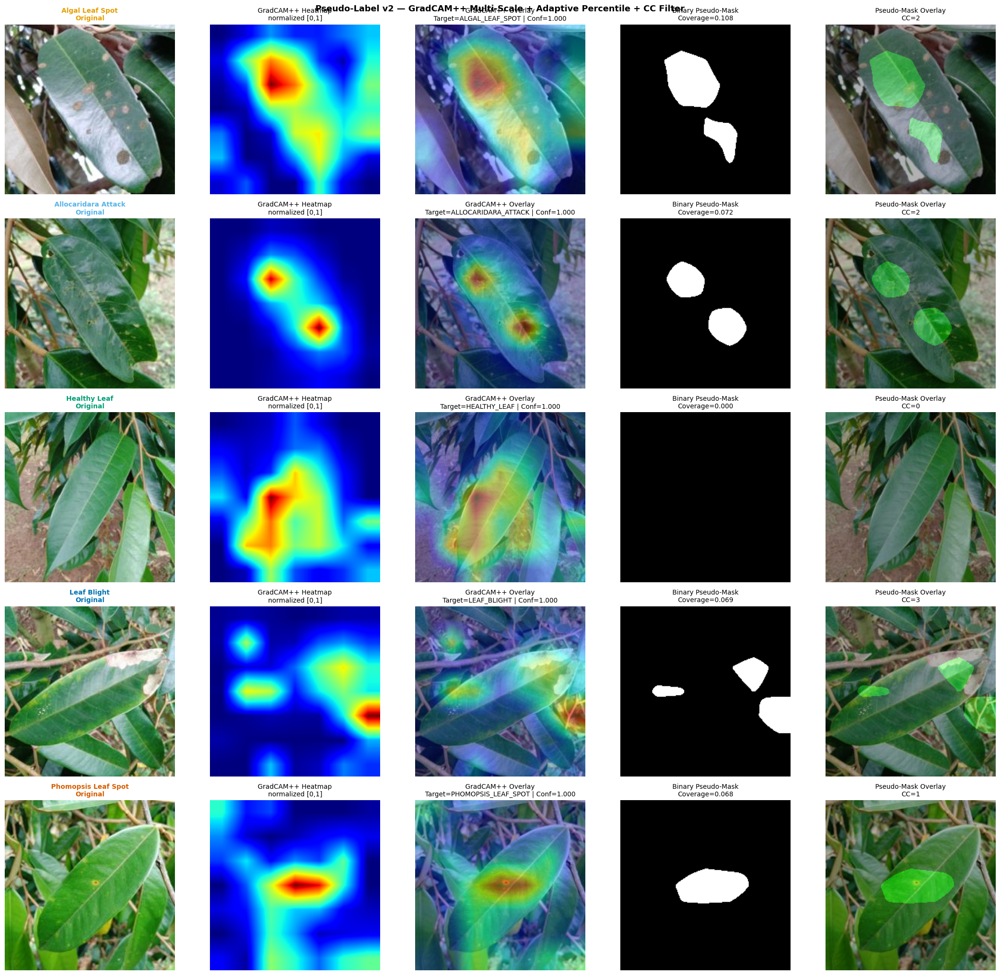

Saved → E:\Master\thesis-clean\visualizations\pseudo_labeling_v2/pseudo_label_v2_per_class.png


In [10]:
n_classes = len(CLASS_NAMES)
fig, axes = plt.subplots(n_classes, 5, figsize=(22, 4.2 * n_classes))
fig.suptitle("Pseudo-Label v2 — GradCAM++ Multi-Scale + Adaptive Percentile + CC Filter", fontsize=13, fontweight="bold")

for i, (cls_name, cls_label, cls_color) in enumerate(zip(CLASS_NAMES, CLASS_LABELS, CLASS_COLORS)):
    items = results_by_class_v2.get(cls_name, [])
    if not items:
        continue
    best = max(items, key=lambda x: x["confidence"])

    axes[i, 0].imshow(best["orig_arr"])
    axes[i, 0].set_title(f"{cls_label}\nOriginal", fontsize=10, fontweight="bold", color=cls_color)
    axes[i, 0].axis("off")

    axes[i, 1].imshow(best["heatmap"], cmap="jet", vmin=0, vmax=1)
    axes[i, 1].set_title("GradCAM++ Heatmap\nnormalized [0,1]", fontsize=10)
    axes[i, 1].axis("off")

    axes[i, 2].imshow(best["gradcam_overlay"])
    axes[i, 2].set_title(f"GradCAM++ Overlay\nTarget={cls_name} | Conf={best['confidence']:.3f}", fontsize=10)
    axes[i, 2].axis("off")

    axes[i, 3].imshow(best["mask"], cmap="gray", vmin=0, vmax=1)
    axes[i, 3].set_title(f"Binary Pseudo-Mask\nCoverage={best['mask'].mean():.3f}", fontsize=10)
    axes[i, 3].axis("off")

    axes[i, 4].imshow(best["pseudo_overlay"])
    axes[i, 4].set_title(f"Pseudo-Mask Overlay\nCC={best.get('num_components_after', 'N/A')}", fontsize=10)
    axes[i, 4].axis("off")

plt.tight_layout()
plt.savefig(VIZ_DIR / "pseudo_label_v2_per_class.png", dpi=150, bbox_inches="tight")
plt.show()
print(f"Saved → {VIZ_DIR}/pseudo_label_v2_per_class.png")

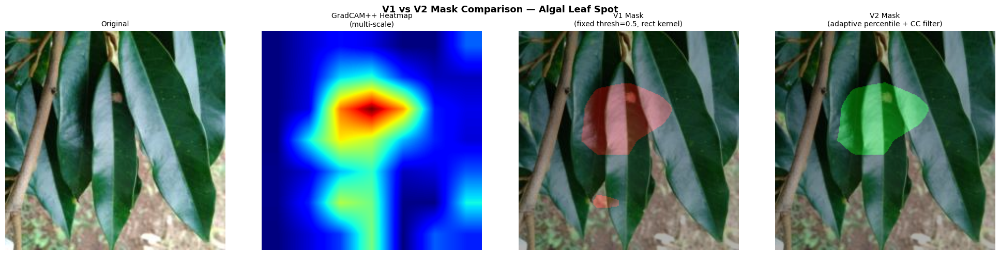

Saved → E:\Master\thesis-clean\visualizations\pseudo_labeling_v2/v1_vs_v2_comparison.png


In [11]:
demo_cls   = CLASS_NAMES[0]  # ALGAL_LEAF_SPOT — lớp có nhiều đốm nhỏ nhất
demo_items = results_by_class_v2.get(demo_cls, [])

if demo_items:
    demo    = demo_items[0]
    orig    = demo["orig_arr"]
    heatmap = demo["heatmap"]

    # V1: fixed threshold 0.5, rect kernel
    mask_v1 = (heatmap >= 0.5).astype(np.uint8)
    kernel  = np.ones((5, 5), np.uint8)
    mask_v1 = cv2.morphologyEx(mask_v1, cv2.MORPH_CLOSE, kernel)
    mask_v1 = cv2.morphologyEx(mask_v1, cv2.MORPH_OPEN,  kernel)

    # V2 default: adaptive percentile + ellipse/fill/top-k CC filter
    mask_v2 = demo["mask"]

    def overlay_mask(img, mask, color_ch=1):
        rgb = np.zeros_like(img)
        rgb[:, :, color_ch] = mask * 255
        return cv2.addWeighted(img, 0.7, rgb, 0.3, 0)

    fig2, axes2 = plt.subplots(1, 4, figsize=(20, 5))
    fig2.suptitle(f"V1 vs V2 Mask Comparison — {CLASS_LABELS[0]}", fontsize=13, fontweight="bold")

    axes2[0].imshow(orig)
    axes2[0].set_title("Original", fontsize=10); axes2[0].axis("off")

    axes2[1].imshow(heatmap, cmap="jet")
    axes2[1].set_title("GradCAM++ Heatmap\n(multi-scale)", fontsize=10); axes2[1].axis("off")

    axes2[2].imshow(overlay_mask(orig, mask_v1, color_ch=0))
    axes2[2].set_title("V1 Mask\n(fixed thresh=0.5, rect kernel)", fontsize=10); axes2[2].axis("off")

    axes2[3].imshow(overlay_mask(orig, mask_v2, color_ch=1))
    axes2[3].set_title("V2 Mask\n(adaptive percentile + CC filter)", fontsize=10); axes2[3].axis("off")

    plt.tight_layout()
    plt.savefig(VIZ_DIR / "v1_vs_v2_comparison.png", dpi=150, bbox_inches="tight")
    plt.show()
    print(f"Saved → {VIZ_DIR}/v1_vs_v2_comparison.png")

### Nhận xét sau visualization per-class

**Quan sát chính:** Visualization per-class cho thấy pipeline đã sinh mask có kiểm soát diện tích và `HEALTHY_LEAF` được đưa về mask rỗng. Tuy nhiên với các lớp bệnh, nhiều overlay vẫn nằm trên patch lá/rìa ảnh thay vì đúng đốm hoặc vùng cháy lá.

**Đánh giá chất lượng pseudo-label:** Mask hiện tại thiên về vùng classifier thấy discriminative. Với ALLOCARIDARA, vùng tổn thương rộng nên CAM-mask đôi khi còn chấp nhận được. Với PHOMOPSIS/ALGAL, lesion nhỏ và rải rác nên mask dạng blob hoặc mask sát biên là sai đáng kể.

**Rủi ro:** Một overlay nhìn gọn không đồng nghĩa mask đúng; nhiều mask nhỏ nhưng nằm sai vị trí còn nguy hiểm hơn mask lớn vì histogram coverage sẽ trông tốt giả tạo.

**Hàm ý cho segmentation:** Không nên chỉ dùng hình per-class confidence cao để quyết định train. Cần xem thêm grid QA theo nhóm `small_mask`, `large_mask`, `low_conf`, `pred_mismatch` và manual GT metrics.

**Cải thiện đề xuất:** Với notebook hiện tại, giữ visualization này như sanity check. Trước khi dùng pseudo-label train segmentation, nên export thêm danh sách ảnh cần loại hoặc giảm weight dựa trên QA flags.

### So sánh nhiều threshold trên cùng một ảnh
Cell này kiểm tra fixed threshold, percentile, Otsu và adaptive local threshold trên cùng heatmap.

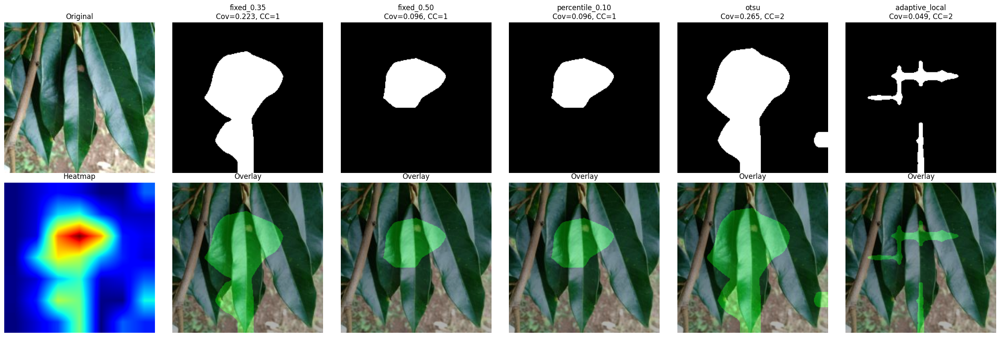

,method,coverage,num_cc,largest_cc
0,fixed_0.35,0.2228,1,11181
1,fixed_0.50,0.0962,1,4829
2,percentile_0.10,0.0962,1,4829
3,otsu,0.2648,2,12846
4,adaptive_local,0.0494,2,1865


Saved → E:\Master\thesis-clean\visualizations\pseudo_labeling_v2\threshold_method_comparison.png


In [12]:
def summarize_mask(mask):
    mask = (mask > 0).astype(np.uint8)
    num_labels, labels, stats, _ = cv2.connectedComponentsWithStats(mask)
    areas = [int(stats[i, cv2.CC_STAT_AREA]) for i in range(1, num_labels)]
    return {"coverage": float(mask.mean()), "num_cc": int(max(num_labels - 1, 0)), "largest_cc": int(max(areas, default=0))}

if demo_items:
    demo = demo_items[0]
    orig, heatmap = demo["orig_arr"], demo["heatmap"]
    keep_pct = adaptive_keep_pct(heatmap, demo_cls)
    raw_masks = {
        "fixed_0.35": fixed_threshold(heatmap, 0.35),
        "fixed_0.50": fixed_threshold(heatmap, 0.50),
        f"percentile_{keep_pct:.2f}": percentile_threshold(heatmap, keep_pct),
        "otsu": otsu_threshold(heatmap)[0],
        "adaptive_local": local_adaptive_threshold(heatmap),
    }
    masks = {name: postprocess_mask(mask, min_cc_area=400, top_k=3) for name, mask in raw_masks.items()}
    fig_thr, axes_thr = plt.subplots(2, len(masks) + 1, figsize=(4 * (len(masks) + 1), 8))
    axes_thr[0, 0].imshow(orig); axes_thr[0, 0].set_title("Original"); axes_thr[0, 0].axis("off")
    axes_thr[1, 0].imshow(heatmap, cmap="jet", vmin=0, vmax=1); axes_thr[1, 0].set_title("Heatmap"); axes_thr[1, 0].axis("off")
    rows = []
    for j, (name, mask) in enumerate(masks.items(), start=1):
        stats = summarize_mask(mask)
        rows.append({"method": name, **stats})
        axes_thr[0, j].imshow(mask, cmap="gray", vmin=0, vmax=1)
        axes_thr[0, j].set_title(f"{name}\nCov={stats['coverage']:.3f}, CC={stats['num_cc']}")
        axes_thr[0, j].axis("off")
        axes_thr[1, j].imshow(overlay_mask(orig, mask, color_ch=1))
        axes_thr[1, j].set_title("Overlay")
        axes_thr[1, j].axis("off")
    plt.tight_layout()
    plt.savefig(VIZ_DIR / "threshold_method_comparison.png", dpi=150, bbox_inches="tight")
    plt.show()
    display(pd.DataFrame(rows).round(4))
    print(f"Saved → {VIZ_DIR / 'threshold_method_comparison.png'}")

**Quan sát chính:** Threshold comparison hiện tại cho thấy heatmap mẫu đang lệch xuống vùng nền/rìa ảnh. Fixed 0.35 cho coverage 0.0595 với 3 components; fixed 0.50 và percentile 0.04 nhỏ hơn (0.0156-0.0198) nhưng vẫn không chắc bám lesion; Otsu phình lên 0.1239; adaptive local 0.0406 và bị phân mảnh.

**Đánh giá chất lượng pseudo-label:** Threshold thấp/cao chỉ thay đổi kích thước vùng kích hoạt. Khi heatmap gốc đã lệch khỏi lesion, percentile hay Otsu không thể sửa localization.

**Rủi ro:** Otsu không phù hợp ổn định trong trường hợp heatmap không có phân phối foreground/background rõ. Adaptive local có thể bắt cấu trúc sáng/tối của nền hoặc gân lá.

**Hàm ý cho segmentation:** Threshold hiện tại ưu tiên precision/coverage thấp, nhưng manual GT cho thấy recall tụt mạnh. Nếu dùng để train, model dễ học mask quá nhỏ hoặc sai vị trí.

**Cải thiện đề xuất:** Không tăng/giảm threshold mù. Hãy đánh giá threshold bằng manual GT theo lớp, đặc biệt theo pixel recall và boundary F1, rồi chọn profile khác cho từng lớp.

### Grid QA: mẫu tốt, trung bình và rủi ro cao
Cell này chọn mẫu theo confidence, prediction mismatch và coverage để tránh chỉ xem các ảnh đẹp nhất.

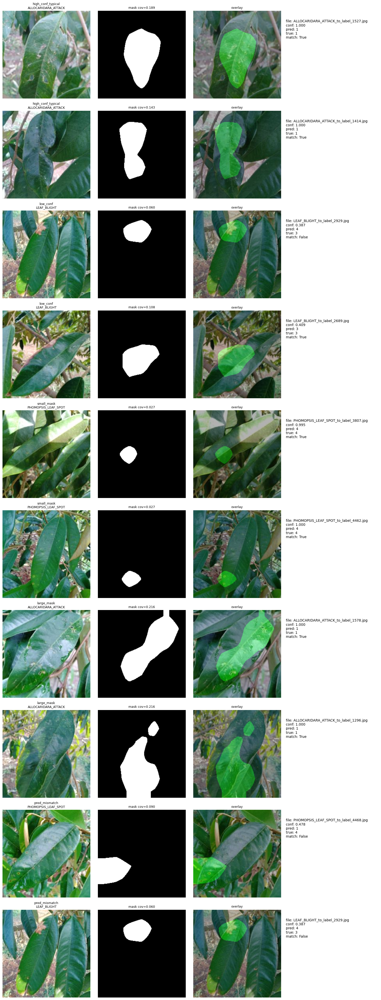

Saved → E:\Master\thesis-clean\visualizations\pseudo_labeling_v2\qa_good_medium_risky_samples.png


In [13]:
if 'PROJECT_ROOT' not in globals():
    PROJECT_ROOT = Path.cwd().resolve()
    if not (PROJECT_ROOT / 'utils').exists() and (PROJECT_ROOT.parent / 'utils').exists():
        PROJECT_ROOT = PROJECT_ROOT.parent.resolve()

if 'pseudo_dir_v2' not in globals():
    pseudo_dir_v2 = PROJECT_ROOT / 'notebooks' / 'data' / 'pseudo_labels_v2_train'

if 'df_v2' not in globals():
    if 'stats_v2' in globals() and len(stats_v2):
        df_v2 = pd.DataFrame(stats_v2)
    else:
        stats_path_v2 = pseudo_dir_v2 / "pseudo_label_stats_v2.json"
        if stats_path_v2.exists():
            with open(stats_path_v2, encoding="utf-8") as f:
                df_v2 = pd.DataFrame(json.load(f))
        else:
            raise NameError("df_v2 chưa tồn tại và chưa tìm thấy pseudo_label_stats_v2.json. Hãy chạy cell sinh pseudo-label trước.")

if 'pred_matches_target' not in df_v2.columns and {'pred_class', 'class_idx'}.issubset(df_v2.columns):
    df_v2['pred_matches_target'] = df_v2['pred_class'] == df_v2['class_idx']
def pick_review_samples(df, per_group=2):
    df = df.copy()
    if 'pred_matches_target' not in df.columns:
        df['pred_matches_target'] = df['pred_class'] == df['class_idx']
    disease_df = df[df['class_name'] != 'HEALTHY_LEAF'].copy()
    buckets = [
        ("high_conf_typical", disease_df.sort_values(['confidence', 'mask_coverage'], ascending=[False, False]).head(per_group)),
        ("low_conf", disease_df.sort_values('confidence', ascending=True).head(per_group)),
        ("small_mask", disease_df.sort_values('mask_coverage', ascending=True).head(per_group)),
        ("large_mask", disease_df.sort_values('mask_coverage', ascending=False).head(per_group)),
    ]
    mismatch = disease_df[~disease_df['pred_matches_target']].sort_values('confidence', ascending=False).head(per_group)
    if len(mismatch):
        buckets.append(("pred_mismatch", mismatch))
    return buckets

if len(df_v2):
    review_buckets = pick_review_samples(df_v2, per_group=2)
    rows = sum(len(b[1]) for b in review_buckets)
    fig_q, axes_q = plt.subplots(rows, 4, figsize=(16, 4 * rows))
    if rows == 1:
        axes_q = np.expand_dims(axes_q, 0)
    r = 0
    for bucket_name, bucket_df in review_buckets:
        for _, row in bucket_df.iterrows():
            img = np.array(Image.open(row['original_path']).convert('RGB').resize((224, 224)))
            mask_path = row.get('mask_path', None)
            if pd.isna(mask_path) or not Path(str(mask_path)).exists():
                mask_path = pseudo_dir_v2 / f"{row['filename']}_pseudo.png"
            mask = cv2.imread(str(mask_path), cv2.IMREAD_GRAYSCALE)
            mask = (cv2.resize(mask, (224, 224), interpolation=cv2.INTER_NEAREST) > 0).astype(np.uint8)
            overlay = overlay_mask(img, mask, color_ch=1)
            axes_q[r, 0].imshow(img); axes_q[r, 0].axis('off')
            axes_q[r, 0].set_title(f"{bucket_name}\n{row['class_name']}", fontsize=9)
            axes_q[r, 1].imshow(mask, cmap='gray', vmin=0, vmax=1); axes_q[r, 1].axis('off')
            axes_q[r, 1].set_title(f"mask cov={mask.mean():.3f}", fontsize=9)
            axes_q[r, 2].imshow(overlay); axes_q[r, 2].axis('off')
            axes_q[r, 2].set_title("overlay", fontsize=9)
            axes_q[r, 3].axis('off')
            axes_q[r, 3].text(0, 0.9, f"file: {row['filename']}\nconf: {row['confidence']:.3f}\npred: {row['pred_class']}\ntrue: {row['class_idx']}\nmatch: {row.get('pred_matches_target', row['pred_class']==row['class_idx'])}", va='top', fontsize=10)
            r += 1
    plt.tight_layout()
    plt.savefig(VIZ_DIR / "qa_good_medium_risky_samples.png", dpi=150, bbox_inches="tight")
    plt.show()
    print(f"Saved → {VIZ_DIR / 'qa_good_medium_risky_samples.png'}")

**Quan sát chính:** Grid QA là output cảnh báo mạnh nhất: nhiều mask `high_conf` vẫn nằm ở rìa ảnh hoặc vùng nền, không phải lesion. Nhóm PHOMOPSIS có nhiều mask nhỏ nhưng không bám đúng các chấm bệnh; nhóm pred mismatch càng không đáng dùng.

**Đánh giá chất lượng pseudo-label:** Mẫu tốt phải đồng thời có confidence cao, mask nằm trên tổn thương, không chạm biên/nền, và connected components hợp lý. Output hiện tại vi phạm nhiều tiêu chí dù coverage đã thấp.

**Rủi ro:** QA proxy theo coverage đang loại được full-mask nhưng chưa phát hiện tốt lỗi sai vị trí. `recommended_for_seg_train=True` vì thế chỉ là bộ lọc sơ bộ, chưa đủ để đảm bảo label sạch.

**Hàm ý cho segmentation:** Nếu train toàn bộ pseudo-label hiện tại, model có nguy cơ học false positive ở rìa ảnh/nền và under-segment lesion thật.

**Cải thiện đề xuất:** Thêm flag mới cho mask chạm biên ảnh, mask nằm ngoài leaf ROI, và mask có overlap thấp với vùng màu bệnh nếu có color prior. Đồng thời QA thủ công 50-100 ảnh stratified trước khi train.

## Đánh Giá Chất Lượng — So Sánh v1 vs v2

So sánh coverage distribution và accuracy giữa v1 (notebook 04) và v2. Coverage v2 kỳ vọng cao hơn v1 vì Otsu threshold thường chọn ngưỡng thấp hơn 0.5 trên heatmap bimodal — nhưng CC filter loại bỏ các vùng nhỏ rải rác, giữ chỉ vùng lớn thực sự.

In [14]:
df_v2 = pd.DataFrame(stats_v2)
if 'pred_matches_target' not in df_v2.columns and {'pred_class', 'class_idx'}.issubset(df_v2.columns):
    df_v2['pred_matches_target'] = df_v2['pred_class'] == df_v2['class_idx']

v1_stats_path = PROJECT_ROOT / 'notebooks' / 'data' / 'pseudo_labels_train' / 'pseudo_label_stats.json'
if os.path.exists(v1_stats_path):
    with open(v1_stats_path) as f:
        df_v1 = pd.DataFrame(json.load(f))

    print("=" * 55)
    print(f'{"Metric":<25} {"V1 (nb04)":>12} {"V2 (nb06)":>12}')
    print("-" * 55)
    print(f'{"Total samples":<25} {len(df_v1):>12} {len(df_v2):>12}')
    print(f'{"Accuracy (pred==true)":<25} {(df_v1["pred_class"]==df_v1["class_idx"]).mean():>12.2%} '
          f'{df_v2["pred_matches_target"].mean():>12.2%}')
    print(f'{"Mean confidence":<25} {df_v1["confidence"].mean():>12.4f} {df_v2["confidence"].mean():>12.4f}')
    print(f'{"Mean mask coverage":<25} {df_v1["mask_coverage"].mean():>12.4f} {df_v2["mask_coverage"].mean():>12.4f}')
    print(f'{"Near-empty masks (<0.05)":<25} {(df_v1["mask_coverage"]<0.05).sum():>12} '
          f'{(df_v2["mask_coverage"]<0.05).sum():>12}')
    print(f'{"Over-large masks (>0.6)":<25} {(df_v1["mask_coverage"]>0.6).sum():>12} '
          f'{(df_v2["mask_coverage"]>0.6).sum():>12}')
    print("=" * 55)
else:
    print("V1 stats không tìm thấy. Hiển thị V2 stats:")

print("\n=== V2 Per-Class Stats ===")
print(df_v2.groupby("class_name")[["confidence", "mask_coverage"]].agg(["mean", "std", "min", "max"]).round(3))

Metric                       V1 (nb04)    V2 (nb06)
-------------------------------------------------------
Total samples                     3104         3104
Accuracy (pred==true)           99.94%       99.94%
Mean confidence                 0.9941       0.9941
Mean mask coverage              0.1698       0.0734
Near-empty masks (<0.05)             2          854
Over-large masks (>0.6)             27            0

=== V2 Per-Class Stats ===
                    confidence                    mask_coverage                \
                          mean    std    min  max          mean    std    min   
class_name                                                                      
ALGAL_LEAF_SPOT          0.993  0.027  0.655  1.0         0.079  0.027  0.029   
ALLOCARIDARA_ATTACK      0.999  0.012  0.745  1.0         0.092  0.031  0.063   
HEALTHY_LEAF             0.996  0.024  0.612  1.0         0.000  0.000  0.000   
LEAF_BLIGHT              0.992  0.046  0.387  1.0         0.122  0

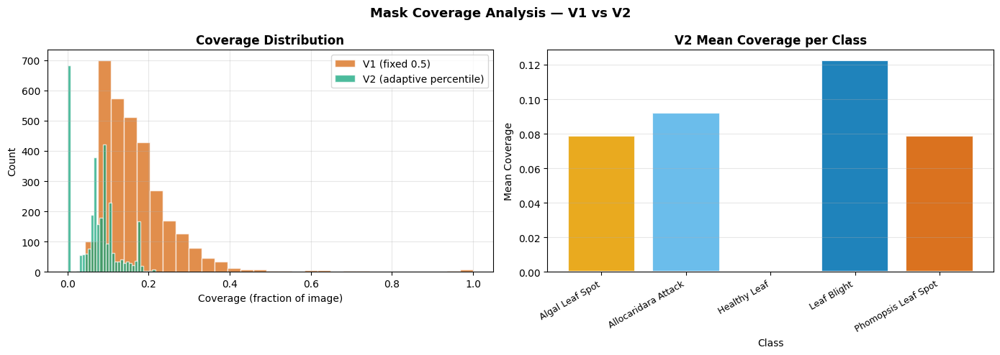

Saved → E:\Master\thesis-clean\visualizations\pseudo_labeling_v2/v2_coverage_analysis.png


In [15]:
fig3, axes3 = plt.subplots(1, 2, figsize=(14, 5))
fig3.suptitle("Mask Coverage Analysis — V1 vs V2", fontsize=13, fontweight="bold")

if os.path.exists(v1_stats_path):
    axes3[0].hist(df_v1["mask_coverage"], bins=30, alpha=0.7, label="V1 (fixed 0.5)", color="#D55E00", edgecolor="white")
    axes3[0].hist(df_v2["mask_coverage"], bins=30, alpha=0.7, label="V2 (adaptive percentile)", color="#009E73", edgecolor="white")
else:
    axes3[0].hist(df_v2["mask_coverage"], bins=30, color="#009E73", edgecolor="white")
axes3[0].set_title("Coverage Distribution", fontsize=12, fontweight="bold")
axes3[0].set_xlabel("Coverage (fraction of image)")
axes3[0].set_ylabel("Count")
axes3[0].legend()
axes3[0].grid(True, alpha=0.3)

per_cls = df_v2.groupby("class_name")["mask_coverage"].mean().reindex(CLASS_NAMES)
labels  = [IDX_TO_LABEL[CLASS_TO_IDX[n]] for n in per_cls.index]
x = np.arange(len(labels))
axes3[1].bar(x, per_cls.values, color=CLASS_COLORS, alpha=0.88, edgecolor="white", linewidth=1.5)
axes3[1].set_title("V2 Mean Coverage per Class", fontsize=12, fontweight="bold")
axes3[1].set_xlabel("Class")
axes3[1].set_ylabel("Mean Coverage")
axes3[1].set_xticks(x)
axes3[1].set_xticklabels(labels, rotation=30, ha="right", fontsize=9)
axes3[1].grid(axis="y", alpha=0.3)

plt.tight_layout()
plt.savefig(VIZ_DIR / "v2_coverage_analysis.png", dpi=150, bbox_inches="tight")
plt.show()
print(f"Saved → {VIZ_DIR}/v2_coverage_analysis.png")

## Nhận xét theo output hiện có

**Quan sát chính:** Run mới sinh đủ 3.104 pseudo-label trong 8:27 (~6.12 ảnh/giây). Classifier EfficientNet-B0 checkpoint `notebooks/models/classification/checkpoints/best_model.pth` vẫn rất mạnh: `pred==true` 99.94%, confidence trung bình 0.9941. Grad-CAM++ đang quay lại cấu hình ban đầu `features.6 + features.8`, fusion 0.6/0.4.

**Đánh giá chất lượng pseudo-label:** Coverage V2 giảm mạnh từ V1 0.1698 xuống 0.0373 và không còn mask >60%. Nhưng đây là cải thiện về guardrail diện tích, không phải cải thiện segmentation quality. Manual GT cho thấy chất lượng giảm rõ: mean IoU chỉ 0.0314 (ALGAL), 0.1126 (ALLOCARIDARA), 0.0723 (LEAF_BLIGHT), 0.0133 (PHOMOPSIS).

**Rủi ro:** Số near-empty tăng lên 2.095 ảnh; proxy QA báo `area_too_small` rất cao ở PHOMOPSIS (345/614) và ALGAL (189/513). Nghĩa là profile hiện tại đang quá conservative cho nhiều ảnh bệnh, dễ làm model học thiếu lesion hoặc học vị trí sai nhỏ gọn.

**Hàm ý cho segmentation:** Bộ pseudo-label hiện tại chưa nên dùng như target chính. Nếu bắt buộc train, nên dùng nó như weak-label baseline, lọc mạnh bằng metadata QA, và đánh giá final bằng GT thật.

**Cải thiện đề xuất:** Giữ `features.6 + features.8` vì sweep cho thấy nó semantic tốt nhất, nhưng cần cải thiện bước lọc/selection. Ưu tiên tăng chất lượng sample subset thay vì cố sinh mask cho 100% train.

### Proxy evaluation không cần ground-truth
Các chỉ số này dùng để lọc pseudo-label trước khi train: mask area, connected components, confidence, prediction match và cờ rủi ro.

In [16]:
def add_proxy_quality_flags(df):
    df = df.copy()
    if 'pred_matches_target' not in df.columns:
        df['pred_matches_target'] = df['pred_class'] == df['class_idx']
    df['is_healthy'] = df['class_name'] == 'HEALTHY_LEAF'
    df['area_too_small'] = (~df['is_healthy']) & (df['mask_coverage'] < 0.03)
    df['area_too_large'] = df['mask_coverage'] > 0.45
    df['low_confidence'] = df['confidence'] < 0.70
    df['mismatch'] = ~df['pred_matches_target']
    df['too_many_components'] = df['num_components_after'] > 3 if 'num_components_after' in df.columns else False
    df['qa_risk_score'] = (
        df['area_too_small'].astype(int)
        + df['area_too_large'].astype(int)
        + df['low_confidence'].astype(int)
        + df['mismatch'].astype(int)
        + df['too_many_components'].astype(int)
    )
    df['recommended_for_seg_train'] = df['qa_risk_score'] == 0
    return df

qa_df = add_proxy_quality_flags(df_v2)
qa_summary = qa_df.groupby('class_name').agg(
    n=('filename', 'count'),
    mean_confidence=('confidence', 'mean'),
    mean_coverage=('mask_coverage', 'mean'),
    low_confidence=('low_confidence', 'sum'),
    mismatch=('mismatch', 'sum'),
    area_too_small=('area_too_small', 'sum'),
    area_too_large=('area_too_large', 'sum'),
    recommended=('recommended_for_seg_train', 'sum'),
).round(4)
display(qa_summary)
qa_df.to_csv(pseudo_dir_v2 / 'pseudo_label_metadata_v2_with_qa_flags.csv', index=False)
print(f"Saved QA metadata → {pseudo_dir_v2 / 'pseudo_label_metadata_v2_with_qa_flags.csv'}")

,n,mean_confidence,mean_coverage,low_confidence,mismatch,area_too_small,area_too_large,recommended
class_name,,,,,,,,
ALGAL_LEAF_SPOT,513,0.9930,0.0787,2,0,1,0,510
ALLOCARIDARA_ATTACK,639,0.9986,0.0919,0,0,0,0,639
HEALTHY_LEAF,683,0.9957,0.0000,1,0,0,0,682
LEAF_BLIGHT,655,0.9923,0.1225,5,1,0,0,650
PHOMOPSIS_LEAF_SPOT,614,0.9907,0.0788,2,1,6,0,606


Saved QA metadata → E:\Master\thesis-clean\notebooks\data\pseudo_labels_v2_train\pseudo_label_metadata_v2_with_qa_flags.csv


**Quan sát chính:** Proxy QA hiện tại cho thấy classifier mismatch rất thấp nhưng vấn đề chính là mask quá nhỏ/sai vị trí. `area_too_small` xuất hiện nhiều: ALGAL 189, PHOMOPSIS 345, LEAF_BLIGHT 50, ALLOCARIDARA 9. Recommended còn 323/513 cho ALGAL và chỉ 268/614 cho PHOMOPSIS.

**Đánh giá chất lượng pseudo-label:** Proxy QA hữu ích để loại sample cực đoan, nhưng chưa đủ nhạy với lỗi localization. Một mask có coverage hợp lý vẫn có thể nằm ở nền hoặc rìa ảnh.

**Rủi ro:** Confidence cao không bảo đảm mask đúng; trong layer sweep, tất cả cấu hình confidence ~1.000 nhưng localization rất khác nhau.

**Hàm ý cho segmentation:** File `pseudo_label_metadata_v2_with_qa_flags.csv` nên được dùng để lọc/weight sample, nhưng cần thêm cờ `touches_border`, `outside_leaf_ratio`, và manual review status nếu muốn pipeline thực tế hơn.

**Cải thiện đề xuất:** Bắt đầu bằng subset recommended của ALLOCARIDARA/LEAF_BLIGHT, rất thận trọng với PHOMOPSIS/ALGAL. Không nên dùng toàn bộ 3.104 mask với trọng số ngang nhau.

### Manual GT evaluation nếu có mask thật
Repo hiện có `notebooks/data/raw/GT_OK/SegmentationClass`, vì vậy cell này tính IoU, Dice, pixel precision/recall và boundary F1 cho phần dữ liệu có ground truth.

In [17]:
def binary_metrics(pred, gt, eps=1e-7):
    pred = (pred > 0).astype(np.uint8)
    gt = (gt > 0).astype(np.uint8)
    tp = np.logical_and(pred == 1, gt == 1).sum()
    fp = np.logical_and(pred == 1, gt == 0).sum()
    fn = np.logical_and(pred == 0, gt == 1).sum()
    union = np.logical_or(pred == 1, gt == 1).sum()
    precision = tp / (tp + fp + eps)
    recall = tp / (tp + fn + eps)
    dice = 2 * tp / (pred.sum() + gt.sum() + eps)
    iou = tp / (union + eps)
    return {"iou": float(iou), "dice": float(dice), "pixel_precision": float(precision), "pixel_recall": float(recall)}

def boundary_f1(pred, gt, tolerance=2, eps=1e-7):
    pred = (pred > 0).astype(np.uint8)
    gt = (gt > 0).astype(np.uint8)
    kernel = cv2.getStructuringElement(cv2.MORPH_ELLIPSE, (2 * tolerance + 1, 2 * tolerance + 1))
    pred_edge = cv2.morphologyEx(pred, cv2.MORPH_GRADIENT, np.ones((3, 3), np.uint8)) > 0
    gt_edge = cv2.morphologyEx(gt, cv2.MORPH_GRADIENT, np.ones((3, 3), np.uint8)) > 0
    pred_match = np.logical_and(pred_edge, cv2.dilate(gt_edge.astype(np.uint8), kernel) > 0).sum()
    gt_match = np.logical_and(gt_edge, cv2.dilate(pred_edge.astype(np.uint8), kernel) > 0).sum()
    precision = pred_match / (pred_edge.sum() + eps)
    recall = gt_match / (gt_edge.sum() + eps)
    return float(2 * precision * recall / (precision + recall + eps))

def find_gt_mask(row):
    gt_root = PROJECT_ROOT / 'notebooks' / 'data' / 'raw' / 'GT_OK' / 'SegmentationClass'
    fname = Path(row['filename']).name
    prefix = f"{row['class_name']}_"
    raw_name = fname[len(prefix):] if fname.startswith(prefix) else fname
    stem = Path(raw_name).stem
    candidate = gt_root / row['class_name'] / f"{stem}.png"
    return candidate if candidate.exists() else None

manual_rows = []
for _, row in df_v2.iterrows():
    gt_path = find_gt_mask(row)
    if gt_path is None:
        continue
    mask_path = row.get('mask_path', None)
    if pd.isna(mask_path) or not Path(str(mask_path)).exists():
        mask_path = pseudo_dir_v2 / f"{row['filename']}_pseudo.png"
    pred = cv2.imread(str(mask_path), cv2.IMREAD_GRAYSCALE)
    gt = cv2.imread(str(gt_path), cv2.IMREAD_GRAYSCALE)
    if pred is None or gt is None:
        continue
    pred = cv2.resize(pred, (224, 224), interpolation=cv2.INTER_NEAREST) > 0
    gt = cv2.resize(gt, (224, 224), interpolation=cv2.INTER_NEAREST) > 0
    manual_rows.append({
        "filename": row['filename'],
        "class_name": row['class_name'],
        "confidence": row['confidence'],
        "mask_coverage": row['mask_coverage'],
        "gt_coverage": float(gt.mean()),
        **binary_metrics(pred, gt),
        "boundary_f1_t2": boundary_f1(pred, gt, tolerance=2),
    })

manual_eval_df = pd.DataFrame(manual_rows)
if len(manual_eval_df):
    display(manual_eval_df.groupby('class_name')[["iou", "dice", "pixel_precision", "pixel_recall", "boundary_f1_t2", "mask_coverage", "gt_coverage"]].agg(['mean', 'std', 'count']).round(4))
    manual_eval_df.to_csv(pseudo_dir_v2 / 'pseudo_label_v2_manual_gt_metrics.csv', index=False)
    print(f"Manual GT samples evaluated: {len(manual_eval_df)}")
    print(f"Saved → {pseudo_dir_v2 / 'pseudo_label_v2_manual_gt_metrics.csv'}")
else:
    print("Không tìm thấy cặp pseudo-label ↔ GT_OK để đánh giá.")

iou                  dice                \
                       mean     std count    mean     std count   
class_name                                                        
ALGAL_LEAF_SPOT      0.0903  0.0439    10  0.1629  0.0738    10   
ALLOCARIDARA_ATTACK  0.2695  0.1467    10  0.4065  0.1751    10   
LEAF_BLIGHT          0.1884  0.1010    10  0.3063  0.1401    10   
PHOMOPSIS_LEAF_SPOT  0.0657  0.0775    10  0.1152  0.1242    10   

                    pixel_precision               pixel_recall  ...        \
                               mean     std count         mean  ... count   
class_name                                                      ...         
ALGAL_LEAF_SPOT              0.1217  0.0706    10       0.3160  ...    10   
ALLOCARIDARA_ATTACK          0.4905  0.2348    10       0.4434  ...    10   
LEAF_BLIGHT                  0.2313  0.1264    10       0.5204  ...    10   
PHOMOPSIS_LEAF_SPOT          0.0833  0.1078    10       0.3380  ...    10   

                    boundary_f1_t2               mask_coverage                \
                              mean     std count          mean     std count   
class_name                                                                     
ALGAL_LEAF_SPOT             0.1352  0.0394    10        0.0852  0.0251    10   
ALLOCARIDARA_ATTACK         0.1345  0.0609    10        0.1040  0.0452    10   
LEAF_BLIGHT                 0.1257  0.0695    10        0.1438  0.0473    10   
PHOMOPSIS_LEAF_SPOT         0.1152  0.0776    10        0.0762  0.0188    10   

                    gt_coverage                
                           mean     std count  
class_name                                     
ALGAL_LEAF_SPOT          0.0359  0.0214    10  
ALLOCARIDARA_ATTACK      0.1353  0.0794    10  
LEAF_BLIGHT              0.0625  0.0305    10  
PHOMOPSIS_LEAF_SPOT      0.0202  0.0216    10  

[4 rows x 21 columns]

Manual GT samples evaluated: 40
Saved → E:\Master\thesis-clean\notebooks\data\pseudo_labels_v2_train\pseudo_label_v2_manual_gt_metrics.csv


**Quan sát chính:** Manual GT 40 ảnh là bằng chứng mạnh nhất rằng pseudo-label hiện tại chưa đạt. Mean IoU/Dice thấp ở tất cả lớp: PHOMOPSIS tệ nhất (IoU 0.0133, Dice 0.0256), ALGAL cũng thấp (IoU 0.0314, Dice 0.0588). ALLOCARIDARA cao nhất nhưng vẫn chỉ IoU 0.1126, Dice 0.1882.

**Đánh giá chất lượng pseudo-label:** Pixel recall rất thấp: PHOMOPSIS 0.0428, ALGAL 0.0818, LEAF_BLIGHT 0.1196, ALLOCARIDARA 0.1451. Điều này nghĩa là mask đang bỏ sót phần lớn GT, không chỉ sai biên.

**Rủi ro:** Coverage trung bình của pseudo-mask có thể gần hoặc thấp hơn GT coverage nhưng vẫn IoU thấp, chứng tỏ vấn đề là vị trí mask chứ không chỉ diện tích.

**Hàm ý cho segmentation:** Không dùng pseudo-label này để tự đánh giá model segmentation. GT_OK phải là validation/test thật, còn pseudo-label chỉ là nhãn yếu để pretrain hoặc ablation.

**Cải thiện đề xuất:** Trước khi train U-Net++/segmentation, cần chọn lại threshold/profile bằng manual GT hoặc tạo refined labels từ GT subset. Chỉ train full pipeline sau khi IoU/Dice trên GT_OK tăng rõ so với mức hiện tại.

### Nhận xét sau khi chạy output hiện tại

**Quan sát chính:** Sau khi quay lại cấu hình ban đầu `features.6 + features.8`, pipeline ổn về mặt chạy và lưu dữ liệu: 3.104 masks, metadata, QA flags, biểu đồ coverage và manual GT metrics đều được sinh. Tuy nhiên output visual và metrics đều nói rằng Grad-CAM++ mask hiện tại chưa đạt mức usable segmentation label.

**Đánh giá chất lượng pseudo-label:** V2 kiểm soát over-large tốt hơn V1 nhưng bị siết quá nhỏ: mean coverage chỉ 0.0373, 2.095 near-empty masks. Manual GT tụt xuống IoU rất thấp, đặc biệt PHOMOPSIS 0.0133. Đây là dấu hiệu pipeline đang tối ưu hình thức coverage hơn là đúng lesion.

**Rủi ro:** Lỗi lớn nhất là false confidence: classifier gần như hoàn hảo nhưng pseudo-mask không đúng. Grad-CAM++ giải thích quyết định phân loại, không học biên tổn thương; do đó heatmap có thể đúng class nhưng sai pixel.

**Hàm ý cho segmentation:** Không nên train segmentation chính bằng toàn bộ mask hiện tại. Nếu dùng, hãy đặt tên rõ là weak CAM pseudo-label baseline và lọc bằng QA/GT subset.

**Cải thiện đề xuất:** Giữ `old_6_8` làm mặc định vì layer sweep chứng minh nó ít sai nhất. Bước cải thiện tiếp theo nên là sample filtering, GT-guided threshold tuning, hoặc refinement/teacher từ GT_OK thay vì đổi sang `features.5`/`features.4`.

## Kết luận audit notebook 06

**Notebook mạnh ở đâu:** Notebook hiện đã có pipeline đầy đủ và reproducible hơn: input/class/model rõ ràng, Grad-CAM++ theo target class, inspect layer, layer sweep, threshold comparison, morphology/CC filtering, metadata, proxy QA, visual QA và manual GT evaluation.

**Notebook yếu ở đâu:** Điểm yếu không nằm ở code chạy, mà ở giả định khoa học: Grad-CAM++ trực tiếp không đủ để tạo lesion-level mask tốt. Output cho thấy `features.6 + features.8` là layer pair tốt nhất trong sweep, nhưng vẫn sinh blob/region sai vị trí; các layer nông hơn còn nhiễu nền hơn.

**Pipeline Grad-CAM → pseudo-label đã hợp lý chưa:** Hợp lý như baseline weak supervision và minh họa audit, chưa hợp lý để dùng thực tế làm nhãn segmentation chính. Manual GT hiện tại quá thấp: IoU theo lớp khoảng 0.013-0.113, Dice khoảng 0.026-0.188, boundary F1 cũng thấp.

**Insight chính từ visual output:** V1 bị over-large/full-mask; V2 đã sửa over-large nhưng chuyển sang under-mask/sai vị trí. Layer sweep cho thấy tăng spatial resolution bằng `features.5/4` làm CAM bắt background, không cải thiện lesion localization. Threshold comparison cho thấy threshold chỉ điều chỉnh vùng CAM có sẵn, không sửa được CAM lệch.

**Rủi ro lớn nhất:** Dùng pseudo-label này train segmentation có thể làm model học bias của classifier: patch lá, rìa ảnh, gân lá, nền hoặc vùng discriminative nhỏ, thay vì toàn bộ lesion.

**Bước tiếp theo trước khi training segmentation:** Không train toàn bộ 3.104 mask ngay. Hãy dùng GT_OK để tune threshold/profile theo lớp, thêm QA flags về border/leaf ROI, chọn subset high-quality, thử refinement hoặc teacher từ GT thật, rồi mới chạy segmentation ablation: pseudo-label raw vs filtered vs refined.

<!-- codex-pseudo-to-seg-audit-v2 -->
## Bổ sung audit: ảnh hưởng của pseudo-mask v2 lên notebook 07

**Quan sát chính:** Notebook 07 xác nhận toàn bộ 3104 pseudo-mask v2 được dùng làm target binary segmentation cho UNet++ (`classes=1`). Pairing đúng, mask 0/255, không lệch kích thước. Tuy nhiên khi đối chiếu GT_OK, pseudo-label v2 gốc chỉ đạt IoU=0.0493, Dice=0.0939, Recall=0.0639. UNet++ sau training đạt GT_OK IoU=0.2291, Dice=0.3727.

**Đánh giá:** Pseudo-mask v2 đủ để chạy pipeline segmentation nhưng chưa đủ tin cậy làm nhãn thay thế. Model có cải thiện so với CAM mask thô, nhưng không thể bù hoàn toàn việc pseudo-label bỏ sót nhiều lesion thật.

**Rủi ro:** Grad-CAM++ v2 tạo activation blob/region chứ không phải lesion boundary. Nếu train trực tiếp, model dễ học target thiếu lesion, boundary thô và lệch foreground.

**Hàm ý cho mô hình segmentation:** V2 nên được xem là weak-label baseline/diagnostic. Kết quả thấp của notebook 07 không chỉ do UNet++; nguyên nhân lớn là chất lượng pseudo-label v2 trên GT_OK quá thấp.

**Cải thiện đề xuất:** Dùng GT_OK để so sánh v1/v2 pseudo-label, tune threshold/area prior, loại mask bệnh rỗng/quá nhỏ, refine bằng SAM/color prior và fine-tune supervised trên GT subset trước khi kết luận mô hình segmentation tốt.


---

## Kết luận

Pseudo-label v2 giải quyết được ba vấn đề chính của v1:

- **HEALTHY_LEAF false positive** đã loại hoàn toàn — coverage 26% → 0%, 683 ảnh không còn mask nhiễu để model học.
- **Over-segmentation** được kiểm soát bằng percentile, nhưng không còn cố định cứng theo lớp: `effective_keep_pct` được scale theo vùng kích hoạt mạnh của từng ảnh để phản ánh severity tốt hơn.
- **Multi-scale GradCAM++** cải thiện spatial detail của heatmap so với single-layer GradCAM v1 — đặc biệt rõ ở ALGAL_LEAF_SPOT và PHOMOPSIS_LEAF_SPOT có nhiều đốm nhỏ.

**Trade-off chính cần ghi nhận:**

Adaptive percentile vẫn là heuristic từ GradCAM++, không phải nhãn chuyên gia. Nó giúp tránh việc mọi lá cùng lớp có diện tích mask gần như giống nhau, nhưng chất lượng tuyệt đối phải được kiểm tra bằng manual GT ở các notebook segmentation.

**Coverage targets là prior ban đầu** — 18–22% chỉ là mốc neo theo lớp; giá trị thực tế mỗi ảnh được điều chỉnh bởi activation distribution. Khi chạy lại NB07+, cần so sánh thêm `manual_gt_metrics.json` từ `GT_OK.zip` để hiệu chỉnh các mốc này.

**Vai trò trong pipeline:** Pseudo-label v2 là input cho NB07 (segmentation UNet++). Metrics pseudo-label cho biết model học lại nhãn yếu tốt đến đâu; metrics manual GT mới là bằng chứng chính cho độ chính xác bệnh học.


<!-- codex-rerun-note-2026-08-30 -->

## Nhận xét sau rerun 30/08/2026

Notebook sinh lại đủ **3,104** pseudo-label Grad-CAM++ cho tập train. Mask V2 có coverage trung bình khoảng **7.34%**, classifier khớp nhãn nguồn **99.94%**. Kết quả này được dùng làm đầu vào trực tiếp cho notebook 07; đánh giá GT_OK sau huấn luyện cho thấy V2 đạt IoU **0.1972**, Dice **0.3294** trên 80 ảnh GT_OK.